In [1]:
from coffea import hist
import math

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import mplhep as hep
import numpy as np
plt.style.use(hep.style.CMS)

import awkward as ak

from matplotlib import colors
POPTS={'norm':colors.LogNorm()}

In [2]:
from data import getData, repackage
ldmx_dict = getData(chunks=True, fnames="/Users/chloeg/Desktop/Work/Fermilab2021/HistData/kaon_pn_4GeV_Jul14_ntuple/*.root")

In [3]:
def extend_array(arr, new_attr, new_attr_name):
    members={n:arr[n] for n in arr.fields}
    members[new_attr_name] = new_attr
    return ak.zip(members)

def add_angle(arr,br=['px','py','pz','e'],name="theta"):
    from coffea.nanoevents.methods import vector
    ak.behavior.update(vector.behavior)

    part =  ak.zip({"x": arr.px,
                    "y": arr.py,
                    "z": arr.pz,
                    "t": arr.e,
                    },
                    with_name="LorentzVector")
    arr = extend_array(arr, part.theta, name)
    return arr

def get_vector(arr):
    from coffea.nanoevents.methods import vector
    ak.behavior.update(vector.behavior)

    part =  ak.zip({"x": arr.px,
                    "y": arr.py,
                    "z": arr.pz,
                    "t": arr.e,
                    },
                    with_name="LorentzVector")
    return part

def flat(x,axis=None): # for now must cast while waiting for coffea to catch up
    try:
        return ak.to_numpy(ak.flatten(x,axis=axis)) 
    except:
        return x

In [4]:
hists = {}

hists["hist_particle_pdgID"] = hist.Hist("Sim Particle",
                                hist.Cat("Ptype", "Type of Particle"),
                                hist.Bin("e", r"PDG ID", 40, -400, 4000)
                            )
hists["hist_particle_ke"] = hist.Hist("Sim Particle",
                                hist.Cat("Ptype", "Type of Particle"),
                                hist.Bin("e", r"Kinetic Energy [MeV]", 50, 10, 600)
                            )

In [5]:
def ProcessChunk(chunk, hists):
    ldmx_events = repackage(chunk)
    
    sim_particle = ldmx_events['Sim_PNParticle']
    sim_particle_n = ldmx_events['n']['Sim_PNParticle']
    
    
    masks_id = {'Kaon1': 321,
                'Kaon2': 310,
                'Kaon3': 130, 
                'Kaon4':-321,
                'Electron': 11,
                'Positron': -11,
                'Pion': 211,
                'Pi-': -211,
                'Proton':2212,
                'Neutron':2112,
                'Sigma': 3112 or 3212,
                'Lambda': 3122,
               }
    masses =   {'Kaon1': 493.677,
                'Kaon2': 493.677,
                'Kaon3': 493.677,
                'Kaon4': 493.677,
                'Electron': 0.511,
                'Positron': 0.511,
                'Pion': 139.57039,
                'Pi-': 139.57039,
                'Proton': 939.565,
                'Neutron': 939.565,
                'Sigma': 1189.36,
                'Lambda': 1115.6,
                }
  #  for element in sim_particle.e:
  #      for part in element:
  #          if 
    
    particle_vector = get_vector(sim_particle)
    
    for part,pmask in masks_id.items():
        part_mask = (sim_particle.pdgID == pmask)
        hists["hist_particle_pdgID"].fill(Ptype= part,
                                     e=flat(sim_particle.pdgID[part_mask]),
                                     )  
        hists["hist_particle_ke"].fill(Ptype= part,
                                     e=flat(particle_vector.t[part_mask]) - masses[part],
                                     )
    all_particle = 0
    electron_count = 0
    sigma_count = 0
    kaon_count = 0
    pion_count = 0
    proton_count = 0
    neutron_count = 0
    lambda_count = 0

    for element in (sim_particle.pdgID):
        for part in element:
            all_particle = all_particle + 1
            if part == 11 & -11:
                electron_count = electron_count + 1
            if part == 3112 & 3212:
                sigma_count = sigma_count + 1
            if part == 321 & 310 & 130 & -321:
                kaon_count = kaon_count + 1
            if part == 211 & -211:
                pion_count = pion_count + 1
            if part == 2212:
                proton_count = proton_count + 1
            if part == 2112:
                neutron_count = neutron_count + 1
            if part == 3122:
                lambda_count = lambda_count + 1
            else:
                print(part)
                
                
    return all_particle, electron_count, sigma_count, kaon_count, pion_count, proton_count, neutron_count, lambda_count


In [6]:
nchunk = 0
total_particle = 0
total_electron = 0
total_sigma    = 0
total_kaon     = 0
total_pion     = 0
total_proton   = 0
total_neutron  = 0
total_lambda   = 0

for chunk in ldmx_dict:
    nchunk += 1
    print('process',nchunk)
    returna = ProcessChunk(chunk, hists)
    total_particle = total_particle + returna[0]
    total_electron = total_electron + returna[1]
    total_sigma = total_sigma + returna[2]
    total_kaon = total_kaon + returna[3]
    total_pion = total_pion + returna[4]
    total_proton = total_proton + returna[5]
    total_neutron = total_neutron + returna[6]
    total_lambda = total_lambda + returna[7]
    
print('All Particles', total_particle, 
'Electron', total_electron, 
'Sigma', total_sigma,
'Kaon', total_kaon,
'Pion', total_pion,
'Proton', total_proton,
'Neutron', total_neutron,
'Lambda', total_lambda)
    

process 1
11
111
310
211
2212
-321
-211
2112
2212
-211
3112
211
310
2112
2212
130
111
2112
2212
-211
211
130
2112
130
2212
111
211
2112
310
3222
111
2212
2112
111
211
310
2212
2112
2212
111
310
2112
310
2212
2112
11
11
2212
-211
111
130
2112
2212
130
111
-211
2112
111
130
2212
2112
130
211
2112
2212
111
321
2112
2212
130
-211
2112
2212
111
130
2112
-211
111
310
2212
2112
211
310
-211
2112
310
2112
-211
211
2212
310
2112
310
2212
2112
11
2212
111
130
2112
-321
321
2112
2212
130
310
2112
321
2212
-321
2112
-211
2212
211
310
3212
2112
2212
321
3222
111
2112
2212
3222
310
130
2212
310
2112
2212
130
111
-211
211
2112
-211
2212
211
321
2112
2212
-211
310
2112
2212
3222
130
2112
2212
-211
310
2112
211
3112
2212
321
2112
2212
3222
130
111
2112
2212
111
321
-211
2112
2212
111
130
-321
2112
2212
321
310
2112
3112
2212
211
310
2112
310
2112
-11
11
3112
321
2112
11
-11
11
2212
-211
321
2112
130
-321
2212
2112
2212
-211
321
130
111
2112
2212
310
211
3112
2112
321
2112
2212
3212
321
2112
2212
-211
1

process 2
2212
3112
321
2112
2212
130
111
2112
2212
130
2112
2212
3212
321
2112
2212
130
2112
2212
321
-321
2112
11
2212
-211
310
2112
2212
321
310
2112
2212
310
211
130
2112
2212
321
-321
2112
2212
3112
310
-211
2112
130
2212
310
2112
3212
111
321
2112
2212
130
310
2112
2212
-211
310
2112
2212
211
3212
-211
321
2112
130
321
2112
2212
310
-211
111
2112
2212
3212
211
130
2112
2212
111
321
2112
2212
-321
321
2112
2212
321
2112
2212
321
-321
2112
11
130
310
2112
2212
310
2112
2212
321
-321
2112
-11
11
-11
11
-321
321
2112
111
3112
2212
130
211
2112
2212
111
321
2112
130
211
3212
2112
2212
111
321
2112
2212
-211
321
211
2112
321
-321
2112
2212
-211
111
310
2112
2212
111
130
2112
2212
-211
130
2112
2212
211
321
111
2112
-211
321
2112
3212
2212
-211
321
2112
2212
-211
3112
310
211
2112
2212
111
130
2112
310
2212
2112
111
2212
130
2112
321
2112
-211
3222
310
2112
2212
321
-211
2112
130
111
211
2112
2212
-211
111
321
2112
2212
321
-321
2112
130
2212
111
211
2112
2212
111
310
211
2112
-211
2212

process 3
2212
321
2112
-211
130
2112
2212
130
2112
2212
321
2112
2212
111
310
211
2112
2212
310
3212
111
-211
2112
130
111
3222
2112
-321
321
2112
2212
3212
321
2112
2212
3222
310
211
111
-211
2112
2212
321
-211
-321
2112
-321
321
2112
2212
-321
310
11
130
2112
-211
2212
3112
310
2112
321
130
2112
111
130
2212
-321
2112
321
310
2112
-11
11
2212
-211
321
211
2112
2212
130
111
-211
3222
2112
2212
111
211
310
2112
2212
310
111
2112
2212
130
-211
2112
11
321
-321
2212
111
2112
130
2212
211
3112
111
2112
130
2212
111
2112
310
2112
-321
321
2212
2112
310
2212
3112
-211
211
2112
2212
310
130
211
2112
-321
321
2112
310
2212
-321
2112
2212
111
-321
-211
321
2112
2212
211
3212
111
130
2112
2212
310
2112
2212
111
3212
321
2112
211
310
-211
2112
321
310
2112
321
2112
130
-211
2212
111
2112
321
-321
2112
321
-321
2112
11
-211
321
2112
11
2212
3212
130
111
2112
130
2112
2212
310
211
2112
3222
130
-211
111
2112
2212
-211
310
111
2112
2212
130
-211
2112
321
2212
111
-211
211
2112
211
2212
111
310
-32

process 4
2212
3112
211
310
-211
2112
2212
211
3222
321
111
-211
2112
111
2212
130
2112
310
2212
2212
310
3112
111
2112
321
-321
2212
2112
2212
321
-211
111
2112
11
-11
11
2212
-211
130
2112
2212
-211
321
2112
321
2212
-321
2112
111
2212
3112
321
-211
2112
3112
321
2112
11
2212
-211
321
2112
111
2212
321
2112
2212
3112
310
2112
2212
-321
130
310
321
2112
-211
2212
130
310
2112
2212
130
-211
2112
-211
211
2212
321
2112
2212
310
-321
111
2112
130
310
2112
111
211
2212
321
3112
2112
3222
321
2212
-211
2112
-211
130
2212
3222
2112
-11
11
2212
-211
321
2112
130
310
2112
2212
3222
321
111
2112
310
2212
111
-211
3112
2112
-211
2212
130
321
2112
2212
130
211
2112
11
111
130
2212
2112
130
310
2112
3112
211
321
2112
130
2112
-11
11
11
2212
310
2112
2212
-321
211
130
2112
2212
-211
111
321
2112
130
310
2112
2212
-211
310
2112
130
-321
2212
2112
2212
321
211
111
2112
321
2212
211
2112
-211
2212
321
3212
2112
3212
310
2112
321
111
2212
2112
11
2212
111
310
-211
3222
2112
321
2112
2212
310
130
2112


process 5
310
2112
321
130
2112
3212
130
2112
2212
-211
211
130
2112
11
-211
321
2112
321
2212
-321
2112
2212
321
211
2112
11
2212
321
111
2112
2212
111
-211
130
2112
11
2212
321
2112
130
310
2112
2212
310
111
2112
2212
211
3212
-211
321
2112
2212
321
211
-211
3112
2112
130
2212
2112
310
2212
-211
2112
2212
310
-321
2112
321
2212
111
-211
2112
2212
3212
321
211
-211
2112
-11
11
-11
11
111
211
310
2112
111
321
2212
310
2112
-321
321
2112
11
321
2112
130
2112
2212
-321
130
2112
-211
211
321
2112
2212
-211
211
130
2112
2212
211
310
2112
11
2212
3222
310
2112
2212
310
2112
321
111
211
2112
11
2212
321
-321
2112
2212
321
-321
2112
310
2212
-211
2112
2212
321
-211
2112
111
130
2112
2212
130
-211
211
111
2112
321
2212
-211
111
2112
2212
321
-321
2112
-211
2212
321
-321
2112
-321
321
2212
2112
2212
-211
130
2112
-321
2212
130
2112
310
2212
2112
130
2212
-321
2112
2212
3112
321
2112
2212
3222
-211
321
2112
310
2212
2112
130
310
2112
2212
-321
321
2112
321
-321
2212
2112
-321
321
2112
310
2112
1

process 6
2212
111
-211
130
211
2112
2212
-211
111
321
211
2112
11
130
310
2212
2112
321
-321
2212
2112
2212
321
2112
2212
321
211
2112
2212
-211
321
2112
-11
11
310
321
2112
130
2212
111
3212
211
2112
2212
-211
321
2112
-211
2212
321
310
2112
2212
130
-321
111
2112
310
2112
310
2112
2212
-211
321
2112
-211
310
2112
2212
211
-211
321
2112
321
-321
2112
321
2212
-321
2112
2212
321
2112
310
3212
2212
111
2112
2212
111
3112
130
2112
2212
130
211
2112
211
2212
310
2112
-321
321
2112
11
3212
2212
111
310
2112
2212
321
3112
211
2112
111
130
2212
2112
2212
-211
3212
321
2112
2212
321
111
2112
11
11
3112
211
130
2112
2212
-211
211
111
130
2112
310
321
2212
-211
2112
2212
321
111
2112
11
321
-321
2112
211
2212
111
130
-211
2112
2212
-211
321
3112
2112
2212
321
-211
2112
2212
3112
211
-211
321
111
2112
2212
-211
130
2112
130
-321
2212
2112
2212
321
-321
2112
130
211
3112
2112
310
2212
321
2112
11
2212
130
321
111
2112
11
2212
310
3222
-211
2112
3222
321
-211
2212
2112
-321
321
2112
130
2212
2112

process 7
2212
111
3112
321
2112
2212
321
3222
-211
111
2112
-321
2212
321
2112
111
2212
-211
321
2112
2212
111
-211
310
2112
11
111
2212
211
321
2112
2212
211
321
111
3212
2112
111
3212
130
2212
2112
2212
3112
310
211
-211
2112
111
2212
-211
310
2112
321
-211
111
2212
2112
211
310
2212
2112
-211
321
2112
310
211
111
2212
2112
310
-321
2212
2212
-321
130
2112
321
2212
-211
111
2112
310
2212
211
111
2112
2212
-211
321
2112
2212
310
111
211
2112
310
2212
211
-211
111
2112
130
310
2212
111
2112
11
111
321
2212
-211
2112
321
-211
111
2212
2112
111
2212
321
-211
2112
130
2112
321
2212
111
-211
2112
111
130
2212
2112
2212
310
111
2112
2212
321
-211
211
2112
2212
310
-211
3212
2112
-211
310
2112
2212
111
-321
310
2112
2212
130
-211
211
2112
130
-321
2112
2212
310
211
2112
2212
130
310
2112
11
2212
310
-211
211
3222
2112
3212
310
2112
11
-211
2212
211
321
2112
310
321
2112
3212
321
2112
-11
11
2212
3222
321
2112
2212
130
2112
310
2212
111
3212
2112
2212
3112
130
211
2112
2212
111
211
321
3212


process 8
130
2212
-211
3212
111
2112
-11
11
2212
310
-211
2112
2212
3112
211
310
2112
-11
11
11
321
-321
2112
130
2212
2112
211
3212
-211
321
2212
2112
11
130
2112
-11
11
130
2212
211
-211
111
2112
2212
321
-211
211
111
2112
2212
211
3112
310
2112
2212
3212
321
2112
3222
2212
211
321
-211
2112
3212
321
-211
2212
2112
-211
2212
321
2112
321
111
-211
2212
2112
2212
111
321
-211
2112
2212
321
-211
211
3212
2112
11
2212
130
310
2112
2212
-211
3212
310
111
211
2112
310
2212
2112
130
2212
310
2112
310
130
2112
2212
-211
321
2112
321
-211
211
2112
11
-11
11
310
2212
-321
2112
2212
130
111
3212
-211
2112
2212
211
-211
130
2112
2212
-211
111
321
2112
2212
-211
321
2112
2212
-211
211
111
321
2112
2212
111
321
2112
-211
2212
130
111
2112
2212
111
130
2112
2212
130
-321
2112
3112
2212
211
130
-211
2112
2212
111
-211
310
2112
2212
211
111
-211
3212
310
2112
11
-321
2212
321
2212
130
310
2112
2212
111
-211
130
211
2112
-11
11
111
310
-211
2212
2112
2212
111
310
-211
2112
-11
11
11
2212
-211
3212
13

process 9
2212
-211
111
321
2112
-321
310
2212
2112
310
321
2112
2212
-211
211
130
111
2112
2212
130
111
2112
2212
3112
130
2112
130
111
211
2112
310
3112
2212
211
2112
-211
2212
310
2112
3212
321
2112
2212
-321
130
2112
321
3212
2212
-211
2112
2212
-211
310
130
2112
2212
321
130
2112
130
2212
211
3112
2112
321
-321
2112
2212
321
3112
111
-211
2112
3212
130
2112
3212
130
2112
2212
130
2112
-11
11
2212
-211
310
2112
2212
111
310
2112
111
211
321
2212
2112
2212
-321
-211
321
2112
321
2212
-211
211
2112
-211
321
2112
2212
111
211
130
2112
2212
130
111
310
2112
-321
321
2112
2212
111
211
310
2112
2212
111
-211
130
2112
2212
310
-211
111
211
2112
11
2212
130
2112
130
2212
111
2112
130
321
2112
2212
111
211
-211
321
2112
130
2112
310
2212
-211
3222
2112
321
3112
2112
2212
321
-321
2112
2212
130
-211
3222
2112
11
2212
111
-211
321
2112
2212
130
-211
211
2112
2212
111
130
211
-211
2112
321
2112
2212
130
211
2112
3212
130
2212
2112
2212
111
-211
130
2112
3112
321
2112
130
321
2112
11
2212
-211


process 10
11
-321
321
2112
-11
11
2212
310
130
2112
310
130
2112
321
2112
2212
-211
111
130
2112
310
2212
2112
-211
310
2112
321
310
2112
2212
3212
130
2112
2212
211
-211
321
2112
3112
211
130
2112
310
321
2112
2212
211
3112
130
-211
2112
-11
11
-211
130
111
2212
2112
11
-211
3222
130
2212
2112
111
310
2212
211
2112
2212
-211
310
3212
321
2112
130
310
2112
130
-211
111
211
3212
2212
2112
11
2212
111
321
2112
130
2212
211
3112
2112
2212
130
2112
2212
130
310
2112
2212
111
310
-321
2112
-211
321
2112
11
2212
211
321
-211
2112
-321
310
2212
2112
321
111
2212
-211
2112
-11
11
310
3212
2212
111
-211
2112
-321
321
2112
-11
11
2212
130
-321
2112
310
130
2112
-321
2212
321
2112
3222
130
2112
321
2212
211
130
2112
-11
11
2212
3212
-211
211
111
130
2112
130
2212
2112
-211
2212
-321
321
2112
130
-211
2212
310
2112
11
2212
321
-211
2112
11
2212
310
2112
11
3112
211
130
2212
2112
321
2112
3112
321
2112
321
2212
111
3112
2112
2212
111
321
-211
3112
2112
11
2212
111
310
-211
2112
130
2212
211
-211
2

process 11
3212
310
2112
321
-211
3212
2212
2112
321
2212
-211
111
2112
310
2112
11
2212
211
111
321
2112
130
310
2112
11
3112
211
2212
321
2112
130
-321
2212
2112
130
321
2112
310
2112
2212
-211
321
2112
2212
3112
130
2112
2212
3212
130
2212
130
2112
111
310
2212
211
2112
2212
310
-211
111
2112
2212
321
-321
2112
2212
111
130
-211
2112
11
2212
321
3212
111
-211
2112
310
321
2112
-211
111
310
2212
2112
-321
130
2212
2112
2212
321
-211
3112
2112
11
-11
11
2212
111
310
-211
211
2112
2212
310
130
-211
2112
2212
3212
310
-211
2112
2212
-211
321
3212
211
2112
11
11
321
310
2112
310
2212
-321
2112
2212
111
310
2112
11
130
310
2212
2112
3222
-211
130
2212
2112
211
321
2212
2112
-11
11
130
2212
211
-211
111
2112
2212
321
-321
2112
2212
-321
321
2112
2212
111
3212
310
2112
321
-211
2212
-321
2112
2212
-211
321
-321
2112
111
321
2112
-321
130
2212
2112
-211
2212
-321
321
2112
-11
11
11
11
2212
211
111
130
310
2112
2212
-211
321
2112
2112
3222
310
2112
310
2112
11
310
2212
-321
211
2112
-211
321


process 12
2212
130
3112
-211
211
2112
3112
321
2112
2212
321
-321
-211
2212
321
2112
310
2112
-211
321
2112
310
3112
2212
2112
-321
321
2112
-321
211
321
2112
-321
2212
321
2112
130
2212
310
2112
2212
321
111
-211
2112
2212
-211
321
-321
2112
321
-321
2112
2212
-211
211
111
310
3212
2112
2212
-321
321
3212
-211
111
130
2212
2112
130
2212
310
2112
2212
211
310
2112
2212
-211
211
130
2112
321
130
2112
11
-321
321
2112
130
2212
-321
2112
130
211
2112
111
-211
2212
130
2112
-211
2212
-321
321
2112
2212
310
111
2112
-211
3112
321
2112
11
11
2212
-321
130
2112
11
-211
310
111
2212
2112
310
2112
-211
321
2212
2112
321
2212
-211
3112
2112
2212
-211
321
2112
11
2212
310
-211
111
2112
130
2112
2212
3212
310
2112
2212
130
211
2112
3112
211
321
2212
2112
2212
321
-211
2112
111
310
211
2112
11
2212
130
111
-211
2112
-211
2212
3212
321
2112
321
130
2112
2212
130
2112
-321
321
2212
2112
-11
11
2212
211
111
130
2112
2212
310
111
2112
2212
-211
321
-321
2112
2212
111
321
2112
-211
211
130
2212
2112
22

process 13
130
2212
130
111
2112
2212
-211
321
2112
2212
310
111
2112
310
2212
130
2112
-321
2212
310
2112
11
-11
11
-211
2212
321
2112
2212
321
-211
211
2112
130
310
2112
130
321
2112
-11
11
321
130
2112
3112
211
321
2112
-11
11
130
2212
2112
310
3222
211
2112
2212
-211
321
111
2112
-321
321
2112
211
2212
111
-211
321
2112
130
310
2112
130
310
2112
2212
321
2112
321
-321
2112
2212
321
-321
2112
2212
111
321
3112
-211
2112
3112
321
2112
2212
130
-211
211
2112
2212
310
130
2112
211
2212
-211
321
111
2112
2212
211
130
2112
-211
130
2112
2212
321
2112
321
310
2112
3222
111
130
2112
2212
130
2112
-211
2212
321
2112
11
2212
130
3212
2112
310
2112
2212
-211
321
211
3212
2112
2212
-321
111
130
2112
2212
130
111
3222
2112
310
130
2112
2212
-211
310
3222
2112
-211
111
310
2212
2112
2212
211
321
2112
321
-321
2112
321
130
2112
11
2212
321
111
-211
2112
-211
-321
211
310
2212
2112
-211
2212
321
111
2112
2212
-321
321
2112
321
2212
2112
-321
2212
130
2112
2212
-211
130
2112
2212
321
3112
211
2112


process 14
130
2212
111
3212
211
2112
11
2212
-211
310
2112
11
310
2112
-211
2212
310
2112
321
2112
2212
111
310
2112
2212
3212
130
2112
321
111
211
2112
321
130
2112
11
3212
130
2112
130
2112
2212
3222
310
2112
2212
321
-211
111
3222
2112
111
321
2112
11
111
310
2112
321
-321
2212
2112
211
310
2212
2112
11
2212
3212
310
-211
111
2112
111
130
3212
2212
2112
321
-321
2112
2212
321
-321
2112
2212
310
130
111
2112
2212
-211
111
310
2112
130
310
2212
2112
2212
-211
130
321
2112
-321
310
2212
2112
310
3212
111
2212
2112
2212
-211
130
2112
11
130
2212
-211
2112
-321
2212
321
2112
310
130
2212
2112
310
211
111
2212
3112
2112
111
2212
-211
321
2112
2212
-211
111
310
2112
130
111
211
2112
111
321
2112
321
-321
2212
2112
2212
130
321
111
2112
310
2212
3212
2112
11
130
-321
2212
2112
2212
321
3112
2112
2212
111
321
2112
130
321
2112
2212
321
-321
2112
310
321
2112
310
2212
130
2112
-211
321
2112
321
111
3212
2212
-211
310
130
2112
321
111
-211
2212
2112
2212
130
2112
2212
321
-211
2112
2212
-211


process 15
111
321
2112
11
2212
310
-321
2112
130
-321
2212
2112
310
2112
111
130
2212
2112
130
2212
111
2112
2212
321
-321
2112
-211
321
111
2112
310
130
2212
2112
11
2212
111
321
-211
3212
211
2112
-211
211
310
2112
321
-321
2212
2112
2212
-211
310
2112
2212
211
310
-211
2112
-211
2212
321
2112
11
3212
321
2112
2212
-211
310
111
2112
2212
130
2112
-11
11
3212
321
2112
310
211
3112
-211
2212
2112
-211
2212
321
2112
2212
130
-211
2112
130
-321
2212
2112
2212
111
211
3112
321
2112
310
130
2212
2112
2212
-211
321
211
111
2112
2212
321
-211
2112
11
130
-321
2212
-211
2112
2212
321
111
2112
3212
130
2112
-321
321
2212
2112
2212
310
3112
211
111
2112
2212
-211
321
2112
3112
321
2212
321
111
310
2112
11
321
111
-321
2112
2212
-321
310
111
2112
-321
321
2112
130
2112
2212
3212
310
2112
310
2112
2212
-211
310
3222
2112
2212
211
-211
111
321
2112
310
2112
130
310
2112
-321
321
2112
2212
130
-211
111
211
2112
11
-211
2212
321
2112
2212
-211
310
211
2112
-321
321
2112
130
111
2112
211
3112
310
22

process 16
2212
-211
310
2112
2212
-211
321
2112
310
2112
321
3212
2112
111
2212
-211
310
2112
2212
111
130
2112
11
2212
3222
-211
321
2112
-11
11
2212
130
-211
2112
321
2112
-321
321
2212
211
2112
2212
-211
130
2112
321
2112
321
-321
2112
2212
-211
-321
310
2112
2212
-211
310
2112
3212
310
2112
3212
310
2112
2212
321
2112
2212
-211
130
2112
321
-321
2212
2112
2212
211
3112
310
2112
2212
111
-211
130
211
2112
2212
321
-321
2112
310
2212
2112
2212
3212
130
111
2112
321
-211
111
3222
2212
2112
2212
321
111
-211
2112
111
211
3112
321
2112
2212
321
-211
2112
2212
321
111
211
2112
2212
-321
130
2112
2212
130
2112
130
2212
-321
2112
310
2112
321
2212
-321
2112
-321
321
2112
2212
130
211
2112
11
130
111
2112
3212
2212
321
2112
2212
111
310
2112
2212
111
211
321
2112
2212
321
2112
2212
321
2112
130
211
2212
-321
2112
130
2212
-321
2112
11
2212
-211
321
2112
321
3212
2212
2112
11
321
-211
111
2212
3212
2112
130
2112
2212
-211
321
3222
2112
2212
130
211
-211
2112
130
310
111
2212
2112
310
2112
2

process 17
2212
211
130
2112
2212
321
-211
211
2112
-211
321
2112
310
321
2112
2212
211
130
-211
2112
2212
3112
-211
321
2112
3212
-211
321
2212
2112
3112
2212
130
2112
2212
310
-211
2112
3212
310
2112
11
111
2212
310
130
2112
2212
211
310
2112
-321
321
2112
321
3212
-211
2112
111
130
-211
2212
2112
321
2212
-321
2112
2212
211
-211
3212
130
2112
3212
321
2112
2212
3222
310
111
-211
211
2112
321
2212
111
310
2112
3112
321
2112
-11
11
11
-11
11
2212
-211
211
3212
321
2112
11
2212
310
211
130
2112
310
-321
2212
2112
2212
130
2112
11
-321
2212
130
2112
2212
-211
211
310
2112
2212
111
310
2112
2212
-211
130
2112
130
2212
111
-211
2112
-321
321
2112
-11
11
2212
-321
310
2112
2212
310
111
211
2112
2212
-321
-211
310
2112
211
3112
-211
2212
321
2112
130
2112
310
-211
211
2212
2112
2212
-211
321
111
2112
2212
-321
211
130
2112
2212
-211
130
2112
130
2112
321
2112
-321
321
2112
111
-211
321
2212
2112
2212
321
310
2112
130
211
2212
3212
111
2112
-211
130
2112
2212
211
111
321
2112
2212
111
310
21

process 18
321
130
2112
2212
130
-321
2112
2212
321
-321
2112
321
3112
2212
111
-211
2112
211
111
-211
130
2212
2112
130
310
2112
2212
-321
310
2212
-321
321
2112
11
11
310
130
2112
-11
11
310
2112
2212
-321
310
2112
2212
111
130
211
-211
2112
2212
3222
310
-211
111
321
2112
3212
111
2212
310
2112
310
2212
130
2112
11
111
3222
310
2212
2112
2212
-211
111
321
2112
11
2212
211
-211
321
2112
2212
-321
321
2112
2212
211
321
2112
130
2212
111
-211
211
2112
310
130
2112
2212
-211
310
2112
211
111
310
2212
2112
11
211
-211
2212
310
2112
2212
3112
111
-211
310
2112
130
2212
211
2112
-11
11
211
2212
130
111
2112
3212
321
-211
111
2212
130
2112
-211
130
2212
2112
11
2212
321
-211
2112
310
3222
2212
2112
2212
111
3112
310
2112
-11
11
211
2212
-211
321
-321
2112
111
2212
321
2112
11
130
2212
-211
2112
2212
-211
111
310
2112
-321
321
2212
2112
310
130
2112
321
2112
2212
321
111
2112
130
2112
3222
111
321
-211
2112
2212
111
321
2112
321
-321
2112
310
2212
130
2112
2212
3212
321
2212
-211
321
211
211

process 19
2212
130
-211
211
2112
2212
-211
211
310
2112
321
-321
2112
321
2212
2112
2212
3222
111
-211
321
2112
2212
321
-211
111
2112
2212
321
111
-211
2112
11
2212
321
111
-211
2112
3212
111
2212
321
2112
2212
130
2112
2212
-321
321
2112
310
211
2212
2112
-11
11
-11
11
11
2212
321
211
3212
-211
2112
321
2212
-211
2112
310
2112
11
130
310
2112
211
2212
111
130
2112
11
321
2112
-11
11
11
2112
2212
321
2112
3112
321
2112
130
211
3222
2212
-211
2112
310
2212
130
2212
-211
130
2112
3212
310
2112
2212
321
211
-211
2112
2212
-211
211
321
2112
321
-211
2212
2112
2212
-211
111
310
2112
2212
130
211
-211
3212
111
2112
11
130
2212
2112
3212
321
2112
2212
310
3212
211
2112
2212
3212
321
111
-211
2112
3112
321
2112
3222
2212
-211
321
2112
11
2212
211
310
-211
2112
-321
321
2112
321
-321
2212
-211
2112
3212
2212
310
2112
11
3112
2212
130
211
2112
2212
130
-321
2112
11
130
321
2112
-211
2212
321
111
2112
2212
3212
310
211
-211
2112
11
2212
321
-321
2112
11
2212
3222
130
-211
2112
310
2212
2112
130

process 20
11
-211
111
310
2112
11
2212
-211
111
310
211
2112
2212
321
211
-211
3112
2112
-11
11
310
-321
2212
2112
11
2212
211
3112
321
2112
321
130
2112
310
3212
2212
2112
-321
310
2212
2112
-211
2212
211
321
2112
2212
321
211
3112
-211
2112
321
11
111
2212
211
321
-211
2112
130
321
2112
321
2112
11
310
321
2112
-321
321
2112
11
11
2212
111
321
2112
-11
11
130
2112
310
2212
2112
130
310
2112
2212
-211
211
130
2112
11
2212
321
-211
111
2112
211
2212
3112
130
111
2112
310
-321
2212
2112
130
2112
2212
-211
310
111
130
2112
11
2212
-211
310
211
2112
2212
310
211
2112
2212
-211
310
3212
2112
310
130
2112
130
2212
3212
2112
2212
111
-211
321
2112
-11
11
321
211
2212
-211
3112
111
2112
2212
321
111
-211
3112
2112
321
2212
111
130
2112
11
2212
-211
130
2112
321
2212
-321
2112
211
2212
321
-321
2112
321
111
2112
111
211
2212
-211
321
2112
2212
321
-321
2112
321
-321
2112
310
2212
-321
2112
310
-211
3222
2212
2112
2212
211
310
130
2112
310
2212
-321
2112
321
2212
111
-211
310
2112
2212
-211
32

process 21
11
2212
-211
310
2112
2212
-211
130
3212
2112
2212
211
-211
3212
130
111
2112
2212
321
-321
2112
2212
-211
321
3112
2112
130
2212
310
2112
-211
211
321
2112
321
3212
2212
-211
111
2112
2212
130
111
3212
-211
2112
2212
-211
211
130
111
2112
2212
310
130
2112
2212
310
-211
2112
2212
310
2112
130
2212
211
111
-211
3212
2112
2212
130
310
2112
-11
11
321
2112
111
321
3112
2112
2212
-211
211
130
2112
3222
310
2112
2212
111
321
-211
2112
2212
-211
111
321
2112
2212
130
211
-211
2112
2212
211
310
-211
3212
2112
2212
-321
310
2112
-321
2212
321
2112
11
111
321
2112
-11
11
310
-211
2212
211
111
2112
-11
11
2212
321
-211
111
211
2112
321
2112
11
130
2212
310
2112
211
321
2112
11
11
11
-321
321
2112
2212
111
321
2112
-321
130
2212
2112
2212
211
130
-211
2112
111
310
2212
211
2112
-211
321
2112
321
310
2112
11
11
-211
2212
130
2112
2212
-211
211
321
2112
321
-211
3212
2212
2112
321
310
2112
2212
111
211
310
2112
2212
-211
211
321
2112
130
2112
2212
211
111
130
-211
3112
2112
2212
-211
13

process 22
310
3212
211
2212
-211
2112
2212
321
-321
2112
310
2112
2212
321
2112
2212
-321
321
2112
111
321
2112
-11
11
2212
211
130
111
2112
111
2212
321
211
2112
321
-211
2112
-211
111
2212
310
2112
321
2212
211
-321
2112
130
310
2112
11
-11
3212
130
2112
310
321
2112
2212
-211
211
130
2112
-211
2212
111
321
2112
2212
111
310
2112
310
2112
2212
130
-321
2112
321
-211
2112
321
-321
2112
310
2212
211
-211
111
2112
11
211
-211
111
2212
310
2112
310
2212
-321
2112
130
-211
2212
2112
2212
321
3112
111
2112
2212
321
-211
2112
2212
321
-321
2112
321
2212
-321
2112
3212
310
2112
2212
-211
3222
310
2112
11
2212
3212
321
-211
2112
2212
-211
321
211
111
2112
2212
-211
310
2112
-321
321
2112
11
2212
3222
310
2112
130
2112
-11
11
2212
-211
321
111
-321
2112
2212
-211
211
130
2112
130
321
2112
2212
3112
310
-211
2112
2212
211
111
-321
310
2112
130
321
2112
2212
130
111
2112
2212
-211
3112
130
111
2112
2212
-211
321
2112
11
2212
-321
321
2112
2212
321
-321
2112
2212
321
-211
3212
2112
-321
321
2112

process 23
321
2212
-321
2112
2212
111
310
-211
2112
2212
321
211
111
-211
2112
321
2212
310
2112
-321
321
2112
-211
2212
130
2112
3212
130
2112
11
310
2112
2212
-321
130
2112
11
2212
111
211
321
2112
-11
11
-321
2212
211
321
2112
321
2112
11
3222
310
2112
11
2212
321
-211
2112
321
111
2112
-321
310
2212
2112
310
2212
3212
2112
111
130
2212
2112
2212
321
111
211
2112
211
130
2112
321
-321
2212
2112
-321
321
2112
321
111
3222
2112
2212
321
-211
3212
2112
2212
111
130
2112
11
11
-321
321
2112
3222
2212
321
-211
2112
-11
11
2212
-211
321
2112
-211
321
2112
310
2212
-211
111
130
2112
2212
130
310
2112
3112
321
2112
2212
111
130
321
2112
2212
310
130
2112
2212
211
-211
111
321
2112
11
2212
211
-211
321
2112
111
321
2112
-321
321
2112
310
2212
-211
211
3222
111
2112
2212
310
-211
3212
2112
130
2112
-11
11
310
2212
211
130
-211
2112
321
2212
-321
2112
-211
2212
130
2112
11
3112
321
111
2212
321
130
2112
321
3112
2112
2212
-211
310
2112
321
-321
2112
2212
211
3112
130
2112
2212
130
3212
2112
2

process 24
310
2212
211
-211
2112
310
2112
-211
321
111
2212
2112
130
310
2112
2212
-211
321
111
2112
2212
321
-321
2112
2212
130
211
3212
2112
2212
-211
321
111
211
3112
2112
310
2112
130
2212
211
111
2112
-321
321
2112
321
2112
321
-321
2112
2212
-211
111
130
2112
2212
111
310
211
2112
2212
-211
111
130
211
2112
2212
321
111
2112
2212
130
-321
2112
2212
310
-211
211
2112
2212
-211
310
2112
310
130
2212
2112
2212
130
111
2112
310
2212
211
-211
2112
2212
-211
211
130
2112
310
130
2112
2212
211
321
-211
2112
2212
-211
111
211
310
2112
111
310
2212
2112
11
11
3222
-211
321
2112
2212
321
111
2112
130
2212
111
2112
111
310
2112
11
3112
111
130
2212
11
2212
321
2112
11
-211
310
211
111
2212
2112
2212
-211
111
310
2112
2212
-211
321
111
2112
-321
310
2212
2112
-11
11
111
211
130
2212
2112
2212
310
2112
-321
321
2112
2212
-211
111
321
2112
-211
2212
321
310
2112
-211
321
3222
2212
2112
310
3222
2112
321
2212
-321
2112
2212
130
-211
2112
2212
310
111
2112
2212
130
-321
2112
310
2112
2212
321
2

process 25
2212
-211
310
211
-321
2112
310
2212
-321
2112
11
-321
2212
321
2112
310
2112
11
3212
321
2112
130
2212
-321
2112
-11
11
11
11
-11
11
321
-321
2112
321
-321
2112
2212
-211
211
310
2112
2212
-211
211
321
2112
11
3212
111
2212
321
2112
2212
111
130
2112
11
-321
2212
310
2112
321
2212
111
2112
310
2212
2112
130
2212
-321
2112
321
-321
2212
2112
2212
321
2112
-321
321
2112
2212
211
130
2112
2212
130
211
3112
-211
111
2112
130
-321
2212
2112
-321
321
-211
2212
2112
321
-321
2112
321
2112
11
-11
11
2212
-211
310
2112
-11
11
111
321
2212
130
2112
2212
-211
211
321
2112
-211
310
2112
2212
111
321
-321
2112
11
2212
-211
321
211
2112
-321
2212
321
2112
211
-211
321
2212
2112
321
2212
111
3212
-211
2112
-321
2212
321
2112
2212
-211
-321
321
2112
2212
-211
321
2112
-11
11
310
2212
2112
310
2212
-211
130
2112
310
-321
2212
2112
321
-321
2112
2212
321
-211
2112
2212
321
-321
2112
11
-211
3222
321
2212
111
2112
111
2212
310
2112
2212
310
211
-211
2112
2212
211
111
-211
321
2112
130
2112
-2

process 26
2212
321
2112
310
130
2112
2212
-211
211
130
2112
2212
-211
310
321
2112
2212
310
111
2112
211
310
3112
2112
2212
-211
321
111
2112
-321
2212
321
2112
321
-321
2112
130
2212
211
-211
2112
310
-321
111
2212
2112
130
2212
-321
2112
310
2112
-11
11
130
-321
2212
2112
2212
-321
3112
111
130
310
2112
130
-321
2212
2112
11
3222
310
2112
11
310
321
2112
2212
111
130
3112
2112
3212
130
2212
-211
211
2112
2212
-211
211
321
3112
2112
310
111
2212
2112
130
310
2112
-11
11
2212
321
130
2112
2212
3112
321
111
2112
2212
321
-211
2112
310
2112
2212
-211
211
321
111
2112
2212
211
130
-211
3222
111
2112
-11
11
111
321
2212
211
2112
310
2212
3112
211
111
2112
211
111
3112
130
2112
2212
-211
111
321
2112
2212
111
3212
130
-211
2112
3112
321
2112
310
2212
-211
211
2112
2212
321
211
3212
2112
3222
130
2112
2212
111
-211
310
2112
321
-321
2112
-211
321
2112
321
2112
3222
2212
111
130
2112
2212
-211
111
130
211
2112
321
2212
-321
2112
-211
321
2112
-321
321
2112
310
2212
2112
2212
111
-211
321
211

process 27
-321
321
2212
2112
11
2212
211
130
2112
2212
-211
321
3222
2112
321
310
2112
310
2112
321
-321
2212
2112
-11
11
-211
2212
211
321
111
3112
2112
310
2212
-321
-211
2112
2212
321
-211
2112
2212
-321
130
2112
2212
321
-211
2112
321
2112
11
2212
321
-211
2112
2212
-211
321
2112
310
130
2112
3212
2212
321
111
2112
2212
310
130
2112
2212
-211
321
2112
2212
3112
310
111
2112
2212
321
2112
2212
211
-211
111
321
3112
2112
2212
130
111
-211
2112
-11
11
321
111
2212
2112
2212
-211
211
310
2112
11
321
2112
2212
111
321
-211
2112
3222
310
2112
2212
3222
-211
111
321
2112
-321
2212
211
130
2112
-11
11
130
2212
-321
2112
2212
130
111
2112
2212
310
-211
3222
2112
2212
-321
310
2112
2212
321
111
2112
2212
-211
130
310
211
2112
-11
11
2212
111
310
2112
2212
310
2112
111
2212
310
2112
211
2212
321
3212
-211
2112
3212
130
2212
2112
130
310
2212
2112
-211
321
2112
130
2112
111
2212
321
3222
2112
310
-321
2212
2112
3212
130
2112
2212
111
321
3112
2112
2212
111
321
2112
2212
111
3222
310
2112
2212

process 28
3112
321
2112
11
310
2212
-321
2112
2212
-321
211
321
2112
2212
-321
321
2112
2212
111
130
2112
2212
211
321
2112
-321
130
2212
2112
-321
321
2112
2212
3112
211
130
2112
2212
111
-211
310
2112
2212
130
111
-211
2112
130
2112
2212
130
111
3112
2112
310
2112
-321
2212
310
2112
2212
321
211
2112
2212
-211
211
130
2112
11
2212
3112
130
2112
2212
3212
130
2112
130
3222
2212
-211
2112
310
111
2112
2212
321
2112
11
-211
2212
321
2112
321
130
2112
11
2212
-321
310
111
2112
2212
211
310
2112
310
2212
111
-211
211
3212
2112
2212
-211
321
2112
2212
310
-321
2112
11
3212
310
2112
-211
2212
321
2112
3112
321
2112
111
2212
130
2112
321
310
2112
2212
211
130
2112
11
2212
130
2112
2212
310
211
2112
3212
130
2112
2212
211
111
321
-211
2112
2212
321
-211
2112
130
321
2112
2212
111
130
211
2112
2212
211
321
3112
2112
11
-211
321
2112
2212
321
211
-211
3212
2112
2212
-211
321
2112
-211
321
2212
2112
2212
-211
130
111
2112
321
2212
-321
2112
11
2212
130
-211
211
2112
-211
2212
310
2112
-11
11
32

process 29
11
11
11
111
2212
310
-321
2112
-321
321
2212
2112
2212
-211
321
211
2112
11
11
-211
2212
321
2112
-211
2212
211
111
321
2112
2212
310
2112
-11
11
2212
-211
111
310
130
2112
2212
3222
310
2112
2212
111
130
2112
2212
-211
211
130
2112
-211
2212
310
211
111
2112
2212
310
-211
2112
310
-211
2212
2112
-321
2212
130
2112
321
3112
111
2112
-211
321
2112
321
2112
2212
130
-321
2112
321
2212
-321
2112
-321
321
2112
321
2112
130
310
2112
11
2212
130
2112
130
2212
2112
321
2212
-321
2112
130
2212
-211
111
2112
-11
11
-321
2212
310
2112
211
111
-321
2212
310
2112
3212
130
2112
321
130
2112
2212
-211
310
111
3222
2112
-321
130
2212
2112
2212
211
111
310
-211
2112
310
2212
3112
111
2112
2212
130
2112
-321
321
2112
2212
321
3222
-211
2112
2212
111
-211
130
3222
211
2112
2212
310
130
2112
-211
321
2112
310
111
2112
130
2212
-211
-321
2112
2212
111
-211
321
2112
11
321
-321
2112
11
321
2212
3212
130
2112
2212
310
130
2112
310
2112
11
3112
310
211
2112
211
321
2112
-11
11
11
130
2112
130
221

process 30
2212
211
130
-211
2112
321
-321
2112
-11
11
2212
211
321
2112
2212
-211
111
321
-321
2112
2212
3212
310
111
-211
2112
11
-211
321
211
111
2112
11
2212
-211
310
130
2112
2212
321
-321
2112
11
321
-321
2212
2112
-11
11
3222
130
2112
321
3212
2212
-211
2112
2212
211
130
111
2112
11
-211
2212
-321
130
2112
321
-321
2212
321
111
211
-211
2112
130
2112
11
2212
310
-211
2112
321
3112
2112
3112
321
2212
2112
11
321
-321
2112
321
-321
2112
2212
321
3222
-211
2112
321
-211
111
211
2112
11
3222
310
2112
2212
130
-321
2112
-321
321
2212
2112
-321
321
2112
2212
-211
310
211
2112
3212
130
2112
2212
111
3212
321
2112
321
2112
2212
111
321
211
-211
2112
310
2212
211
-211
2112
11
2212
321
3212
-211
2112
3112
211
321
2112
2212
-211
310
2112
-11
11
2212
111
-211
321
2112
211
111
2212
321
3112
2112
321
2112
11
11
130
2212
-211
211
2112
310
2112
2212
321
-211
111
2112
11
2212
321
3212
-211
211
2112
111
3112
2212
321
2112
2212
130
111
3212
-211
2112
11
2212
130
2112
-11
11
-211
130
2212
310
2112


process 31
3112
321
2112
2212
-211
211
130
3222
111
2112
321
130
2112
-321
2212
321
2112
-321
310
2212
2112
2212
-321
130
2112
11
310
130
2112
2212
-321
310
2112
11
-321
2212
130
2112
11
130
211
2212
-321
2112
321
2112
2212
310
321
2112
130
2212
111
-321
2112
2212
321
-211
-321
111
2112
2212
321
2112
2212
130
310
2112
2212
310
-321
111
2112
2212
310
111
130
2112
2212
-211
321
211
2112
2212
130
310
2112
111
2212
130
3212
211
2112
2212
321
-321
2112
321
2212
3212
2112
-211
130
2212
2112
2212
310
-321
2112
-11
11
2212
211
310
2112
2212
310
111
3212
2112
310
2212
111
2112
-11
11
2212
111
310
-211
3212
2112
310
2112
130
2212
3222
-211
2112
3212
2212
310
2112
321
2212
-321
2112
2212
130
111
-211
3112
2112
3212
310
2112
3112
211
-211
321
2112
310
2112
2212
321
211
-211
2112
-321
2212
130
2112
2212
-211
130
211
2112
310
2112
130
2212
111
211
2112
321
-211
2212
111
2112
321
2212
111
211
2112
-211
2212
111
321
2112
2212
111
3112
321
2112
310
2112
2212
3212
130
2112
2212
310
3212
111
2112
130
221

process 32
130
2212
-211
211
2112
211
2212
-211
111
310
2112
11
2212
-321
321
-211
2112
2212
-211
211
130
2112
2212
130
111
2112
2212
-211
310
111
2112
2212
111
321
2112
2212
321
211
2112
-321
310
2212
2112
321
-321
2212
2112
-11
11
2212
321
-211
2112
2212
-211
111
321
2112
2212
3212
321
11
-321
321
2212
2112
310
321
2112
3212
130
2112
11
2212
3212
211
321
-211
2112
2212
-211
321
111
2112
-11
11
-211
2212
-321
321
2112
321
-211
2212
3222
2112
2212
-211
3212
310
211
2112
130
2112
2212
321
-321
2112
211
321
-211
2112
2212
111
130
-211
2112
2212
-211
130
2112
321
2212
2112
2212
130
-211
2112
11
2212
-211
321
2112
321
2212
-321
2112
2212
321
-321
2112
2212
111
321
2112
130
111
-211
211
2212
2112
2212
130
211
111
3212
2112
130
310
2112
2212
321
111
-211
2112
2212
321
-321
2112
310
2212
-321
2112
2212
130
111
2112
-321
2212
130
2112
11
2212
3212
130
-211
211
2112
321
2212
3112
211
-211
111
2112
-211
111
3222
310
2112
2212
321
-321
2112
2212
321
-321
2112
111
310
-321
2112
2212
130
-211
2112


process 33
2212
3112
310
2112
2212
321
2112
2212
130
2112
2212
130
211
-211
111
2112
2212
111
-211
321
2112
2212
-211
130
2112
2212
130
-211
111
2112
2212
-211
321
211
2112
2212
-211
310
2112
11
-321
130
2212
2112
310
130
2112
3112
321
2112
321
2212
111
3212
2112
3222
310
2112
2212
211
111
310
2112
-211
2212
321
310
2112
321
310
2112
3212
310
2112
-211
2212
211
321
2112
3112
2212
321
2112
130
2212
-211
3212
2112
2212
321
-211
2112
321
2212
211
111
2112
2212
3222
-211
321
2112
2212
130
321
2112
3222
321
2212
-211
2112
2212
-321
321
-211
2112
2212
-211
111
321
2112
11
11
2212
3112
211
321
2112
130
2112
310
130
2112
-11
11
2212
310
-321
-211
211
2112
-211
3212
211
310
2212
2112
2212
3212
-211
111
321
2112
-211
111
2212
310
2112
11
2112
-211
2212
130
2112
11
11
2212
130
3212
111
-211
2112
3222
130
2112
321
2112
321
310
2112
3222
111
321
2112
2212
3222
-211
111
130
2112
-11
11
2212
111
310
2112
11
310
130
2112
111
310
2212
-211
2112
310
111
321
2112
2212
3212
111
321
2112
11
2212
321
111
31

process 34
-321
2212
310
2112
310
2212
-321
2112
-11
11
2212
111
130
2112
-211
2212
211
130
2112
2212
-211
310
2112
2212
3212
111
310
211
2112
130
310
2212
2112
310
2212
3112
2112
2212
321
2112
3222
310
2112
-11
11
-211
2212
211
130
2112
111
2212
321
2112
310
2112
2212
321
111
-321
2112
310
-211
2112
-11
11
11
-321
2212
321
2112
111
321
2112
2212
310
211
2112
2212
130
310
2112
2212
321
-211
111
2112
2212
310
-211
3212
2112
111
211
310
2212
2112
2212
310
-211
2112
3212
321
2112
3212
310
2112
2212
321
2112
2212
321
310
111
2112
2212
130
111
2112
3212
310
2112
2212
-211
310
111
211
2112
2212
111
211
130
2112
2212
-211
130
111
2112
2212
111
310
2112
310
2112
-321
321
2212
2112
11
321
2212
-321
2112
2212
310
-211
211
111
2112
2212
3112
310
2112
310
-321
2112
3212
130
2112
-321
321
2112
321
-321
2112
11
2212
321
310
2112
3112
321
2112
2212
-211
130
2112
310
111
2112
2212
111
310
2112
11
-11
11
2212
-211
111
130
2112
2212
321
-211
2112
-11
11
2212
3212
-211
321
2112
11
2212
211
-211
321
2112


process 35
2212
-211
321
111
2112
2212
130
321
-211
2112
2212
-211
321
2112
-211
2212
211
130
2112
130
2112
3212
-211
321
211
2112
130
2212
2112
310
130
2112
2212
310
2112
2212
-211
211
3212
321
2112
11
2212
310
-321
2112
321
2212
130
2112
2112
-211
2212
111
130
2112
2212
211
130
3222
-211
2112
321
2212
-321
2112
2212
-211
321
2112
321
-321
2112
2212
310
-211
2112
2212
111
3222
211
310
2112
2212
321
111
2112
-11
11
2212
-211
211
321
2112
310
211
-211
3222
111
2112
-211
130
2112
130
2112
-211
321
111
2112
11
321
111
-321
2112
2212
211
130
2112
2212
310
111
2112
2212
130
310
2112
2212
-211
310
2112
11
2212
310
-321
211
2112
11
2212
111
130
2112
-321
321
2212
2112
11
2212
310
-211
211
2112
310
2212
130
2212
310
2112
211
111
3212
310
2112
2212
-211
310
2112
2212
111
130
2112
2212
321
-321
2112
11
2212
130
-211
3222
111
2112
2212
111
321
2112
111
321
2212
2112
-321
2212
321
310
2212
2112
130
111
-321
2212
2112
310
2112
130
111
2212
-211
211
3112
2112
321
2212
3112
111
2112
130
321
2112
-11


process 36
321
130
2112
2212
130
-321
2112
2212
111
310
2112
2212
310
-211
2112
321
2212
2112
310
2212
2112
11
2212
130
-321
2112
-211
111
2212
321
-321
2112
2212
-211
310
2112
321
-321
2112
2212
211
111
321
-211
2112
130
3222
111
2212
-211
2112
2212
-321
321
2112
130
310
2112
-321
321
2112
11
11
2212
-211
211
321
2112
-321
321
2112
310
3222
2212
-211
211
2112
11
321
2112
130
2212
-211
111
3222
2112
310
211
2112
2212
211
111
321
3112
2112
211
130
310
2112
2212
310
3212
-211
2112
2212
-211
310
111
2112
2212
211
130
2112
130
2212
-211
2112
11
211
130
2212
2112
2212
310
2112
2212
-321
321
2112
-11
11
310
130
2112
2212
130
-321
321
2212
130
2112
2212
211
111
130
2112
2212
310
2112
310
2112
130
2112
2212
111
130
2112
3222
310
-211
2112
11
2212
310
111
-321
2112
321
-321
2212
2112
111
2212
321
-211
2112
130
310
2212
2112
2212
-211
321
2112
2212
3212
211
130
2112
-11
11
2212
321
111
2112
3212
321
111
2112
2212
310
211
2112
-11
11
11
2212
130
-211
2112
2212
321
211
111
2112
2212
111
130
-321
2

process 37
3212
2212
310
111
2112
2212
310
2112
321
2212
-211
2112
-11
11
2212
111
130
211
-321
2112
2212
3212
310
2112
130
310
2112
11
211
321
111
-211
2112
11
2212
310
111
2112
2212
-211
321
211
2112
2212
211
111
321
2112
111
2212
321
-211
2112
130
2212
3212
2112
3212
310
2112
2212
-211
211
321
111
2112
11
-321
2212
130
2112
2212
130
2112
130
2112
111
211
321
2112
2212
-211
211
321
2112
321
211
111
2112
321
111
2212
2112
321
-211
211
2112
-211
310
211
2212
2112
2212
130
2112
2212
130
111
-211
2112
3212
130
2112
2212
-211
-321
321
111
211
2112
321
2112
130
211
2212
-321
2112
-211
2212
3222
111
321
2112
2212
111
211
310
2112
-11
11
-321
321
2112
11
2212
3112
321
111
2112
2212
130
2112
-211
321
2112
2212
3212
310
-211
2112
-321
130
2212
2112
-211
2212
111
321
211
2112
111
321
2112
321
2212
-321
2112
2212
321
211
-321
2112
321
2212
211
-211
111
3212
2112
11
2212
321
-211
2112
111
2212
3212
130
2112
2212
-211
211
130
2112
11
321
2212
211
-211
2112
11
2212
321
-211
2112
11
111
310
2112
221

process 38
2212
111
130
-211
2112
2212
-211
211
321
2112
130
2112
130
2112
11
2212
-211
111
321
2112
2212
111
321
211
2112
2212
-321
321
2112
2212
211
321
3222
111
2112
11
2212
-211
321
3212
2112
211
310
2112
2212
130
3212
2112
2212
321
-211
211
2112
2212
211
-211
130
2112
310
2212
130
2112
310
130
2212
2212
-211
130
111
2112
130
310
2112
130
2212
2112
11
-11
11
310
-321
111
2212
2112
11
321
310
2112
-211
211
310
2112
2212
310
111
-211
211
3112
2112
310
2212
211
2112
2212
310
-211
130
2112
-11
11
211
-211
310
2112
-321
321
2112
11
321
-321
2112
11
-211
2212
111
310
2112
111
321
2112
2212
-211
130
2112
-11
11
310
2112
-321
321
2112
310
111
2112
2212
310
130
2112
321
2212
111
-321
2112
11
-211
321
2212
111
2112
-211
2212
111
321
2112
11
2212
-211
310
211
2112
321
111
2212
-321
2112
111
2212
321
2112
2212
321
3222
2112
2212
3222
310
211
2112
321
130
2112
2212
321
2112
2212
321
111
2112
310
2112
2212
-211
111
310
2112
11
130
-321
2112
3222
130
2112
-321
2212
310
2112
-11
11
2212
211
130
21

process 39
2212
310
2112
-211
111
2212
310
211
2112
130
310
2212
2112
130
211
2212
321
2112
130
211
2212
3212
2112
2212
111
321
2112
3212
111
-211
310
2212
2112
310
2212
2112
2212
111
3112
211
321
2112
130
321
2112
3112
321
2112
-11
11
-211
2212
321
2112
-211
2212
111
211
321
2112
2212
211
130
2112
2212
321
-321
2112
2212
2212
111
211
-211
321
2112
11
2212
310
3112
111
2112
-11
11
11
2212
310
-211
111
2112
111
2212
130
2112
-321
321
2112
130
2212
310
2112
2212
310
111
2112
2212
321
3222
111
2112
130
-321
2212
2112
2212
-211
310
111
2112
130
2212
111
3212
2112
11
3112
321
2212
2112
130
2212
2112
2212
111
211
3112
310
2112
2212
-211
321
111
2112
11
-211
2212
310
2112
3222
130
2112
2212
310
130
2112
2212
130
3112
211
-211
2112
2212
321
130
2112
111
-321
321
2212
2112
321
2212
111
-211
211
2112
2212
-321
321
2112
111
2212
130
2112
310
130
2112
2212
-211
321
111
2112
-11
11
321
-321
2212
2112
310
130
2112
2212
130
111
2112
3212
130
2112
321
-321
2112
3212
321
2112
2212
321
2112
130
310
2112

process 40
2212
-211
310
211
111
2112
11
11
211
2212
111
3212
310
2112
11
-11
11
-321
2212
130
2112
3112
321
2112
2212
111
130
211
321
2112
2212
321
-211
211
2112
2212
-211
111
321
2112
3212
321
2112
11
-321
321
2112
2212
3212
-211
321
2112
2212
130
310
2112
-11
11
321
310
2112
2212
-211
321
2112
-11
11
-211
2212
321
3222
2112
2212
-211
211
310
2112
321
2112
-321
310
2212
2112
3212
321
2112
2212
111
310
2112
2212
-211
310
211
111
2112
130
-321
2212
2112
-321
2212
321
2112
2212
310
2112
130
2212
211
-211
3212
2112
130
2212
211
2112
130
321
2112
-11
11
-11
11
2112
2212
-211
111
3112
130
2112
2212
310
130
2112
111
-211
321
2112
2212
321
111
-211
2112
130
-321
2212
2112
-11
11
2212
-211
111
321
2112
2212
111
310
2112
2212
211
111
321
2112
2212
-211
310
130
2112
321
2212
111
2112
321
-211
3212
211
2112
3212
2212
-211
310
211
2112
111
2212
310
-211
2112
321
130
2112
2212
310
-211
211
2112
310
111
2212
2112
2212
130
310
2112
2212
321
-211
3212
2112
11
2212
111
-211
321
2112
11
321
2212
211
21

process 41
11
2212
130
310
2112
211
130
111
2112
2212
-321
321
2112
211
321
3212
111
2112
11
2212
-321
130
211
2112
2212
310
2112
2212
130
3212
111
2112
2212
211
130
-211
2112
111
130
2212
2112
-211
321
2112
211
310
2212
2112
130
2212
111
2112
2212
310
2212
3112
321
2112
2212
211
130
2112
310
2212
-321
2112
-321
2212
130
2112
3222
130
2112
130
2212
-211
111
211
2112
11
321
111
130
2112
2212
130
310
2112
2212
-211
211
130
3112
2112
-321
130
2212
2112
321
2212
111
2112
310
2212
-211
111
2112
3222
310
2112
2212
-211
130
-321
211
2112
321
2112
11
130
2112
2212
321
-211
211
2112
3222
2212
321
2112
2212
321
111
-211
2112
2212
-321
111
321
2112
111
211
310
2112
2212
111
211
321
2112
-321
2212
321
2112
-211
2212
321
-321
2112
2212
321
111
-211
2112
211
310
2212
2112
-321
2212
310
2112
-211
2212
321
3222
211
2112
321
130
2112
130
2112
3112
321
2212
2112
2212
-211
211
310
2112
130
2112
11
11
2212
130
310
2112
321
-321
2112
2212
321
111
2112
2212
111
321
-211
3112
2112
2212
-211
130
2112
3112
321

process 42
-11
11
2212
-211
211
321
2112
11
2212
-211
111
211
310
2112
321
2212
-211
2112
11
111
2212
310
2112
2212
321
211
3112
2112
2212
321
-211
310
2112
310
321
2112
321
2112
2212
111
-321
321
2112
130
2212
310
2112
310
2212
111
2112
11
310
2112
310
2212
-321
2112
2212
321
-321
2112
321
211
2212
3212
2112
-211
2212
130
310
2112
130
2212
-321
2112
11
11
130
2212
111
2112
310
111
2112
2212
130
-211
3222
2112
-211
2212
111
321
2112
2212
321
-211
2112
2212
111
211
321
-211
2112
2212
130
3112
111
2112
2212
211
310
2112
321
-321
2112
-211
130
211
2212
111
2112
-11
11
2212
321
-321
2112
321
2112
2212
130
-321
2112
11
11
-11
11
2212
-211
321
2112
11
310
321
2112
111
2212
211
321
2112
111
211
321
2112
310
130
2212
2112
2212
-211
321
3222
2112
2212
130
111
2112
310
2112
321
2212
-321
2112
11
2212
-211
310
2112
130
3222
2212
-211
2112
3212
321
2112
2212
130
3212
211
2112
130
2212
211
111
2112
2212
321
-321
2112
130
2212
111
2112
130
111
310
2112
-321
321
2112
2212
310
2112
2212
310
111
2112
-

process 43
130
310
2112
211
111
321
2112
11
321
2112
2212
310
3212
2112
130
310
2212
2112
321
-321
2112
2212
310
3212
-211
111
2112
11
2212
321
2112
2212
310
130
2112
2212
-211
321
111
2112
11
-11
11
-211
130
2212
2112
2212
310
-211
2112
310
2212
3222
2112
2212
310
111
-211
3112
2112
2212
3112
-211
321
2112
211
2212
130
111
2112
11
2212
130
211
-211
2112
2212
-211
111
211
130
2112
2212
211
310
130
2112
310
3212
2212
111
211
2112
2212
130
2112
2212
-211
111
310
2112
321
3112
211
2112
2212
321
111
2112
321
2212
-211
111
211
2112
2212
3212
130
2112
2212
130
321
2112
-11
11
-321
321
2112
130
2212
3212
-211
2112
2212
321
-211
2112
2212
321
2112
-321
2212
130
2112
2212
-211
211
111
321
2112
11
2212
3112
111
321
2112
3212
310
2112
130
2212
111
3112
211
2112
11
130
310
2112
3112
321
2112
2212
-211
3112
211
310
2112
-11
11
2212
-211
111
321
2112
2212
111
321
2112
111
321
2112
310
-211
211
2212
2112
-211
2212
321
211
2112
2212
-321
130
2112
321
-321
2112
310
130
2112
-321
2212
321
2112
2212
111


process 44
111
2212
3212
130
211
2112
310
211
2112
111
2212
130
-211
2112
130
2212
2112
3212
321
2112
2212
111
310
2112
-321
2212
130
2112
-321
2212
310
2112
2212
130
310
2112
2212
310
2112
-321
321
2212
2112
2212
-211
211
321
2112
310
130
2212
2112
310
130
2112
2212
3112
321
-211
211
2112
11
2212
-211
211
310
111
2112
-11
11
130
2212
2112
2212
321
-321
2112
130
310
2212
2112
321
3112
111
2112
3212
130
2112
3212
321
2112
2212
321
111
-211
2112
11
2212
321
111
2112
-211
2212
321
2112
130
2212
2112
2212
321
-211
2112
3112
321
2112
310
211
-211
2212
2112
-211
3222
2212
321
2112
2212
3212
130
2112
2212
3212
321
-211
2112
310
2112
2212
211
111
130
3212
2112
2212
-321
130
2112
11
2212
211
321
2112
130
2212
-211
111
2112
2212
321
2112
2212
130
310
2112
2212
-211
310
2112
2212
111
130
2112
310
2212
-321
2112
11
-321
321
2112
321
-321
2212
2112
2212
130
-211
211
2112
310
130
2212
2112
310
2212
3222
2112
130
-211
111
2112
130
2212
310
2112
2212
321
-211
130
2112
130
2112
130
2212
-211
111
211
21

process 45
130
2212
-211
211
111
2112
130
-321
2212
2112
211
2212
3212
321
2112
310
2112
2212
310
130
111
2112
111
2212
130
2112
2212
310
2112
310
130
2112
2212
3112
211
130
2112
130
2212
2112
130
2112
211
2212
3212
-211
130
2112
2212
-211
211
321
2112
2212
111
-211
130
211
2112
11
2212
310
2112
111
2212
130
2112
3212
321
-211
2112
2212
310
-321
211
2112
310
2212
2112
321
3212
-211
211
2112
2212
111
211
130
2112
-211
111
130
2212
2112
211
-211
310
2212
2112
2212
310
-321
11
11
11
2212
310
211
2112
2212
-211
130
111
2112
2212
-211
211
310
111
2112
321
-321
2212
2112
310
2112
310
-321
2212
2112
321
2112
111
-321
321
2212
2112
11
-11
11
-11
11
130
2112
3212
2212
111
321
2112
111
310
2212
2112
310
111
2212
2112
2212
-211
211
130
2112
321
-321
2112
-211
2212
111
321
2112
321
-321
2112
2212
111
211
130
-211
2112
3222
310
2112
2212
111
3112
-211
310
2112
11
2212
111
130
211
2112
2212
-211
321
2112
-11
11
2212
-211
321
-11
11
11
2212
111
-211
310
2112
321
2212
111
3212
211
2112
-211
2212
321
1

process 46
11
11
-11
11
2212
321
2112
2212
3212
111
-211
310
2112
-321
321
2212
2112
2212
130
-321
2112
2212
3112
130
111
2112
2212
3212
321
2112
2212
3212
130
111
-211
2112
2212
-211
321
130
2112
2212
3212
321
111
2112
11
3212
321
2112
11
2212
310
211
-211
2112
130
321
2112
3222
310
2112
130
-211
2212
211
2112
130
2212
111
2112
111
2212
310
2112
11
211
310
2212
2112
211
130
2112
310
2212
111
3112
2112
2212
-211
3212
321
2112
-11
11
2212
321
-321
2112
2112
-321
310
2212
2112
2212
111
-211
130
2112
2212
3212
211
130
2112
3212
130
2112
310
321
2112
2212
321
211
-211
3212
2112
2212
310
211
3112
111
2112
2212
310
-211
2112
2212
3112
310
2112
2212
3222
-211
310
2112
321
130
2112
-11
11
321
3112
2212
2112
130
2212
-211
-321
2112
321
-211
211
2112
130
2112
321
-321
2112
130
-321
2212
2112
310
-211
211
2112
2212
111
321
211
2112
130
2112
-11
11
2212
-211
211
310
2112
-321
321
2112
2212
3112
211
321
-211
2112
321
-321
2112
321
310
2112
2212
321
211
3222
-211
2112
211
2212
310
111
-211
-321
2112

process 47
2212
321
-321
2112
2212
321
130
-211
2112
11
2212
310
111
211
2112
2212
211
-211
321
2112
2212
310
2112
11
-11
11
2212
211
310
111
2112
11
-211
321
111
2112
130
3112
111
2212
211
2112
130
2112
11
3212
310
2112
2212
-211
321
3112
2112
3112
2212
-211
321
211
2112
310
2212
2112
11
310
2212
-321
2112
211
2212
-211
130
2112
130
2112
2212
3212
-211
111
321
2112
11
-211
130
2212
310
2112
-11
11
321
-321
2112
2212
111
-211
321
-321
2112
321
2212
-321
2112
-211
111
2212
211
130
2112
-211
2212
130
2112
11
2212
211
130
2112
310
2212
2112
211
321
-211
3212
111
2112
321
2212
-211
3112
2112
2212
111
321
2112
321
2212
211
-211
2112
111
3212
321
2212
2112
2212
3222
211
310
2112
2212
130
310
211
2112
2212
310
130
2112
2212
310
321
111
2112
2212
111
211
310
2112
2212
-211
310
111
2112
3212
310
2112
111
310
2112
111
310
211
-211
2112
2212
-211
3212
130
111
211
2112
2212
111
130
2112
11
2212
130
310
2112
2212
321
-321
2112
2212
3212
211
321
-211
2112
11
2212
211
310
-211
2112
2212
-211
111
310


process 48
3112
211
321
2112
2212
211
130
-211
2112
321
-211
2212
130
2112
2212
130
211
3212
111
2112
2212
3212
130
211
-211
2112
2212
321
-211
211
2112
321
2212
111
211
-211
2112
3222
310
2112
2212
130
3212
-211
111
2112
2212
310
2112
111
130
211
2112
-211
310
2112
2212
130
111
-211
2112
130
2112
310
111
2112
2212
3212
321
111
-211
2112
11
310
2112
-11
11
2212
321
2112
3112
321
2112
130
-321
2212
2112
130
2212
-321
2112
-211
321
2112
130
310
2112
2212
111
321
2112
-11
11
11
-11
11
11
130
310
2112
310
2212
111
2112
2212
321
-321
2112
2212
111
310
2112
2212
211
3222
321
111
2112
111
130
3212
2212
2112
111
310
211
2212
2112
130
2212
111
2112
321
-321
2212
2112
2212
130
2112
2212
3112
321
2212
3212
310
-211
2112
310
2212
2112
2212
211
3212
310
-211
2112
2212
111
3212
-211
130
2112
-321
321
2112
3212
321
2112
-211
211
2212
310
2112
-11
11
130
2212
2112
310
2112
2212
211
321
2112
2212
130
-211
111
3212
2112
-321
310
2212
2112
11
111
-211
321
2112
111
310
2212
2112
130
2112
-321
321
2112
221

process 49
321
-321
2212
2112
130
321
2112
-11
11
310
2212
130
2112
2212
3212
211
-211
321
2112
11
2212
130
-321
2112
-211
310
211
2212
3112
2112
3222
321
211
111
2212
2112
211
2212
111
130
-211
2112
-11
11
130
-321
2212
2112
2212
211
321
-211
2112
2212
-211
3212
111
321
2112
2212
111
321
2112
2212
211
321
3212
-211
2112
2212
321
3212
-211
111
2112
310
2212
111
211
2112
2212
130
310
2112
2212
-211
130
310
2112
2212
211
321
111
2112
130
111
2112
2212
310
-211
111
2112
3212
111
310
2212
2112
130
3222
2112
321
2212
3112
2112
2212
-211
130
2112
321
2212
3212
111
2112
2212
-211
310
2112
3212
130
2112
-11
11
2212
310
130
211
2112
11
2212
-211
321
211
2112
2212
321
-211
2112
-211
2212
211
321
2112
2212
111
321
2112
321
130
2112
2212
310
2112
-211
2212
111
321
2112
11
2212
3222
211
111
130
2112
-211
310
2112
2212
130
2112
2212
-321
310
2112
-11
11
111
130
2112
2212
310
2112
11
2212
310
-211
111
211
3212
2112
2212
211
130
2112
2212
-211
310
211
2112
-11
11
310
2112
321
2212
-321
2112
2212
3112


process 50
2212
-211
211
130
2112
2212
321
-211
3212
2112
321
2112
2212
3212
310
211
111
2112
-321
321
2112
2212
3112
130
2112
11
321
2212
-211
111
2112
2212
-321
310
2112
2212
130
310
2112
-11
11
2212
130
321
2112
2212
-321
111
211
310
2112
2212
-211
130
2112
11
2212
321
-321
2112
11
11
2212
211
-211
130
3222
2112
310
130
2212
2112
310
111
2212
211
-211
-321
2112
2212
-211
111
310
2112
2212
-211
211
310
2112
2212
130
211
321
-211
3212
2212
111
2112
3212
321
2112
-11
11
2212
211
310
-211
2112
2212
211
321
2112
310
2112
310
2112
11
2212
-211
130
211
2112
2212
310
-321
2112
11
310
130
2112
3222
2212
321
2112
2212
3212
211
321
-211
2112
2212
321
2112
310
3212
2112
-11
11
310
2212
2112
2212
-321
321
2112
310
111
3112
2212
211
2112
2212
310
111
2112
2212
3222
130
2112
-321
321
2112
2212
-321
321
2112
130
2212
-211
3212
2112
321
-321
2112
310
2212
-321
2112
2212
-211
321
2112
11
11
111
2212
321
2112
-211
2212
111
310
2112
130
321
111
2212
2112
2212
321
2112
111
3212
130
2212
2112
2212
310
13

process 51
2212
310
2112
111
2212
130
2112
130
2212
2112
2212
-211
211
130
2112
11
2212
310
-321
2112
321
2212
111
-211
2112
11
-211
-321
2212
130
2112
2212
130
310
2112
2212
111
321
3212
2112
211
2212
310
130
2112
321
-321
2212
2112
11
321
130
2112
2212
321
3212
111
211
2112
2212
111
321
2112
130
2212
3212
2112
2212
-211
211
310
111
2112
2212
-211
321
2112
321
111
2112
2212
211
321
2112
-11
11
2212
111
130
2112
2212
-211
321
2112
-321
2212
321
2112
310
211
2112
130
-211
3222
211
2112
130
2212
-321
2112
11
2212
-211
130
2112
11
2212
-211
321
2112
2212
130
111
211
2112
-11
11
11
2212
321
-321
2112
-11
11
2212
310
2112
2212
111
310
2112
-321
321
2112
-211
211
2212
321
111
2112
2212
321
3212
111
2112
3212
321
11
310
130
2112
2212
111
-211
310
2112
130
310
2112
310
2212
2212
3222
130
-211
2112
2212
-211
321
2112
-11
11
321
2112
-211
321
111
2212
2112
-211
2212
321
2112
2212
3112
321
2212
321
-211
211
2112
-211
2212
321
2112
2212
-211
130
211
2112
2212
310
3212
-211
111
2112
321
2212
111
21

process 52
130
3212
2112
130
2212
3222
2112
-321
321
2112
-321
310
2212
2112
-211
3212
211
2212
310
2112
2212
111
130
3212
2112
2212
321
-321
2112
-211
2212
111
130
3212
2112
-211
130
111
2212
2112
130
2212
-321
2112
2212
-211
211
321
2112
-11
11
11
11
2212
130
-211
2112
11
3212
111
2212
130
211
2112
2212
211
310
2112
321
-321
2112
2212
321
310
2112
130
2212
310
-211
2112
2212
3222
-211
321
2112
3222
310
2212
310
130
2112
2212
130
2212
111
310
211
2112
310
2212
130
2112
310
111
-211
2212
2112
111
2212
321
2112
2212
310
-211
211
2112
-211
310
2112
3112
321
2112
111
130
2212
2112
2212
321
111
2112
-11
11
3112
321
2112
2212
-211
310
3112
111
2112
3212
321
2112
11
2212
3112
111
321
2112
2212
211
130
2112
310
-321
2212
2112
130
2112
321
111
-211
2112
2212
111
321
2112
11
310
2212
211
111
2112
2212
321
2112
-211
211
310
2212
2112
3222
310
111
2112
321
2212
-211
2112
11
-11
11
-11
11
2212
310
3112
-211
111
2112
111
310
2112
130
310
2112
310
2212
211
111
2112
3112
321
2112
3212
321
310
2212
21

process 53
-321
321
2112
11
3112
321
2112
321
-321
2112
2212
-211
321
2112
2212
211
130
2112
310
2112
130
-11
11
-11
11
130
2212
310
2112
111
321
2212
2112
-321
321
2112
2212
-211
111
310
2112
321
2112
211
130
2212
-211
2112
2212
130
3112
111
2112
2212
130
111
2112
211
321
2112
130
2212
-321
2112
2212
130
310
2112
-321
2212
130
2112
-321
2212
310
211
310
111
2212
-211
3112
2112
2212
111
-211
321
2112
2212
321
130
2112
321
111
2112
2212
-211
321
3222
2112
321
3112
2212
-211
211
2112
2212
310
130
2112
211
2212
321
111
-211
2112
130
310
2112
2212
130
2112
2212
310
130
2112
310
2212
2112
11
11
130
2212
111
2112
2212
310
321
2112
2112
11
3212
310
11
11
-211
2212
321
2112
321
111
2112
2212
211
111
3212
321
-211
2112
321
-321
2112
111
2212
-211
130
2112
321
2112
11
3212
321
310
2112
111
310
2212
2112
2212
321
2112
11
130
321
2112
111
2212
321
-321
2112
2212
-321
321
2112
11
130
2212
2112
11
111
-211
3222
211
310
2112
3212
310
211
2112
130
2112
-321
2212
321
2112
-211
310
2112
310
-321
2212
21

process 54
321
130
2112
321
-321
2212
2112
111
2212
310
2112
2212
130
310
111
2112
2212
-211
310
111
211
2112
2212
130
-321
2112
11
2212
310
2112
310
2212
111
2112
130
321
2112
321
2212
111
130
2112
-11
11
2212
211
130
2112
3212
321
2112
2212
321
111
211
2112
310
130
2212
2112
310
2112
2212
-211
111
321
2112
2212
310
211
111
3222
2112
111
321
2112
321
211
-211
3112
2212
2112
11
-11
11
2212
321
211
-211
2112
11
130
310
-211
2212
2112
-321
321
2112
310
2112
2212
130
2112
-321
310
2212
2112
321
2212
3222
-211
111
2112
310
2212
-321
2112
130
2112
2212
211
321
111
3112
2112
2212
211
130
2112
130
2212
-321
2112
321
-321
2112
2212
211
130
-211
2112
130
2212
2112
2212
-211
321
211
2112
11
130
310
2112
-321
321
2112
2212
111
211
130
2112
-321
321
2112
11
-321
2212
321
2112
11
111
310
2112
2212
310
111
-211
2112
321
-211
2112
-11
11
11
2212
111
-211
321
2112
-211
321
2112
-211
321
310
2212
-211
111
211
2112
11
-11
11
2212
-321
310
2112
2212
3222
310
111
2112
2212
111
130
211
2112
3212
321
2112
2

process 55
3212
321
211
-211
2112
310
321
2112
11
2212
-211
310
2112
-321
321
2212
2112
321
310
2212
2112
2212
-211
310
2112
2212
-211
310
2112
3222
310
-211
2212
2112
321
2212
-321
2112
11
2212
310
2112
-11
11
321
-321
2112
2212
310
321
2112
310
2112
2212
310
-211
111
2112
11
2212
3222
321
2112
3112
211
321
2112
310
130
2112
11
211
111
2212
130
3112
-211
2112
111
2212
-211
321
3212
2112
2212
130
2112
211
2212
321
2112
2212
211
3112
321
2112
2212
111
130
2112
321
130
2112
-11
11
321
-321
2112
-321
130
2212
2112
2212
310
-321
2112
2212
130
211
-321
-211
2112
310
-321
2212
2112
321
2212
-321
2112
-11
11
130
310
2112
111
321
2112
2212
3112
310
2112
211
321
2112
130
2212
3212
-211
2112
2212
-321
321
310
-211
2212
2112
3212
2212
130
2112
-211
2212
-321
321
2112
2212
111
321
2112
-11
11
2212
3112
-211
130
2112
321
2212
-321
2112
-321
2212
130
2112
321
-321
2112
3222
-211
321
2112
11
111
130
2112
2212
310
111
211
2112
2212
211
-211
111
321
3212
2112
321
2212
-321
2112
310
2112
2212
130
-211
2

process 56
2212
310
2112
-321
2212
310
2112
2212
3112
321
2112
2212
-211
310
111
3222
2112
2212
-211
321
111
3212
2112
2212
111
310
2112
2212
310
211
111
2112
321
3222
-211
2112
211
321
2112
-211
2212
130
111
211
2112
2212
3212
310
2112
111
2212
130
3212
211
2112
2212
-211
130
2112
130
2212
310
2112
2212
111
310
2112
-321
310
2212
2112
11
2212
310
111
2112
2212
211
321
3112
111
-211
2112
-321
130
2212
2112
211
130
2112
-211
310
3212
211
2212
2112
-321
310
2212
2112
321
310
2112
321
2212
-211
111
2112
2212
-211
321
111
2112
-211
211
2212
310
2112
211
310
2212
2112
2212
-211
211
130
2112
11
-11
11
-321
2212
321
2112
2212
-211
321
2112
321
111
-211
3112
211
2112
2212
-211
211
321
2112
111
310
2112
2212
130
-321
2112
310
3212
211
2112
111
2212
321
2112
130
310
2212
2112
2212
3212
130
-211
111
2112
2212
-321
321
2112
2212
3222
321
111
2112
-321
321
2112
11
11
310
321
2112
211
-211
111
310
3222
2112
321
3212
2112
2212
321
111
3112
2112
-321
321
2112
11
111
2212
3112
130
2112
11
2212
130
310


process 57
310
2212
-321
2112
321
-321
2112
321
2212
111
130
2112
130
2112
3112
310
111
2212
2112
-211
2212
130
2112
2212
-321
321
2112
2212
211
-211
321
2112
2212
130
321
2112
211
130
-321
2112
111
321
-321
2212
2112
321
-321
2112
2212
321
211
-211
2112
-11
11
321
130
2112
3212
-211
321
111
2212
2112
211
321
2112
310
130
2112
-211
310
2112
2212
130
111
-211
2112
2212
310
-211
111
3222
211
2112
111
310
2112
2212
3212
-211
321
2112
2212
211
3222
321
111
-211
2112
-321
321
2212
2112
-211
130
2112
321
-211
2212
2112
2212
-211
310
211
2112
2212
130
-211
111
211
2112
11
321
-211
3212
2212
211
2112
130
2112
2212
321
-211
2112
2212
111
321
2112
11
2212
211
321
-211
2112
11
130
111
211
3112
2212
2112
11
11
2212
321
-211
2112
130
211
2212
111
3112
2112
211
2212
321
3212
2112
111
321
2112
321
2212
211
111
2112
-211
111
2212
321
2112
321
111
130
2112
321
-321
2112
130
2212
111
2112
310
-321
2212
2112
2212
3212
111
130
2112
11
-11
11
2212
130
2112
11
3212
321
111
2112
2212
3112
211
310
2112
321
11

process 58
-211
130
2212
111
2112
-321
2212
130
2112
2212
111
211
-211
130
2112
-11
11
2212
130
211
2112
11
2212
130
-321
2112
2212
321
111
2112
321
-321
2212
2112
3222
130
2112
2212
-211
310
2112
2212
130
111
2112
11
2212
310
111
-211
211
2112
11
130
2112
310
211
-211
2212
2112
2212
-211
111
310
2112
2212
321
111
2112
2212
321
211
-321
2112
2212
-211
130
310
2112
2212
111
130
2112
2212
321
130
2112
211
2212
111
3112
321
2112
-211
111
321
2112
130
321
2112
11
321
-321
2112
2212
-211
130
3112
2112
2212
-321
310
321
2212
-211
-321
2112
3222
-211
2212
130
2112
2212
-211
111
321
2112
310
2212
-321
2112
-211
2212
321
3222
2112
11
111
211
130
2212
2112
-211
211
321
2112
11
2212
310
130
2112
-321
321
2212
2112
2212
321
2112
2212
211
310
2112
2212
211
-211
130
2112
11
-321
321
2112
2212
211
130
-211
2112
310
2112
2212
111
-211
310
2112
2212
130
-321
321
-321
2112
-211
2212
310
111
2112
2212
3222
211
130
-211
2112
130
2212
2112
-211
3212
321
2112
2212
130
-321
2112
2212
111
130
2112
3212
321
21

process 59
2212
130
111
2112
310
-321
2212
2112
111
-211
2212
321
2112
310
2112
2212
211
310
111
2112
2212
111
130
2112
3212
-211
321
2112
310
2212
2112
-11
11
11
2212
111
130
-211
2112
310
321
2112
130
321
2112
3222
130
2112
3212
310
2112
3112
321
2112
2212
-211
211
130
111
2112
2212
-211
211
310
2112
2212
321
-211
2112
310
-211
211
2212
2112
2212
310
-321
11
130
2212
3212
111
2112
11
11
11
310
321
2112
3112
321
2112
2212
211
-211
111
310
2112
2212
130
310
111
2112
321
111
-211
2212
3212
2112
130
-321
2212
2112
2212
310
-211
111
2112
-211
321
2212
3112
211
2112
111
-211
2212
321
2112
11
-11
11
2212
111
310
2112
2212
130
-211
111
2112
-211
211
130
111
2212
2112
11
2212
111
310
2112
310
2112
2212
-211
130
211
2112
321
-321
2212
111
2112
2212
211
130
3212
111
2112
-321
321
2112
2212
130
211
111
-211
2112
-11
11
321
-211
2212
2112
2212
111
211
321
2112
-211
211
130
2212
2112
2212
111
130
2112
321
130
2212
2112
-321
321
2112
2212
3212
111
211
321
2112
310
130
2112
11
130
2212
310
2112
321


process 60
130
310
2112
2212
321
3222
2112
130
2212
-321
2112
11
11
2212
310
-321
2112
130
2212
-321
2112
2212
-211
321
111
2112
2212
130
211
-211
3212
2112
2212
-321
321
2112
130
-321
2212
2112
2212
130
310
2112
2212
211
321
2112
2212
211
-211
321
-321
2112
2212
130
111
2112
2212
-211
130
2112
2212
3112
321
2112
2212
3112
130
-211
111
2112
2212
310
130
2112
2212
130
-211
111
2112
2212
-211
130
2112
2212
211
-211
321
2112
-11
11
2212
-211
111
211
130
2112
-211
211
130
2212
2112
-211
111
3222
130
2112
130
2212
-211
211
2112
211
2212
111
130
2112
2212
111
321
2112
2212
211
321
111
2112
2212
-211
321
2112
-211
2212
111
321
2112
2212
-211
130
2112
2212
321
211
2112
-11
11
130
2212
2212
211
111
321
-211
2112
2212
130
321
2112
111
-211
310
2212
2112
2212
-211
130
2112
11
3222
310
2112
2212
130
2112
11
211
321
2212
-211
3212
111
2112
321
310
2112
11
2212
111
310
2112
3212
111
310
2212
2112
-211
2212
310
130
2112
-11
11
2212
-211
3222
321
2112
321
-211
2112
2212
-211
211
3222
111
310
2112
310


process 61
-11
11
-321
2212
321
2112
3112
130
2212
211
2112
11
2212
130
2112
2212
111
321
2112
3222
-211
111
321
2112
310
130
2212
2112
2212
-211
321
2112
-11
11
3112
321
2112
310
2212
2112
310
2212
211
-321
2112
2212
-211
310
111
2112
111
2212
321
2112
2212
-211
3222
111
321
2112
2212
111
130
211
2112
310
2212
2112
2212
130
-211
211
3112
2112
111
-321
-211
2212
130
2112
130
310
2112
321
-321
2212
2112
310
321
2112
-211
211
111
321
2112
321
-211
-321
2212
2112
-211
2212
211
310
2112
-211
310
2112
3212
310
2112
130
310
2212
2112
130
3112
211
2212
2112
321
310
2112
2212
-211
310
2112
2212
321
2112
310
2212
211
2112
2212
-211
321
2112
130
2212
-321
2112
11
3212
310
2112
-321
321
2212
2112
-11
11
11
11
130
-321
2212
2112
310
321
2112
2212
130
211
111
2112
2212
111
321
2112
2212
-211
111
321
2112
2212
130
310
211
111
2112
2212
310
-321
2112
3212
130
2112
2212
111
211
321
2112
130
2212
111
2112
-11
11
130
2212
3212
-211
2112
3212
130
111
2112
11
-11
11
2212
130
-211
321
2112
-11
11
2212
321


process 62
2212
-321
321
2112
2212
3212
130
-211
2112
2212
130
111
2112
2212
111
310
2112
2212
130
3222
-211
2112
3112
321
2112
321
-321
2112
3212
321
2112
11
2212
130
-321
211
2112
11
2212
-211
321
211
2112
2212
130
111
-211
2112
2212
321
-211
211
2112
2212
130
111
211
-211
2112
130
310
2212
2112
3112
2212
211
130
2112
-211
321
2112
211
-211
3222
130
2112
2212
-211
130
2112
-11
11
321
-321
2112
321
310
2112
3212
321
2112
3112
321
2112
3212
-211
2212
130
2112
2212
211
111
310
2112
2212
211
130
3212
2112
-11
11
2212
-211
211
321
111
2112
3222
130
2112
111
-321
321
2112
130
-321
2112
2212
310
-211
211
2112
11
11
11
321
111
2112
111
-211
310
2112
2212
-211
321
2112
3222
310
2112
2212
-211
310
2112
2212
-211
130
211
2112
2212
-211
310
2112
130
321
2112
130
-211
111
211
3212
2112
2212
130
111
2112
3212
310
2112
2212
211
-321
321
2112
310
130
2112
2212
111
-211
3222
211
321
2112
321
-321
2112
2212
-211
321
211
2112
-321
321
2212
2112
-211
2212
321
2112
2212
111
310
2112
2212
130
-321
2112
22

process 63
11
11
2212
130
211
-211
2112
2212
-321
130
2112
11
2212
310
-211
3222
111
2112
2212
211
130
2112
321
-321
2212
2112
-211
211
130
2212
2112
310
-321
2212
2112
3212
321
2212
111
211
310
2112
-321
2212
310
2112
2212
321
2112
321
2112
2212
3222
310
111
2112
2212
321
111
-321
2112
111
130
2212
2112
2212
111
-211
130
211
2112
2212
211
130
2112
130
2112
130
321
2112
130
2112
130
2212
-321
2112
2212
-211
3222
321
2112
2212
-211
211
111
130
2112
-11
11
2212
111
321
2112
2212
321
2112
310
2212
310
111
3212
211
2112
111
321
2112
310
3222
2212
111
2112
11
130
2212
-321
2112
2212
321
-211
111
2112
11
3212
310
2112
2212
-321
111
321
2112
11
310
2212
111
2112
2212
-211
111
130
211
2112
2212
-211
321
2112
2212
-321
310
2112
2212
3112
321
211
2112
2212
211
-211
321
3112
2112
2212
-211
111
321
2112
-321
321
2112
2212
321
-211
2112
111
3222
2212
310
211
2112
2212
211
130
111
2112
11
11
2212
310
130
2112
-211
2212
321
130
2112
310
130
2112
2212
211
-211
111
310
3212
2112
130
2212
2112
310
2112


process 64
11
2212
-321
321
2112
321
2112
2212
-211
321
111
2112
2212
3112
321
111
211
2112
211
310
321
-211
2212
2112
2212
310
130
2112
3222
310
2212
-211
130
2112
11
-11
11
2212
211
111
310
2112
2212
211
130
2112
321
2112
-211
211
2212
111
310
2112
-11
11
310
-321
2212
2112
-211
211
321
2212
111
2112
2212
111
130
-321
2112
11
2212
211
-211
321
2112
-211
310
2212
111
3212
2112
321
310
2112
2212
-211
130
2112
3212
321
2112
2212
3222
130
2112
2212
111
310
2112
3112
321
2112
2212
111
321
2112
2212
-211
310
2112
-321
211
2212
310
2112
111
321
2112
130
2212
-211
211
2112
2212
310
111
-211
2112
2212
-321
321
2112
2212
310
130
2112
11
3212
130
2112
111
2212
130
2112
2212
310
130
2112
11
310
2112
2212
111
211
3112
130
2112
2212
321
-211
2112
2212
-211
211
310
111
2112
2212
321
310
2112
-11
11
3212
310
2112
130
321
2112
11
-321
310
2212
2112
-211
130
2212
2112
130
2212
111
211
2112
2212
211
321
2112
2212
310
2112
111
310
2212
2112
2212
321
211
111
-211
2112
130
2212
3222
-211
2112
11
2212
211


process 65
-321
310
2212
2112
-11
11
2212
3112
321
2112
310
2112
2212
-211
130
111
2112
2212
130
211
2112
2212
111
321
2112
321
-321
2112
11
-321
321
2112
2212
3212
-211
130
2112
310
2212
130
-211
321
-321
2212
211
2112
130
2112
321
-211
2212
2112
2212
-211
3212
321
2112
111
321
2112
321
3222
111
211
-211
2112
130
321
2112
11
2212
321
111
3112
2112
2212
-211
211
321
2112
-11
11
2212
-211
310
2112
321
2212
130
2112
2212
111
310
2112
2212
3212
310
2112
-321
2212
321
2112
2212
-211
130
111
2112
211
2212
321
-321
2112
2212
111
-211
321
2112
2212
111
130
2112
-211
2212
321
111
2112
2212
130
-211
321
2112
11
2212
321
-321
2112
130
321
2112
2212
130
-321
2112
2212
3212
-211
310
211
2112
2212
-211
321
2112
211
2212
130
-211
2112
321
111
2212
2112
-211
2212
321
111
2112
111
2212
130
2112
310
2112
11
-11
11
11
111
2212
310
-321
2112
11
2212
321
-321
2112
2212
111
130
2112
2212
111
3222
130
-211
2112
2212
-211
130
211
111
2112
2212
321
-321
2112
321
2212
310
-211
2112
321
-321
2112
2212
-321
310


process 66
310
2212
-321
2112
-321
2212
321
2112
2212
-211
310
2112
310
211
3212
2212
2112
11
2212
111
321
2112
111
2212
130
-211
2112
2212
211
130
2112
130
2112
211
2212
321
-211
111
2112
2212
-321
111
321
2112
2212
-211
130
2112
310
321
2112
2212
-321
-211
211
111
310
2112
310
2212
2112
2212
-211
321
2112
2212
211
310
2112
130
2212
310
2112
2212
310
130
2112
130
111
2112
2212
111
3212
321
2112
2212
130
211
-211
3212
2112
111
2212
-211
321
-321
2112
310
2112
130
-321
2212
2112
11
-11
11
2212
310
130
2112
11
2212
-211
111
321
2112
2212
321
-321
2112
11
2212
111
310
2112
2212
-211
310
211
2112
3222
-211
2212
321
2112
321
-321
2212
2112
321
2112
3112
310
211
2112
2212
211
321
2112
111
2212
130
2112
11
130
2212
-211
3112
211
2112
321
-211
3212
2112
321
2112
130
-211
310
211
2212
2112
2212
211
-211
111
310
3212
2112
2212
310
-211
2112
321
-321
2112
2212
-211
321
2112
310
2212
3222
-211
2112
310
2112
310
2212
-211
130
2112
2212
130
-211
2112
2212
-211
111
310
2112
130
211
321
111
-211
2212


process 67
-11
11
11
-211
321
2212
111
2112
2212
111
321
2112
321
2112
2212
3112
321
2112
11
2212
-211
130
211
2112
130
3222
2112
321
-211
2212
211
2112
2212
321
310
2112
2212
111
310
-321
2112
2212
-211
130
2112
2212
321
-321
2112
-11
11
111
130
2112
-211
310
2212
111
2112
2212
111
-211
211
310
2112
2212
111
-211
321
2112
130
2212
3112
111
2112
2212
-211
130
310
2112
2212
321
2112
2212
310
-211
2112
2212
3112
130
2112
2212
-211
130
2112
310
2212
111
2112
321
211
2212
130
2112
11
2212
310
3212
-211
111
2112
2212
3112
321
211
2112
11
2212
211
310
111
2112
2212
-321
321
2112
3212
130
2112
2212
-321
130
2112
2212
130
211
-321
2112
11
130
-321
2212
2112
2212
-211
321
2112
321
2212
-211
-321
2112
11
2212
321
3112
111
2112
11
-211
321
130
2212
2112
321
2212
-211
130
211
2112
-321
321
2112
2212
-211
310
211
2112
111
130
2112
2212
310
-321
2112
2212
321
111
2112
310
2112
211
321
-211
2112
111
321
2112
3112
321
2112
2212
3212
321
-211
2112
310
2112
310
2212
2112
-11
11
11
3112
2212
321
2112
221

process 68
11
2212
130
-211
2112
2212
111
321
-211
3222
2112
321
211
-211
3212
111
2112
321
-321
2212
2112
130
111
211
-211
3112
2112
-11
11
2212
-211
130
3222
111
2112
130
310
2112
-211
3112
321
111
2112
2212
130
-211
111
2112
2212
-321
130
2112
11
130
2112
-11
11
-211
3212
111
2212
130
2112
130
2112
310
111
3212
-211
2212
2112
11
130
2112
130
211
2112
2212
310
-321
2112
2212
111
3212
-211
211
310
2112
130
2112
130
321
2212
2112
2212
-211
321
3222
2112
130
310
2212
2112
2212
211
-211
321
3222
2112
130
-321
2212
2112
2212
-211
130
111
211
2112
-11
11
2212
321
211
-321
-211
2112
310
-321
2212
2112
310
2112
310
2112
11
11
3212
2212
130
111
2112
130
2212
111
211
2112
3212
321
2112
11
-211
2212
321
2112
2212
-211
321
111
2112
310
2212
-211
2112
3212
321
2112
2212
-211
111
321
2112
-321
321
2112
2212
310
-211
2112
-321
2212
310
2112
-321
321
2112
321
2212
-321
2112
2212
-211
111
321
2112
2212
310
3112
211
2112
11
11
2212
-211
321
2112
2212
130
2112
111
2212
310
2112
3212
321
2112
310
130
22

process 69
211
2212
310
2112
-11
11
-211
2212
211
310
2112
2212
111
3222
321
2112
2212
130
211
2112
11
2212
111
-211
211
321
2112
2212
321
-321
2112
321
321
-321
2112
310
321
2112
321
2212
-321
2112
-211
321
211
2112
2212
-211
130
111
211
2112
-321
321
2212
2112
-321
130
2212
2112
2212
211
130
-211
2112
321
-321
2112
2212
211
321
3112
2112
2212
-211
321
2112
2212
111
-211
130
2112
-321
321
2112
11
11
11
211
321
2112
2212
111
310
2112
-211
130
2112
3212
-211
2212
310
2112
310
2212
130
2112
2212
310
211
2112
130
-211
211
2112
2212
211
130
2112
130
321
2112
3212
-211
2212
111
130
2112
321
2112
2212
130
3212
2112
2212
321
111
3112
2112
310
2212
2112
211
310
2112
2212
111
130
2112
130
2212
310
2112
2212
111
-211
321
2112
2212
130
-211
2112
2212
-211
321
2112
2212
-321
321
2112
2212
211
130
310
-211
2112
111
310
2212
-211
211
3212
2112
2212
310
-211
211
2112
-11
11
310
2112
11
2212
321
-321
2112
2212
-211
3212
321
2112
2212
111
310
-321
2112
11
11
130
2112
2212
-211
321
2112
-321
2212
310
21

process 70
-321
130
2212
2112
2212
321
-321
2112
-211
2212
321
2112
2212
-211
310
211
2112
321
-321
2212
2112
211
2212
130
-211
2112
2212
-211
321
2112
2212
111
130
2112
2212
-211
310
2112
-11
11
3212
310
2112
2212
130
211
111
3112
2112
111
211
321
2212
3212
2112
130
211
111
2112
2212
111
130
-211
2112
2212
310
-211
111
2112
2212
321
3212
-211
211
2112
-211
310
111
2212
2112
211
321
2112
2212
310
2112
321
2112
310
2112
3112
321
111
2112
211
3112
321
111
2212
2112
3222
130
310
130
2212
2112
2212
111
321
-211
2112
2212
-211
211
310
2112
3212
321
2112
211
310
2212
-211
2112
3212
310
2112
310
2112
11
321
111
2112
2212
111
3212
211
130
2112
321
2112
11
2212
111
3212
321
2112
130
211
3112
2112
130
310
2112
-11
11
11
2212
3222
310
-211
2112
2212
111
3212
321
2112
310
2212
-321
2112
130
-321
2212
2112
-321
2212
130
2112
111
2212
310
3222
2112
321
-321
2212
2112
2212
321
2112
2212
130
2112
2212
310
211
-211
2112
2212
-211
310
2112
2212
-211
310
2112
2212
310
-321
2112
2212
130
-211
211
2112
221

process 71
321
-321
2212
2112
2212
-211
111
310
2112
211
2212
130
111
2112
321
2212
211
310
2112
-321
321
2112
321
2212
111
2112
-211
211
321
2112
2212
130
2112
11
130
310
2212
2112
130
2212
-211
2112
111
3212
2212
130
-211
2112
130
2212
-211
2112
3212
2212
130
2112
2212
111
-211
211
130
2112
2212
321
111
2112
11
11
3112
321
11
2212
130
-321
2112
130
-321
2212
2112
11
3112
310
211
2212
2112
3112
321
2112
2212
3212
-211
321
2112
2212
111
310
2112
321
2212
-321
2112
321
2112
11
3212
321
2112
2212
321
111
211
2112
-11
11
2212
3212
321
-211
111
2112
321
130
2112
-211
321
3212
211
2212
2112
2212
321
-211
3112
211
111
2112
310
321
2112
11
3222
-211
211
2212
310
2112
2212
321
111
3212
2112
3212
211
-211
2212
310
2112
11
3212
2212
130
2112
2212
310
-321
2112
310
2212
2112
-11
11
310
321
2112
2212
-211
310
2112
3222
211
310
2112
321
111
-211
2112
310
2112
130
2212
-211
111
2112
2212
-211
211
3112
321
2112
11
11
2212
3222
211
310
2112
2212
-321
321
2212
-321
321
2112
2212
130
111
2112
211
111
22

process 72
11
3212
310
2112
130
2112
2212
-211
130
3222
2112
321
-211
2212
130
2112
310
130
2212
2112
11
2212
310
-321
2112
321
2212
2112
130
310
2112
130
310
2112
2212
211
-211
130
2112
310
2212
-321
2112
3222
-211
310
2112
111
321
2112
-321
2212
310
2112
2212
-321
-211
130
2112
2212
310
3112
211
2112
2212
321
211
-321
2112
2212
111
211
321
2112
310
130
2112
310
2212
2112
2212
130
-211
211
2112
321
-321
2112
321
-321
2112
2212
3212
130
2112
2212
111
3222
130
-211
2112
11
111
321
3212
-211
2112
2212
130
-321
2112
321
-321
2212
2112
2212
-211
211
321
2112
-11
11
-211
211
321
2112
2212
321
211
3112
-211
2112
-11
11
211
2212
-211
130
2112
130
2212
-321
2112
111
321
2112
321
-321
2212
2112
2212
3112
130
2112
130
2112
321
-321
-211
2112
2212
111
321
2112
211
3112
321
111
2112
130
2212
3112
2112
310
321
2112
310
310
2112
130
2112
130
2212
3222
-211
2112
211
321
2212
3112
111
2112
2212
3222
130
-211
2112
2212
211
130
2112
2212
111
321
-211
2112
321
2212
-321
2112
2212
310
130
2112
310
130
221

process 73
-11
11
2212
111
310
2112
-11
11
11
2212
111
310
-211
2112
2212
-321
130
2112
2212
-211
321
2112
2212
3112
321
11
-211
111
321
2212
2112
2212
-321
321
2112
2212
111
310
2112
130
-211
2112
2212
310
111
2112
2212
-211
111
211
321
2112
310
2112
130
310
2212
2112
2212
310
-321
2112
310
2212
130
2112
211
321
2112
2212
211
111
310
2112
130
2112
2212
310
111
2112
2212
111
310
3112
2112
11
2212
211
3212
130
-211
2112
321
-321
2112
130
2212
310
2112
130
2112
310
130
2212
2112
2212
-211
211
130
2112
2212
310
-211
-321
2112
2212
3112
211
310
2112
2212
321
2112
3222
310
2112
2212
130
211
3112
-211
2112
111
2212
130
2112
2212
321
111
2112
111
2212
3112
130
2112
-11
11
11
2212
-211
111
310
2112
2212
111
321
-321
2112
2212
3212
310
2112
310
321
2112
321
211
-211
2112
-11
11
-211
2212
130
2112
11
2212
-321
321
2112
111
321
-321
2112
11
2212
3212
321
2112
2212
321
211
2112
11
130
-211
2212
211
3222
2112
-11
11
321
2212
111
211
-211
2112
130
2212
3222
111
-211
2112
2212
-211
211
321
2112
-211


process 74
321
2112
130
321
2112
-11
11
2212
211
111
321
-211
2112
2212
130
3212
211
111
2112
3212
321
2112
2212
-211
310
130
2112
2212
-321
321
2112
-321
2212
321
2112
2212
3212
211
-211
130
2112
11
3212
130
2112
-11
11
-211
130
211
111
2212
2112
310
2112
2212
130
2112
2212
-211
211
310
2112
130
2112
11
2212
-211
3112
321
2112
310
321
2212
2112
310
-321
2112
-11
11
130
2212
310
2112
2212
3112
321
2112
-11
11
2212
310
211
2112
-11
11
2212
130
-321
2112
-321
321
2112
2212
321
2112
2212
3212
310
2112
2212
-211
321
2112
321
2212
-321
2112
2212
-211
321
111
2112
310
3222
2212
111
2112
2212
130
2112
11
2212
130
-211
310
111
2112
-211
2212
130
2112
-11
11
-321
321
2112
-211
2212
111
130
2112
2212
321
211
3112
2112
130
-211
321
2112
211
2212
310
2112
2212
130
-321
2112
2212
-211
321
2112
321
2212
-211
2112
2212
130
-211
2112
111
2212
321
-321
2112
2212
3222
111
211
130
2112
3112
321
2112
11
2212
321
-321
2112
310
2212
2112
-11
11
2212
3112
310
2112
2212
3212
321
111
-211
2112
321
3222
-211
21

process 75
321
211
111
2112
310
321
2112
2212
-211
321
2112
-11
11
3112
321
2112
2212
211
130
111
3112
2112
-321
130
2212
2112
-211
2212
321
2112
130
310
2212
2112
321
-321
2212
2112
2212
211
111
321
-211
2112
2212
-211
321
2112
11
321
-321
2112
11
11
2212
130
-211
2112
-321
130
2212
2112
2212
111
-211
310
2112
-321
321
2112
-321
321
2112
-211
321
2212
2112
2212
211
-211
321
130
2112
2212
321
3112
2112
11
321
-211
2212
3222
2112
2212
211
321
310
2112
321
-211
2212
-321
2112
2212
-211
321
2112
2212
-321
130
2112
2212
321
-321
2112
310
2212
111
3112
2112
2212
111
-211
310
2112
2212
321
-211
111
2112
2212
321
3212
-211
2112
-11
11
11
111
321
2112
2212
111
310
130
2112
321
2212
-321
2112
2212
-211
310
2112
130
2212
111
211
3222
-211
2112
2212
-211
130
2112
2212
111
130
211
3212
2112
321
2212
310
2112
-11
11
2212
130
2112
2212
-321
211
310
2112
130
2112
2212
-321
-211
321
2112
310
2112
321
2212
-211
2112
2212
321
-211
2112
2212
211
310
2112
2212
3222
130
2112
310
2212
321
2112
-211
321
2112

process 76
-11
11
11
2212
321
111
2112
2212
-211
111
130
310
2112
321
2212
-321
2112
2212
3212
111
321
2112
-11
11
2212
211
-211
130
2112
111
-211
2212
130
3212
2112
2212
130
211
-211
2112
11
2212
310
211
2112
2212
321
2112
2212
3212
130
2112
3112
321
2112
3212
2212
130
211
-211
111
2112
2212
310
321
2112
2212
-211
111
310
2112
321
2212
-321
2112
-11
11
11
11
2212
111
3212
321
2112
2212
111
130
2112
111
-211
321
2112
2212
111
310
211
2112
-11
11
211
2212
-211
310
2112
2212
211
-211
321
2112
111
130
2112
2212
321
-211
111
2112
2212
130
-321
2112
3212
321
-211
2212
2112
3112
321
2112
-321
310
2212
2112
2212
111
130
2112
11
2212
-211
130
111
2112
2212
-211
111
130
2112
11
2212
211
111
321
2112
310
2212
111
2112
2212
111
130
3212
211
-211
2112
-11
11
2212
111
321
2112
2212
3212
211
111
321
-211
2112
-211
2212
211
130
2112
11
2212
211
321
2112
130
2212
2112
3212
321
2112
11
11
11
2212
3112
111
321
2112
321
-321
2112
2212
-211
111
211
130
2112
-211
211
130
2112
2212
-211
310
211
2112
2212
31

process 77
310
2112
3112
321
2112
3212
111
310
2112
2212
321
-321
2112
2212
-321
130
-211
2112
321
-321
2112
130
2112
310
2112
3112
321
2112
2212
130
2112
-211
321
2112
2212
-211
130
211
2112
2212
-321
321
211
2112
2212
-211
211
321
111
2112
2212
310
2112
2212
211
3212
310
-211
2112
2212
211
321
2112
130
211
-211
3112
2112
2212
-321
310
2112
2212
321
-211
111
2112
310
-211
211
2212
2112
2212
-211
130
2112
3212
130
2112
2212
321
-321
2112
321
-321
2112
2212
321
111
2112
3212
130
2112
11
130
2212
211
310
-211
2112
2212
-211
211
3222
310
2112
310
321
2112
2212
111
-211
321
3222
2112
2212
3222
310
2112
11
2212
321
111
2112
11
111
310
2212
2112
2212
-211
321
2112
2212
310
2112
2212
111
130
2112
310
2112
321
-211
2112
211
-211
310
2212
111
2112
2212
-211
111
321
2112
11
130
2212
211
2112
11
2212
111
211
321
2112
2212
111
321
211
2112
321
-321
2212
2112
-11
11
211
310
2112
2212
-321
321
2112
2212
111
321
2112
2212
211
-211
321
2112
2212
3212
-211
130
211
2112
-321
321
2112
2212
130
211
3112
2

process 78
2212
130
-321
2112
130
2212
2112
310
2212
2112
2212
130
3212
2112
310
-211
2212
2112
-321
130
2212
2112
2212
111
3212
130
2112
130
310
2112
2212
211
-211
130
111
2112
310
2112
3212
130
2112
2212
-211
211
130
111
2112
321
-211
111
2212
2112
2212
-211
310
2112
-11
11
130
211
-211
2112
11
3222
111
321
2112
2212
310
-211
2112
2212
111
-211
211
321
2112
2212
321
3212
2112
-321
321
2112
2212
111
211
321
2112
310
130
2112
2212
-211
310
2112
2212
310
111
-211
2112
321
-321
2112
2212
310
3212
-211
2112
11
321
-321
2112
3212
310
2112
-211
2212
130
2112
2212
130
-211
111
2112
11
2212
-211
130
111
211
2112
11
11
2212
-321
321
2112
130
2212
310
2112
321
130
2112
-211
2212
130
2112
130
2112
3212
310
2112
2212
-211
321
2112
310
2212
211
111
3112
2112
111
2212
321
2112
130
2212
-321
2112
2212
-211
130
211
2112
2212
-211
321
2112
11
3222
310
2112
-11
11
2212
211
310
2112
2212
211
3222
310
2112
11
2212
-211
321
2112
130
310
2112
-321
321
2212
2112
321
-321
2112
3212
130
2112
310
2112
-11
11
1

process 79
2212
-211
310
111
2112
310
3212
2112
2212
-211
321
2112
211
3112
321
2112
2212
130
2112
310
211
3212
2112
321
310
2112
2212
310
-211
111
2112
2212
111
321
2112
211
321
-211
2112
130
2212
310
2112
3212
130
2212
310
-321
2112
-11
11
2212
-211
321
2112
211
111
130
2212
-211
2112
2212
211
130
111
2112
11
2212
310
111
130
2112
-321
321
2212
2112
2212
3112
130
2112
-11
11
2212
3112
321
2112
2212
3212
-211
211
111
310
2112
3212
321
2112
310
2212
-211
211
2112
130
2112
-11
11
310
2212
-321
2112
2212
130
3212
111
211
2112
2212
-211
321
2112
-321
130
2212
2112
321
310
2112
-321
130
2212
2112
2212
310
111
2112
111
211
130
2112
2212
-211
3212
321
2112
3222
321
2112
-211
2212
211
130
2112
211
2212
321
-321
2112
3212
2212
130
2112
310
2112
321
-211
211
2112
3112
2212
321
-211
211
2112
2212
310
2112
2212
310
321
2112
-211
2212
321
2112
2212
130
2112
-321
321
2212
2212
-211
310
2112
2212
-211
111
321
3112
2112
2212
3212
211
-211
310
111
2112
3112
321
2112
2212
111
321
2112
2212
3212
321
211

process 80
2212
-211
321
2112
3212
321
2112
130
310
2112
11
2212
130
2112
2212
130
111
2112
111
130
2112
-211
3212
2212
130
211
2112
2212
3212
111
310
2112
2212
-211
130
111
2112
310
3222
111
2112
2212
-211
321
2112
2212
310
211
2112
2212
130
2112
3222
111
130
-211
2212
2112
211
310
-211
2212
2112
11
3212
130
2112
2212
3212
321
2112
2212
321
2112
-321
321
2212
2112
2212
130
2112
2212
111
-211
321
2112
2212
321
2112
130
2112
3212
130
2112
321
-321
2212
2112
3212
321
2112
2212
310
-211
2212
111
321
2112
2212
111
-211
130
2112
111
130
2212
211
2112
2212
130
3112
111
2112
2212
111
-211
321
2112
310
2112
2212
211
-211
130
3222
2112
2212
3222
-211
130
2112
11
2212
-211
310
2112
2212
111
-211
211
130
2112
3112
321
2112
2212
111
310
-211
211
2112
2212
-211
321
2112
2212
-211
111
211
310
2112
130
321
2112
2212
321
111
211
3112
2112
2212
-211
130
211
2112
2212
-211
310
2112
3112
321
2112
2212
310
2112
11
310
2112
-211
111
2212
321
-321
2112
11
321
130
2112
130
2112
2212
310
-211
211
3222
2112
22

process 81
11
2212
130
111
2112
310
-321
2212
2112
-321
2212
321
2112
310
2212
2112
321
2212
211
-211
111
2112
-211
111
2212
310
2112
2212
211
310
2112
2212
130
211
111
2112
2212
211
-211
130
111
2112
11
2212
321
-321
-211
2112
2212
321
111
2112
321
-321
2212
2112
130
-211
211
2112
-211
211
310
111
3112
2112
2212
-211
310
2112
130
-211
2212
2112
310
2212
-321
2112
2212
310
2112
130
3222
211
2212
2112
2212
130
-211
111
2112
2212
310
111
2112
2212
211
-211
310
2112
11
3222
111
130
2212
2112
130
2212
310
2112
-211
310
2112
130
310
2112
310
211
3222
2212
111
-211
2112
2212
310
111
-321
2112
2212
130
2112
-321
2212
321
2112
2212
211
111
321
2112
11
2212
-211
111
321
2112
3212
130
2112
-321
2212
310
2112
-321
321
2112
2212
130
-321
2212
310
2112
211
2212
321
111
2112
2212
310
111
211
2112
130
2112
211
310
3212
111
2112
-321
321
2112
-11
11
2212
-211
130
2112
2212
-211
3112
130
211
2112
2212
111
211
310
-211
2112
2212
111
321
3212
2112
11
2212
321
130
211
-211
2112
111
130
2212
2112
-211
111


process 82
2212
321
111
-211
2112
11
2212
-211
321
2112
2212
211
130
111
2112
130
111
3222
2212
2112
2212
310
2112
2212
321
2112
-11
11
2212
-211
310
111
2112
-11
11
2212
-211
310
211
111
2112
-321
321
2112
321
-321
2112
2212
3212
-211
310
2112
130
2112
111
2212
130
2112
11
130
2112
2212
321
-211
111
2112
2212
130
310
2112
211
321
-211
111
2112
-321
310
2212
2112
11
-211
2212
321
211
2112
11
11
321
-321
2212
321
-321
2112
2212
-211
321
111
211
-321
2112
321
310
130
2112
2212
111
-211
321
2112
3212
321
111
2112
2212
321
111
2112
-211
2212
310
111
2112
2212
3212
321
211
2112
321
-211
2112
-211
211
321
2212
2112
2212
111
211
310
-211
2112
3112
2212
211
130
-211
111
2112
2212
111
130
211
2112
11
2212
321
-321
2112
2212
-211
321
211
2112
310
-211
211
2112
310
2212
2112
2212
-321
321
2112
2212
130
2112
2212
111
310
2112
-11
11
2212
3112
111
310
2112
2212
111
130
2112
2212
321
211
-211
3212
2112
-11
11
130
310
2212
2112
130
2212
3112
211
2112
2212
111
321
3212
-211
2112
11
2212
-321
321
2112


2212
211
310
2112
2212
130
-321
2112
process 84
11
2212
211
130
2112
130
2212
111
2112
-211
2212
130
2112
2212
111
-211
211
130
2112
11
2212
130
2112
310
321
2112
2212
111
321
2112
310
3212
2212
111
2112
130
2212
-321
2112
111
-211
2212
321
2112
2212
310
2112
2212
130
111
2112
2212
321
-211
3112
111
2112
111
211
321
2112
2212
111
-211
130
2112
2212
130
211
3112
2112
11
2212
310
-321
2112
130
2212
-211
211
-321
2112
2212
3112
310
2112
-321
321
2212
3112
130
111
2212
2112
310
-321
2212
2112
-11
11
111
321
2212
2112
310
2212
130
2112
2212
211
310
2112
2212
-211
211
310
2112
2212
321
-321
2112
2212
211
310
-211
111
2112
2212
-321
211
321
2112
-211
2212
321
2112
130
2212
-211
211
111
2112
-321
2212
310
2112
-211
2212
111
130
2112
321
2112
111
211
130
2212
2112
130
2112
2212
130
111
-211
211
2112
130
2212
310
2112
211
-321
-211
130
2212
2112
2212
111
310
2112
11
2212
130
-211
3222
2112
2212
-321
130
2112
-11
11
2212
-211
321
2112
130
2112
2212
130
-211
111
-321
2112
2212
3212
211
321
2112
-1

process 85
111
310
2112
2212
130
-211
2112
2212
3212
-211
321
2112
310
321
2112
-211
111
321
2212
2112
11
3222
310
2112
-11
11
2212
-211
310
2112
2212
211
3112
-211
321
2112
11
3212
321
2112
11
321
2112
2212
3222
-211
321
2112
-211
321
2212
2112
130
2112
-11
11
2212
310
-321
111
2112
-11
11
2212
-211
211
321
2112
-11
11
130
321
2112
2212
211
130
2112
-11
11
2212
321
-321
2112
2212
111
310
211
2112
321
310
2112
3112
2212
310
2112
-211
310
2112
2212
321
211
-211
2112
-211
2212
321
2112
130
310
2112
-11
11
2212
-211
310
2112
11
3112
321
310
-321
2212
2112
2212
321
-211
3222
2112
130
211
111
2112
321
2212
-321
2112
11
11
130
2212
111
-211
211
2112
2212
310
211
2112
130
2212
2112
130
310
2112
2212
-321
310
2112
130
2212
-321
2112
321
-321
2112
111
211
310
2112
11
2212
130
3112
111
211
2112
3212
321
2112
130
2112
-11
11
2212
321
211
-211
2112
2212
-211
321
2112
321
130
2112
2212
-211
310
211
2112
3212
-211
2212
111
321
2112
2212
310
2112
130
2212
211
111
2112
310
2212
2112
130
2212
-321
2112

process 86
2212
130
-321
111
2112
-11
11
130
310
2112
11
3212
111
2212
130
2112
11
321
-321
2112
-11
11
2212
-211
130
111
2112
321
2212
-211
2112
2212
130
2112
321
2112
211
130
2112
2212
-211
211
321
-321
2112
2212
321
-211
2112
321
2112
2212
310
111
2112
2212
-321
130
2112
11
2212
310
111
3222
2112
321
2212
111
-211
2112
111
2212
321
130
2112
130
-321
2212
2112
321
3222
-211
2112
2212
3112
211
130
2112
11
2212
3222
-211
310
211
2112
3212
111
321
2112
2212
130
111
2112
310
2212
2112
2212
211
130
3112
2112
2212
310
-321
2112
310
2212
-321
2112
2212
-211
130
211
2112
2212
310
-321
2112
2212
111
-211
130
2112
3112
321
2112
11
11
3112
2212
111
321
2112
2212
211
130
2112
321
2212
111
-321
2112
2212
111
310
2112
130
310
2112
-211
2212
310
2112
321
2212
-211
111
2112
3212
321
2212
310
-211
3212
2112
2212
111
310
2112
310
-321
2212
2112
111
130
2112
130
310
2112
310
2212
3112
-211
211
2112
11
-11
11
321
130
2112
2212
321
310
-211
2112
130
211
2212
3112
2112
-211
2212
310
2112
-321
2212
130
211

process 87
2212
310
111
-321
2112
310
321
2112
2212
-211
321
2112
130
2112
2212
111
130
2112
130
-321
2212
2112
2212
111
321
2112
2212
321
111
211
2112
321
130
2212
2112
2212
111
130
2112
11
130
310
2112
11
2212
-211
321
2112
-211
310
2212
211
2112
321
3222
-211
2112
2212
321
-321
2112
321
2212
-211
-321
2112
2212
130
-211
2112
321
2212
130
2112
130
2212
2112
2212
321
-321
2112
2212
-321
310
2112
2212
-211
321
111
2112
2212
130
321
211
2112
2212
130
-321
2112
11
2212
321
-321
2112
211
2212
-211
321
2112
11
321
2212
-321
2112
11
11
2212
310
211
3212
-211
2112
310
211
2212
111
2112
111
211
321
2112
2212
-211
130
2112
130
3212
2212
-211
2112
3112
2212
310
2112
11
-211
2212
130
2112
2212
310
-211
130
2112
-321
2212
321
2112
321
211
3112
2112
11
2212
321
-321
-211
2112
321
2212
111
211
2112
11
3112
2212
321
2112
310
111
2212
2112
130
2212
310
2112
211
-211
2212
321
2112
2212
-211
111
321
2112
2212
211
111
321
2112
-11
11
3212
130
2212
2112
11
2212
-211
111
310
2112
2212
-211
321
2112
3212
2

process 88
-11
11
321
-321
2112
3112
321
2112
11
2212
3212
321
2112
321
2212
3112
-211
211
2112
3212
321
-211
310
2112
-321
2212
130
2112
130
2212
111
2112
2212
130
2112
-11
11
2212
130
111
2112
321
111
2112
3112
321
2112
111
2212
321
130
2112
2212
111
211
321
2112
-321
310
2212
2112
130
321
2212
2112
2212
321
-321
2112
2212
-211
310
111
2112
-11
11
2212
130
2112
2212
130
310
-211
2112
-321
321
2112
2212
130
2112
2212
-211
111
211
310
2112
-11
11
2212
310
130
2112
3222
111
310
2212
2112
130
2112
-321
321
2112
130
2112
2212
111
-211
3112
321
2112
321
2212
111
3112
2112
-211
2212
321
2112
2212
-321
211
130
2112
-321
321
2112
310
2212
-321
2112
3212
321
-211
211
321
2112
130
2212
2112
130
310
2112
321
2212
-211
211
3112
2112
-211
2212
130
111
2112
2212
-211
211
321
2112
2212
-211
321
2112
2212
321
-321
2112
2212
211
3222
-211
130
2112
2212
321
2112
111
130
211
2112
2212
321
-211
2112
11
2212
3112
321
310
130
2212
2112
3212
130
2112
2212
-211
130
2112
130
2112
-321
321
2212
2112
2212
130
-

process 89
2212
321
111
2112
3212
310
2112
321
-321
2112
2212
130
-321
2112
111
2212
-211
130
2112
2212
310
130
-211
2112
130
2112
211
2212
-211
321
2112
2212
3112
111
321
2112
321
-321
2112
130
2112
2212
-321
130
2212
310
-211
2112
2212
-211
130
2112
2212
111
310
2112
310
-211
211
3112
2112
111
2212
321
2112
2212
310
-321
2112
321
2212
-211
111
2112
-321
321
2112
2212
130
3212
2112
-211
310
2212
2112
2212
321
2112
2212
321
321
2212
211
3212
-211
2112
130
2112
2212
-211
211
130
2112
130
2112
111
211
2212
310
2112
11
11
2212
321
130
2112
321
2112
130
310
2212
2112
130
111
2212
2112
-211
2212
3212
321
111
2112
2212
130
321
2112
111
2212
211
321
2112
2212
111
-211
130
2112
2212
130
3212
2112
11
11
3212
211
2212
310
2112
2212
-211
321
111
2112
111
211
321
2112
2212
130
211
111
2112
130
2212
-211
2112
310
130
2112
2212
-321
321
2112
-211
211
310
2112
2212
130
321
2112
2212
3212
321
2112
2212
-211
3112
321
2112
2212
-211
310
2112
2212
211
111
130
2112
11
130
310
2112
2212
-211
211
130
2112
2

process 90
321
-321
2212
2112
310
2112
2212
130
-321
2112
2212
321
-211
2112
-11
11
3212
310
2112
11
11
3112
211
2212
321
2112
-321
321
2212
2112
2212
-211
130
2112
-211
211
321
2212
2112
-321
-211
321
2212
2112
2212
111
130
2112
321
-321
2112
-321
321
2112
-321
321
2212
2112
321
-321
2112
-11
11
310
2112
11
11
2212
3112
111
321
211
2112
2212
111
211
321
2112
2212
-211
130
2112
3112
211
-211
2212
321
2112
11
2212
310
211
111
3212
2112
2212
-211
130
2112
2212
130
-211
310
2112
2212
130
2112
-211
211
2212
310
2112
321
-321
2212
2112
211
2212
130
-211
111
2112
2212
130
2112
111
310
2112
-11
11
-211
2212
310
2112
-11
11
2212
321
-211
211
2112
211
2212
-211
130
3222
2112
11
111
321
2212
2112
310
2212
321
2112
111
321
2112
11
2212
321
130
2112
321
-211
2212
2112
2212
-211
111
211
321
2112
3222
310
2212
111
211
130
2112
-321
321
2112
-211
211
130
2212
2112
130
2112
-11
11
11
-211
310
2212
2112
2212
111
310
-321
2112
321
-321
2112
11
2212
321
111
2112
310
2112
310
130
2112
111
2212
-321
321
21

211
2112
2212
-211
321
111
2112
130
310
2112
2212
211
111
321
2112
321
-321
2112
2212
111
-211
310
2112
2212
310
111
2112
-211
2212
211
130
2112
-211
2212
321
111
2112
111
2212
321
-211
2112
3112
321
2112
2212
-321
130
2112
130
111
310
2212
-211
2112
2212
310
130
2112
310
2212
211
-321
2112
321
-211
2112
-11
11
2212
130
310
2112
-211
2212
3222
310
2112
310
-321
2212
2112
3212
2212
-211
321
2112
11
2212
211
310
2112
2212
-211
130
310
2112
process 91
-211
310
2112
11
310
2112
2212
-211
211
310
2112
3222
130
2112
310
-321
2212
2112
111
321
2212
2112
2212
310
-321
2112
321
-211
2112
11
-11
11
2212
111
130
-211
2112
2212
310
2112
2212
-211
130
211
111
2112
2212
211
130
2112
2212
310
2112
2212
111
130
-211
2112
130
310
2112
-211
321
2112
2212
321
-211
2112
130
111
2212
-211
2112
2212
321
111
130
2112
11
2212
310
-321
2112
2212
310
-321
211
2112
2212
-321
321
2112
310
211
2212
3222
2112
11
11
11
321
130
2112
3212
130
2112
2212
321
-321
2112
321
-211
2212
130
2112
310
3222
2112
-11
11
-11
11
2

process 92
2212
310
2112
111
2212
321
2112
211
130
-211
2212
2112
11
2212
-211
111
130
211
2112
3212
2212
111
-211
211
310
2112
321
-211
3212
2112
2212
211
130
2112
2212
-211
-321
211
310
2112
2212
310
-211
111
2112
2212
-211
130
2112
2212
111
-211
310
2112
2212
3212
130
111
2112
11
111
211
310
2112
2212
-321
310
2112
310
2212
3222
2112
2212
321
111
3222
2112
321
130
2112
-11
11
-211
211
2212
310
2112
2212
-211
310
2112
310
2212
130
3112
321
111
2112
2212
-211
321
2112
3112
321
2112
2212
-321
111
211
321
2112
-321
2212
321
2112
2212
111
321
2112
3212
321
2112
3112
321
2112
2212
321
3212
2112
-11
11
2212
310
111
-211
211
3112
2112
2212
321
2112
2212
111
-211
310
2112
2212
-211
321
2112
11
2212
-211
310
211
2112
321
-321
2112
2212
130
2112
2212
321
2112
-11
11
11
310
130
2212
2112
310
2112
2212
130
-321
2112
111
211
321
2112
2212
130
310
2112
2212
-211
211
130
2112
211
2212
321
-321
2112
130
2212
-321
111
2112
-321
321
2112
-321
321
2212
2112
2212
310
2112
111
310
2112
-11
11
321
-321
22

130
2112
310
-321
-211
2212
2112
321
-321
2212
2112
2212
3112
310
2112
2212
321
111
2112
2212
310
211
130
-211
2112
11
-321
321
2112
321
2112
111
321
2212
2112
211
111
130
2212
2112
3212
130
211
-211
2112
2212
310
111
2112
11
-211
2212
310
321
2112
2212
310
211
-211
2112
2212
310
111
3222
2112
2212
-211
321
211
111
2112
-321
2212
321
2112
130
2212
2112
process 93
-11
11
3212
310
321
2112
2212
130
3112
211
2112
2212
111
211
310
2112
130
-321
2212
2112
2212
310
111
2112
2212
321
111
-211
3212
2112
130
-211
2212
111
2112
2212
321
130
2112
2212
111
211
310
2112
-11
11
2212
111
130
2112
310
2212
2112
2212
-211
3212
321
111
2112
111
321
2112
2212
-211
111
3112
130
2112
-211
111
130
2212
2112
2212
3222
321
-211
2112
2212
211
310
2112
310
3222
2212
211
-211
2112
2212
130
111
2112
2212
211
111
321
2112
130
-321
2212
2112
321
2212
-211
111
2112
211
-211
321
2212
2112
130
310
2112
111
310
2112
-321
321
2112
11
2212
111
130
211
3112
-211
2112
2212
310
111
211
2112
130
2212
111
-211
2112
2212
111
3

process 94
11
11
-211
111
2212
321
2112
2212
111
130
2112
-11
11
-321
321
2212
2112
-321
321
2112
11
2212
-211
3222
321
2112
2212
130
-211
2112
2212
321
111
2112
2212
310
111
2112
130
2212
211
3112
2112
130
3212
2112
-11
11
-321
321
2112
3212
310
-211
2212
211
2112
2212
321
-321
2112
3222
111
2212
321
2112
2212
111
321
2112
11
2212
310
211
2112
2212
321
-211
111
2112
-321
321
2112
321
130
2112
-211
310
111
211
2212
2112
2212
-211
321
2112
2212
-211
211
321
2112
2212
310
2112
2212
-321
321
111
2112
211
-211
2212
321
3112
2112
2212
130
-211
2112
2212
130
111
211
2112
310
321
2112
-321
2212
310
2112
321
130
2112
2212
3112
211
321
2112
11
2212
130
-321
2112
2212
310
3212
2112
2212
310
2112
211
-211
3112
310
2112
321
-321
2112
2212
-211
130
111
2112
2212
111
-211
310
2112
111
3112
2212
310
2112
2212
211
310
2112
2212
3112
321
2112
2212
310
130
2112
-211
2212
321
310
2112
310
2112
310
2212
2112
211
3222
-211
310
2112
310
130
2112
321
-321
2112
321
-321
2212
2112
2212
-211
321
2112
2212
130
3

process 95
2212
211
3212
321
2112
2212
111
321
-321
2112
2212
111
321
2112
2212
310
2112
11
2212
-211
310
2112
3222
130
2112
310
2112
11
3222
111
211
130
-211
2112
3222
2212
-211
310
2112
2212
-321
321
2112
2212
321
211
-211
2112
2212
3222
-211
321
2112
321
211
2212
-211
111
3212
2112
310
211
111
2112
2212
-321
310
2112
2212
-211
111
310
2112
2212
-321
111
310
2112
111
321
2112
310
130
2112
310
2212
-211
211
2112
130
310
2212
2112
111
310
2112
2212
310
-321
2112
130
2212
111
2112
2212
211
111
310
2112
11
-321
2212
130
2112
321
3212
-211
2112
2212
111
-211
310
2112
2212
2212
321
-321
-211
111
2112
310
2212
2112
11
-211
2212
321
2112
2212
-211
3112
321
111
2112
2212
111
310
2112
-321
321
2212
2112
2212
3212
321
3112
-211
2112
2212
-321
130
2112
2212
-211
211
321
2112
130
2112
2212
-211
321
211
3212
2112
-11
11
2212
111
211
310
2112
2212
321
-321
2112
130
2212
-321
2112
2212
310
-321
2112
2212
310
211
111
-211
2112
321
-321
2212
2112
2212
-211
111
310
2112
11
2212
-321
130
2112
130
2212
3

process 96
2212
321
-321
2112
2212
130
2112
2212
321
310
211
2112
-211
130
2112
-211
321
2112
2212
-211
211
111
130
2112
3212
130
2112
-211
2212
111
310
2112
2212
211
130
-211
2112
11
11
2212
111
-211
130
2112
11
2212
321
111
211
3212
2112
3222
2212
-211
130
211
2112
2212
-321
321
2112
310
2112
-211
310
2212
2112
2212
211
310
3222
2112
-321
2212
310
2112
2212
211
-211
321
3212
2112
2212
111
3212
130
211
2112
310
2212
130
2112
310
2212
-211
2112
2212
111
211
310
2112
2212
321
310
2112
3212
310
2112
2212
-211
111
211
321
2112
2212
211
111
321
2112
310
2212
2112
2212
321
-321
2112
-321
2212
130
2112
211
2212
310
2112
11
3212
2212
321
2112
2212
-321
310
2112
111
310
2112
2212
-211
111
130
3212
2112
2212
-321
321
2112
2212
211
310
2112
310
2212
2112
310
111
2212
130
2112
2212
111
211
321
2112
321
130
2112
2212
2112
321
2212
-321
2112
2212
130
310
2112
310
130
2112
3212
130
2112
-321
2212
321
2112
130
310
2112
2212
-211
111
321
2112
11
-11
11
-211
2212
111
310
2112
-211
211
2212
111
321
2112

-211
211
321
111
2112
2212
310
-321
2112
-11
11
130
-321
2212
2112
-211
310
2212
2112
111
2212
310
2112
-11
11
2212
130
-321
2112
2212
-321
321
2112
111
2212
-321
130
2112
130
2112
2212
111
130
2112
-211
111
130
2112
310
2112
2212
-211
321
2112
3212
130
2112
2212
3222
130
111
-211
211
2112
2212
111
3112
130
2112
2212
211
310
111
2112
11
11
310
2212
2112
2212
310
130
2112
2212
-211
321
2112
211
310
111
2112
2212
111
-211
321
211
-321
2112
310
130
2112
11
2212
310
2112
-11
11
2212
321
-321
2112
321
2112
130
-211
2212
211
2112
2212
3112
321
2112
11
2212
-211
111
130
2112
-321
321
2112
2212
3222
310
-211
211
2112
2212
111
321
-211
2112
321
2112
-321
321
2112
130
2112
2212
-321
211
310
2112
-211
321
2212
2112
2212
3112
-211
310
111
2112
2212
111
-211
321
211
2112
2212
321
3112
111
2112
process 97
321
2112
11
2212
-211
310
111
211
2112
3212
321
2112
11
11
2212
111
211
310
2112
2212
-211
130
2112
321
310
2112
2212
-211
321
2112
2212
321
2112
2212
321
-211
2112
2212
211
310
3212
111
-211
2112


2112
2212
211
321
-321
-211
2112
2212
321
3212
211
2112
3222
310
2112
3222
310
2112
2212
-211
130
111
2112
130
2212
2112
2212
-211
111
3212
321
211
2112
2212
3112
111
310
2112
130
2212
-211
211
2112
310
130
2212
2112
2212
3212
211
310
-211
111
2112
-211
321
211
2112
3222
130
2112
2212
310
-211
2112
130
-321
2212
2112
2212
310
3112
2112
2212
-321
111
321
2112
130
2212
-321
2112
130
310
2112
-211
321
2112
2212
130
310
2112
2212
310
111
-211
2112
3212
321
2212
-211
111
2112
321
-211
2212
-321
211
2112
2212
111
310
2112
2212
-211
111
211
310
2112
310
2212
2112
321
3112
-211
211
2212
2112
310
2212
2112
-211
130
2212
3222
2112
-211
111
130
2212
2112
2212
321
3112
2112
2212
321
2112
321
2212
211
3112
-211
2112
2212
111
310
-211
2112
2212
321
111
2112
2212
3112
-211
321
2112
2212
111
321
-321
2112
-11
11
2212
130
310
2112
2212
-321
321
-211
111
2112
-211
2212
130
2112
-321
2212
310
2112
321
-321
2112
2212
-321
321
2112
2212
3222
321
2112
-211
211
2212
111
321
2112
2212
130
2112
111
-321
321
21

process 99
11
310
2212
130
111
2112
321
211
2112
2212
111
310
2112
-321
130
2212
2112
2212
211
111
310
2112
2212
-211
130
2112
-11
11
11
321
2212
-321
2112
130
2212
111
211
-211
2112
2212
211
3112
321
2112
310
2212
2112
2212
-211
310
111
211
2112
321
2212
-321
2112
321
2212
-211
111
211
2112
2212
111
310
2112
130
-321
2212
2112
-11
11
2212
130
-321
2112
11
11
3212
321
2112
2212
130
-321
2112
2212
-211
130
2112
130
321
2112
-11
11
130
2212
211
-321
2112
2212
321
2112
2212
130
2112
211
2212
310
321
2112
211
-211
310
2112
2212
321
211
3112
2112
310
2212
-211
3212
111
211
2112
2212
321
2112
130
310
2112
11
211
321
2112
3112
321
2212
2112
-321
321
2112
321
-211
2212
2112
310
2212
130
2112
-321
321
2212
130
2112
2212
3112
130
2112
2212
310
-211
111
2112
310
2112
2212
-321
321
2112
11
-11
11
-11
11
2212
310
2112
310
2212
111
-321
2112
11
-321
310
2212
2112
11
2212
310
130
2112
11
2212
321
211
111
2112
111
321
2212
2112
2212
-211
130
211
2112
321
211
-211
2212
2112
2212
-211
111
211
130
2112
2

process 100
2212
130
2112
310
130
2112
2212
111
-211
321
2112
2212
-321
130
111
2112
11
2212
111
211
130
2112
2212
111
3112
321
2112
-11
11
-11
11
321
-321
2112
2212
111
3212
321
2112
2212
-211
111
130
2112
11
2212
111
321
-211
2112
-211
130
211
310
2112
-211
111
130
2212
2112
2212
310
2112
11
2212
321
-211
3112
211
2112
321
-321
2112
111
310
2212
2112
-11
11
111
321
2212
2112
2212
321
111
-211
2112
11
321
2212
3112
111
2112
2212
130
111
-321
2112
2212
310
-211
2112
11
310
2112
3212
130
2112
-321
321
2112
11
2212
-211
111
130
2112
310
2112
2212
-211
310
211
2112
11
-11
11
130
-321
2212
2112
2212
130
3112
-211
2112
11
111
130
211
2212
2112
3212
2212
-211
321
2112
2212
111
321
-211
2112
2212
-211
111
3212
130
2112
11
111
321
2112
2212
211
130
-211
2112
11
2212
-321
321
2112
2212
310
2112
2212
-211
130
2112
2212
130
2112
11
-211
321
2112
2212
3112
211
321
2112
11
2212
111
-211
321
2112
321
-321
2112
310
2112
130
2112
130
2212
-211
211
2112
130
-321
2212
2112
11
-321
2212
130
2112
2212
111

321
2212
2112
310
130
2112
2212
111
321
2112
2212
-211
321
2112
211
310
111
2112
2212
111
130
2112
3112
321
2112
11
130
2112
-211
2212
310
211
2112
2212
211
111
321
-211
2112
111
321
2112
111
2212
130
2112
2212
310
-211
111
2112
2212
-211
3112
211
310
2112
2212
111
3212
-211
321
2112
11
process 101
130
2112
2212
310
2112
11
2212
111
-211
130
2112
2212
310
111
2112
2212
-321
130
2112
-11
11
321
310
2112
2212
321
-321
2112
11
2212
130
2112
321
2112
3222
310
11
130
2112
2212
130
3112
2112
2212
111
310
3112
2112
321
-321
2112
-11
11
2212
130
211
111
2112
-211
2212
111
321
2112
310
2112
2212
130
2112
321
-321
2112
3212
310
2112
130
2212
-211
211
130
2112
2212
-211
321
2112
321
2212
3112
-211
2112
-321
321
2112
321
-321
2112
2212
321
2112
2212
321
2112
11
130
2212
2112
2212
111
321
2112
2212
-211
211
130
310
2112
-11
11
2212
-211
130
2212
310
-321
2112
321
130
2112
11
2212
-211
310
111
211
2112
-11
11
111
130
2112
2212
-211
310
211
3212
2112
2212
111
130
-321
211
2112
2212
130
211
2112
310
1

process 102
2212
310
111
211
2112
11
11
2212
-321
130
2112
2212
130
111
2112
130
2212
2112
2212
111
-211
321
2112
321
2212
-321
2112
2212
211
310
-211
130
2112
2212
3222
-211
321
2112
-11
11
310
2112
2212
-211
211
321
2112
-321
321
2112
321
2212
-211
321
2112
2212
111
130
2112
11
-11
11
-211
321
2212
111
2112
2212
211
-211
111
321
2112
2212
321
111
2112
321
2212
-321
321
-321
2212
2112
321
3112
2112
321
-321
2112
130
2212
-321
130
2112
2212
130
-211
111
2112
310
211
-211
2212
2112
111
130
2112
2212
321
211
-211
2112
130
111
2212
2112
310
2212
-211
211
3212
2112
3222
130
2112
2212
-211
211
310
2112
2212
-321
321
-211
2112
321
2112
2212
111
130
310
2112
11
2212
321
-321
321
130
2112
310
-211
2212
2112
2212
310
211
111
-321
2112
321
2212
-321
2112
2212
310
-321
2112
130
321
2112
211
321
130
2112
2212
130
2112
-11
11
2212
130
-211
321
2112
11
130
2212
3212
-211
2112
11
2212
111
-211
130
2112
2212
3212
321
2112
2212
-211
111
130
2112
321
-211
211
111
2212
2112
11
321
2212
-211
111
2112
130


process 103
111
310
-321
2212
2112
11
2212
3212
310
2112
130
-211
2212
2112
130
310
2112
11
-321
2212
321
-211
2112
130
2112
2212
-321
321
2112
2212
-211
111
310
2112
2212
211
-211
111
130
2112
321
-321
2212
2112
310
2212
130
2112
2212
-321
321
2112
-11
11
211
2212
111
130
-211
2112
-11
11
11
2212
-321
310
2112
321
2212
3212
111
2112
2212
310
2112
2212
3112
130
211
111
2112
-321
321
2212
2112
2212
321
-211
111
-321
2112
321
211
2112
2212
111
321
2112
2212
310
2112
11
-321
2212
321
2112
2212
211
321
3112
2112
111
130
2212
2112
2212
130
2112
310
2212
111
-321
-211
2112
2212
130
-321
211
2112
2212
321
-321
2112
2212
111
310
3222
-211
2112
321
-321
2212
2112
130
321
2112
2212
111
130
321
2112
11
-11
11
2212
321
111
211
-211
2112
11
2212
130
111
-211
2112
2212
130
2112
130
2212
-211
211
-321
2112
111
130
211
3112
2112
310
2112
2212
-211
321
2112
2212
3112
211
130
2112
2212
211
310
2112
11
2212
-211
321
2112
11
2212
321
111
-211
2112
2212
211
-211
310
2112
321
2112
2212
130
321
2112
2212
-21

11
-321
321
2212
2112
2212
111
310
2112
-211
130
2212
310
2112
11
11
2212
310
-211
321
2112
310
-211
211
2112
2212
211
310
2112
321
111
3212
2112
2212
321
2112
130
310
2212
2112
2212
321
-211
111
2112
2212
3212
-211
211
130
2112
310
-211
2212
321
2112
211
2212
-211
3222
321
2112
130
211
-211
2112
11
2212
111
-211
321
2112
2212
321
-321
2112
2212
3222
-211
321
2112
11
2212
310
111
2112
130
321
2112
11
211
321
-211
-321
2112
321
-321
2112
2212
3222
310
2112
321
-321
2112
211
111
2212
-211
321
2112
111
2212
321
2112
321
211
-211
2112
130
2212
111
211
2112
111
321
-211
2112
11
321
-321
2112
2212
-211
310
2112
11
111
321
2212
3212
-211
2112
2212
321
2112
-11
11
11
111
3222
310
2112
2212
-211
130
211
111
2112
2212
-321
310
2112
2212
130
2112
2212
3212
130
-211
2112
2212
-211
310
3112
211
2112
-321
2212
321
2112
3222
310
2112
2212
321
-211
211
111
2112
2212
111
321
2112
321
-321
2112
111
2212
130
-211
2112
2212
211
130
2112
11
130
-211
2212
2112
321
-321
2112
2212
-211
211
130
2112
2212
310
2

process 105
-211
111
130
2112
130
-321
2212
2112
2212
111
211
321
-211
2112
11
310
2212
-321
2112
2212
321
111
2112
-11
11
-211
2212
321
211
3112
2112
-11
11
-321
2212
130
2112
211
2212
321
2112
211
2212
321
3112
-211
2112
310
2212
-321
2112
310
3212
2212
2112
2212
130
-211
211
2112
2212
-211
3222
321
211
2112
11
130
321
2112
11
130
2212
111
2112
-211
111
2212
321
2112
-11
11
-11
11
-211
321
3212
211
2112
3212
-211
130
2212
2112
2212
3212
310
2112
130
310
2212
2112
11
130
2212
3112
2112
-321
321
2212
2112
211
3112
321
-211
2112
-11
11
321
-321
2112
310
2212
-321
2112
2212
-211
310
2112
111
2212
130
2112
2212
-211
321
2112
11
321
211
2212
-211
2112
2212
321
211
130
2112
2212
321
-211
2112
130
2212
111
2112
130
321
2112
321
2212
-211
2112
321
211
2112
-211
2212
321
310
2112
-321
2212
130
2112
321
2212
310
2112
2212
130
-321
2112
2212
-321
130
321
2212
-321
2112
321
130
2112
11
2212
-211
111
310
2112
2212
111
310
130
-211
2112
2212
111
321
2112
111
310
211
2212
3212
2112
3212
130
2112
221

process 106
11
11
-211
321
2112
211
2212
310
2112
321
-321
2112
2212
-211
321
211
2112
2212
321
2112
321
310
2112
2212
111
310
2112
2212
310
111
3112
211
2112
2212
-321
310
2112
2212
111
130
2112
211
3112
2212
-211
310
2112
-11
11
11
3112
321
2112
2212
321
2112
-211
2212
211
130
2112
-11
11
3212
130
2112
2212
-321
310
2112
111
321
2112
11
130
-321
2212
2112
2212
111
321
2112
2212
111
130
2112
11
2212
111
3212
310
2112
130
310
2212
2112
-211
321
2112
130
2212
310
2112
2212
111
-211
130
2112
2212
130
211
3212
2112
2212
130
2112
310
-211
2212
211
111
2112
321
2212
211
-321
2112
3212
2212
-211
310
2112
130
-321
2212
2112
2212
211
130
-211
2112
11
2212
-211
321
2112
-211
310
2112
2212
111
321
2112
11
-321
321
2212
2112
321
-321
2112
2212
130
3212
211
-211
2112
2212
-211
321
2112
2212
-211
310
211
111
2112
-211
3222
321
2112
-321
321
2212
2112
321
130
2112
-211
310
2212
111
211
2112
321
111
3212
2112
-11
11
111
321
2212
2112
2212
130
-211
211
2112
-321
321
2112
2212
-211
111
130
2112
-211
31

2112
2212
321
-321
2112
321
2212
-211
2112
2212
3212
111
321
-211
2112
2212
111
310
-211
2112
process 107
321
2112
-11
11
2212
111
310
2112
111
321
2112
2212
310
111
-211
2112
130
2112
11
321
-321
2112
-11
11
211
2212
130
2112
2212
2212
321
3112
111
2112
11
2212
211
321
-321
2112
111
310
2212
3222
-211
2112
310
2212
2112
2212
111
-211
321
2112
111
2212
321
2112
2212
130
2112
111
321
2112
-11
11
2212
211
310
-211
3212
111
2112
321
2212
-321
2112
321
-321
2212
2112
2212
130
310
2112
11
130
211
111
2112
2212
3212
130
2212
-211
321
310
2112
2212
111
-321
321
2112
321
2212
-211
211
111
2112
2212
211
310
-321
2112
2212
-211
321
111
2112
130
2212
-321
2112
130
2112
11
11
2212
111
130
2112
321
2212
-321
2112
11
3212
310
2112
2212
321
-321
2112
11
-11
11
130
2112
11
310
111
2212
2112
211
2212
-321
321
2112
2212
130
-211
111
2112
11
310
211
130
2112
130
2112
3212
321
2112
2212
310
3212
211
111
2112
2212
321
211
2112
3212
310
211
2112
2212
321
2112
-11
11
2212
111
321
211
2112
11
11
321
2212
-211

11
111
130
2212
-211
2112
130
2112
-321
321
2112
11
2212
130
111
310
2112
130
2212
-321
2112
310
321
2112
321
111
2112
-321
130
2212
2112
2212
310
130
2112
321
-211
111
2112
321
2212
211
-211
3112
2112
321
130
2212
2112
130
2112
11
-211
321
2112
2212
130
3112
111
2112
2212
130
-211
211
2112
2212
111
3112
130
211
2112
process 108
2212
-211
310
211
2112
2212
130
211
111
2112
-321
321
2112
2212
-211
211
321
2112
2212
-211
321
2112
310
2112
2212
3112
321
2212
321
-321
2112
111
2212
211
310
2112
2212
310
-211
-321
2112
2212
310
-211
3112
111
2112
11
2212
310
2112
11
2212
211
3222
321
111
2112
2212
321
310
2112
130
310
2112
2212
321
2112
111
321
2212
-321
2112
321
310
2112
111
321
2112
3112
321
2112
321
2212
211
2112
2212
130
310
2112
111
321
2112
2212
310
2112
321
-321
2112
2212
310
-211
211
2112
3212
310
2112
2212
130
-211
111
2112
2212
130
211
111
2112
2212
310
3112
111
211
2112
-211
111
321
2112
130
2212
2112
3222
130
2212
111
310
2112
2212
310
111
2112
2212
321
-211
-321
2112
2212
310
2

process 109
321
310
2112
130
310
2112
2212
321
111
-211
2112
2212
310
-211
130
2112
2212
310
111
-211
2112
-211
321
2212
2112
11
130
310
2112
-211
2212
130
211
2112
3212
321
2112
310
2212
-321
2112
111
321
2112
130
310
2112
111
310
211
2212
2112
130
3212
2212
2112
2212
310
2112
2212
111
321
130
2112
2212
111
130
2112
11
2212
-321
321
111
2112
2212
321
2112
111
-321
2212
321
2112
2212
-211
321
3212
2112
2212
-321
310
2112
310
321
2112
2212
3112
-211
310
2112
2212
321
111
2112
130
2212
2112
2212
310
-211
2112
-211
321
2112
-321
321
2212
2112
3112
321
2112
310
2112
2212
3112
321
211
2112
-211
321
111
2212
2112
2212
310
130
2112
2212
130
211
111
-211
2112
-321
310
2212
2112
321
-211
2212
3212
2112
-321
321
2112
2212
-211
321
-321
2112
11
2212
321
3112
2112
321
2212
-211
211
3112
2112
321
-321
2112
2212
-321
321
2212
-211
111
310
3222
2112
321
130
2112
2212
3212
111
130
2112
130
2212
2112
-211
2212
321
2112
11
-11
11
11
2212
-211
211
130
111
3212
2112
130
2212
-211
211
-321
2112
2212
-321
3

process 110
2212
111
310
3212
2112
3212
130
2112
-211
310
3222
211
2112
2212
130
111
2112
11
310
2212
2112
-211
2212
211
321
2112
3112
321
211
2112
11
321
-321
2212
2112
2212
321
111
2112
310
2212
-321
2112
2212
211
310
-321
2112
11
-321
2212
310
2112
2212
321
211
-211
2112
2212
211
310
-211
3212
2112
321
2212
111
-211
2112
3212
2212
111
211
130
-211
2112
2212
-211
3112
130
2112
2212
-211
310
211
2112
-11
11
3212
321
2112
11
2212
111
321
2112
2212
111
130
2112
-321
2212
310
2112
321
-211
2212
2112
130
2212
211
3112
2112
130
-211
211
2212
2112
2212
130
-321
2112
2212
310
130
2112
2212
-211
130
2112
310
130
2212
2112
-11
11
2212
111
321
2112
2212
-211
3112
321
2112
2212
130
2112
2212
211
130
111
3112
2112
2212
310
3222
2112
2212
321
211
-211
2112
130
2112
111
321
2112
-211
211
130
2112
3112
321
2112
310
2112
310
3112
211
2112
11
2212
111
321
2112
11
-211
310
2112
2212
310
2212
310
111
-211
2112
2212
310
3112
111
2112
11
2212
310
2112
3112
2212
321
2112
321
130
2112
2212
130
3112
211
2112

process 111
2212
310
111
130
2112
11
-211
2212
3212
211
321
2112
2212
-211
211
310
2112
310
2212
-211
211
111
2112
-321
130
2212
2112
11
11
2212
3212
321
2112
2212
130
-211
2112
130
2212
211
111
2112
321
-211
2212
2112
2212
111
130
2112
11
2212
111
310
130
2112
321
-321
2112
-211
321
2112
-321
130
2212
2112
3112
321
2112
2212
-211
130
211
2112
321
130
2112
310
2112
2212
130
111
3212
211
2112
130
321
2112
310
2112
3112
321
2112
3212
2212
-211
310
2112
2212
-211
321
2112
2212
111
130
3212
2112
111
2212
310
321
2112
-211
321
2112
-11
11
11
3212
211
2212
310
111
2112
310
2112
3212
321
2112
2212
-211
321
211
3112
2112
321
2212
-211
2112
310
2212
211
111
2112
2212
321
-211
3222
211
2112
2212
130
211
3222
2112
11
3222
130
2112
2212
310
2112
2212
-211
211
111
321
2112
2212
211
-211
111
3212
130
2112
11
-211
2212
130
211
111
2112
-211
2212
321
111
2112
130
2212
2112
310
2212
130
2112
321
310
2112
310
2212
211
3112
-211
2112
310
2112
130
-321
2212
2112
3222
111
321
2112
2212
-211
111
130
2112
11

process 112
11
2212
321
211
-211
2112
2212
3112
-211
111
321
2112
310
130
2112
2212
310
211
2112
11
130
2112
3212
130
2112
111
130
-211
2112
2212
-211
130
2112
321
3222
2212
-211
2112
-321
2212
321
2112
-321
2212
321
2112
321
2212
3212
2112
2212
-211
321
2112
130
-321
2212
2112
2212
130
-321
2112
2212
3222
-211
310
2112
130
2112
2212
321
3112
111
2112
-11
11
-211
2212
321
2112
2212
3112
310
211
-211
2112
-11
11
2212
-211
321
111
2112
3112
321
2112
2212
-211
211
321
2112
2212
-211
321
2112
2212
310
-211
-321
2112
321
310
2112
2212
130
3112
2112
2212
211
130
2112
130
3212
111
2212
2112
2212
130
-321
2112
2212
3212
-211
310
2112
11
-11
11
3112
321
2112
2212
130
111
2112
111
321
-211
2112
310
130
2112
2212
321
111
-211
2112
2212
111
-211
310
2112
310
111
130
2112
321
2212
-321
2112
11
-11
11
2212
130
-211
2112
310
321
2112
2212
3112
-211
111
321
2112
2212
3222
321
211
2112
321
-321
2112
321
310
2112
321
2112
2212
-321
321
2112
2212
130
310
2112
2212
111
321
-321
2112
11
130
2212
2112
321
-

process 113
130
2212
2112
310
2212
211
-211
3222
111
2112
2212
321
2112
130
310
2112
-211
321
111
2112
310
2212
-321
2112
310
2212
-211
2112
11
2212
3212
321
211
-211
2112
2212
310
111
2112
321
-321
2212
2112
2212
310
2112
-11
11
2212
-211
111
310
211
2112
310
2212
130
2112
2212
-211
130
211
2112
2212
111
321
-321
2112
2212
-321
-211
321
2112
11
321
-321
2212
2112
130
2112
11
2212
310
2112
11
2212
211
-211
321
2112
2212
310
-321
2112
2212
-211
130
2112
-211
321
2212
2112
11
-321
310
2212
2112
-321
130
2212
2112
3112
321
2112
2212
-211
321
111
2112
111
321
2112
2212
111
321
-211
2112
2212
130
310
2112
2212
211
130
3222
2112
11
11
11
-321
2212
321
2112
310
2112
2212
321
-321
2112
2212
111
310
2112
2212
3212
-211
211
310
2112
11
11
2212
321
310
2112
2212
-321
130
2112
321
130
2212
-211
2112
211
2212
321
-211
2112
11
11
11
2212
321
111
211
-211
3212
2112
310
211
-211
2112
2212
130
-211
211
2112
2212
130
310
2112
-211
111
2212
321
2112
2212
111
211
310
-211
2112
321
111
-211
2212
2112
-211


process 114
-321
310
2212
2112
2212
130
211
111
2112
-321
310
2212
2112
310
2212
-321
2112
2212
130
-211
111
2112
2212
130
310
211
2112
111
310
2212
2112
11
2212
-211
211
130
111
2112
310
2112
321
2212
211
111
2112
2212
321
130
2112
321
-211
111
211
2112
321
310
2112
11
11
2212
310
130
-211
2112
2212
-321
321
2112
-11
11
2212
321
-321
211
2112
130
2212
3112
2112
130
2212
-321
2112
2212
310
-211
211
3212
2112
11
211
310
2212
2112
2212
130
111
3112
-211
2112
2212
-211
321
2112
111
321
2112
111
211
-211
310
2112
130
2212
-211
111
3212
2112
-321
321
2212
2112
11
11
310
2112
-321
130
2212
2112
-321
321
2112
2212
130
3212
-211
2112
2212
3112
321
111
2112
310
130
2112
2212
211
3212
321
-211
2112
11
211
2212
-211
3222
321
2112
2212
130
-11
11
310
-321
2212
2112
321
-321
2112
2212
310
211
2112
2212
130
111
2112
130
2212
211
2112
321
2212
-211
111
211
2112
321
-321
2112
310
211
2112
130
2212
310
2112
2212
111
-211
211
130
2112
321
2112
321
2112
2212
-211
321
111
3212
2112
2212
111
321
2112
11
-3

process 115
2212
111
-211
321
2112
-321
310
2212
2112
2212
111
-211
321
2112
2212
130
310
2112
310
3112
2212
211
2112
130
2212
-211
2112
2212
211
321
-211
2112
-11
11
2212
3212
111
310
2112
111
3212
310
211
2112
-11
11
2212
-211
111
310
211
2112
2212
211
310
3212
-211
2112
2212
321
211
-321
-211
2112
321
-321
2112
2212
321
-321
2112
2212
130
3212
111
2112
321
2112
-211
130
2212
211
2112
310
2112
2212
130
3222
111
2112
321
-321
2112
130
310
2112
2212
130
310
2112
130
310
2212
2112
321
-321
2112
310
321
2112
2212
130
2112
-211
130
2112
310
2212
-321
2112
11
310
321
2112
2212
3212
130
2112
111
2212
130
2112
3212
310
2112
2212
130
310
2112
321
2212
-321
2112
2212
310
-211
2112
2212
130
2112
11
11
2212
321
-211
2112
-321
130
2212
3112
321
2112
310
2212
2112
-321
310
2212
2112
111
2212
-211
310
2112
2212
-211
211
111
321
2112
130
321
2112
3222
130
2112
111
2212
130
2112
11
2212
-321
321
2112
3112
2212
130
2112
-321
321
2112
2212
111
310
-211
2112
3212
321
2212
2112
2212
-211
310
111
2112
-21

process 116
2212
-211
111
310
211
2112
321
3312
310
211
-211
2112
11
-11
11
-11
11
2212
-211
321
2112
-11
11
321
-321
2112
130
321
2112
310
2112
11
2212
111
321
2112
310
2212
130
2112
130
-211
3222
2112
321
-321
2212
2112
211
-211
2212
321
2112
2212
211
-211
3112
321
2112
2212
-211
321
111
2112
310
321
2112
11
2212
211
-211
130
2112
-11
11
11
111
2212
130
-321
2112
2212
321
-321
2112
2212
111
130
-211
2112
310
3112
111
211
2112
-321
310
2212
2112
11
2212
-321
211
310
2112
2212
-321
321
2112
211
2212
321
-211
2112
2212
321
111
211
2112
3212
321
2112
11
-11
11
321
2212
-321
2112
321
2212
211
3212
-211
2112
2212
3112
111
130
2112
2212
-211
310
2112
2212
211
321
3212
2112
2212
130
2112
3112
321
2112
2212
111
310
-211
2112
2212
321
-321
2112
11
3212
130
2112
2212
-211
3212
111
321
2112
2212
3212
321
2112
3212
130
2112
-11
11
130
2212
111
3212
2112
11
-211
310
2112
2212
-211
310
111
2112
321
310
2112
2212
3212
211
321
2112
2212
310
111
211
2112
11
-11
11
310
2212
130
2112
2212
3212
130
-211


process 117
310
2212
2112
2212
310
-211
211
2112
2212
-321
111
130
2112
2212
-211
321
111
2112
2212
111
-321
310
2112
2212
-321
130
2112
2212
321
211
-211
2112
2212
211
321
111
2112
321
130
2112
2212
111
130
-211
2112
11
3212
130
2112
3212
310
2112
-211
2212
211
321
2112
2212
-211
3212
321
211
2112
211
321
-211
111
2112
321
-321
2112
130
2112
2212
130
-321
2112
211
3212
2212
130
-211
2112
2212
310
130
2112
310
2212
130
-211
2112
2212
-211
111
321
2112
2212
111
321
-321
-211
2112
2212
321
-211
111
2112
321
211
3112
2112
2212
310
111
2112
211
2212
111
310
2112
-321
321
2212
2112
2212
310
211
111
2112
-321
2212
321
2112
2212
321
130
2112
310
2212
-321
2112
-321
-211
321
2212
2112
310
2212
211
2112
11
-321
310
2212
2212
310
321
-211
2112
2212
130
-321
2112
11
2212
321
310
-211
211
2112
2212
310
-321
-321
321
2112
-321
321
2112
2212
130
-211
111
211
2112
321
3112
211
-211
2112
2212
211
-211
310
2112
321
3112
2112
130
2212
-211
2112
2212
111
3222
310
2112
2212
-211
310
2112
-211
2212
310
211

process 118
2212
130
310
2112
2212
3212
130
211
2112
2212
-321
321
2112
-321
130
2212
2112
2212
-321
310
2112
2212
321
-321
2112
310
2212
2112
11
2212
-211
130
2112
2212
130
211
-211
3222
2112
2212
-211
211
321
2112
321
111
2112
2212
130
310
2112
2212
211
321
-211
2112
310
130
2112
310
-321
2212
2112
130
2212
-321
2112
211
111
-211
310
2212
2112
2112
-321
321
2112
321
-321
2112
-321
321
2212
2112
2212
321
-211
2112
-321
321
2112
130
3222
2112
130
2212
-321
2112
-321
310
2212
2112
-321
2212
321
2112
2212
321
2112
2212
-211
310
211
2112
2212
-211
130
2112
11
321
-321
2212
2112
-321
-211
2212
321
2112
211
111
-211
310
2212
2112
-11
11
2212
130
211
111
2112
321
-321
2112
2212
130
310
2112
130
2112
2212
3112
211
321
2112
310
2212
-321
2112
2212
321
2112
2212
130
-321
2112
3212
2212
310
2112
211
2212
-211
321
2112
-321
310
2212
2112
130
2112
-321
2212
310
2112
310
321
2112
111
211
310
2212
2112
310
130
2112
3222
310
2112
11
2212
211
130
111
-211
2112
-211
2212
3212
321
2112
2212
-211
321
211

process 119
3222
2212
-211
310
2112
321
-321
2112
11
2212
211
310
2112
310
-321
2212
2112
2212
321
2112
-211
111
2212
321
211
2112
2212
-211
130
2112
2212
-211
310
211
2112
2212
-211
111
310
2112
11
2212
130
111
2112
2212
-211
130
2112
310
-211
2212
2112
-211
111
321
2112
130
2212
2112
11
2212
321
2112
2212
310
111
-211
2112
11
3222
130
2212
-211
2112
2212
130
-211
2112
-11
11
2212
310
2112
321
3222
-211
2112
-211
111
2212
130
2112
310
2212
111
2112
2212
-211
321
2112
2212
111
310
2112
2212
130
211
-211
2112
2212
130
111
211
2112
3222
2212
310
2112
2212
-211
321
2112
2212
211
111
310
2112
2212
-211
111
310
2112
2212
321
2112
2212
-211
321
2112
2212
130
211
-211
3212
2112
130
2212
2112
310
2212
211
2112
-11
11
-321
321
2112
11
310
2212
-211
3222
2112
2212
-211
321
3112
2112
321
310
2112
130
2212
111
-211
3212
2112
11
-211
130
2212
2112
2212
321
3112
2112
111
3112
2212
130
2112
2212
-211
310
3112
2112
111
3112
310
2212
2112
310
2212
211
111
2112
310
2212
3222
-211
2112
111
2212
130
211
2

process 120
2212
310
130
2112
-211
3212
2212
211
310
111
2112
2212
3212
321
2112
-211
321
2112
2212
111
3212
-211
130
2112
11
3212
130
2112
-11
11
111
2212
-211
211
310
2112
310
2212
111
-211
211
2112
3112
211
321
2112
2212
310
321
2112
3212
310
2112
2212
211
321
-211
2112
-211
130
2112
3112
211
-211
130
111
2212
2112
2212
321
-321
2112
2212
321
2112
2212
211
-321
130
2112
-11
11
3112
321
2112
310
2112
11
2212
-211
321
111
2112
3212
2212
321
2112
2212
130
211
-211
2112
3222
2212
-211
310
2112
11
2212
-321
310
2212
-211
310
2112
2212
-321
130
2112
2212
3222
111
130
2112
2212
3222
130
2112
2212
321
-211
-321
2112
2212
-211
211
130
2112
2212
3112
321
2112
-321
321
2212
2112
3212
-211
321
2212
2112
2212
3222
-211
310
2112
2212
211
310
-321
-211
2112
310
130
2112
11
-211
111
310
2212
2112
-321
2212
321
2112
2212
-211
130
111
2112
-211
2212
130
211
2112
130
2112
11
2212
321
111
211
-211
2112
130
2112
130
211
111
2212
3112
2112
2212
3222
211
-211
111
321
2112
11
2212
-211
130
211
2112
2212
-2

process 121
310
2212
130
2112
2212
-211
321
2112
321
2112
310
2212
-321
2112
3222
130
130
321
2112
2212
-211
211
310
2112
310
321
2112
310
130
2112
-211
310
2212
3212
2112
2212
130
3212
-211
2112
2212
130
111
2112
2212
310
130
2112
130
2212
310
2112
321
111
3112
2112
211
2212
-321
321
2112
2212
130
-211
111
2112
-11
11
-211
2212
130
2112
2212
321
2112
130
2112
11
2212
3112
111
130
2112
321
111
-211
2112
2212
-211
310
2112
321
-321
2112
2212
211
310
2112
321
3112
2212
2112
310
321
2112
2212
130
321
2112
-211
310
2212
2112
321
2212
211
-211
2112
-211
111
321
2112
11
2212
-211
111
211
321
2112
3212
310
2112
130
310
2112
2212
310
111
2112
2212
3212
310
130
2212
2112
-321
310
2212
2112
310
-211
2112
2212
-211
321
2112
2212
111
3212
321
2112
310
3212
2212
111
2112
321
-321
2112
11
310
321
2112
111
211
321
2112
130
321
2112
2212
-321
321
211
2112
-321
321
2212
3112
130
2212
2112
111
2212
310
2112
2212
211
111
321
2112
321
2212
-321
2112
-321
321
2112
2212
-211
321
2112
2212
310
-321
2112
310


process 122
-211
2212
310
2112
-211
321
2112
2212
321
211
111
2112
310
2212
211
-211
2112
11
2212
321
2112
321
-321
2212
2112
-11
11
3212
310
2112
11
11
2212
211
310
3222
2112
310
-321
2112
-11
11
321
2112
2212
-321
310
321
130
2112
2212
-321
310
2112
2212
130
-321
2112
2212
130
111
3212
2112
2212
310
2112
2212
310
2112
-321
321
2212
2112
3212
211
-211
130
2212
2112
2212
321
-211
211
2112
11
-321
321
2112
2212
310
130
2112
310
321
2112
130
2112
111
321
2212
3222
-211
2112
2212
130
-211
3212
111
2112
-11
11
-321
130
2212
2112
130
2212
310
2112
2212
321
111
2112
2212
-211
111
321
2112
2212
-211
211
3222
310
2112
2212
-211
310
2112
11
321
111
2212
-211
2112
2212
310
211
2112
2212
310
2112
2212
321
2112
2212
-321
321
2112
321
2112
2212
130
-321
2112
310
2112
2212
321
2112
11
2212
211
321
-211
3212
2112
310
-211
2212
3212
2112
2212
111
-211
321
2112
-11
11
2212
111
310
2112
321
-321
2212
2112
-321
2212
321
2112
11
111
310
-211
2212
211
2112
310
130
2112
130
2212
-321
2112
211
3212
321
-211


process 123
2212
-211
310
2112
11
321
2212
211
-211
-321
2112
310
-321
2212
111
2112
-211
321
2112
130
2212
-211
211
2112
-211
2212
111
130
2112
321
-211
3212
2112
130
-321
2212
2112
2212
321
3112
211
111
2112
130
2212
-211
2112
310
2212
211
2112
11
2212
3112
321
211
2112
2212
-321
321
2112
130
2212
111
2112
-11
11
3212
2212
321
2112
2212
321
111
2112
11
11
2212
321
-211
2112
11
2212
310
-211
2112
2212
310
2112
-211
2212
111
130
2112
2212
111
3222
211
321
2112
321
2212
2112
321
2212
-321
2112
11
2212
3222
130
211
2112
2212
-211
310
2112
-321
321
2112
321
2212
-321
2112
2212
310
111
211
2112
2212
321
-321
2112
2212
310
-211
321
2112
11
2212
310
-211
3212
2112
310
211
2212
111
2112
321
2212
111
-211
2112
321
111
2112
3212
130
2112
11
2212
-211
321
-321
2112
2212
310
-211
111
3212
2112
-211
130
2212
211
2112
2212
321
-321
2112
321
2112
2212
321
3112
111
2112
2212
310
2112
2212
321
-321
2112
2212
211
321
111
2112
2212
130
111
211
-211
2112
3112
321
2112
111
-211
2212
310
130
2112
310
2212


process 124
-11
11
310
2212
130
2112
2212
3212
-211
321
111
2112
2212
130
3212
111
2112
2212
321
-211
2112
2212
-211
321
2112
-11
11
130
-211
2212
310
2112
2212
3112
211
321
-211
2112
2212
310
2112
2212
-211
321
2112
3112
321
111
2112
11
321
-321
2212
2112
2212
321
-321
2112
-321
2212
130
2112
2212
321
-321
2112
2212
321
-321
2112
130
2112
2212
310
111
2112
-211
2212
130
2112
130
-321
2212
2112
2212
321
111
-211
2112
2212
3212
-211
321
2112
3112
321
2112
3212
310
2112
2212
-211
130
2112
130
-321
2212
2112
2212
-211
130
211
2112
2212
111
321
2112
-211
2212
111
130
2112
2212
321
111
-211
2112
3112
321
2112
2212
3212
321
211
-211
2112
-11
11
11
111
321
2212
2112
310
2112
2212
130
-211
-321
2112
310
2112
130
321
2112
-321
321
2112
2212
321
111
2112
2212
111
321
2112
2212
321
-321
2112
111
321
2212
211
2112
310
130
2112
310
-321
2212
2112
310
2212
111
2112
-11
11
321
2212
-321
111
2112
2212
321
211
2112
3212
130
2112
2212
-211
130
2112
321
3112
2212
211
-211
2112
2212
130
211
2112
11
2212
2

process 125
3222
2212
310
2112
2212
111
-211
130
211
2112
2212
310
-211
130
2112
310
2212
-321
2112
321
2112
2212
-211
130
211
2112
2212
-211
130
2112
2212
310
-211
111
211
2112
321
130
2112
310
2212
-211
211
2112
11
2212
-321
310
2212
-211
3212
321
2112
310
-211
2212
111
2112
2212
211
310
2112
2212
321
111
2112
310
2112
2212
3222
310
2112
2212
130
211
111
2112
-211
321
2112
2212
-211
130
2112
2212
321
2112
111
3212
310
2212
-211
2112
3212
-211
321
111
2112
2212
130
2112
-11
11
2212
211
321
3112
2112
2212
-211
111
321
2112
2212
111
321
3112
-211
2112
321
2112
2212
-211
310
2112
2212
130
-321
2112
2212
-321
310
2112
3212
310
111
211
2112
-321
321
2112
2212
310
111
-211
211
2112
2212
130
-211
111
211
2112
11
2212
321
130
2112
-11
11
321
211
3112
2212
2112
321
-321
2112
2212
310
3222
211
2112
111
2212
321
2112
2212
211
111
310
-211
2112
3212
130
111
211
2212
2112
130
2212
-211
111
2112
2212
321
111
2112
11
321
310
2112
11
2212
310
-211
211
111
3112
2112
130
2212
310
2112
-11
11
2212
130
2

process 126
130
2112
-11
11
2212
130
2112
321
2112
-321
321
2212
2112
2212
211
310
3212
111
2112
111
321
3212
2212
2112
2212
211
3112
310
2112
310
2212
111
2112
111
2212
321
2112
3222
130
2112
2212
321
-211
2112
2212
-211
321
2112
11
2212
211
321
3212
-211
2112
2212
310
321
2112
2212
211
130
2112
2212
321
130
2112
2212
310
130
2112
111
211
321
2212
-321
2112
2212
-211
321
2112
-211
321
2112
130
2212
310
2112
3212
321
2112
2212
130
211
321
2112
2212
-211
321
2112
-11
11
-321
310
2212
2112
2212
130
111
2112
11
11
2212
211
310
111
2112
-11
11
310
130
2112
2212
321
-321
2112
310
130
2212
2112
11
2212
310
-211
2112
321
111
211
2212
2112
321
2212
-321
2112
2212
211
-211
130
111
2112
321
310
2112
11
2212
321
-321
2112
130
111
-211
2212
2112
2212
321
211
2112
321
-321
2212
2112
2212
310
3212
211
111
2112
130
211
2112
310
130
2112
11
310
130
2112
2212
130
3212
111
2112
2212
130
2112
130
2212
2112
321
-321
2112
11
310
130
2212
2112
11
2212
-211
130
2112
2212
111
130
2112
2212
-211
310
11
211
221

process 127
-321
2212
310
2112
2212
111
310
-211
2112
2212
111
130
2112
11
-211
2212
310
2112
130
2112
310
2212
2112
11
2212
111
211
321
2112
2212
-211
310
211
3112
2112
211
310
2212
2112
-11
11
2212
310
3212
2112
-211
2212
130
2112
321
2112
310
2212
211
3112
2112
321
130
2112
2212
130
211
3222
-211
2112
111
321
2212
211
2112
211
-321
321
2112
2212
3112
321
211
2112
2212
211
-211
321
2112
2212
-321
130
2112
2212
-211
321
211
111
2112
310
2112
130
2212
-321
2112
2212
111
3212
310
2112
2212
-211
321
111
2112
2212
3212
-211
321
111
2112
11
111
2212
-211
310
2112
2212
3222
310
2112
2212
-211
321
2112
130
2212
-321
111
2112
11
310
2212
2112
211
-211
310
3112
111
2112
130
2212
211
3222
2112
130
-321
2212
2112
111
2212
321
2112
2212
-211
3212
321
211
2112
2212
111
3222
310
2112
2212
130
111
3222
-211
2112
11
-321
321
2112
-321
321
2112
2212
130
-211
2112
2212
130
-321
2112
-11
11
2212
-321
130
2112
-211
130
111
2112
310
2212
3212
111
2112
2212
130
310
2112
2212
-211
111
211
321
2112
2212
-211

process 128
130
211
-321
2212
2112
11
-211
211
321
2112
11
2212
321
-211
211
2112
2212
321
-211
111
211
3212
2112
-11
11
321
310
2112
310
321
2112
11
2212
-321
321
2112
-211
2212
211
310
2112
11
-211
2212
310
-321
2112
2212
111
310
2112
2212
-211
130
111
211
2112
-11
11
2212
111
310
2112
2212
321
310
2112
2212
3212
-211
111
321
2112
2212
-211
211
310
2112
11
310
-211
2212
130
2112
2212
111
-211
310
2112
-211
130
2212
2112
2212
-211
130
2112
310
130
2112
321
-321
2112
-211
2212
310
2112
2212
310
-211
2112
2212
-321
130
2112
130
2212
-211
211
111
2112
321
310
2112
-211
321
111
2112
11
310
2112
2212
-211
310
211
111
2112
2212
3212
310
2112
130
2212
111
-211
2112
-11
11
3112
321
2112
-11
11
-321
2212
321
2112
130
2112
-211
211
310
2112
321
2112
2212
-321
321
211
2112
2212
211
-211
130
2112
310
2212
2112
-11
11
11
2212
-211
310
-321
211
111
2112
2212
3212
310
2112
111
310
2112
321
2212
-211
-321
2112
2212
321
211
111
3112
2112
2212
3112
310
211
111
2112
-211
2212
310
2112
11
111
130
2112
31

process 129
211
3112
130
2112
130
310
2112
-321
310
2212
2112
-11
11
130
-211
111
2212
2112
2212
-211
321
2112
310
2212
130
2112
2212
-211
3212
211
310
2112
2212
321
-211
211
111
2112
-211
2212
211
321
2112
321
111
2212
-211
3112
2112
-211
2212
321
2112
321
111
2112
211
-211
321
2112
2212
321
-211
111
2112
2212
310
3222
111
2112
2212
310
130
211
2112
2212
310
2112
310
211
2212
-211
2112
111
130
2112
-211
310
2212
321
2112
310
321
2112
211
2212
111
-211
130
2112
11
130
211
2212
-321
2112
130
2212
2112
111
2212
321
-211
2112
321
-321
2112
321
211
310
2112
2212
321
-211
3112
211
2112
2212
-321
130
2212
211
3112
321
2112
11
2212
3222
310
2112
2212
-321
130
2112
2212
310
-321
2112
321
2212
-211
2112
310
-321
2212
2112
11
310
130
2112
3112
321
2112
2212
321
-321
2112
11
321
211
2212
-211
3222
2112
3212
2212
-211
321
2112
2212
321
211
-211
2112
310
130
2212
3212
2112
2212
130
211
2112
310
130
2212
2112
3222
321
2112
-321
321
2212
2112
321
130
2112
321
2212
111
211
-211
2112
2212
-211
130
2112

process 130
130
2212
2112
2212
130
3222
2112
2212
321
-211
2112
310
2112
2212
111
310
2112
2212
3212
211
111
130
2112
321
2212
-321
2112
2212
321
-211
-321
2112
11
310
2212
111
2112
-321
321
2112
11
-11
11
2212
321
111
3212
-211
2112
310
2212
-211
2112
2212
3112
211
130
2112
211
130
2212
2112
11
2212
111
310
2112
2212
130
2112
2212
130
2112
321
-321
2212
2112
310
2212
-211
211
3112
2112
2212
211
321
2112
310
2212
-321
2112
321
-321
2112
11
2212
111
321
2112
2212
-211
211
321
2112
321
2112
2212
310
3212
-211
2112
-211
211
2212
321
2112
321
2212
-321
2112
-11
11
2212
321
111
2112
2212
310
111
-211
2112
2212
130
-321
2112
2212
-211
130
2112
321
-321
2212
2112
130
2112
2212
-211
211
321
2112
-211
321
2112
2212
130
321
111
2112
111
-321
2212
321
2112
2212
321
111
3222
2112
3112
321
2212
2112
11
321
-321
2112
321
-321
2112
111
2212
130
2112
321
-321
2112
-211
3222
2212
130
2112
310
130
2112
2212
-211
130
2212
111
211
321
2112
3112
321
2112
2212
321
2112
2212
3212
321
211
2112
2212
321
-211
2

process 131
-321
2212
321
2112
-211
2212
111
211
321
2112
2212
310
130
2112
-321
2212
321
2112
-321
130
2212
2112
3212
321
2212
-211
130
2112
211
321
2112
2212
321
-321
2112
-11
11
321
2212
-321
2112
-321
130
2212
2112
2212
3212
-211
211
321
2112
-211
321
211
2212
2112
321
2112
321
2212
3212
-211
2112
2212
3212
130
2112
2212
310
130
2112
11
2212
130
2112
321
-321
2112
2212
130
310
2112
130
310
2112
2212
321
-321
2112
3212
310
3212
2212
-211
321
2112
2212
321
111
211
2112
130
2212
-321
2112
2212
211
321
111
3222
-211
2112
2212
111
211
321
-211
2112
310
2112
130
-321
2212
2112
11
2212
-211
310
111
2112
310
2212
111
2112
2212
-321
310
211
111
2112
-211
130
2212
2112
321
2212
111
3112
211
2112
2212
211
310
-211
2112
2212
130
2112
2212
130
310
2112
130
2112
2212
-211
111
321
2112
11
310
2112
130
310
2112
11
111
130
2112
2212
-211
321
2112
11
2212
310
3212
2112
-321
321
2112
111
211
130
2112
-321
321
2112
321
2212
111
2112
2212
211
3112
321
2112
11
310
130
2112
-11
11
130
2212
211
-211
3212


process 132
310
2112
2212
321
310
2112
11
2212
111
321
3112
2112
321
-321
2212
2112
321
211
2112
-321
321
2112
-321
321
2112
2212
3222
310
-211
211
2112
-211
321
2112
-211
2212
-321
211
130
2112
-211
2212
111
-321
321
2112
2212
3212
111
321
-211
2112
310
2212
2112
2212
111
3112
321
2112
2212
111
3112
-211
321
2112
2212
211
-211
321
2112
2212
3212
-211
111
130
211
2112
-11
11
2212
321
-211
2112
2212
-211
111
310
3112
211
2112
11
2212
310
111
3212
2112
211
130
2112
2212
211
-211
3212
321
2112
321
-321
2112
2212
3112
130
-211
2112
321
-321
2112
2212
321
-211
2112
3212
321
2112
321
3212
2112
2212
310
-211
211
111
2112
2212
-211
321
2112
2212
321
3212
211
2112
2212
130
310
2112
-11
11
11
2212
130
2112
11
321
2212
3222
-211
2112
2212
-321
-211
211
321
2112
-321
321
2112
11
130
211
2212
-211
2112
310
321
2112
11
321
-321
2112
11
310
130
2112
130
2212
310
2112
130
211
2212
3112
2112
11
2212
130
310
2112
310
130
2112
2212
-321
310
2112
11
310
2212
2112
321
-321
2112
3112
321
2112
2212
-211
321


process 133
2212
111
130
-211
3212
2112
130
2212
111
3112
211
2112
2212
-321
310
2112
130
2112
2212
321
2112
-11
11
2212
310
2112
2212
3112
130
2112
321
2212
-321
2112
-321
321
2112
-211
2212
-321
321
2112
2212
111
321
2112
2212
130
211
-211
2112
211
111
3112
321
2112
321
310
2112
2212
-321
321
2112
2212
321
211
111
2112
-11
11
310
2212
-211
211
2112
3112
321
2112
2212
-211
211
111
310
2112
2212
211
321
111
-211
2112
2212
-211
321
130
2112
310
321
2112
321
-321
2112
2212
211
111
-211
321
2112
2212
321
-321
2112
-11
11
321
-321
2112
2212
310
2112
310
2212
-321
-211
2112
2212
-321
321
2112
2212
-211
111
310
2112
2212
111
3212
130
2112
2212
130
111
2112
11
310
2212
-321
2112
111
310
211
2212
2112
111
130
2112
130
321
2112
310
321
2112
2212
310
130
2112
2212
321
211
3112
2112
11
321
2212
211
3112
2112
130
2212
211
2112
321
-321
2212
2112
211
310
2212
111
-321
2112
2212
-211
130
-321
2112
2212
321
111
2112
2212
111
310
-211
2112
2212
321
-321
2112
3212
310
2112
130
310
2212
2112
11
2212
111

process 134
310
2212
-321
2112
2212
130
2112
130
-321
2212
2112
-11
11
2212
-321
310
2112
-11
11
111
2212
-211
310
211
2112
130
-321
2212
2112
2212
211
130
2112
2212
310
2112
2212
321
211
-211
2112
2212
111
3212
310
2112
2212
211
310
2112
2212
3112
211
111
310
2112
-11
11
11
-211
130
2112
-211
310
2112
2212
310
2112
2212
3222
310
2112
310
2212
211
-211
3222
2112
310
2212
3222
211
-211
2112
2212
-211
130
211
2112
2212
111
130
2112
130
2212
-211
111
2112
3212
310
2112
130
2112
111
2212
130
211
2112
11
3212
321
2112
-321
2212
130
2112
-11
11
2212
111
310
2112
2212
3212
-211
111
321
2112
310
2112
2212
321
-321
2112
-11
11
321
130
2112
11
11
130
2212
111
211
2112
-211
3112
211
310
2112
2212
-211
321
2112
2212
310
-211
130
2112
11
2212
111
321
2112
-11
11
-211
321
2112
2212
111
130
211
2112
11
310
-321
2212
2112
2212
-211
211
130
111
2112
3212
2212
321
2112
-321
321
111
2212
2112
-321
321
2212
2112
2212
211
-211
130
2112
130
321
2112
130
2212
211
111
2112
2212
211
-211
3222
130
2112
310
2112

process 135
2212
130
2112
2212
-211
211
321
2112
2212
211
321
-211
111
2112
2212
-211
321
2112
2212
3222
-211
321
2112
310
2212
2112
310
2212
-211
111
2112
310
130
2212
2112
11
2212
130
111
2112
2212
-321
211
321
2112
310
130
2112
111
321
2212
2112
130
2112
2212
130
3222
-211
2112
2212
3212
321
2112
310
321
2112
-11
11
3212
321
2112
130
211
111
-321
2112
310
2112
321
-321
2212
2112
130
2112
2212
321
-211
2112
-11
11
2212
321
-211
-321
2112
211
-211
111
321
2212
2112
130
2112
130
2112
-321
130
2212
2112
310
-211
2212
111
2112
3222
130
2112
111
310
2212
130
2112
-11
11
-321
321
2112
310
211
-211
321
2112
2212
310
-211
3212
2112
321
-211
2212
211
2112
3212
2212
211
310
2112
3212
310
2112
2212
111
321
211
3212
2112
3222
130
3112
111
321
2112
2212
321
-211
-321
2112
2212
-211
3222
130
2112
321
3112
211
2112
-211
310
2112
-321
2212
211
321
-211
2112
2212
321
-211
211
2112
2212
-211
111
3212
130
2112
2212
130
310
2112
310
321
2112
3212
2212
-211
310
111
2112
2212
-211
111
310
2112
310
2112
22

process 136
2212
3112
321
2212
-211
111
321
2112
2212
-211
111
130
2112
11
3222
130
2112
2212
-211
111
211
310
2112
-11
11
130
2212
111
211
2112
2212
-211
321
2112
130
211
2112
2212
-211
310
2112
2212
111
3112
321
2112
11
3222
130
2112
2212
321
-211
211
3112
2112
321
2212
3112
211
2112
2212
3112
211
321
-211
111
2112
111
130
2212
310
2112
2212
-211
211
310
2112
310
2212
2112
2212
130
2112
11
3212
310
2112
111
-211
321
2212
2112
2112
2212
130
211
2112
2212
-211
130
310
2112
2212
-211
3222
310
2112
3212
130
2112
2212
-211
211
310
2112
2212
321
310
2112
130
2212
-211
111
2112
130
2212
3212
-211
2112
2212
130
211
-211
2112
111
2212
310
-211
3222
2112
2212
111
130
2112
11
2212
321
2112
2212
130
-211
211
2112
130
2212
3212
-211
2112
2212
111
310
211
-211
2112
2212
211
111
321
-211
2112
2212
130
2112
11
-321
321
2112
111
2212
130
2112
2212
111
310
211
2112
2212
321
-321
2112
2212
111
310
211
2112
2212
321
2112
2212
310
-211
2112
310
2212
2112
3212
-211
2212
130
2112
2212
130
-211
111
2112
221

process 137
111
321
2212
211
-211
2112
11
2212
310
2112
11
2212
3212
-211
111
130
2112
321
2212
-321
2112
2212
321
211
111
2112
2212
321
310
2112
-11
11
130
2212
3212
-211
2112
2212
-321
321
2112
2212
111
310
-211
2112
-11
11
130
3212
2112
11
2212
211
111
321
-211
3212
2112
2212
130
321
-211
2112
2212
321
-211
2112
-211
211
321
2112
2212
3112
111
310
2112
111
2212
130
-211
2112
-321
321
2212
2212
111
-211
3222
321
2112
2212
321
-321
2112
2212
211
3112
310
2112
-11
11
-11
11
2212
321
-321
2112
-11
11
2212
-211
130
211
111
2112
2212
-211
321
2212
3222
321
2112
3112
321
2112
2212
3112
310
2112
130
3212
111
2112
2212
111
-211
310
2112
2212
-211
211
3222
321
2112
310
-321
2212
2112
321
-321
2212
2112
2212
310
130
2112
2212
-211
321
111
3222
211
2112
130
310
2112
321
2212
-211
111
3112
2112
310
3222
111
-211
2112
2212
111
321
2112
2212
-321
321
2112
321
2212
-321
2112
211
321
111
2112
2212
-211
130
2112
2212
111
321
2112
11
2212
130
2112
2212
-211
310
2112
2212
310
211
-211
2112
11
2212
3212

process 138
-321
321
2212
2112
2212
3212
211
310
2112
-321
321
2112
2212
211
111
321
-211
2112
11
-211
2212
310
321
2112
2212
-211
211
310
2112
11
2212
310
3212
-211
2112
-211
111
321
2112
11
321
130
2112
-11
11
2212
130
321
2112
2212
211
111
-211
130
2112
321
130
310
2112
310
-321
2212
2112
11
11
-211
111
2212
130
2112
2212
321
2112
2212
310
-321
2112
11
130
2212
3222
-211
2112
321
-321
2112
310
2112
2212
130
321
2112
211
321
2212
2112
2212
111
130
310
2112
2212
211
-211
310
3112
2112
2212
3112
130
2112
2212
-211
310
2112
2212
211
-211
3212
130
2112
310
2212
-321
2112
2212
310
2112
2212
130
-321
2112
11
-11
11
2212
310
130
2112
2212
111
-211
321
2112
310
3222
111
2112
321
2212
3212
211
-211
2112
2212
-211
111
130
2112
2212
310
130
2112
2212
130
3212
111
2112
-11
11
-211
2212
130
2112
310
2212
2112
2212
111
-211
321
2112
-321
2212
211
130
2112
211
111
130
3212
2112
11
2212
130
211
2112
2212
130
-211
211
2112
211
310
2212
2112
3112
321
2112
2212
310
2112
3212
2212
321
-211
111
2112
2212

process 139
2212
211
130
2112
-211
2212
310
111
211
2112
2212
130
2112
-211
2212
310
321
2112
2212
3222
130
111
2112
111
321
310
2212
2112
11
2212
310
-321
2112
2212
321
-211
3112
2112
2212
130
211
-211
2112
-211
130
2212
211
2112
2212
321
3112
2112
2212
310
111
-211
2112
321
-321
2112
2212
111
130
2112
11
211
3222
130
-211
2112
11
11
130
2212
-321
2112
310
130
2112
2212
-211
111
321
2112
-211
211
310
2212
2112
11
11
321
-321
321
2112
2212
130
2112
321
2112
-211
321
2112
2212
321
2112
11
2212
130
-211
-321
2112
2212
111
130
211
-211
2112
3112
321
2112
321
310
2112
2212
3222
310
111
321
2112
130
321
2112
2212
310
-321
2112
2212
130
211
-211
111
3212
2112
11
2212
-211
211
130
2112
2212
111
321
2112
310
321
2112
2212
3112
111
321
2112
2212
-321
310
2112
2212
-211
211
130
2112
111
2212
321
2112
-211
310
111
2212
2112
3212
321
2112
2212
-211
111
211
321
2112
321
-321
2112
11
2212
310
2112
2212
-211
321
211
2112
2212
130
2112
-321
2212
321
2112
321
130
2112
310
2212
-321
2112
11
3112
321
211

process 140
-321
2212
321
130
2212
-211
2112
321
-321
2112
3112
2212
130
111
-211
2112
111
211
-211
130
2212
2112
310
130
2112
310
111
211
3222
2112
2212
310
111
2112
2212
211
310
2112
2212
-321
321
2112
11
130
111
-211
2212
2112
11
2212
-211
321
2112
310
2212
211
2212
310
2112
321
-321
2112
11
11
2212
321
130
2112
310
2212
130
2112
-11
11
310
321
2112
130
2112
2212
310
-211
2112
2212
321
2112
130
2112
2212
321
-321
2112
-11
11
2212
111
211
321
2112
321
-321
2212
2112
-321
321
2112
2212
111
130
211
2112
2212
111
310
2112
2212
310
2112
321
2112
321
2112
2212
-211
321
2112
321
-321
2112
2212
111
130
211
2112
3112
321
2112
2212
-321
211
130
2112
2212
310
321
-211
2112
11
130
310
2112
2212
310
130
2112
2212
310
-211
2112
-321
2212
321
2112
2212
111
130
2112
2212
-211
321
2112
111
321
2112
2212
111
211
321
2112
310
111
2112
321
2212
111
3112
-211
2112
130
2212
-321
2112
211
310
2212
2112
2212
-211
321
310
2112
-211
130
2112
2212
130
-211
2112
3212
310
2112
-211
2212
321
-321
2112
2212
310
1

process 141
111
2212
310
2112
2212
321
-211
-321
211
2112
2212
321
2112
2212
310
-321
2112
2212
310
111
211
3112
2112
111
-211
211
2212
321
2112
-11
11
321
111
-211
2212
-321
2112
111
211
321
2112
111
321
2212
-211
3212
2112
-321
321
2112
2212
130
211
111
2112
2212
3212
310
111
2112
3212
321
11
-211
321
2112
3212
321
2112
2212
310
3112
-211
2112
-211
111
310
2212
2112
2212
310
2112
-321
321
2112
111
130
2112
-211
111
321
2112
2212
211
-211
111
310
3112
2112
130
2212
2112
111
2212
310
2112
321
-321
2112
11
321
-321
2112
2212
321
-321
2112
11
321
130
2112
2212
111
310
2112
11
2212
-211
111
3222
321
2112
2212
310
111
211
2112
310
2112
2212
3212
310
2112
211
3222
130
-211
2112
2212
111
321
2112
321
130
2112
2212
3112
111
-211
310
211
2112
-321
321
2112
321
-321
2112
310
130
2112
111
3212
2212
-211
321
2112
-11
11
2212
-211
310
2112
2212
111
321
3212
211
-211
2112
-321
2212
321
2112
130
2112
310
2212
2112
11
-321
310
2212
2112
2212
-321
130
2112
2212
111
321
2112
2212
321
-321
2112
130
-211

process 142
2212
111
310
-211
2112
2212
130
211
2112
310
2112
111
2212
130
321
3112
-211
2112
211
321
-211
2112
2212
-321
310
111
2112
-11
11
111
321
2112
2212
130
-321
2112
2212
321
111
2112
11
2212
-211
211
321
2112
11
2212
310
111
130
2112
2212
130
2112
321
3222
111
-211
2212
2112
321
2112
321
130
2112
111
321
2112
11
2212
-211
310
2112
11
2212
321
-321
2112
2212
211
321
310
2112
130
310
2212
310
2212
2112
2212
321
-321
2112
11
2212
321
2112
310
2212
-321
2112
-211
2212
321
2112
-211
211
130
2112
-211
130
2212
211
2112
2212
130
321
2112
2212
211
-211
3212
321
2112
2212
321
111
-211
211
2112
-11
11
2212
111
3222
321
2112
2212
111
130
-211
2112
2212
111
-211
211
321
2112
11
2212
130
2112
111
-321
321
2212
211
-211
2112
-321
321
2212
2112
111
2212
3112
211
321
2112
310
2212
-321
2112
11
2212
310
3212
211
2112
11
-211
111
130
2212
2112
2212
211
310
111
2112
2212
-321
321
2112
11
-321
2212
321
2212
310
111
2112
2212
130
-211
2112
2212
-211
130
2112
111
310
2112
111
130
-211
2212
2112
111

process 143
111
2212
321
3112
211
-211
2112
2212
321
2112
2212
3212
111
310
-211
2112
2212
111
321
2112
321
111
3212
-211
2212
2112
-321
130
2212
2112
-211
2212
130
2112
-321
321
2112
310
2212
2112
2212
321
3112
111
2112
2212
310
111
-211
3112
2112
3112
321
2112
310
2212
111
211
-211
3112
2112
211
2212
3212
321
2112
-11
11
2212
321
-211
211
3112
2112
321
310
2112
310
321
2112
310
2212
2112
130
321
2212
-211
2112
2212
321
211
3212
-211
111
2112
-321
321
2112
-321
321
2112
11
111
3212
2212
-211
321
2112
11
2212
310
-211
211
2112
310
2212
2112
321
2112
11
111
-211
130
2212
2112
2212
-211
211
310
2112
211
130
-321
2212
2112
2212
3212
321
-211
111
2112
2212
-211
3212
310
2112
-321
130
2212
2212
310
2112
2212
310
111
2112
2212
211
111
310
2112
-211
321
2212
211
111
3112
2112
111
321
2112
310
2212
-321
2112
3212
321
-211
2212
2112
2212
-211
211
310
2112
2212
211
310
-211
2112
3112
321
2112
130
321
2112
3212
2212
321
2112
2212
-211
211
130
2112
2212
321
2112
11
111
211
310
2212
2112
2212
211
1

process 144
2212
130
211
-211
2112
11
130
2212
111
211
2112
111
310
2112
2212
321
3212
111
2112
2212
111
321
2112
2212
321
-211
211
2112
3222
310
2112
310
2212
3212
-211
111
2112
321
2212
-211
111
2112
310
130
2112
130
2212
3112
-211
2112
2212
130
211
3212
2112
2212
321
111
2112
3212
310
11
111
2212
310
2112
2212
321
211
-211
111
2112
-321
321
2212
11
130
2212
310
2112
2212
111
321
211
3112
130
2112
2212
130
111
2112
3112
321
2112
130
2112
-211
3112
2212
211
310
2112
2212
-211
211
310
2112
11
11
-211
111
321
2212
2112
11
11
2212
3112
321
2112
11
11
11
2212
111
310
2112
321
2212
111
-211
-321
2112
321
2112
211
321
3212
-211
2112
2212
-211
321
211
2112
2212
130
310
-211
2112
11
11
2212
3212
211
130
2112
-211
111
321
2112
-321
2212
310
2112
11
130
310
2112
130
2212
2112
321
2212
130
111
2112
111
321
-211
2112
3112
321
2112
2212
-211
321
2112
130
321
2112
3112
211
130
2112
111
2212
321
-211
2112
130
2212
111
2112
310
2112
2212
321
-211
111
211
2112
2212
211
310
130
2112
310
2212
-321
2112


process 145
321
2212
-321
2112
321
2212
3112
211
2112
310
-321
2212
2112
2212
321
211
-211
2112
211
321
2212
-211
2112
111
2212
3212
130
2112
-321
321
2112
321
2212
-211
211
2112
11
-321
321
2112
11
2212
111
-211
321
2112
2212
-211
111
130
2112
3112
321
2112
321
-321
2212
2112
2212
111
321
-211
2112
130
2212
310
2112
11
2212
321
-321
2112
2212
-211
130
3212
211
2112
130
211
2212
2112
11
321
2212
-211
211
2112
2212
111
321
-211
2112
-211
2212
111
130
2112
11
310
130
2112
130
2212
-211
2112
-211
111
2212
321
3112
2112
11
2212
321
3222
-211
111
2112
11
111
3212
321
2112
-211
310
2112
2212
130
111
3222
211
2112
310
2112
130
-321
2112
2212
211
130
-211
2112
2212
130
3112
111
2112
130
310
2112
130
310
2212
2112
11
2212
321
130
2112
2212
111
211
-211
310
2112
2212
321
-321
2112
2212
310
2112
130
111
2212
-211
211
2112
130
310
2212
111
2112
-11
11
111
321
3112
2212
211
2112
111
310
2112
111
321
2212
2112
-321
130
2212
2112
111
310
2112
321
130
2112
321
2212
-211
111
2112
2212
-211
211
310
2112

process 146
-211
130
2212
2112
2212
310
3222
111
2112
2212
321
2112
2212
310
-211
111
2112
130
310
2112
2212
111
321
-321
2112
2212
130
211
111
-211
2112
-11
11
321
111
2112
2212
-211
3222
111
130
2112
2212
-321
321
2112
130
2212
310
111
2112
310
2212
2212
111
130
-211
2112
2212
130
3222
-211
111
2112
-211
3222
130
2112
2212
321
3212
-211
2112
-11
11
-11
11
321
3212
111
-211
2112
-211
130
2212
2112
11
11
11
2212
111
-211
310
2112
11
2212
130
211
3212
2112
2212
310
-211
130
2112
310
2112
-211
111
321
2212
2112
2212
-211
321
2112
-11
11
2212
-321
310
2112
2212
-321
321
2112
2212
111
-211
321
2112
2212
-211
321
211
2112
11
2212
321
111
130
2112
-211
211
130
2212
2112
321
-321
2112
2212
-211
3222
321
2112
2212
-211
130
2112
-211
130
111
2212
2112
11
2212
310
2112
-11
11
130
2212
3112
211
11
2212
-321
130
2112
-211
2212
130
310
2112
3212
2212
310
2112
2212
111
211
-211
130
2112
2212
3212
321
-211
2112
11
310
2212
3212
111
2112
11
11
2112
2212
111
310
2112
-321
2212
130
2112
111
321
2112
221

process 147
-11
11
-11
11
111
211
-211
2212
321
2112
2212
211
321
2112
130
310
2112
3222
2212
310
211
2112
2212
211
111
-211
130
2112
-211
3212
211
321
2112
-321
321
2112
310
2212
3212
2112
310
2112
2212
321
111
2112
2212
321
2112
2212
211
3212
310
2112
11
2212
-321
321
2112
11
2212
-211
111
321
211
2112
11
2212
310
211
2112
130
-321
2212
2112
-321
310
2212
2112
130
2212
-211
3222
2112
11
130
2112
3222
321
-211
2112
130
2112
130
310
2112
2212
310
-321
2112
111
-211
321
2212
2112
-321
310
2212
2112
3112
321
2112
-211
2212
310
211
111
2112
-11
11
-211
3212
321
211
2212
2112
2212
211
310
2112
2212
310
-321
2112
2212
310
3222
-211
2112
321
-321
2112
11
310
-211
211
2212
2112
2212
3212
111
321
2112
130
2212
111
-321
2112
111
321
2212
-211
211
3212
2112
-321
321
2112
11
-11
11
-11
11
321
2112
310
2212
-321
2112
2212
-211
130
2112
130
2212
310
2112
-11
11
-321
321
2112
2212
321
310
2112
211
130
2112
321
2112
2212
310
111
-211
2112
130
2212
-211
2112
2212
3212
111
-211
321
2112
2212
111
-211
3

process 148
2212
3222
-211
111
310
2112
-321
2212
321
2112
130
2212
-321
2112
11
2212
310
3212
2112
-321
310
2212
2112
310
2212
211
-211
111
2112
11
310
3212
211
2112
321
2112
321
2112
111
2212
3222
-211
310
2112
310
2212
211
2112
130
111
2112
2212
-211
321
211
2112
111
2212
321
3212
-211
2112
2212
-211
3212
130
211
2112
2212
-211
211
321
2112
3112
321
2112
2212
310
111
-211
2112
-211
130
2212
2112
310
3112
211
2212
111
2112
2212
-211
130
111
211
2112
130
211
310
2212
2112
130
2112
2212
211
130
2112
3212
321
2112
11
-321
321
2112
2212
310
2112
11
2212
-211
321
130
2112
-321
310
2212
2112
2212
211
130
2112
310
2112
321
310
2112
2212
-211
211
310
2112
2212
321
3112
2112
310
2112
130
2112
-11
11
321
2112
2212
111
-211
-321
130
2112
-11
11
2212
-211
130
211
2112
2212
111
-211
321
211
2112
-321
321
2212
2112
2212
-211
211
130
2112
-321
2212
310
2112
2212
3112
111
310
2112
2212
111
321
2112
111
130
310
2212
2112
310
2112
130
2112
11
2212
211
130
2112
130
2212
111
3212
211
-211
2112
2212
321


process 149
2212
-211
111
321
2112
2212
-211
130
2112
310
2212
-321
321
2212
2112
130
111
2112
321
2212
-321
2112
2212
310
130
2112
2212
3212
310
211
2112
3212
321
2112
3112
321
2112
310
2212
-321
2112
2212
3222
111
-211
310
2112
-11
11
-11
11
11
2212
211
321
2112
321
111
2212
2112
11
2212
130
211
2112
321
2212
111
130
-211
2112
-11
11
3212
130
2112
-11
11
11
11
310
2212
130
2112
11
2212
130
2112
2212
310
111
211
2112
321
111
2112
2212
310
-321
2112
2212
130
310
2112
2212
3212
130
111
2112
-321
321
2212
2112
310
2212
111
2112
-211
211
2212
130
2112
2212
321
-211
111
211
2112
2212
-211
111
321
-321
2112
130
2212
-211
211
111
2112
130
2112
2212
111
-211
321
211
2112
2212
130
111
211
3112
-211
2112
-321
321
2112
321
-211
2212
211
2112
-211
130
2112
2212
-211
310
2112
2212
-211
111
321
2112
-211
211
2212
321
2112
-11
11
11
11
211
3212
2212
310
2112
321
2212
-321
2112
3212
130
2112
2212
111
211
321
2112
2212
321
111
3212
2112
3212
-211
321
2212
2112
-11
11
3212
310
2212
111
2112
2212
-211
1

process 150
11
321
2112
2212
-211
130
2112
2212
111
211
310
2112
2212
310
2112
111
-211
2212
310
2112
2212
-211
130
2112
2212
-211
211
310
2112
2212
3222
111
211
130
2112
-11
11
111
310
2112
2212
-211
321
2112
2212
211
-211
310
2112
2212
-211
310
2112
130
310
2212
2112
2212
321
111
-211
2112
2212
3212
211
130
111
2112
2212
321
111
2112
2212
-211
211
310
2112
111
310
2212
2112
2212
111
211
130
2112
130
2112
310
-211
211
2112
2212
130
2112
310
-321
2212
2112
-321
321
2112
-211
321
2112
2212
-211
130
310
2112
2212
321
3222
-211
2112
-11
11
3222
2212
111
321
2112
-211
2212
130
211
111
3212
2112
-321
310
2212
2112
2212
211
3112
310
2112
-211
321
2212
2112
2212
-211
211
130
2112
130
310
2112
310
-211
3222
2112
3212
130
2112
2212
-211
310
2112
2212
211
130
111
2112
2212
321
2112
2212
321
-211
111
2112
2212
-321
321
2112
2212
-211
3222
130
111
211
2112
321
-321
2112
310
130
2112
-211
2212
130
2112
3212
2212
310
211
-211
2112
3222
130
2112
2212
321
3212
-211
211
2112
321
-321
2212
2112
-321
221

process 151
211
2212
-211
130
2112
2212
310
3222
-211
2112
2212
111
310
321
2112
2212
-321
211
321
2112
2212
321
-211
111
2112
11
-211
2212
211
111
3112
310
2112
111
211
321
2112
2212
111
130
211
2112
310
130
2112
310
2212
-321
2112
321
2212
-211
211
111
2112
2212
-211
111
321
211
2112
111
211
321
2212
2112
310
2112
2212
321
211
111
2112
-11
11
130
2212
-211
211
2112
11
3212
321
2112
-211
2212
321
2112
11
2212
211
321
3212
111
2112
2212
-321
321
2112
3212
321
2112
2212
3222
310
321
2212
-321
2112
3222
-211
310
2112
-321
2212
321
2112
111
321
3212
-211
2112
11
321
2112
321
2212
-211
-321
2112
11
321
2212
-321
2112
3112
321
2112
310
2212
-211
111
2112
310
211
2112
310
2212
211
2112
2212
-321
130
2112
11
2212
310
130
2112
2212
-211
211
3212
321
111
2112
310
3212
2112
310
130
2212
-211
2212
310
2112
2212
211
310
2112
2212
-321
130
2112
2212
-211
211
310
2112
130
2112
111
321
-211
2112
11
-11
11
310
321
2112
2212
321
111
2112
2212
-321
310
2112
-321
321
2112
2212
-211
111
310
2112
130
310
2

process 152
-211
211
321
2112
2212
111
130
211
2112
310
111
2212
3112
2112
130
211
2112
2212
-321
111
130
2112
2212
211
111
130
2112
321
2112
130
-321
2212
2112
-321
321
2112
321
-321
2212
2112
2212
-211
310
2112
2212
321
-321
2112
2212
-211
211
111
321
2112
130
2212
2112
-211
2212
130
2112
111
2212
-211
321
2112
11
-321
321
2212
2112
111
130
3112
211
2212
2112
2212
310
211
-211
2112
2212
-321
310
2212
-211
211
130
2112
-11
11
111
2212
321
2112
321
-321
2112
2212
130
-321
2112
2212
310
111
2112
130
310
2112
-321
321
2112
321
-321
2212
2112
2212
3222
-211
310
2112
2212
-211
111
310
2112
130
310
2112
2212
-321
310
2112
3212
2212
111
130
2112
-321
321
2112
310
130
2112
-211
111
310
211
2112
321
310
2212
2112
-321
310
2212
2112
130
310
2212
2112
3212
130
2112
-321
321
2112
-211
211
130
2212
-321
2112
2212
-211
310
2112
321
-321
2112
111
2212
130
2112
11
111
2212
130
2112
2212
-211
310
111
211
2112
-11
11
111
211
130
2112
2212
-211
310
211
2112
2212
321
-211
2112
321
-321
2112
-11
11
321
-3

process 153
2212
130
2112
-321
211
130
2212
2112
2212
211
321
2112
-321
111
2212
321
2112
310
2212
130
2112
11
310
-321
2212
2112
310
2212
-211
211
2112
2212
310
2112
11
310
2112
2212
-211
130
211
111
2112
321
2212
-321
2112
2212
-211
321
2112
321
-211
2112
2212
111
130
211
2112
130
2112
2212
111
321
2112
2212
211
-211
321
3112
2112
111
310
-211
2212
2112
2212
-211
211
321
2112
11
2212
310
130
2112
321
3222
-211
2212
2112
2212
130
310
2112
310
2212
111
-211
2112
321
2112
2212
-211
321
111
2112
310
-211
2212
2112
11
2212
211
310
2112
3112
321
2112
-211
211
2212
310
2112
111
310
2212
2112
321
-211
2212
111
2112
321
2112
-321
2212
321
3222
130
211
2112
2212
-211
130
2212
310
-211
2112
2212
-211
321
-321
2112
111
130
2212
2112
2212
310
130
2112
2212
-211
321
211
2112
130
2212
-321
2112
-321
321
2112
310
130
2212
2112
130
310
2112
2212
321
-211
2112
-211
321
2212
111
2112
2212
130
2112
111
2212
310
2112
2212
130
321
2112
2212
321
211
2112
2212
321
-211
111
-321
2112
2212
321
-211
2112
2212


process 154
2212
321
111
3212
2112
2112
2212
310
211
2112
2212
111
-211
321
2112
-211
321
2212
2112
2212
-211
321
2112
111
-211
2212
321
2112
3112
2212
-211
130
2112
2212
211
111
-211
130
2112
2212
111
-321
310
2112
2212
321
111
2112
310
130
2112
-211
211
321
2212
2112
321
2112
2212
130
310
-211
2112
11
-11
11
211
111
-211
3222
321
2212
2112
3212
321
2112
130
211
2112
2212
310
-321
-211
2112
310
2112
321
3212
111
2212
2112
130
310
2112
-321
321
2212
2112
2212
211
3112
130
2112
2212
-211
130
2112
-11
11
-11
11
11
2212
130
2112
310
2212
-321
2112
2212
-321
321
2112
211
2212
111
130
2112
11
2212
3212
-211
211
111
321
2112
-321
321
2112
2212
130
111
-321
-211
2112
2212
211
-211
130
2112
-321
321
2112
11
2212
-211
321
2112
2212
130
-321
2112
-211
2212
321
-321
2112
310
2212
211
2112
2212
-211
310
2112
2212
-211
111
3212
321
2112
11
11
130
2112
2212
321
130
2112
11
130
2212
2112
2212
130
111
2112
2212
130
310
2112
321
-321
2112
2212
130
2112
3212
130
2112
2212
-321
321
2112
-211
310
2212
211

process 155
2212
310
111
-321
2112
130
-211
111
2212
2112
321
310
2112
130
2212
2112
-211
211
321
2212
2112
3212
321
2112
2212
211
-211
111
310
2112
-321
321
2112
2212
211
310
111
2112
2212
3212
130
111
2112
3112
2212
321
2112
2212
-211
130
2112
2212
310
-321
211
2112
2212
-211
130
2112
2212
211
-211
130
2112
2212
-211
321
2112
321
-321
2112
3212
130
2112
2212
321
-211
111
2112
310
2212
-321
2112
3212
-211
321
2112
2212
111
321
-211
2112
11
-11
11
11
11
3212
211
2212
321
-211
2112
3222
130
2112
11
2212
211
310
2112
2212
111
310
2112
-321
321
2212
2112
-11
11
2212
111
310
2112
-11
11
-321
310
2212
2112
2212
-211
111
310
2112
310
2212
-211
111
2112
3112
321
2212
3222
-211
130
2112
11
2212
310
-211
2112
2212
321
-321
2112
11
11
-11
11
310
3222
2212
111
2112
2212
-211
310
111
211
2112
2212
211
130
2112
2212
310
211
-211
2112
2212
211
-211
321
2112
2212
-211
130
111
211
2112
130
310
2112
321
2212
111
-211
2112
2212
321
111
-211
2112
130
2112
2212
310
211
-211
3222
2112
321
2112
3112
321
211

process 156
-11
11
130
2212
211
-321
2112
111
321
2212
2112
310
2212
-321
2112
2212
111
310
2112
130
310
2212
2112
2212
211
321
3222
2112
-11
11
-11
11
11
2212
-211
321
111
2112
310
-321
2212
111
2112
-211
2212
321
111
2112
-211
2212
310
111
2112
2212
321
-211
2112
2212
111
130
2112
2212
111
211
130
2112
11
2212
-211
310
211
111
2112
130
310
2112
2212
-211
111
310
2112
2212
3112
321
-211
211
2112
2212
321
-321
-211
2112
-11
11
310
2112
310
130
2212
11
2212
310
2112
-211
310
2112
2212
130
-321
2112
-211
2212
321
2112
130
321
-321
2112
2212
321
111
-211
3222
2112
2212
-321
310
2112
321
2112
2212
3112
-211
321
2112
2212
310
211
-211
2112
2212
-321
-211
321
2112
2212
3212
-211
130
2112
-211
321
2112
-211
321
211
2212
3112
111
2112
-211
2212
130
111
321
2112
-11
11
321
-211
2212
3222
2112
2212
111
310
2112
2212
-211
111
321
2112
2212
211
3212
111
321
2112
2212
321
2112
11
2212
130
211
-211
2112
2212
321
3222
-211
2112
-211
310
2112
310
211
3112
111
2212
2112
2212
130
111
310
211
2112
-11
11

process 157
2212
111
310
-211
2112
2212
310
-321
2112
-321
321
2112
2212
-211
321
2112
321
2212
-321
-211
2112
2212
-211
310
2112
310
2212
211
3212
2112
2212
-321
130
2112
-321
321
2212
2112
310
2212
3112
-211
111
2112
310
130
2112
2212
-211
321
2112
-211
2212
321
3212
111
2112
310
-321
2212
2112
310
2112
310
321
2112
321
111
-211
2112
3222
130
2112
321
3112
111
2212
2112
2212
321
111
-321
2112
-321
2212
130
2112
2212
321
211
2112
2212
211
310
111
2112
2212
321
2112
-321
2212
321
2112
11
2212
310
-321
2112
310
211
3112
-211
2112
2212
-211
111
321
2112
130
310
2112
2212
-211
-321
321
2112
-211
2212
-321
321
2112
2212
321
-211
2112
-11
11
130
321
2112
-211
2212
111
321
2112
11
-11
11
2212
-211
321
211
2112
-321
321
2212
2112
2212
3222
-211
310
111
2112
2212
211
-321
130
2112
11
-11
11
11
-321
2212
321
2112
-211
2212
130
321
2112
3212
321
2112
11
2212
310
211
-211
2112
321
111
3222
2212
-211
2112
11
-321
321
2112
11
130
321
2112
11
111
2212
130
2112
111
2212
310
3312
2112
11
130
321
2112


process 159
11
2212
321
111
-211
211
2112
130
2212
211
2112
2212
2112
-211
2212
321
2112
130
3212
2212
2112
2212
211
130
2112
2212
321
2112
2212
-211
130
2112
321
-321
2112
130
2212
310
2112
2212
-211
321
2112
2212
310
111
2112
2212
310
111
2112
2212
130
-211
2112
2212
-211
111
310
2112
2212
111
-321
321
2112
-211
111
2212
321
2112
2212
-211
321
2112
2212
321
-321
2112
-211
111
2212
310
2112
2212
-211
321
111
2112
2212
3212
111
310
2112
2212
211
-211
3112
321
2112
2212
111
310
2112
321
111
2112
2212
111
310
2112
11
321
2212
-321
2112
2212
321
-211
111
211
2112
2212
-211
321
2112
-321
321
2112
-321
211
2212
321
2112
-321
321
2112
-211
130
111
2212
2112
310
-321
2212
2112
2212
-211
321
2112
2212
211
321
2112
2212
111
130
2112
11
11
211
2212
111
310
130
2112
2212
130
111
-211
2112
321
3112
111
2112
2212
321
211
-211
-321
2112
2212
-211
211
310
2112
2212
310
2112
11
2212
321
-211
-321
2112
2212
130
3222
211
-211
2112
111
211
2212
321
2112
11
11
-321
321
2112
2212
3212
111
321
211
-211
2112

process 160
111
211
130
2112
-11
11
2212
321
111
2112
2212
-211
-321
321
2112
310
2112
321
-211
2212
111
2112
130
2212
111
-211
2112
321
-321
2212
2112
2212
321
211
111
2112
2212
310
211
2112
130
2212
2112
11
11
321
2112
11
130
111
321
2112
-211
130
310
2212
2112
111
211
-211
2212
3222
321
2112
2212
111
321
2112
2212
130
111
2112
2212
-211
111
321
2112
-211
211
321
2112
2212
111
-211
310
211
2112
130
-321
2212
2112
3212
2212
321
2112
321
130
2112
2212
130
2112
2212
321
-321
2112
2212
111
211
321
2112
2212
310
3222
2112
2212
211
130
3212
2112
11
2212
-211
321
111
2112
111
-211
310
2212
2112
-211
321
2112
2212
111
321
2112
310
-321
2212
2112
2212
211
130
2112
2212
-211
211
111
310
2112
321
2112
2212
-211
211
130
111
2112
2212
111
-211
310
2112
130
2112
2212
3322
130
310
2112
3212
111
-211
2212
321
2112
310
2212
-211
130
111
2112
-211
211
2212
310
2112
2212
-321
130
2112
3222
321
2212
-211
211
2112
2212
321
2112
2212
321
-321
2112
3212
321
2112
2212
310
-321
2112
321
111
2212
-211
-321
21

process 161
130
111
2212
211
-211
2112
-211
3222
130
2212
2112
130
2112
111
2212
130
-211
211
2112
2212
-211
321
2112
11
2212
211
130
-321
111
2112
2212
-211
130
2112
-11
11
3112
321
2112
2212
3222
111
-211
130
2112
130
2212
-321
2112
-211
2212
111
321
2112
130
2212
111
2112
-11
11
2212
310
3222
2112
11
310
211
-211
111
2112
111
2212
-211
321
2112
11
11
2212
321
111
211
2112
2212
211
321
2112
211
2212
130
2112
2212
321
211
-321
2112
2212
-321
130
211
2112
2212
-211
310
2112
-11
11
2212
111
-211
321
2112
321
2112
2212
-211
111
130
2112
2212
111
-211
130
-321
2112
11
2212
321
-211
2112
11
130
2112
2212
211
321
2112
11
2212
-211
321
2112
130
2112
2212
111
-321
321
2112
2212
321
111
211
-211
2112
130
2112
2212
211
130
3222
-211
2112
130
-321
2212
2112
130
2112
2212
310
2112
130
2212
-321
2112
2212
321
-211
111
2112
310
2212
-211
211
3212
2112
3212
310
2112
211
321
2212
2112
11
111
2212
321
3212
2112
310
211
2212
111
2112
-211
2212
321
2112
321
2212
-211
3212
2112
310
211
2212
2112
310
211


process 162
2212
211
-211
3222
130
2112
130
2212
-321
2112
2212
310
2112
3112
2212
111
130
2112
130
2112
2212
-211
321
3222
2112
2212
321
-211
2112
111
3212
2212
310
2112
11
2212
111
-211
321
2112
2212
321
-211
2112
111
2212
321
2112
321
-321
2112
310
-321
2212
2112
211
-211
2212
130
2112
11
3222
130
2112
2212
211
111
130
2112
2212
-211
130
321
2112
130
-321
2212
2112
11
321
-211
310
2112
2212
-211
310
130
2112
-211
310
2212
111
3222
2112
2212
321
111
2112
3212
310
2212
-211
211
111
321
2112
310
2212
211
2112
2212
321
2112
310
130
2212
2112
111
2212
211
310
2112
2212
3212
130
2112
2212
310
111
2112
2212
-211
211
310
2112
310
2212
-321
2112
310
2112
2212
321
-211
2112
2212
321
-211
211
2112
2212
-211
111
321
2112
321
2212
-211
2112
2212
-321
130
-211
2112
2212
-211
111
130
211
2112
11
3212
321
2112
211
2212
-211
321
2112
321
111
2212
-211
2112
130
111
321
2112
310
-321
2212
2112
310
-321
2212
2112
321
-321
2112
310
2112
2212
130
111
2112
2212
130
-321
111
2112
2212
-211
310
2112
3212
11

process 163
2212
111
321
-211
2112
-11
11
11
3112
321
2112
310
2212
3112
2112
3212
310
2112
2212
321
-321
2112
2212
310
2112
3212
321
2112
2212
130
-211
2112
310
2212
2112
11
2212
310
-321
2112
2212
321
211
111
2112
2212
130
111
-211
2112
2212
-211
321
2112
130
2212
2112
2212
310
2112
2212
111
310
211
2112
321
130
2112
3112
2212
211
-211
321
2112
321
2212
3112
111
211
2112
321
211
-211
2112
2212
321
111
2112
11
310
2212
211
2112
321
2212
-321
2112
2212
321
-211
2112
130
321
2112
2212
-211
211
321
111
2112
211
2212
321
2112
2212
310
211
2112
2212
111
310
321
2112
130
2212
2112
11
130
2212
111
2112
-211
111
310
2212
2112
11
2212
-321
321
-211
2112
3222
310
2112
-11
11
310
2212
11
2212
111
321
2112
2212
321
-321
2112
2212
310
-321
2112
-321
321
2112
2212
310
130
2112
321
2112
11
2212
321
-211
2112
3112
211
2212
310
2112
11
2212
111
-211
321
2112
321
211
2212
111
-211
2112
2212
-211
111
130
2112
2212
111
321
2112
2212
321
2112
2212
-211
211
321
2112
2212
111
321
2112
2212
3112
321
-211
211

process 164
-11
11
11
-321
321
2112
2212
-211
130
211
2112
2212
-321
130
2112
310
2112
2212
310
211
-211
2112
130
2212
2112
-11
11
2212
310
2112
2212
-321
321
2112
111
310
2212
2112
11
2212
130
-211
211
2112
2212
130
3212
111
2112
310
2112
321
2212
-211
211
2112
2212
-211
321
3112
2112
2212
111
130
2112
2212
321
-321
2112
2212
-211
321
2112
2212
310
211
321
2112
130
321
2112
2212
111
3212
310
2112
-321
310
2212
2112
2212
111
-211
321
2112
111
130
211
2112
310
-321
2212
2112
321
130
2112
2212
-321
310
2112
2212
310
-211
211
2112
2212
-211
130
2112
-211
2212
321
2112
2112
130
211
2212
-211
111
2112
2212
211
321
3112
111
-211
2112
2212
111
310
2112
2212
3112
321
2112
2212
211
130
2112
11
-321
2212
211
310
2112
11
2212
321
111
2112
130
2112
2212
310
130
2112
3222
111
310
2112
321
-321
2112
111
211
130
2212
2112
-11
11
2212
3212
321
2212
321
3112
2112
-211
2212
111
321
2112
130
2212
-211
3212
111
2112
3112
211
2212
310
2112
2212
310
2112
310
2212
2112
310
-321
2212
2112
2212
310
130
2112
31

process 165
-11
11
-11
11
2212
211
3212
321
2112
2212
310
111
211
2112
310
2112
130
2212
-211
211
2112
310
2112
130
-211
3222
2212
2112
310
2212
-211
130
2112
111
-321
321
2112
310
2112
-321
310
2212
2112
111
2212
3222
-211
130
2112
-11
11
2212
3212
130
2112
321
111
310
2112
321
130
2112
321
310
2112
-321
321
2112
310
2212
-211
3112
2112
-321
321
2112
3212
130
-211
211
2112
-11
11
-11
11
11
2212
3112
-211
321
2112
11
310
211
2212
-321
111
2112
-211
321
2112
2212
310
-321
-211
2112
321
-321
2112
11
2212
310
3212
111
2112
3112
321
2112
321
-321
2112
2212
-211
310
2112
2212
-211
321
2112
310
2212
2112
-321
2212
111
310
2112
-211
321
211
2112
321
-321
2112
2212
-321
310
2112
11
2212
211
111
-211
321
2112
2212
-211
130
2112
2212
-211
130
2112
2212
111
211
310
-211
2112
310
2112
321
211
2112
2212
310
2112
310
2112
2212
-211
130
3212
2112
2212
-211
130
2112
11
130
111
2112
2212
130
-321
2112
11
2212
-211
321
111
2112
2212
321
-321
2112
111
2212
321
2112
2212
-211
310
2112
-321
321
2212
2112
3

process 166
2212
-211
130
2112
130
310
2212
2112
2212
321
310
-211
2112
2212
-211
111
130
2112
2212
211
310
2112
321
310
2112
-11
11
-11
11
2212
321
-211
3222
2112
130
-321
2212
2112
130
111
2212
2112
310
2212
130
2112
2212
321
-211
2112
2212
111
310
2112
-11
11
-321
321
2112
11
310
2212
-321
2112
-11
11
321
2212
3212
211
2112
2212
310
-321
2112
321
-321
2112
2212
111
310
2112
11
310
2212
211
3212
2112
2212
-211
130
2112
2212
310
111
211
-211
2112
2212
310
111
3222
2112
130
2112
11
2212
-211
310
211
111
2112
211
3222
130
2112
130
321
2112
11
2212
310
3212
2212
111
130
2112
321
310
2112
111
2212
211
130
2112
2212
321
111
3112
-211
2112
111
-211
211
2212
321
2112
111
2212
-211
321
211
2112
2212
111
-211
211
130
2112
211
310
130
2112
310
2212
-321
2212
111
-211
321
2112
2212
-211
211
130
2112
321
2212
211
-211
310
2112
130
310
2112
310
2112
11
2212
130
111
2112
3212
321
2112
11
3222
2212
111
130
2112
-11
11
130
211
2212
3112
2112
11
130
2112
321
-211
111
2212
211
2112
2212
111
321
211
321

process 167
-211
321
2212
2112
130
2212
-211
111
2112
2212
-211
111
130
2112
2212
-211
111
310
2112
11
2212
130
321
2112
-211
211
321
111
3112
2212
2112
2212
111
321
2112
2212
111
310
-211
2112
2212
321
-321
2112
11
-211
2212
130
2112
2212
130
211
-211
2112
2212
130
-211
111
3212
2112
2212
-211
321
2112
-211
211
2212
321
111
2112
2212
-211
310
2112
2212
310
130
2112
321
111
2212
-321
2112
321
-321
2212
2112
-11
11
310
130
2212
3212
310
2112
2212
111
130
211
2112
321
-321
2112
2212
-211
130
2112
-11
11
-321
321
2212
2112
11
2212
-211
3112
211
321
2112
-11
11
2212
130
310
130
2212
310
-211
2112
-11
11
2212
321
-321
2112
130
2212
2112
130
310
2112
3112
211
130
2212
2112
2212
3212
130
111
2112
3212
321
2112
3112
321
2112
11
2212
310
2112
2212
-211
310
111
2112
111
211
321
2112
-321
321
2112
2212
-211
211
130
111
2112
-11
11
2212
310
2112
11
130
-211
211
2212
2112
11
310
2112
310
130
2212
2112
11
2212
-211
211
321
2112
310
-321
2212
2112
2212
-211
211
130
2112
2212
-211
321
2112
11
3112
321

process 168
321
130
2112
3212
310
2112
2212
-211
130
2112
2212
130
-211
111
2112
321
310
2112
2212
-211
130
111
2112
-11
11
2212
321
130
-211
2112
2212
211
310
2112
-11
11
2212
130
2112
211
2212
310
2112
-211
321
2212
211
2112
310
130
2112
2212
-211
111
321
2112
130
2112
130
2212
2212
321
111
3222
2112
-11
11
11
2212
-211
130
111
2112
3212
2212
310
2112
3212
321
2112
2212
321
3112
111
2112
130
2212
-211
2112
321
310
2112
-321
2212
310
2112
2212
-211
211
321
3112
2112
3222
130
11
-321
321
2212
2112
2212
321
3112
111
2112
2212
-211
-321
310
2112
-11
11
11
2212
-211
211
321
2112
2212
211
-211
310
321
2112
2212
-211
321
2112
2212
130
111
2112
321
2212
111
-321
2112
2212
321
2112
2212
310
-211
3222
111
2112
-321
321
2112
2212
130
2112
11
130
2112
3222
2212
321
111
2112
-321
321
2112
2212
-321
130
2112
-211
321
2112
11
2212
-211
321
2112
2212
3212
-211
211
310
2112
310
-321
2212
2112
11
130
2112
310
2212
2112
-11
11
11
310
2212
-211
2112
310
2212
111
211
2112
321
-321
2112
321
-211
2112
321


process 169
321
-321
2112
310
2212
111
3212
2112
321
2112
130
2212
2112
2212
111
211
310
2112
130
2112
2212
130
310
2112
321
-321
2212
2112
2212
321
2112
2212
211
130
2112
2212
111
310
3212
2112
310
-321
2212
2112
11
2212
130
321
2112
3212
321
2112
2212
-211
321
2112
3112
321
2112
321
130
2112
310
321
2112
321
2112
-11
11
310
2212
111
-211
2112
11
130
2112
2212
211
321
2112
11
321
310
2112
2212
111
321
211
310
2112
2212
310
-321
2112
-321
321
2112
-211
111
310
2212
2112
2212
-211
130
211
2112
3222
130
2112
2212
111
310
2112
130
2212
211
-211
2112
11
11
-11
11
2212
321
211
310
2112
-211
321
111
2212
-321
2112
3112
321
2112
211
130
2212
2112
2212
321
-321
2112
2212
321
-321
2112
-211
211
2212
321
2112
2212
130
2112
11
2212
3112
310
2112
2212
3222
321
-211
111
2112
2212
130
111
310
2112
3212
321
2112
-321
321
2112
2212
310
2112
130
2112
2212
211
310
111
3212
-211
2112
2212
-211
111
130
211
2112
2212
-321
321
2112
-11
11
130
2212
111
-321
2112
2212
111
130
2112
11
2212
-321
321
2112
-11
11

process 170
2212
-211
321
2112
130
2212
310
2112
111
2212
310
2112
2212
321
2112
2212
130
2112
2212
130
-211
2112
-211
211
321
2112
11
2212
3212
111
130
2112
2212
-211
111
321
2112
11
2212
111
321
211
-211
2112
321
-321
2212
2112
211
321
130
2112
321
310
2112
-321
310
2212
2112
2212
310
130
2112
2212
310
111
130
2112
111
2212
130
2112
3222
2212
130
111
2112
2212
111
130
-211
211
2112
2212
-211
310
211
3212
2112
310
321
2112
2212
321
-211
111
211
3112
2112
2212
130
-321
2112
2212
321
111
2112
11
130
310
2212
2112
2212
111
321
3112
-211
2112
321
2112
111
211
2212
321
2112
-211
3212
310
2112
321
2212
111
2112
2212
310
2112
2212
321
111
2112
321
130
2112
2212
321
211
111
2112
321
2212
-321
2112
2212
310
2112
2212
321
3212
2112
11
111
321
2212
2112
2212
-211
310
2112
2212
321
2112
-321
2212
130
2112
111
2212
-211
211
310
2112
130
2212
211
2112
2212
321
-321
2112
130
310
2212
2112
2212
321
2112
2212
310
130
2112
2212
130
211
2112
2212
-211
321
2112
211
111
-211
2212
3222
310
2112
11
2212
111

process 171
2212
310
2112
310
130
2212
2112
3112
111
211
321
2112
11
130
2112
2212
111
321
2112
2212
111
3212
310
2112
11
3222
-211
310
2112
2212
211
-211
111
310
2112
-321
321
2112
11
2212
-211
111
211
130
2112
2212
211
310
3112
2112
111
-211
321
2112
2212
-211
321
2112
2212
310
111
321
2112
111
2212
211
130
-211
2112
2212
310
2112
130
310
2112
310
111
2112
2212
111
321
2112
-11
11
111
2212
321
2112
2212
310
111
2112
2212
321
-211
2112
310
-211
211
2212
2112
111
321
2112
310
2212
-321
2112
2212
321
211
2112
3212
321
-211
211
2212
2112
-211
321
2112
321
-321
2112
11
2212
310
2112
11
2212
321
130
2112
2212
321
111
3212
-211
2112
2212
3212
-211
111
321
2112
2212
3112
321
11
3112
321
2112
11
2212
321
-211
2112
130
310
2112
2212
-211
130
-211
2212
310
2112
11
2212
321
130
2112
-321
2212
310
2112
321
3112
2212
2112
310
2212
111
2112
11
11
310
2212
130
2112
2212
310
211
130
2112
2212
321
-211
2112
111
2212
130
321
2112
2212
3212
310
2112
11
3222
310
2112
2212
3212
130
2112
111
130
2212
3212


process 172
130
2112
111
3212
2212
130
211
2112
2212
111
321
3112
-211
211
2112
2212
3112
-211
321
2112
-211
2212
321
2112
310
2212
211
-211
111
3212
2112
2212
310
-321
2112
2212
321
211
-211
3222
2112
2212
-211
111
321
2112
211
130
2112
2212
130
-211
2112
-11
11
310
130
2112
2212
-211
111
3222
130
2112
310
2112
2212
-321
211
310
2112
3112
321
2112
2212
-211
111
211
310
2112
321
3112
111
2112
2212
3212
211
-211
321
2112
-211
2212
321
111
211
2112
-211
310
2212
2112
11
3222
130
2112
2212
130
-211
111
2112
-211
111
310
2212
2112
2212
130
211
-211
2112
11
321
2212
-211
2112
2212
111
-211
321
2112
-321
130
2212
2112
321
2212
3212
111
2112
2212
130
2112
111
321
2112
-11
11
11
2212
211
3212
-211
130
2112
-11
11
310
2212
111
2112
-211
2212
111
321
2112
130
2212
-321
2112
2212
-211
321
2112
-211
2212
130
211
111
2112
-211
321
2112
2212
-321
310
111
2112
2212
111
-211
3212
321
130
321
2112
-321
130
2212
2112
11
11
310
130
2212
2112
321
2112
2212
-211
130
111
211
3112
2112
2212
3112
310
2112
221

process 173
2212
130
310
2112
2212
310
-321
2112
2212
310
2112
2212
3212
-211
130
2112
11
130
2212
211
3212
2112
321
2212
2112
11
11
-211
321
2212
2112
2212
3212
130
2112
2212
310
-211
3112
2112
2212
-211
321
2112
3212
2212
111
310
2112
310
2212
130
2112
130
-321
2212
2112
2212
211
310
2112
3222
-211
310
2212
2112
-11
11
2212
321
-211
3112
2112
-321
321
2112
2212
3212
111
130
2112
-11
11
2212
321
130
2112
11
-321
310
2212
2112
2212
111
130
2112
2212
321
310
2112
321
-321
2112
11
-321
321
2112
2212
-211
130
111
3212
2112
2212
211
3112
321
-211
2112
-11
11
130
2112
11
2212
130
-211
211
2112
321
130
2112
2212
111
130
2112
2212
-321
130
2112
321
2112
211
2212
-211
321
111
2112
-321
321
2112
2212
3112
130
2112
11
2212
321
3212
211
-211
2112
2212
-321
321
2112
-321
321
2212
310
2212
-211
3222
310
2112
2212
111
321
2112
2212
130
211
3212
111
2112
2212
310
111
211
-211
2112
130
2112
2212
-211
310
2112
2212
211
321
2112
2212
321
111
2112
2212
321
-321
2112
-11
11
2212
321
-321
2112
-11
11
111
-

process 174
2212
111
211
321
2112
2212
321
111
211
2112
321
2212
-211
2112
2212
310
-211
211
2112
11
-321
321
2112
130
2112
310
2212
321
2112
-211
211
2212
130
321
2112
2212
130
-211
211
2112
2212
211
111
3212
321
2112
130
2212
310
2112
2212
211
111
3112
310
2112
2212
310
130
-211
2112
2212
111
-211
321
2112
2212
321
111
3112
211
2112
2212
130
2112
130
2212
211
111
2112
3212
2212
-211
130
2112
130
3112
211
2212
2112
3212
2212
130
-211
211
2112
2212
111
211
310
-211
2112
3112
321
2112
11
2212
310
3112
211
2112
111
2212
-321
310
2112
2212
310
2212
-321
310
2112
2212
111
321
2112
321
-321
2112
11
211
130
111
2112
2212
211
321
-211
111
2112
211
321
111
-211
2112
-211
211
130
2212
2112
3222
310
2112
2212
3212
130
211
2112
11
211
-321
2212
130
2112
2212
130
-211
2112
310
130
2212
211
2112
-211
2212
321
-321
2112
-211
111
130
2212
2112
11
111
-211
2212
321
2112
130
310
2112
2212
321
-211
2112
2212
111
-211
130
2112
2212
130
3212
211
2112
321
2212
-321
2112
2212
3222
130
111
2112
-211
130
111


process 175
11
-211
321
2112
-321
2212
321
2112
2212
211
130
2112
2212
-211
130
111
310
2112
130
111
3212
211
2112
2212
321
-211
-321
2112
130
2212
2112
11
2212
111
-211
211
310
2112
11
-211
2212
321
2112
-11
11
11
2212
321
-211
111
2112
310
2112
-321
321
2212
2112
-211
321
2112
2212
321
-321
2112
2212
310
-211
111
211
2112
2212
310
2112
2212
-211
111
321
2112
2212
111
321
2112
2212
-211
310
2112
111
211
2212
130
2112
2212
321
-321
2112
2212
130
-211
310
2112
-321
321
2112
11
321
-321
2112
-11
11
321
-321
2112
321
130
2112
2212
130
2112
2212
321
211
310
2112
-211
321
211
2212
2112
2212
130
2112
-211
2212
321
2112
321
-321
2112
2212
211
3212
-211
321
2112
321
-321
2112
2212
111
321
2112
2212
111
211
-211
321
2112
2212
-321
321
-211
111
2112
2212
211
3112
310
-211
2112
2212
321
2112
-11
11
2212
3222
130
2112
-211
2212
321
111
2112
2212
-211
3222
211
321
2112
-321
2212
321
2112
3222
321
2212
-211
2112
2212
111
-211
310
2112
-211
2212
310
2112
3212
321
2112
11
310
2112
2212
310
211
2112
-3

-321
2112
2212
130
111
2112
process 176
321
2112
3222
310
2112
-11
11
-11
11
-321
321
2112
2212
130
2112
2212
111
321
2112
2212
-211
211
130
2112
310
2212
111
3222
2112
211
3112
2212
310
2112
11
2212
3112
-211
321
211
2112
2212
321
310
2112
2212
111
321
2112
2212
321
2112
2212
3112
-211
321
2112
321
3212
211
2212
-211
2112
2212
-211
310
2112
130
3212
-211
2212
2112
-11
11
2212
211
321
2112
130
2212
2112
-321
310
2212
2112
11
2212
310
-211
3222
2112
3222
310
-211
2112
3222
130
-211
2112
3112
321
2112
321
-211
2212
2112
211
2212
321
3212
2112
321
-321
2212
2112
130
2112
130
321
2112
111
130
2112
111
211
321
2112
130
2212
111
3212
-211
2112
2212
321
-321
2112
11
130
2112
2212
-211
321
2112
2212
211
-211
310
111
2112
321
-321
2112
310
2212
-211
111
2112
321
-321
2212
2112
2212
111
-211
130
2112
2212
130
-321
2112
2212
-211
321
2112
-11
11
111
310
-321
2212
2112
130
2212
-211
111
2112
-211
2212
321
111
2112
2212
310
-211
2112
2212
310
130
2112
130
2212
111
211
-211
2112
2212
310
2112
2212
1

process 177
321
2212
111
-211
2112
11
310
2212
130
2112
321
2112
310
111
2212
2112
321
-321
2212
2112
-211
2212
321
2112
11
211
321
2212
111
-211
2112
2212
211
-211
321
2112
-211
111
2212
3212
321
2112
111
2212
-211
310
2112
2212
-321
111
-211
321
2112
2212
321
211
111
2112
3112
211
130
2212
2112
310
130
2112
-211
211
2212
130
2112
111
321
2212
2112
2212
130
-211
3112
211
2112
130
310
2212
2112
-11
11
3212
310
2112
130
2212
111
310
2112
321
-321
2112
2212
111
-211
321
2112
3222
130
2112
130
310
2212
2112
321
2112
2212
-211
211
321
2112
2212
321
211
3212
111
-211
2112
2212
211
130
2112
2212
111
130
-211
2112
11
211
310
2112
-11
11
2212
130
-211
310
2112
111
2212
130
211
2112
-321
321
2112
2212
211
310
111
-321
-211
2112
2212
321
-211
2112
-321
130
2212
2112
2212
310
321
2112
310
130
2112
-11
11
2212
310
-321
2112
-211
211
321
2112
2212
321
2112
-211
2212
310
2112
2212
321
111
3212
211
2112
130
310
2112
2212
310
211
2112
-321
321
2112
-11
11
3212
321
2212
-211
321
111
2112
310
130
2112
1

process 178
310
130
2112
2212
321
-211
2112
2212
130
310
2112
3212
130
2112
-211
321
2112
2212
321
-321
2212
2112
310
-211
211
2212
2112
130
2112
11
2212
310
2112
-11
11
2212
-211
321
2112
2212
211
310
3212
2112
2212
310
321
2112
-211
211
130
2112
130
3212
2112
11
2212
3212
310
2112
2212
310
-321
2112
2212
3222
321
2112
130
310
2112
11
2212
3212
130
2112
130
321
2112
130
2112
11
-11
11
3212
321
11
111
310
2112
310
2112
2212
-321
130
2112
-11
11
321
-321
2112
-211
111
2212
130
2112
11
130
2112
130
211
2112
321
2212
310
-211
211
2112
2212
321
-321
2112
211
130
2212
2112
310
2212
111
-211
2112
321
-321
2112
11
-211
2212
321
-321
2112
321
-321
2112
310
2112
-321
130
2212
2112
-11
11
3212
2212
111
321
2112
2212
321
-321
2112
130
2212
-211
111
2112
111
321
-321
2212
2112
2212
211
111
321
2112
321
2212
211
3112
2112
2212
111
-211
310
2112
2212
-211
321
211
2112
11
-321
321
2112
-11
11
2212
-211
111
310
211
2112
130
310
2112
2212
-211
321
3212
2112
-321
310
2212
2112
11
2212
-211
130
2112
11
1

process 179
2212
3212
-211
321
211
2112
2212
321
2112
2212
-321
310
2112
2212
3212
321
111
2112
130
-211
2212
2112
3212
310
2112
2212
321
2112
-321
2212
321
2112
2212
111
-211
211
321
2112
11
11
2212
-211
111
310
2112
310
2112
2212
321
111
2112
-11
11
130
2212
-211
211
2112
2212
321
-211
111
2112
11
2212
321
111
2112
2212
321
111
3212
-211
2112
11
11
2212
3112
-211
211
321
2112
-321
321
2212
2112
2212
321
-211
2112
2212
310
111
2112
11
2212
-211
321
2112
321
-211
211
2212
2112
321
-321
2212
2112
321
-211
3222
2212
2112
321
-321
2112
11
11
2212
-211
321
2112
211
-211
2212
111
130
2112
310
2212
-321
2112
130
-321
2212
2112
11
2212
111
-211
3222
321
2112
-321
310
2212
2112
2212
321
-211
2112
2212
130
310
-211
2112
321
-321
2112
11
11
130
2212
-211
310
2112
2212
321
2112
310
2212
-321
2112
3212
211
310
2112
11
321
2212
211
3112
111
2112
130
310
2212
2112
321
-321
2112
2212
321
-321
2112
-11
11
-11
11
11
321
2112
2212
3222
321
2112
2212
-211
321
2112
-211
2212
130
211
2112
11
2212
111
310
3

process 180
2212
-211
130
2112
130
2112
2212
3222
321
211
-211
2112
2212
321
3212
-211
2112
2212
321
2112
-11
11
2212
130
-211
3222
2112
3112
321
130
2212
2112
2212
111
310
-321
2112
2212
211
3212
111
130
2112
2212
310
3112
211
111
2112
2212
310
2112
11
2212
111
310
-211
2112
310
3222
211
-211
111
2212
2112
310
2112
2212
130
-211
2112
-321
321
2112
2212
310
130
2112
11
11
321
130
111
2112
310
2112
130
-211
2212
2112
11
2212
-211
130
2112
-211
130
2212
111
211
2112
2212
3222
-211
310
111
2112
130
2112
111
-211
310
2112
130
2212
2112
3222
310
2112
2212
-321
130
2112
2212
321
-211
3212
2112
310
2212
2112
2212
111
321
2112
11
2212
310
3112
2112
11
2212
321
111
-211
2112
2212
-321
321
2112
2212
211
-211
321
2112
3212
111
-211
211
130
2212
2112
2212
321
-211
211
3212
2112
2212
111
211
3112
321
2112
321
-321
2112
2212
111
211
310
2112
11
2212
321
211
2112
2212
111
310
211
2112
-321
321
2112
2212
321
2112
-321
2212
321
2112
-11
11
11
2212
321
-211
2112
2212
111
-211
310
2112
2212
111
310
2112


process 181
-211
130
111
2212
211
2112
11
310
-321
211
2212
2112
-11
11
11
3212
2212
321
2112
-321
111
321
2112
2212
211
310
-211
111
2112
2212
-321
130
2112
310
2112
2212
310
-211
211
2112
2212
321
211
111
2112
130
321
2112
2212
3212
-211
321
2112
11
2212
310
211
2112
2212
-321
321
2112
130
310
2112
11
211
130
-211
3112
2112
3212
321
111
2212
2112
-321
321
2112
11
2212
310
111
2112
2212
111
130
-211
211
2112
3112
321
2112
11
310
2112
3112
321
2112
-321
321
2112
310
130
2112
2212
211
321
111
2112
2212
-211
211
321
111
2112
321
211
111
3212
2112
3212
130
2112
130
310
2212
130
2212
2112
3112
2212
310
211
2112
321
-321
2112
2212
211
310
-211
111
2112
-321
310
2212
2112
-321
321
2112
-321
321
211
2112
-211
111
321
2112
11
310
130
2112
321
310
2112
2212
310
111
2112
2212
111
310
2112
130
321
2112
-11
11
-11
11
321
-321
2112
310
130
2212
2112
130
211
2212
2112
310
2212
-211
3212
2112
-11
11
321
130
2112
2212
211
310
321
2112
321
2212
111
-321
2112
130
2112
211
2212
130
2112
3222
130
2112
221

process 182
-11
11
-321
321
2212
2112
310
2112
310
2212
-321
2112
2112
-11
11
2212
211
321
111
-321
-211
2112
310
2212
3212
211
2112
11
3212
310
2112
2212
130
-211
111
3112
2112
2212
130
3112
2112
321
2112
2212
-211
310
211
2112
321
2112
310
321
2112
321
-211
111
2212
2112
11
2212
130
310
2112
-211
310
2112
2212
-321
310
2112
321
-321
2112
130
-321
2212
2112
2212
111
321
-211
2112
2212
321
111
2112
310
2212
-211
111
211
2112
2212
310
211
111
2112
2212
310
-321
2112
2212
310
211
3112
2112
-11
11
-11
11
-211
2212
111
211
3112
321
2112
11
130
321
2112
11
2212
111
130
-211
211
2112
11
111
2212
211
321
2112
2212
-211
111
130
2112
2212
111
130
2112
321
2212
-321
2112
2212
321
211
3112
-211
2112
2212
321
2112
2212
211
-211
111
310
2112
2212
130
2112
-211
2212
111
321
2112
111
321
-321
2112
11
321
-321
2112
321
2212
-321
2112
2212
111
130
2112
321
-321
2112
321
2212
310
-211
2112
310
2212
211
-211
2112
2212
310
-211
211
2112
2212
130
211
2112
310
2112
310
2212
-211
3112
2112
2212
111
-211
130


process 183
321
111
-321
2112
11
310
2212
-321
2112
111
2212
211
321
2112
2212
3222
211
321
-211
2112
2212
111
130
-211
211
2112
2212
130
111
-211
3212
211
2112
3212
2212
321
2112
321
-321
2112
2212
211
130
2112
310
-321
2212
2112
321
2212
3212
-211
111
2112
321
-321
2212
2112
3112
321
2112
2212
111
-211
321
211
3112
2112
2212
3212
310
111
2112
2212
211
-321
321
2112
321
-321
2212
2112
310
211
-211
2212
2112
2212
321
211
3212
2112
310
-321
2212
2112
211
111
2212
321
2112
3112
321
2112
-321
321
2212
2112
11
111
321
2112
2212
310
3222
111
2112
2212
310
211
3212
111
2112
11
2212
111
130
211
2112
2212
-321
-211
310
2112
130
-211
3212
2112
2212
111
310
3222
2112
211
2212
-211
321
111
2112
11
321
-321
2112
2212
111
130
2112
11
310
2112
2212
111
211
310
-211
3222
2112
310
2112
2212
310
211
111
-211
2112
2212
-211
321
111
2112
321
2112
2212
130
310
2112
11
2212
-211
321
2112
-11
11
310
-211
2212
2112
11
310
2212
-321
2112
11
321
-321
2112
2212
130
310
2112
-211
2212
211
321
2112
130
2112
11
22

process 184
310
211
130
2212
2112
2212
321
-211
2112
2212
111
130
3212
211
-211
2112
2212
3112
211
321
2112
321
-321
2212
2112
3222
130
2112
3222
310
2112
2212
111
310
3212
2112
3212
321
2112
3222
130
2112
2212
130
2112
2212
-211
111
321
211
2112
11
310
2212
-321
2112
310
2212
2112
130
2112
11
3112
321
2112
11
-11
11
2212
321
-321
2112
2212
3212
211
310
2112
2212
321
-211
2112
2212
310
-321
11
211
130
2212
2112
310
-321
2212
2112
11
2212
130
211
-211
2212
130
211
-211
3212
2112
-211
211
321
2212
2112
321
3222
-211
2112
3212
111
2212
321
2112
2212
111
211
130
2112
2212
-211
111
3222
130
2112
-211
2212
310
2112
321
-321
2112
310
2212
-211
111
2112
2212
-211
111
321
2112
2212
130
-321
2112
11
3212
-211
321
2212
2112
321
2212
-321
2112
2212
321
111
3112
-211
2112
3212
321
2112
310
2212
2112
111
321
2112
2112
-321
310
2212
2112
111
130
-321
2112
2212
-211
211
321
2112
11
11
2212
310
-211
3222
2112
11
-321
321
2212
2112
11
2212
310
-321
2112
3222
-211
2212
321
2112
310
2212
-211
111
211
2112

process 185
2212
-211
111
211
130
2112
2212
310
-321
2112
130
2212
3222
-211
2112
2212
3112
111
321
2112
310
130
2112
11
211
321
2112
2212
321
-211
2112
11
-211
3112
2212
321
2112
2212
310
2112
130
2112
2212
-211
130
2112
11
2212
-211
211
111
321
2112
2212
3112
321
2112
3212
321
2112
310
2212
-211
111
2112
3112
2212
211
130
2112
321
310
2212
2112
11
310
321
111
2212
-211
2112
11
2212
3212
321
-211
2112
2212
130
-211
2112
2212
111
130
2112
310
-321
2212
2112
130
321
2112
2212
-211
321
2112
11
130
2112
2212
130
2112
3212
321
2112
-211
130
2112
2212
130
-321
2112
2212
-211
-321
321
2112
2212
-211
310
2112
111
2212
130
2112
2212
310
-321
2112
310
130
2212
2112
2212
310
2112
2212
3212
111
130
2112
310
2212
111
-321
2112
-321
130
2212
2112
2212
310
2112
2212
130
111
211
2112
2212
130
-321
2112
2112
321
310
2112
-11
11
2212
211
-211
130
2112
321
2212
3112
2112
3212
310
2112
111
211
3212
321
2112
2212
211
3112
130
2112
2212
-321
321
2112
310
2212
3112
211
2112
310
130
2112
3222
321
111
-211
21

process 186
310
2112
2212
111
211
-211
130
2112
2212
130
3212
2112
310
2212
2112
3212
130
2112
2212
3112
310
211
-211
2112
-211
2212
111
321
2112
130
2212
-321
2112
11
321
-211
2212
-321
2112
2212
321
-321
2112
130
2212
111
-211
2112
-11
11
2212
310
-321
211
-211
2112
-11
11
11
2212
111
310
2112
2212
3212
111
-211
130
2112
-321
321
2212
2112
2212
310
130
2112
-321
321
2112
3212
111
321
2112
-321
2212
321
2112
321
130
2112
2212
111
3212
130
2112
2212
321
211
2112
-11
11
2212
321
-211
310
2112
310
130
2112
2212
211
321
2112
2212
211
310
2112
11
-211
2212
310
-321
211
2112
11
-321
321
2112
2212
111
321
2112
2212
211
3212
-211
321
2112
2212
321
-211
111
211
3112
2112
-211
2212
130
2112
2212
-321
321
11
130
-321
2212
2112
321
-321
2212
2112
3112
321
2112
310
130
2112
2212
310
-211
211
2112
130
2212
111
-211
3212
2112
321
2112
2212
310
2112
321
-321
2112
111
-211
2212
321
2112
2212
111
321
2112
2212
211
310
-211
2112
2212
321
111
-211
211
2112
310
2112
3112
321
2112
2212
-211
321
2112
3112
3

process 187
2212
111
3222
130
2112
111
211
321
2212
2112
2212
111
130
-211
321
2112
2212
321
2112
11
2212
130
-211
2112
2212
321
-211
2112
2212
-211
310
2112
2212
211
-211
130
2112
321
-321
2112
310
2112
321
2212
-321
2112
-211
130
2112
2212
321
-321
2112
2212
3222
321
-211
2112
2212
130
3212
2112
2212
-211
3222
211
310
2112
321
2212
310
2112
11
2212
-211
211
130
2112
2212
-211
211
321
2112
2212
111
321
-211
211
2112
310
211
2212
2112
111
130
321
2112
321
-321
2112
310
2212
2112
2212
-211
321
2112
2212
321
-321
2112
2212
111
321
2112
2212
-211
211
130
2112
310
2212
-321
-211
2112
2212
321
2112
11
130
321
2112
2212
321
310
-211
2112
-11
11
2212
-321
321
2112
321
2112
2212
-211
310
111
310
2112
-11
11
211
2212
-211
310
111
2112
321
130
2112
321
2212
310
2112
11
2212
-321
321
2112
2212
3212
310
211
111
2112
321
-321
2112
2212
130
-211
-321
2112
130
2112
2212
321
211
-321
2112
2212
130
-211
3222
2112
2212
-211
111
321
2112
11
211
130
310
2212
2112
2212
-321
310
2112
3222
321
-211
2112
2212

process 188
3222
111
211
310
2112
2212
211
-211
310
2112
130
310
2212
2112
130
2212
-321
2112
2212
321
2112
2212
-211
310
2112
2212
-211
310
211
111
2112
2212
111
211
130
2112
-211
2212
321
2112
111
2212
-211
310
2112
321
-321
2112
2212
211
321
2112
321
2212
-211
310
2112
2212
130
3212
111
211
2112
11
211
3112
310
2212
2112
2212
-211
321
111
2112
-11
11
2212
3112
310
211
111
2112
-321
2212
130
2112
2212
111
211
321
2112
321
2212
130
2112
2212
310
211
-211
130
2112
-211
310
2112
130
111
310
2112
321
2212
-211
2112
2212
321
3112
111
-211
2112
2212
321
-321
2112
3212
211
321
-211
2112
2212
-321
130
2112
310
130
2212
2112
-11
11
3112
321
2112
2212
211
-211
321
2112
11
2212
-211
130
111
2112
2212
111
310
211
2112
2212
-211
3212
321
2112
111
-211
2212
211
321
2112
11
2212
-211
310
111
2112
11
130
2212
-321
2112
-11
11
11
11
2212
3212
321
2112
2212
-211
130
2112
3212
310
2112
2212
-211
130
2112
2212
-211
321
111
2112
130
-321
2212
2112
2212
111
130
2112
11
2212
111
-211
310
2112
-211
2212
130

-211
2112
310
130
2112
211
111
2212
130
2112
2212
111
130
-211
2112
130
2112
321
130
2112
321
-321
2112
2212
111
211
321
2112
130
2212
111
211
2112
310
-321
2212
2112
3212
2212
211
111
130
2112
2212
3212
-211
211
310
2112
321
111
2212
-321
2112
-11
11
-211
321
2112
321
2212
-321
2112
3222
310
310
2212
211
-211
3112
2112
130
2212
-321
2112
111
-211
310
2212
2112
11
2212
321
2112
310
2112
11
321
2212
2112
130
2112
11
-211
2212
310
2112
130
310
111
2112
2212
321
130
2112
2212
310
3112
211
-211
2112
3222
-211
2212
130
2112
-321
321
2112
3212
321
2112
-11
11
-11
11
2212
321
111
2112
11
2212
111
310
2112
2212
111
211
321
2112
2212
3212
211
321
2112
11
2212
310
2112
130
111
3222
2212
2112
2212
-211
111
321
2112
3212
321
2112
11
process 189
2212
321
111
3112
2112
310
2212
111
2112
2212
321
2112
310
2212
111
211
3112
2112
2212
130
-321
2112
-11
11
2212
-321
321
2112
2212
321
211
2112
310
-321
2212
2112
2212
111
130
3212
-211
2112
2212
310
-321
2112
2212
321
2112
130
3212
-211
2212
2112
11
321
-

process 190
130
2112
310
2112
2212
310
-321
211
2112
321
-321
2212
-211
310
2112
2212
-211
130
2112
2212
321
111
211
-211
2112
2212
130
2112
-321
321
2212
2112
2212
211
321
-211
2112
2212
321
111
-211
2112
-321
310
2212
2112
2212
321
2112
130
310
2212
2112
3222
130
2112
130
2212
2112
2212
310
-321
2112
2212
-211
3112
321
2112
2212
321
2112
11
130
310
2212
2112
211
111
2212
-321
321
2112
2212
-211
310
2112
2212
-211
321
211
2112
2212
310
111
2112
3112
321
2112
-321
321
2112
2212
211
321
2112
2212
130
2112
11
2212
310
-211
2112
130
2212
3222
-211
111
2112
130
310
2112
2212
310
130
2112
321
111
211
-211
2112
2212
310
3212
3112
2112
2212
130
-211
310
2112
130
2112
3112
321
2112
2212
3222
321
111
2112
2212
-211
310
211
3222
2112
321
2212
111
-321
2112
2212
-211
310
2112
11
2212
321
3112
2112
111
211
2212
321
2112
2212
130
211
111
2112
-11
11
321
2212
3112
211
-211
2112
2212
-211
310
3212
2112
2212
-211
321
2112
2212
130
-321
111
2212
310
2112
2212
310
2112
11
211
130
2212
310
2112
11
2212
-

process 191
2212
3222
111
-211
130
2112
2212
111
3212
130
2112
130
2212
-321
2112
2212
111
321
2112
2212
321
-211
111
211
2112
310
2212
321
111
2112
130
310
2212
2112
-211
321
111
2212
2112
2212
-321
321
2112
11
2212
-211
310
211
2112
-321
211
321
2112
11
11
2212
321
2112
2212
3112
321
2112
2212
-211
310
2112
2212
3212
321
-211
211
2112
111
321
2112
310
2212
-211
211
2112
2212
111
321
3212
-211
2112
11
-321
2212
130
2112
-11
11
-321
310
2212
2112
310
130
2212
2112
11
211
2212
111
321
3112
-211
2112
-211
310
211
2212
2112
321
-321
2212
2112
2212
130
211
3112
-211
2112
321
-321
2112
111
2212
211
130
2112
-321
111
321
2112
2212
321
3112
2112
11
2212
321
2112
2212
-211
130
2112
2212
3212
321
-211
211
2112
321
-211
111
2212
2112
130
2112
3222
321
-211
2112
2212
-321
321
2112
-11
11
2212
130
211
2112
130
2212
-211
111
2112
111
321
2112
310
2212
111
2112
2212
211
-211
321
2112
111
211
310
2112
-211
211
130
111
2112
2212
211
3112
130
2112
2212
321
-211
211
2112
-11
11
-321
321
2212
211
2112
22

process 192
2212
3222
211
111
130
2112
130
2212
2112
2212
-321
130
130
211
-211
2212
2112
11
2212
130
2112
111
130
2212
-211
211
2112
130
2112
2212
211
130
2112
2212
130
321
2112
11
11
310
321
2112
3212
2212
130
2112
3212
321
2112
310
2212
-321
2112
2212
310
-211
211
2112
-11
11
3212
321
2112
2212
310
-211
2112
310
2212
130
2112
2212
-211
211
310
321
2112
11
211
310
-321
111
-211
2112
-211
2212
321
-321
2112
2212
211
310
2112
11
-321
130
2212
2112
310
2212
211
111
2112
2212
3212
111
-211
321
2112
321
2212
-211
111
2112
-211
130
2212
-321
2112
130
2212
3212
111
2112
11
321
310
2112
2212
-211
321
2112
321
2112
2212
-211
321
3212
2112
2212
130
-211
2112
2212
-211
111
211
310
2112
310
2212
111
2112
-211
2212
130
2112
2212
310
111
2112
2212
-211
310
2112
310
2112
2212
3222
130
-211
2112
2212
-211
211
111
310
2112
321
2212
-321
111
2112
130
2212
-321
2112
2212
321
-211
2112
2212
321
3212
111
2112
2212
310
111
2112
310
2212
2112
2212
310
-211
2112
11
211
111
130
2112
2212
321
111
2112
321
111

process 193
2212
321
-211
111
211
3212
2112
11
310
211
2212
-321
2112
2212
-211
211
310
2112
-321
321
2112
321
2112
2212
130
310
2112
2212
3212
-211
310
2112
2212
3212
111
211
321
2112
310
2212
3212
211
2112
2212
-211
-321
211
310
2112
11
-11
11
130
2212
-321
2112
11
-211
2212
211
130
2112
130
2212
-211
3212
211
2112
321
2212
-321
2112
310
2112
2212
111
130
2112
2212
3212
130
2112
-211
321
2112
11
2212
310
211
-211
130
2112
2212
321
2112
11
130
321
2112
321
2112
11
-321
2212
321
2112
2212
3212
-211
310
2112
2212
3212
111
211
-211
130
2112
111
310
2112
-11
11
310
2212
2112
2212
-211
111
130
2112
2212
-211
211
310
2112
2212
321
211
2112
2212
-211
3222
321
2112
130
2212
-321
2112
2212
310
2112
-321
321
2112
3112
321
211
2112
310
2212
-321
211
2112
3222
211
-211
2212
130
2112
2212
211
310
2112
2212
211
130
2112
-321
321
2212
2112
111
321
2112
2212
-211
321
3222
2112
2212
130
310
2112
11
2212
111
-211
321
2112
2212
130
-211
211
2112
111
130
3212
2112
2212
111
321
3112
-211
2112
-211
3212
32

process 194
130
111
310
2212
2112
321
-321
2112
2212
-211
211
130
2112
2212
310
2112
-321
2212
321
2112
2212
130
211
-321
2112
-211
211
321
2112
310
2212
111
-321
2112
11
2212
321
310
2212
130
2112
310
-211
2212
3112
2112
2212
310
130
111
2112
2212
321
-321
2112
-11
11
2212
321
2112
321
-211
211
2212
2112
130
2212
-321
2112
130
111
2212
3212
211
2112
2212
130
310
2112
11
321
130
2112
2212
111
-211
130
211
2112
2212
310
211
111
2112
-321
321
2212
2112
2212
310
321
2112
211
3212
-211
310
2212
111
2112
2212
111
-211
321
2112
2212
-321
130
2112
2212
310
2112
111
2212
211
310
2112
2212
111
310
2112
2212
111
-211
130
211
2112
211
2212
321
2112
3212
321
2112
2212
-321
321
2112
2212
-211
310
211
2112
2212
-321
130
2112
2212
321
2112
-321
2212
310
2112
11
2212
-211
211
111
321
2112
130
2212
-321
2112
2212
-211
310
111
2112
-321
321
2112
310
321
2112
130
111
211
-211
2112
2212
3222
130
2112
2212
3222
211
130
-211
2112
3112
321
2112
310
2112
2212
130
-321
2112
211
-211
321
2212
2112
310
2112
-11


process 195
2212
3112
130
211
2112
2212
-211
130
2112
321
310
2112
11
310
130
2112
2212
130
2112
310
-211
3212
2212
2112
-11
11
2212
130
2112
2212
3212
-211
321
2112
-11
11
2212
130
2112
-11
11
-211
111
2212
321
2112
2212
211
-211
3212
310
2112
321
3212
-211
2212
2112
-211
321
2112
130
321
2112
-211
321
2212
3212
211
111
2112
130
2212
310
2112
2212
-211
111
310
2112
11
211
3112
130
2212
2112
2212
321
2112
130
2112
11
2212
-211
321
2112
130
211
2212
-211
2112
11
-211
321
3212
2112
2212
3222
310
2112
-211
310
2212
-321
2112
3112
321
2112
-211
321
2112
2212
111
130
2112
321
310
2112
11
111
2212
130
3112
2112
2212
-211
3212
130
211
111
2112
2212
-211
130
2112
2212
111
321
2112
-211
211
2212
310
2112
2212
3212
321
211
-211
2112
2212
130
-211
111
2112
130
2212
111
2112
2212
130
111
-211
2112
111
211
2212
130
-211
2112
-11
11
11
3112
321
2112
310
321
2212
2112
11
310
2212
3212
-211
2112
2212
211
321
2112
2212
130
-321
2112
11
2212
111
310
211
-211
2112
211
-321
321
2112
2212
321
111
-211
3312

310
2112
11
2212
211
3112
111
310
2112
310
3212
2212
-211
2112
130
211
3212
-211
2112
211
130
2212
2112
11
2212
-321
321
211
2112
310
2212
2112
310
2212
-321
2112
2212
310
111
-211
3212
2112
321
130
2112
2212
111
-211
130
2112
3212
321
2212
2112
2212
321
111
130
2112
2212
-211
111
130
2112
-211
111
2212
321
2112
211
111
2212
321
2112
2212
321
111
2112
310
-321
2212
2112
321
-321
2212
2112
2212
310
-321
2112
2212
321
2112
310
2212
2112
130
2212
-211
111
2112
11
2212
321
211
-211
3212
2112
-11
11
321
-321
2212
2112
3112
321
2112
2212
-211
321
3222
2112
2212
-211
130
211
2112
11
-211
310
2212
321
2112
2212
3212
111
321
2112
11
130
310
2112
2212
3212
111
321
-211
2112
11
11
2212
211
111
310
2112
-211
111
2212
310
2112
111
2212
130
-321
2112
111
130
2112
-211
211
2212
310
2112
310
2212
211
2112
2212
3112
321
-211
111
2112
2212
-211
130
211
2112
2212
-211
321
111
2112
130
111
2212
2112
process 196
2212
-211
310
2112
211
-211
321
111
2112
2212
-321
310
2112
2212
-211
130
111
2112
3212
321
211

2112
3212
321
2112
11
2212
3212
111
211
130
2112
2212
321
3212
-211
2112
3222
321
2112
-321
321
2112
-211
2212
321
2112
2212
-211
211
321
2112
11
2212
321
211
3112
111
2112
2212
3112
310
111
211
2112
2212
310
130
2112
111
321
2212
2112
3112
2212
130
2112
2212
130
111
211
2112
310
2212
111
2112
2212
111
211
-211
310
2112
321
2112
2212
321
111
-211
211
2112
11
321
2212
3212
111
2112
2212
310
111
-211
2112
211
321
111
3112
2112
2212
111
211
130
2112
11
2212
-211
211
310
111
2112
321
-211
111
2212
2112
2212
211
111
310
2112
process 197
2212
130
3212
111
211
2112
2212
3212
310
2112
321
2112
130
2112
-11
11
2212
310
-211
211
2112
2212
-211
111
321
2112
2212
211
130
2112
321
111
2112
321
2112
310
2112
-11
11
111
130
2112
2212
3212
111
310
2112
111
-211
211
2212
130
2112
-211
2212
111
321
2112
321
2212
-211
2112
321
2212
111
-211
2112
2212
130
-211
2112
321
2112
11
211
2212
-211
111
310
2112
2212
-211
211
310
111
2112
2212
111
-211
130
2112
-11
11
2212
321
2112
111
310
211
2112
111
211
130
221

process 198
2212
321
130
2112
310
2212
2112
-211
310
2112
2212
-211
111
321
2112
130
211
321
2112
321
310
2112
-321
321
2112
-11
11
-11
11
2212
321
111
-211
2112
-11
11
130
2112
2212
-211
211
310
2112
2212
130
-321
2112
-211
2212
111
211
321
2112
2212
321
-211
211
111
2112
111
2212
-211
3212
321
2112
2212
310
130
2112
2212
111
310
3222
2112
11
321
-321
2112
111
2212
310
-211
3212
2112
2212
211
111
130
-211
2112
2212
310
-321
2112
310
2112
2212
111
211
310
2112
130
2212
2112
-321
321
2212
2112
321
-321
2112
3222
-211
321
2212
2112
321
-321
2112
2212
3112
321
-321
321
2212
2112
2212
130
2112
2212
310
130
2112
2212
321
-321
111
-211
2112
130
310
2112
310
2212
-211
2112
11
2212
321
-211
111
2112
310
2212
-321
2112
-321
310
2212
2112
2212
111
321
211
-211
2112
211
2212
-211
130
2112
-11
11
130
2212
-211
2112
2212
310
111
-211
2112
11
11
2112
11
-211
321
2112
2212
130
11
2212
-211
111
211
130
3112
2112
2212
310
111
3112
2112
2212
111
321
2112
2212
310
130
2112
2212
-211
310
-321
2112
-211
22

process 199
211
2212
321
-211
111
3112
2112
310
2212
-321
2112
-211
211
310
111
2212
2112
11
321
2212
-321
2112
321
130
2112
321
2212
-321
2112
321
-321
2112
2212
211
310
111
2112
2212
111
130
-211
211
2112
130
310
2112
-321
2212
310
2112
3212
130
2112
321
211
3212
-211
111
2112
2212
130
-321
2112
2212
-321
310
3212
2212
111
321
-211
2112
11
2212
-321
321
2112
2212
130
111
211
3212
2112
2212
-211
3112
211
111
321
2112
2212
3222
321
111
2112
-211
2212
310
211
111
2112
2212
-321
130
2212
310
2112
11
211
130
111
2112
2212
111
-321
321
2112
2212
211
3112
-211
111
321
2112
310
211
3112
111
2112
-211
130
2112
321
310
2212
2112
2212
321
-321
2112
321
-211
2212
2112
2212
-211
130
111
2112
11
-11
11
3222
310
2112
2212
321
2112
2212
-211
321
2112
111
2212
130
2112
2212
211
-321
130
-211
111
2112
130
2112
130
-321
2212
2112
2212
3112
-211
321
2112
11
2212
321
-211
2112
2212
-211
211
130
2112
3212
321
2112
310
2212
-321
2112
-211
321
111
2112
-11
11
2212
211
-211
130
2112
130
2212
2112
111
2212
31

process 200
2212
3112
211
130
2112
310
2212
111
211
2112
3222
310
-211
2212
2112
310
2112
2212
321
2112
2212
-211
321
2112
2212
-211
111
211
130
2112
2212
321
-321
2112
-11
11
321
-321
2112
310
2212
2112
211
130
2212
2112
-11
11
11
3222
310
2112
2212
2212
130
-321
2112
3212
211
130
-211
2112
321
130
2112
3222
2212
111
321
-211
2112
-211
2212
321
2112
310
321
2112
321
2212
-211
211
111
2112
-11
11
2212
-211
130
3112
211
2112
11
11
130
211
-321
2212
2112
2212
3212
321
111
2112
2212
130
2112
130
3112
211
2112
-11
11
2212
130
-211
2112
11
2212
321
2112
2212
-211
211
111
130
2112
11
3112
321
2112
111
2212
130
211
2112
3112
321
2112
2212
3212
111
321
211
-211
2112
310
2212
2112
111
2212
130
2112
2212
130
111
211
2112
-321
130
2212
2112
321
3112
111
211
2112
-11
11
321
310
2212
2112
11
2212
130
2112
2212
-321
321
2112
130
-211
2212
2112
2212
111
321
3112
-211
2112
-11
11
11
130
2212
-321
2112
2212
321
2112
-211
111
130
2212
2112
-321
321
2112
2212
111
-211
321
2112
2212
-211
111
321
2112
11
3

process 201
11
2212
321
2112
2212
310
130
2112
130
310
2112
-321
130
2212
2112
-211
130
211
2212
2112
3112
321
2112
111
2212
310
2112
2212
111
130
-211
211
2112
2212
130
-211
-321
2112
2212
3112
310
2112
11
130
2212
-321
2112
3112
310
111
2212
2112
11
310
2212
-321
2112
11
2212
130
111
3112
2112
2212
211
130
2112
2212
-211
211
130
2112
3222
321
111
2112
2212
321
-211
2112
-321
130
2212
2112
321
130
2112
2212
-211
211
321
2112
2212
111
130
211
-211
2112
2212
-211
321
2112
-211
111
2212
321
2112
3212
2212
321
-211
2112
2212
130
3212
111
211
2112
11
11
2212
-211
130
211
2112
310
2212
2112
130
2112
2212
321
111
-211
2112
2212
111
321
2112
2212
-211
310
2112
2212
3112
111
211
321
2112
2212
111
321
2112
111
321
2212
2112
2212
-211
321
2112
2212
211
321
111
3222
-211
2112
-321
321
2212
2112
321
130
2112
-211
211
2212
321
2112
2212
321
-211
2112
2212
130
2112
2212
310
111
2112
2112
2212
211
130
111
2112
321
2212
211
-211
2112
2212
-211
321
2112
2212
111
321
2112
2212
310
-211
130
111
2112
2212

process 202
-11
11
2212
211
111
3212
130
2112
2212
211
130
3222
-211
2112
-211
130
2112
130
321
2112
2212
111
-211
310
211
2112
3112
321
2112
2212
310
-211
2112
-211
2212
321
2112
2212
111
321
2112
130
2112
-11
11
11
2212
111
321
310
-211
2112
2212
310
130
2112
3212
130
2112
2212
321
2112
-11
11
2212
-211
310
3112
211
2112
2212
130
-211
111
2112
3212
130
2112
-321
321
2212
2112
2212
3212
111
-211
321
2112
11
2212
310
211
3112
-211
111
2112
2212
-211
130
2112
130
2112
2212
321
111
2112
130
2212
-321
2112
3212
111
321
2112
310
-321
2212
2112
321
-321
2112
2212
321
211
111
2112
-321
310
2212
2112
2212
-321
321
2112
11
111
2212
310
3112
2112
321
310
2112
-11
11
3222
310
2112
3112
2212
130
-211
2112
-321
321
2112
-211
2212
211
310
2112
-211
310
2112
2212
-211
211
310
2112
2212
-211
310
2112
310
310
2212
211
-321
2112
130
2112
2212
321
211
2112
2212
130
-211
211
2112
2212
130
-211
211
2112
321
-321
2112
321
310
2112
11
130
2212
211
-211
2112
130
2212
-321
2112
321
-321
2212
2112
321
3112
211

process 203
321
2212
-211
2112
111
321
2112
11
3222
310
2112
2212
321
310
2112
11
2212
310
-321
2112
-11
11
2212
211
321
3112
2112
11
-211
2212
130
2112
2212
211
310
2112
2212
111
130
2112
2212
111
211
-211
310
2112
2212
-211
211
3212
310
2112
11
2212
130
-211
2112
11
-321
310
2212
2112
11
111
2212
310
2112
321
130
2112
2212
-211
310
211
2112
2212
111
310
211
-211
2112
130
2112
310
-211
2212
111
2112
321
2112
2212
321
211
-321
-211
2112
2212
310
2112
2212
111
211
321
2112
2212
-211
310
2112
130
321
2112
310
2212
3212
211
2112
11
-321
310
2212
2112
11
2212
-211
130
211
2112
310
2112
3212
310
2112
2212
310
-321
2112
-211
2212
3222
111
321
2112
2212
-211
111
321
2112
130
-321
2212
2112
130
2112
-321
130
2212
2112
2212
-211
321
310
2112
2212
3212
111
-211
130
2112
3212
-211
2212
321
2112
321
2112
11
-11
11
321
2212
111
2112
2212
130
3212
2112
3222
310
2112
2212
211
310
-211
2112
130
2212
-321
2112
11
321
2212
310
2112
-211
130
2112
2212
111
-211
321
2112
310
2212
2112
11
2212
111
-211
321


process 204
321
-321
2212
2112
11
2212
130
321
2112
2212
-211
321
111
2112
2212
-321
321
2112
130
2212
321
-211
211
2112
2212
-211
211
130
2112
-11
11
2212
211
130
2112
321
-211
211
2112
2212
130
2112
-211
2212
321
3112
2112
-321
2212
310
2112
130
-211
2212
310
2112
2212
-321
321
2112
2212
-211
321
111
2112
2212
-211
211
321
2112
-211
130
111
2212
2112
11
321
-321
2112
130
2112
130
321
2112
111
2212
-211
310
2112
2112
130
2112
2212
310
211
-211
2112
11
2212
3112
211
130
-211
2112
2212
211
310
-211
2112
2212
-211
211
321
2112
2212
111
321
3212
2112
3212
2212
321
-211
2112
310
2212
-211
111
2112
-211
111
321
2212
2112
11
2212
310
111
-211
2112
2212
321
211
-211
3112
2112
111
-211
211
310
2212
2112
11
-321
2212
321
2112
321
-321
2212
2112
130
2112
130
2212
3212
-211
211
2112
2212
130
111
2112
-211
211
321
2112
310
130
2112
2212
321
2112
321
-321
2112
2212
-321
130
2112
2212
130
310
2112
130
310
2112
310
3222
111
-211
2212
2112
-321
2212
321
211
2112
2212
-211
310
130
2112
3222
310
2112
-3

process 205
2212
111
-211
321
2112
-11
11
321
2112
11
310
130
2112
2212
310
-211
211
2112
310
2212
-321
2112
2212
3222
-211
130
111
2112
130
310
2112
11
11
321
-321
2112
321
2212
-211
310
2112
-211
2212
310
2112
3112
321
2112
2212
130
211
310
2112
2212
310
130
2112
2212
111
211
-211
310
2112
2212
111
310
2112
-321
321
2112
-211
130
2112
2212
-321
130
2112
2212
3222
321
2112
2212
3212
321
2112
310
2112
321
310
2212
2112
130
2212
2112
2212
130
2112
2212
310
111
2112
-211
2212
130
111
2112
2212
321
-211
111
2112
2212
111
211
-211
310
2112
2212
111
-211
321
2112
2212
111
-321
321
2112
11
2212
130
2112
-211
3222
321
2112
321
11
130
310
2112
130
2212
321
-211
2112
2212
111
130
2112
130
2212
211
2112
2212
-211
111
321
2112
2212
130
2112
2212
321
130
2112
321
3222
-211
2212
2112
-11
11
2212
111
310
2112
2212
111
321
2112
-211
2212
130
2112
2212
-211
321
2112
2212
310
2112
-211
211
321
2112
2212
-321
321
2112
11
2212
111
130
-321
211
2112
2212
-211
310
211
2112
2212
321
-211
2112
310
321
2212
1

process 206
-211
3212
111
2212
321
2112
-11
11
-321
321
2112
2212
-211
130
2112
-321
2212
310
2112
2212
-321
321
2112
3212
321
2112
2212
111
-211
130
2112
2212
321
-321
2112
321
2112
111
321
2212
2112
-211
2212
111
130
2112
2212
3212
310
2112
211
2212
3222
310
111
-211
2112
2212
211
321
3112
-211
2112
130
2112
2212
-211
130
111
2112
-211
2212
130
321
2112
130
2212
-211
2112
2212
130
2112
321
2112
2212
-211
310
2112
321
-321
2112
2112
-321
2212
321
2112
2212
-211
111
310
211
2112
-11
11
310
2112
111
130
-211
2212
2112
11
11
310
211
-211
130
2112
11
3212
321
2112
321
-321
321
2112
-321
130
2212
2112
321
-321
2212
2112
130
111
2212
211
2112
111
2212
-321
321
2112
2212
310
-321
2112
2212
130
3212
-211
2112
11
2212
-211
310
111
2112
-211
2212
321
130
2112
130
2212
111
2112
11
11
2212
111
321
2112
-211
310
2112
2212
321
-211
111
211
2112
-321
321
2112
111
2212
321
-211
211
2112
11
2212
-211
321
211
3112
2112
11
130
-321
2212
2112
2212
130
111
211
2112
2212
-321
321
2112
310
211
130
2112
321


process 207
310
-321
2212
2112
3212
310
2112
2212
321
-321
2112
-321
2212
321
2112
130
310
2112
321
2212
-321
2112
11
11
2212
111
-211
130
2112
2212
211
3112
-211
130
2112
321
2212
-211
310
2112
111
321
2112
11
2212
310
2112
2212
321
310
2112
2212
321
-321
2112
2212
111
310
-211
2112
111
2212
-211
310
3212
2112
11
3222
130
2112
321
-321
2112
2212
321
2112
11
2212
130
310
2112
321
3112
2212
2112
-11
11
2212
211
310
2112
111
310
211
2112
-211
321
2112
11
3212
310
2112
2212
3212
130
2212
321
3212
211
111
2112
2212
-211
321
3112
211
2112
2212
111
-211
130
211
2112
2212
321
2112
11
2212
321
-321
2112
2212
310
3222
2112
2212
130
111
-321
2112
-321
321
2112
130
2212
-211
2112
11
-11
11
11
-11
11
130
211
-211
2212
2112
2212
-211
321
211
2112
2212
111
-211
130
211
2112
3212
310
2112
2212
130
211
2112
2212
211
3212
321
2112
310
130
2112
-211
2212
130
2112
-211
321
3222
2212
2112
2212
211
130
2112
111
2212
321
211
-211
2112
2212
-211
321
111
3222
2112
-11
11
-321
321
2112
11
3112
321
2112
2212
13

321
-321
2112
-211
111
130
2212
2112
2212
111
3212
130
2112
2212
111
211
-211
310
2112
-211
321
2112
2212
130
310
2112
211
2212
130
3112
2112
310
211
2112
2212
211
310
2112
2212
-211
130
2112
2212
3212
-211
310
2112
2212
321
-321
2112
-11
11
111
-211
3222
310
2212
2112
11
2212
-321
310
2112
310
2112
2212
321
-321
2112
3112
321
2112
2212
211
321
2112
11
310
2212
2112
321
-321
2212
2112
-211
211
310
2112
-211
2212
111
130
2112
130
2112
2212
-211
211
310
2112
310
321
2112
-11
11
2212
-211
111
310
211
2112
-11
11
310
2112
2212
111
211
321
2112
2212
-211
130
211
2112
2212
130
211
111
2112
2212
-211
130
2112
321
-321
2112
3212
321
2112
3212
2212
-211
130
211
2112
2212
130
2112
2212
3112
-211
211
130
2112
-11
11
11
111
2212
130
3222
2112
2212
-211
211
130
111
2112
3212
310
2112
130
2212
2112
2212
3112
321
2112
130
2212
-321
2112
-11
11
111
2212
-211
321
2112
11
310
2212
111
2112
2212
111
211
130
2112
2212
310
-321
2112
321
310
2112
310
321
2112
2212
-211
321
211
2112
2212
211
310
130
2112
221

process 209
321
2212
-321
211
-211
2112
2212
111
-211
310
2112
111
2212
211
3112
321
2112
2212
3222
130
2112
211
2212
321
-321
2112
2212
321
-211
2112
2212
211
-211
310
130
2112
3112
321
2112
2212
-321
321
2112
3212
321
2112
11
-321
310
2212
2112
130
2112
2212
211
-211
130
2112
211
-321
321
2112
2212
3212
321
111
2112
2212
-321
211
130
2112
11
211
2212
-211
321
111
2112
-11
11
310
2112
2212
3212
310
111
211
2112
11
211
-321
310
2212
2112
130
310
2212
2112
2212
321
111
211
2112
2212
111
211
321
2112
2212
130
2112
310
2212
111
211
2112
310
2112
130
2112
211
111
-211
2212
310
2112
130
2112
3222
130
11
130
2212
111
2112
-211
111
321
2112
111
130
2212
2112
211
2212
3222
321
2112
211
2212
3212
130
-211
2112
130
2212
-321
2112
130
2212
111
2112
2212
111
310
2112
310
2212
2112
2212
321
130
2112
2212
-211
130
111
2112
310
2112
211
130
-211
111
2212
3112
2112
2212
130
2112
2212
130
2112
2212
-321
321
2112
321
-321
2112
321
310
2212
2112
-11
11
11
11
2212
130
211
3112
111
2112
2212
130
111
3212
2

process 210
-211
111
2212
321
2112
2212
310
-211
111
2112
321
-321
2112
11
-321
321
2212
2112
-11
11
2212
-321
111
321
2112
321
2112
11
-321
321
2112
3212
310
2112
2212
3212
321
111
-211
2112
-211
321
2212
111
2112
321
-321
2112
2212
211
111
321
2112
2212
321
-211
2112
2212
310
-321
2112
130
2112
11
2212
-211
211
310
2112
2212
-211
111
310
2112
310
2212
-321
2112
-321
2212
321
2112
310
2112
2212
111
321
-211
3222
2112
2212
321
-321
2112
2212
3112
-211
310
2112
3212
321
2112
2212
3112
130
-211
111
2112
-321
321
2112
11
321
-321
2112
2212
-211
321
2112
11
2212
321
211
2112
2212
-211
130
2112
2212
-211
211
310
2112
2212
111
-211
321
2112
130
2212
2112
130
310
2212
2112
321
2212
-321
2112
2212
130
211
111
2112
2212
111
310
2112
11
130
321
2112
2212
-211
130
3112
2112
2212
130
111
211
3222
2112
2212
211
-321
321
2112
2212
130
2112
3222
130
2112
2212
111
-211
310
211
2112
310
-321
2212
2112
3212
321
2112
11
11
130
2212
-211
310
2112
130
2212
-211
211
2112
130
2212
3112
211
2112
11
321
310
21

process 211
2212
321
-211
2112
310
211
2212
-321
2112
11
2212
321
-321
2112
2212
-211
-321
321
2112
2212
310
130
2112
321
-321
2112
11
321
310
2112
310
2112
-321
321
2112
2212
-211
111
211
321
2112
-321
2212
310
2112
111
2212
310
211
2112
2212
-211
321
2112
2212
3212
310
111
-211
211
2112
-11
11
130
2212
2112
11
-321
130
2212
2112
2212
-211
211
321
2112
11
2212
321
-211
2112
11
3222
-211
321
2112
2212
211
130
2112
2212
130
-321
2112
321
-321
2112
2212
211
-211
321
2112
-11
11
11
2212
321
2112
2212
3212
321
111
-211
2112
2212
310
211
2112
2212
310
211
2112
321
111
3212
2212
2112
130
2212
310
2112
321
-321
2112
111
321
2212
3212
-211
2112
2212
130
-321
2112
2212
321
-211
211
2112
130
-321
2212
111
2112
2212
130
111
-211
2112
2212
-211
321
211
111
2112
321
2212
310
2112
130
2212
111
-211
3212
2112
-211
211
2212
310
2112
11
2212
130
3112
-211
2112
3212
2212
111
310
2112
310
2212
-211
211
2112
3212
310
2112
3222
130
2112
2212
321
111
-211
2112
111
3112
321
2112
3222
130
2112
130
2112
2212
-

process 212
2212
310
3222
-211
2112
130
2212
-211
310
2112
11
-211
211
310
2112
2212
-211
321
3212
211
2112
11
-11
11
310
-211
211
2212
111
2112
310
111
211
-211
2212
2112
310
-211
2212
211
111
2112
211
111
-211
130
3212
2112
321
2212
310
2112
321
-211
3112
211
2112
11
2212
130
111
2112
2212
211
130
2112
11
2212
111
211
321
-211
2112
-321
2212
130
2112
2212
130
2112
2212
321
2112
310
130
2212
2112
11
2212
321
111
3112
2112
2212
310
211
130
2112
-211
2212
3212
211
130
2112
2212
3212
310
-211
211
2112
321
-321
2112
130
310
2112
2212
310
2112
130
-211
211
3212
2112
11
2212
310
2112
11
11
-211
111
321
2112
-211
321
111
2112
2212
310
2112
2212
211
130
2112
-211
130
2112
11
-321
321
2212
2112
-211
2212
310
2112
111
2212
310
2112
2212
211
3222
130
-211
2112
321
2212
-211
2112
310
2212
130
2112
2212
-211
3212
211
130
2112
2212
310
211
3112
2112
-11
11
2212
-321
310
2112
11
310
2212
-321
2112
310
2112
3112
2212
310
211
2112
130
2212
-211
111
2112
2212
321
-211
211
2112
130
-321
2212
2112
2212
3

process 213
-11
11
2212
-211
111
130
2112
2212
321
-321
2112
11
2212
111
321
2112
321
3112
211
2212
2112
2212
211
-211
3112
321
2112
11
211
2212
130
2112
2212
-211
321
2112
-11
11
-321
321
211
2212
2112
321
310
2112
-321
130
2212
2112
211
-321
321
2112
2212
321
2112
2212
-211
211
3212
321
111
2112
11
130
310
2212
2112
2212
-211
321
2112
11
3222
111
130
2212
2112
321
-321
2112
-211
111
3222
321
2112
130
111
2212
2112
2212
130
2112
2212
-211
111
321
211
2112
-211
-321
2212
321
2112
-321
130
2212
2112
2212
130
-321
-321
321
2112
11
-211
130
2212
2112
2212
-211
321
2112
2212
-211
321
3222
111
2112
130
310
2112
2212
310
-211
3212
2112
2212
130
2112
2212
111
321
2112
310
2112
2212
2112
3212
130
2112
2212
-211
3222
130
111
2112
321
2212
-211
211
2112
130
2112
2212
211
-211
321
2112
11
-211
2212
321
2112
2212
211
130
-211
2112
2212
3222
321
2112
2212
130
-321
-321
2212
310
-211
2112
130
2212
111
-211
3212
2112
321
310
2112
2212
111
310
2112
-321
321
2212
2112
-211
111
130
2112
2212
-211
211
13

process 214
-321
321
2112
11
130
310
2112
2212
111
321
2112
2212
310
321
2112
11
3222
-211
310
2212
2112
-321
2212
130
2112
130
310
2112
321
211
2212
-321
2112
310
2212
130
2112
-11
11
310
2212
2112
11
310
2112
2212
321
-211
2112
-211
321
2112
11
130
2112
2212
-211
211
3112
130
111
2112
321
-321
2112
2212
3112
-211
211
310
2112
2212
310
2112
321
-321
2112
2212
-211
321
2112
2212
321
-211
2112
2212
3222
-211
321
2112
11
2212
3112
321
111
2112
321
2212
111
-211
2112
321
2212
111
-321
2112
211
2212
130
-211
111
2112
-211
2212
321
2112
2212
-211
310
211
2112
2212
130
-321
2112
3212
321
321
-211
3212
2212
2112
310
130
2112
11
2212
310
130
2112
2212
130
211
-211
111
2112
2212
111
130
2112
321
2112
321
2212
-321
2112
2212
211
130
2112
321
3212
2212
111
2112
2212
211
130
3112
2112
-211
2212
211
321
310
2112
2212
211
130
2112
2212
321
-321
2112
111
2212
130
-211
2112
2212
321
211
-211
2112
130
310
2112
2212
-211
310
2112
2212
111
-211
310
2112
11
-11
11
2212
211
321
111
2112
2212
321
130
2112
-

process 215
2212
211
310
2112
2212
310
-321
2112
11
-211
111
130
2212
2112
130
310
2112
2212
3212
321
2112
2212
130
310
2112
2212
211
-321
321
2112
130
310
2112
-11
11
11
130
-211
2212
3222
2112
3212
310
2212
130
310
2112
3212
130
2112
2212
-321
321
2112
3212
130
2112
2212
-211
111
310
3212
2112
2212
321
-321
2112
2212
310
211
3112
2112
2212
-211
321
2112
130
-321
2212
2112
2212
211
130
2112
2212
321
-211
3222
111
2112
3222
321
-211
111
2112
310
2212
-211
111
2112
-211
2212
321
2112
321
-321
2112
2212
310
111
2112
2212
-211
3222
321
2112
-11
11
-11
11
111
310
2112
2212
-211
111
130
2112
11
2212
-211
321
3112
2112
11
130
310
2212
310
2212
-321
211
-211
111
2112
321
130
2112
2212
111
-211
211
310
2112
2212
-211
3212
111
321
211
2112
111
2212
321
310
2112
111
321
2112
2212
321
-321
2112
310
111
211
2212
3112
2112
211
321
2112
2212
-211
310
111
211
2112
2212
321
111
-211
2112
2212
130
-321
2112
3212
130
2112
310
2212
-321
2112
2212
211
321
2112
-11
11
211
130
2212
2112
-211
2212
310
211
21

process 216
2212
111
3112
-211
310
2112
2212
211
310
2112
2212
-211
211
321
2112
321
2112
2212
-211
211
310
111
2112
2212
-321
310
2112
310
2212
-321
2112
2212
111
211
310
2112
321
3212
-211
2212
2112
11
-211
2212
321
2112
130
310
2112
11
130
310
2112
2212
-321
321
111
2112
321
2212
-211
3112
2112
11
321
2112
2212
-321
211
321
2112
321
2212
310
2112
2212
130
-211
3212
2112
2212
111
211
310
2112
2212
310
130
2112
130
2212
2112
2212
321
3222
310
2112
2212
-321
310
2112
2212
321
2112
2212
3222
130
2112
11
-321
321
2112
11
111
130
2212
2112
2212
321
2112
3212
130
2112
3212
2212
310
2112
2212
130
111
-211
2112
2212
310
130
2112
11
130
2112
2212
130
211
2112
2212
321
111
2112
2212
3112
-211
130
2112
2212
-211
321
211
111
3212
2112
2212
-321
321
2112
2212
310
-211
2112
-321
2212
310
2112
-211
2212
3212
321
111
2112
2212
3222
130
-211
2112
11
310
2212
2112
11
2212
321
111
-211
310
2112
2212
211
321
2112
11
130
-321
2212
2112
11
-321
321
2112
2212
211
321
2112
310
321
2112
-11
11
2212
211
3222


process 217
2212
-211
321
111
2112
130
2212
310
2112
-321
130
2212
2112
3212
2212
310
2112
130
2112
11
2212
321
-211
3112
2112
2212
111
130
2112
2212
211
111
321
3212
2112
2212
-321
310
2112
3112
321
2112
2212
111
310
130
2112
11
2212
-211
211
310
2112
2212
111
130
2112
2212
130
-321
2112
2212
111
-211
130
2112
2212
111
310
2112
130
2212
-211
310
2112
11
321
211
111
2212
2112
321
2212
111
2112
2212
211
3112
130
2112
321
310
2112
130
2112
3112
211
2212
130
111
2112
2212
211
-211
310
2112
2212
310
111
211
-211
2112
3212
130
321
310
2112
2212
3212
-211
321
2112
130
2212
111
3212
2112
2212
321
111
-211
2112
130
321
2112
2212
-321
130
-211
211
2112
111
2212
-211
211
310
2112
2212
310
2112
2212
310
2112
321
2112
130
2212
-211
2112
2212
111
211
321
2112
-11
11
321
310
2112
-11
11
321
2212
3222
-211
2112
310
2112
2212
211
310
-211
2112
-11
11
321
111
-321
2112
2212
-211
321
111
2112
130
321
2112
2212
-211
3212
321
2112
321
2212
111
-321
2112
2212
130
2112
2212
-211
310
2112
2212
321
111
3112
2

process 218
130
2112
11
2212
321
2112
2212
111
130
2112
2212
211
-211
321
111
2112
2212
310
-321
2112
130
2212
111
-211
2112
2212
-211
130
2112
2212
310
-211
211
2112
-211
321
2112
2212
111
321
3112
2112
130
310
2112
2212
3212
211
130
2112
310
2112
130
310
2112
130
2112
310
-321
2212
2112
130
2112
111
310
2112
11
2212
321
310
2112
310
2212
211
111
2112
2212
3222
130
211
2112
2212
321
-321
-211
2112
130
2212
310
3212
310
2112
321
2212
111
211
-211
2112
2212
3212
211
310
2112
310
321
2112
-211
2212
111
321
2112
3212
130
2112
-11
11
130
2212
-211
321
111
2112
321
2212
-321
111
2112
2212
-211
211
321
111
2112
2212
130
2112
-11
11
2212
111
-211
3112
310
2112
2212
-211
130
2112
2212
130
321
2112
-321
321
2112
-211
310
2212
130
2112
111
-211
310
2212
2112
2212
-211
211
3112
310
2112
3112
321
2112
111
130
2112
-11
11
211
111
321
-211
2112
2212
321
111
-211
3112
2112
-321
310
2212
2112
11
321
2212
-321
11
111
2212
211
130
2112
321
-321
2112
310
2212
3212
-211
111
2112
11
2212
-321
321
2112
130


process 219
2212
130
-211
2112
2212
-321
321
2112
2212
111
321
-211
2112
2212
111
130
2112
2212
211
310
-211
2112
111
2212
310
2112
2212
130
-211
111
2112
2212
-211
310
2112
2212
310
130
2112
111
2212
321
2112
11
-321
321
2112
2212
310
130
2112
3212
2212
-211
321
211
2112
3212
310
2112
11
2212
-211
-321
321
2112
3212
310
2112
310
130
2112
-211
321
2112
321
-321
2112
2212
310
2112
111
321
3222
211
-211
2112
2212
-211
321
130
2112
321
310
2112
321
2212
-321
111
2112
2212
-211
211
321
2112
2212
-211
111
310
2112
11
310
-211
2212
3112
111
2112
2212
130
-211
111
2112
111
130
211
2112
2212
-211
321
211
2112
2212
321
211
-321
2112
-211
2212
321
2112
3222
130
2112
11
2212
310
-321
2112
-211
2212
321
111
2112
2212
130
2112
321
2212
-321
2112
-321
130
2212
2112
111
-321
321
2112
2212
-211
321
2112
2212
130
2112
321
-321
2112
2212
3112
-211
321
111
2112
2212
310
3212
211
2112
310
2212
-321
2112
111
-211
321
2112
2212
111
130
2112
-321
321
2112
-11
11
130
2212
111
-211
2112
11
2212
130
111
2112
11

process 220
2212
310
3212
2112
321
-321
2112
11
2212
-211
211
310
2112
-11
11
2212
-211
211
310
2112
2212
-211
130
3222
2112
-321
321
2212
2112
11
-211
2212
211
111
310
2112
130
3222
2212
-211
2112
2212
3212
310
111
2112
11
321
310
2112
130
321
2112
2212
111
-211
310
2112
11
130
2112
2212
211
310
-211
2112
2212
130
-211
2112
321
2212
-211
211
2112
321
-211
111
3222
2212
2112
310
2112
321
2212
-211
2112
111
130
2212
2112
-321
321
2112
130
2212
-211
211
2112
2212
-211
111
211
321
2112
2212
321
-211
3112
211
2112
2212
111
-211
130
3212
2112
2212
130
2112
3212
2212
310
211
2112
11
2212
-211
310
2112
-211
321
2112
111
321
2112
3212
321
2112
3222
2212
321
2112
111
-211
321
2112
2212
-211
211
321
2112
130
310
2212
2112
11
2212
130
-211
3212
2112
2212
130
211
2112
3222
310
2112
111
310
2212
2112
2212
3212
-211
310
2112
2212
111
-321
130
2112
2212
321
2112
2212
3212
321
2112
130
2112
130
2212
211
2112
321
310
2112
-211
211
2212
310
2112
321
2212
111
-211
130
2112
321
130
2112
2212
130
-321
2112

process 221
-11
11
2212
211
-211
310
2112
2212
321
211
2112
2212
111
310
-321
2112
-211
2212
310
2112
2212
111
211
310
-211
2112
2212
130
111
310
2112
2212
321
111
2112
11
-321
2212
310
2112
11
2112
11
2212
-211
321
2112
130
310
2112
-321
2212
310
2112
310
2212
-211
111
2112
2212
310
111
3112
211
-211
2112
2212
-321
310
2112
321
-321
2112
321
3212
111
2112
-11
11
310
130
2112
321
2212
-321
2112
321
2212
111
3222
2112
2212
-321
321
2112
2212
130
-321
2112
321
2212
111
211
3112
2112
2212
111
3212
310
2112
2212
111
211
321
2112
130
2112
-321
2212
310
2112
130
310
2112
-211
211
-321
2212
321
2112
-11
11
130
211
2212
-321
2112
2212
-211
310
2112
310
211
2112
130
2212
2112
321
2212
-211
2112
130
2112
321
-321
2112
-11
11
-211
-321
2212
310
2112
130
2112
11
321
111
211
2112
11
2212
211
3112
130
-211
2112
321
2212
-321
2112
-321
321
2112
2212
321
2112
321
-211
2112
111
2212
-211
321
2112
2212
-211
211
321
2112
11
3212
310
-211
321
2212
111
2112
11
2212
111
-211
321
2112
2212
321
3112
2112
11
1

2112
2212
211
321
2112
2212
111
130
3212
-211
2112
2212
111
310
211
2112
2212
130
-211
3212
211
2112
3222
130
2112
-321
130
2212
2112
321
2212
-321
2112
11
2212
-211
321
111
2112
2212
3222
-211
130
2112
211
3212
2212
310
-211
2112
321
-321
2112
111
-211
211
321
2112
2212
-211
211
130
2112
2112
130
3112
211
2112
-211
2212
321
111
2112
2212
310
2112
-11
11
321
-211
2212
111
2112
310
111
2212
3212
-211
211
2112
211
-211
321
111
2212
2112
321
-321
2112
11
2212
3212
321
2112
321
-321
2112
11
2212
310
-321
2112
321
211
2212
2112
2212
321
-211
211
2112
3112
321
2112
2212
-211
111
130
2112
11
2212
111
-211
321
2112
2212
-211
211
321
3222
2112
321
2212
111
211
2112
2212
-211
310
111
211
2112
-211
111
321
2212
3212
2112
2212
3112
130
2112
321
111
211
-211
2112
11
11
310
130
2112
-321
130
2212
2112
111
2212
130
3222
2112
-321
321
2212
2112
2212
3112
130
2112
310
3112
2112
-211
321
3212
2212
2112
211
3112
321
111
-211
2112
11
2212
3222
-211
321
2112
11
-211
2212
130
2112
2212
-211
211
111
130
2112

321
3112
111
2212
2112
11
2212
321
-321
2112
310
2212
3212
-211
2112
11
111
2212
-211
321
2112
2212
111
211
310
2112
11
130
2212
-211
111
3212
211
2112
310
321
2112
310
2212
130
2212
-211
130
2112
3112
321
2112
2212
130
-321
2112
-11
11
321
2212
111
2112
11
2212
310
2112
3222
310
2112
11
211
3212
321
-211
2112
130
211
2112
11
321
2212
211
-211
111
2112
-11
11
-321
321
2212
2112
2212
-211
211
321
2112
2212
-211
310
211
2112
2212
310
130
2112
11
-11
11
2212
-211
130
2112
2212
310
-211
2112
2212
130
310
2112
2212
-211
111
130
2112
2212
111
321
2112
321
-211
2212
2112
2212
-321
130
2112
11
11
-11
11
321
-211
111
2212
3212
211
2112
-211
211
130
2112
-211
2212
310
2112
321
-321
2112
2212
211
130
-211
3212
2112
2212
-211
111
310
2112
11
211
2212
111
321
2112
-321
2212
310
2112
11
2212
321
2112
310
2212
2112
130
2212
-211
3212
211
2112
2212
130
2112
310
2212
-211
111
2112
11
310
-321
2212
2112
-321
321
111
211
2112
11
2212
321
-211
2112
2212
111
130
-321
2112
2212
321
211
3112
2112
310
2112
22

310
2112
2212
111
321
211
-211
2112
2212
130
-321
2112
2212
-211
321
111
2112
11
2212
130
111
3212
-211
2112
2212
-211
211
130
2112
2212
111
310
2112
11
11
321
2212
211
2112
321
2212
-211
2112
3112
2212
111
310
2112
2212
3222
-211
321
211
2112
310
211
130
2212
2112
130
2212
2212
3222
310
211
2112
2212
211
111
130
2112
-211
211
321
2112
-321
321
2112
2212
111
310
2112
2212
211
-211
310
2112
211
3112
310
2212
2112
321
2212
-211
130
2112
310
2212
-211
130
2112
130
310
2112
2212
310
111
3112
2112
310
2112
3112
2212
211
130
2112
-211
2212
130
2112
130
310
2112
130
2112
2212
-321
321
2112
2212
321
-211
211
2112
130
-321
2212
2112
130
321
2112
11
310
2212
3212
111
2112
321
-321
2112
2212
211
321
-211
2112
3212
130
2112
2212
111
130
2112
-211
310
2212
2112
130
2212
-211
211
2112
2212
211
321
2112
130
310
2112
2212
130
211
2112
2212
111
211
3112
321
2112
-11
11
310
321
2112
321
-211
2112
2212
321
-321
2112
310
130
2112
2212
130
2112
-321
321
2112
-321
321
2212
2112
2212
130
-211
111
2112
2212
1

211
2112
2212
111
3212
321
2112
2212
310
-321
2112
130
2112
2212
-211
130
2112
2212
310
3212
111
-211
2112
2212
211
-211
321
111
2112
2212
-211
321
130
2112
111
130
2212
2112
130
2212
310
2112
-11
11
310
2212
130
2112
-211
130
2112
2212
211
310
-321
2112
2212
211
-211
321
111
2112
321
2212
130
2112
2212
111
-211
321
2112
310
211
-211
2112
130
321
2112
2212
-211
130
310
211
2112
130
321
2112
11
2212
2112
2212
211
111
3112
321
2112
11
211
2212
111
130
2112
2212
130
111
2112
2212
321
211
-211
2112
-211
2212
310
2112
2212
321
211
-211
2112
11
130
3222
-211
2112
130
3112
111
2212
2112
11
11
2212
111
310
2112
-211
111
211
321
3112
2212
2112
-211
2212
-321
321
2112
-11
11
321
2112
321
111
130
2112
2212
111
-211
3212
321
2112
-321
2212
321
2112
-321
2212
130
2112
2212
3112
-211
111
130
2112
130
2112
2212
130
-211
2112
-11
11
130
111
-211
2212
211
2112
111
310
2112
-11
11
2212
-211
130
3222
2112
310
130
2112
2212
321
2112
310
3212
111
211
2112
-321
2212
-211
321
111
2112
-11
11
-211
111
321
211

2112
-211
310
111
2212
2112
2212
130
-321
2112
310
2212
2112
-211
211
310
2212
2112
-211
2212
211
321
2112
2212
211
310
-211
2112
310
2212
-211
3212
111
2112
-11
11
3222
2212
-211
321
2112
3212
111
2212
-211
321
2112
310
130
2112
2212
111
-211
3212
321
2112
11
2212
211
310
-321
2112
130
321
2112
11
11
3212
2212
211
130
2112
-321
321
2212
2112
2212
-321
310
2112
310
2212
211
111
2112
-211
130
111
211
2212
2112
310
2112
-321
321
2212
2112
310
-211
2212
2112
2212
3112
130
11
2212
310
-321
2112
111
2212
-211
321
2112
2212
321
211
111
3112
2112
2212
310
111
-211
2112
321
2212
-211
-321
111
2112
310
130
2112
310
2112
2212
3212
321
2112
11
130
2112
-211
111
211
321
3212
2212
2112
2212
-211
111
130
2112
321
130
2112
11
2212
-321
321
2112
2212
310
-321
2112
310
130
2212
2112
2212
211
310
2112
321
2112
130
2112
3222
-211
310
2112
2212
3212
211
130
111
2112
2212
130
2112
-321
321
2112
310
111
2112
321
-211
2112
310
2212
2112
310
2112
2212
310
130
2112
321
2112
2212
310
111
211
2112
2212
310
2112


process 228
3212
130
2112
310
2212
-321
2112
321
-211
211
3212
2112
2212
211
310
111
2112
310
2112
-321
130
2212
2112
111
2212
3212
211
321
-211
2112
310
2212
130
2112
130
2212
310
2112
2212
-211
130
111
211
2112
2212
310
111
2112
130
321
2112
-11
11
2212
130
2112
130
310
2212
2112
-11
11
310
130
2112
2212
310
2112
211
310
3112
-211
2212
111
2112
2212
321
111
2112
2212
321
211
2112
2212
321
211
111
2112
11
130
2112
11
-211
2212
211
321
2112
2212
130
2112
11
-11
11
11
2212
-211
211
310
2112
-11
11
310
2212
111
2112
2212
-211
321
2112
2212
-321
310
2112
-211
310
2212
2112
2212
-211
310
2112
-211
211
2212
321
2112
211
111
130
2212
2112
2212
321
3112
211
-211
2112
11
-211
2212
211
130
2112
321
3112
2112
-11
11
2212
130
2112
2212
3222
321
2112
11
-211
321
2112
321
130
2112
-11
11
2212
211
321
2112
11
3212
310
2112
-321
321
2212
2112
-211
211
2212
130
111
2112
2212
-211
321
2112
-321
321
2112
130
2212
2112
-11
11
3112
211
130
2112
310
2112
130
321
2112
-211
2212
130
211
2112
111
2212
321
211

process 229
-11
11
2212
130
310
111
2112
2212
310
111
2112
3212
2212
211
321
2112
310
130
2212
2112
-321
310
2212
2112
2212
321
211
2112
2212
321
211
-211
2112
111
-211
321
2212
2112
321
2112
2212
211
130
-321
2112
310
-211
211
2212
2112
130
3112
111
2212
2112
2212
-211
310
2112
2212
111
310
2112
11
310
3212
111
2212
2112
2212
-211
130
2112
-11
11
310
2112
2212
-211
321
111
211
2112
2212
130
211
-211
2112
11
321
-211
2212
2112
2212
-211
310
2112
2212
111
321
2112
11
321
-321
2112
2212
321
3112
2112
2212
130
-211
2112
11
321
-321
2112
-321
321
2112
321
3112
111
211
2112
130
2212
2112
2212
130
2112
11
2212
310
2112
11
2212
111
321
-211
211
2112
310
2112
-211
310
2112
2212
310
2112
2212
321
-211
2112
2212
-211
321
211
111
3112
2112
321
2212
2112
321
2212
310
2112
2212
310
-211
3222
2112
-321
321
211
2212
2112
2212
310
111
211
-321
2112
130
2212
310
2112
310
2112
211
111
130
2112
2212
130
-211
-321
2112
-211
2212
321
2112
2212
111
130
211
2112
2212
211
321
111
2112
11
2212
321
130
2112
221

process 230
130
321
2112
-321
321
2212
2112
11
111
2212
321
2112
-321
321
2112
-321
2212
310
2112
2212
3212
-211
321
2112
2212
111
310
2112
130
2212
-321
2112
310
2212
-321
2112
3212
111
2212
130
-211
2112
2212
111
321
-321
2112
111
321
2212
2112
310
2212
111
2112
211
2212
321
-211
2112
2212
310
-321
2112
130
310
2112
2212
-211
310
3222
2112
321
130
2112
321
130
2112
-321
310
2212
2112
2212
211
-211
130
111
2112
310
321
2112
111
310
3212
2212
211
2112
211
2212
3112
321
111
2112
2212
3212
321
111
2112
321
2112
211
3112
130
2212
2112
310
2212
2112
2212
310
-211
3212
111
2112
11
2212
211
-211
321
3112
2112
-11
11
2212
310
211
-211
2112
2212
321
111
2112
130
211
2212
2112
-11
11
321
2212
111
2112
2212
310
-321
2112
-11
11
321
2212
111
2112
310
321
2112
130
2112
-11
11
321
-321
2112
130
2212
-211
2112
2212
3212
-211
321
111
2112
2212
-211
130
111
2112
130
2112
-211
2112
2212
310
-211
2112
321
2212
-321
2112
2212
310
-211
-321
2112
321
-321
2112
2212
130
2112
3212
2212
321
2112
321
2212
3222

process 231
11
321
310
2112
321
2212
3212
211
2112
310
2112
-11
11
2212
211
310
-211
2112
211
2212
130
2112
2212
111
321
3212
2112
211
130
2212
2112
2212
321
211
3222
-211
2112
3212
310
2112
2212
130
211
111
2112
3212
130
2112
2212
310
-211
2112
310
2212
-211
2112
321
-321
2112
2212
111
130
2112
-11
11
2212
111
321
2112
2212
321
-321
-211
3222
321
2212
2112
-321
2212
310
2112
211
-211
2212
321
111
2112
2212
211
310
130
2112
321
-321
2212
2112
321
3212
2212
-211
2112
130
2112
-211
321
2112
-11
11
310
-321
2212
2112
-211
321
211
111
2112
2212
111
321
211
2112
11
-211
2212
321
2112
321
130
2112
310
2112
2212
310
130
2112
2212
111
211
310
2112
321
2112
321
2212
-321
2112
321
211
2212
-211
2112
11
2212
111
321
-321
2112
11
3112
2212
211
321
111
2112
111
310
2112
11
11
130
310
2212
2112
130
2212
2112
111
2212
211
-211
130
2112
11
321
310
2112
2212
-211
130
2112
2212
-211
310
2112
3112
321
2112
310
2112
-321
321
2212
2112
2212
-321
321
2112
321
-321
2112
2212
-321
310
2112
11
2212
321
-211
11

process 232
130
321
2112
130
310
2212
2112
310
2212
130
-211
2112
321
-321
2112
2212
111
-211
3112
321
2112
-321
321
2112
130
211
111
2112
-11
11
2212
3222
310
2112
11
2212
3222
-211
321
2112
-211
-321
321
2212
2112
130
-211
3222
2112
111
130
3112
2212
2112
130
321
2112
321
-321
2112
2212
3212
130
-211
211
2112
2212
310
3212
2112
3222
321
2112
130
111
-211
3212
2212
2112
-11
11
-211
321
2112
11
211
2212
130
3212
111
2112
-321
321
2112
310
2212
-321
111
2112
11
11
111
310
2112
2212
211
130
-211
111
2112
11
-211
2212
321
2112
2212
111
130
2112
-321
321
2212
2112
11
2212
310
111
3222
2112
130
2212
-321
2112
2212
310
2112
2212
211
3212
321
2112
2212
321
-321
2112
321
-321
2112
3212
310
2112
-11
11
321
2212
-211
111
2112
-211
321
2112
2212
310
-211
3212
211
2112
310
2112
3222
310
2112
2212
130
211
2112
111
321
2212
2112
321
-321
2112
310
2212
211
-211
2112
211
310
2112
321
2112
321
-321
2112
321
-321
2112
321
-321
2112
310
2112
130
111
2212
211
3222
2112
3212
310
2112
2212
111
211
130
2112


process 233
11
2212
-321
321
2112
-321
310
2212
2112
11
2212
321
3212
111
-211
2112
11
-211
2212
111
321
2112
321
2112
11
310
-211
3212
2212
211
2112
2212
130
3112
111
2112
321
3212
2212
2112
2212
321
2112
130
2212
-211
211
2112
11
211
3112
321
-211
2212
2112
130
-321
2212
2112
-321
310
2212
2112
111
310
2112
211
310
111
2212
2112
2212
130
111
2112
130
211
2212
111
-211
2112
2212
321
-211
211
111
2112
2212
-211
111
130
2112
2212
321
211
3112
111
2112
2212
130
211
2112
-11
11
111
2212
310
2112
11
3212
310
2112
310
2112
111
211
321
2112
-211
2212
211
310
111
2112
2212
111
321
2112
321
2112
2212
211
310
2112
-321
130
2212
2112
2212
321
-321
2112
2212
-211
211
111
321
2112
2212
321
-211
2112
-11
11
-11
11
2212
-321
-211
321
111
2112
2212
-211
321
2112
-321
321
2112
310
321
2112
2212
211
130
2112
2212
111
-211
321
2112
130
2212
310
211
2112
3222
130
2112
2212
130
-321
2112
111
2212
310
2112
3212
310
211
2112
2212
310
-211
2112
11
111
-211
211
2212
130
2112
3212
321
2112
211
111
321
2112
221

process 234
2212
3212
130
2112
11
2212
111
130
2112
130
2212
-321
2112
310
130
2112
211
3212
130
2112
-321
321
2112
130
2212
211
2112
2212
-211
321
2112
130
2212
211
-211
111
2112
321
2212
310
2112
130
3212
2112
2212
-211
111
321
-321
2112
2212
-211
111
130
211
2112
2212
310
2112
-211
321
2212
211
2112
2212
211
321
2112
2212
130
2112
11
310
2112
-11
11
11
2212
-321
321
2112
2212
-321
211
321
2112
211
2212
310
111
3112
2112
-211
2212
111
321
2112
2212
-211
321
2112
11
3212
111
-211
2212
130
211
2112
321
-211
3212
2212
2112
321
-211
111
2112
11
-321
2212
130
2112
-11
11
-11
11
310
2212
130
2112
111
2212
321
2112
2212
-321
321
2112
11
321
2112
3112
321
2112
-321
321
2112
321
-321
2112
2212
130
2112
-321
321
2112
2212
310
2112
11
-211
310
2112
2212
130
211
111
2112
2212
310
211
2112
310
321
2112
310
2212
-321
2112
130
321
2112
11
-11
11
2212
111
310
3222
-211
2112
130
321
2112
3112
130
2212
2112
11
310
130
2112
111
321
2112
2212
310
130
-211
2112
2212
130
310
2112
2212
321
-321
2112
130
32

process 235
321
130
2112
2212
3212
130
2212
3112
130
111
-211
2112
2212
310
211
2112
2212
321
-321
2112
310
-211
2112
2212
321
-211
2112
310
2212
2112
130
2212
111
211
2112
2212
130
111
211
2112
3212
310
2112
11
321
-321
2212
2112
3112
321
2112
2212
211
130
111
-211
2112
-11
11
321
2212
-211
2112
-11
11
-321
321
2212
2212
-211
321
211
2112
111
321
2112
310
2112
2212
310
2112
-211
130
2212
111
2112
11
321
-321
2112
-321
310
2212
2112
321
-211
2112
2212
130
3212
2212
111
-211
130
2112
-211
321
2112
2212
310
-321
2112
2212
310
2112
2212
-211
3222
130
2112
310
3212
-211
2212
211
111
2112
-321
321
2112
310
-211
2212
2112
2212
111
211
310
2112
-11
11
130
2112
111
-211
2212
321
2112
310
130
2112
111
321
130
2112
11
130
310
2112
321
-321
2112
310
2212
3222
-211
2112
2212
-211
310
2112
310
211
2212
2112
130
2212
2112
-321
321
2112
321
-321
2212
2112
-211
2212
321
2112
2212
-211
310
2112
11
2212
130
-321
2112
310
3222
2212
2112
2212
310
2112
11
-11
11
-321
2212
321
2112
2212
321
2112
11
2212
-21

process 236
3112
2212
321
211
2112
211
2212
310
-211
2112
130
310
2112
2212
-321
321
2112
2212
-211
130
2112
-321
321
2112
2212
-211
111
321
2112
-211
321
2212
-321
2112
321
2212
111
211
3212
2112
2212
211
-211
3112
321
2112
2212
3222
130
2112
211
310
2112
2212
111
211
310
2112
2212
-211
321
2112
11
3212
310
2112
211
-211
2212
310
111
2112
11
11
321
-321
2112
2212
321
-211
211
2112
2212
321
111
-211
2112
3212
130
2112
-11
11
211
130
111
2112
2212
-211
211
111
321
2112
-11
11
2212
111
310
2112
2212
3212
310
2112
11
2212
111
321
-211
211
2112
-211
2212
310
2112
2212
321
2112
2212
130
2112
3222
321
-211
2112
-211
321
2112
310
111
2112
2212
211
-321
130
2112
2212
211
310
2112
321
-321
2112
2212
321
130
2112
2212
310
111
2112
130
2112
2212
321
2112
321
2212
-321
2112
2212
211
3222
321
111
2112
321
2212
3112
211
-211
2112
-11
11
2212
321
-211
2112
2212
321
111
-211
2112
2212
130
-211
2112
-211
321
2112
11
2212
-321
310
2112
2212
3222
-211
321
2112
2212
130
211
-211
2112
-321
321
2112
310
211

process 237
2212
-211
321
2112
-321
310
2212
2112
-321
310
2212
2112
310
3212
2212
-211
111
2112
130
2112
-211
2212
130
111
211
2112
2212
321
111
211
-211
2112
2212
310
-211
3212
111
2112
2212
-211
310
2112
211
310
111
2112
11
3222
310
2212
111
2112
2212
-211
130
211
3222
2112
321
2212
2112
-11
11
-211
211
310
2112
11
2212
321
111
-211
2112
11
3112
111
-211
321
2212
2112
310
2112
-11
11
321
2212
-321
2112
11
2212
-211
2112
2212
-211
321
2112
-211
2212
321
2112
111
321
2112
-11
11
11
11
321
2212
310
2112
-11
11
-211
2212
111
321
2112
2212
-211
321
111
2112
2212
211
130
2112
130
310
2112
321
310
2112
310
130
2112
2212
310
2112
-11
11
321
2212
-211
211
111
2112
-321
130
2212
310
2212
-321
211
2112
2212
321
-211
2112
-211
2212
321
2112
2212
-211
211
321
-321
2112
-11
11
211
2212
-211
321
2112
2212
-211
211
321
2112
2212
310
-211
111
2112
-321
2212
310
2112
2212
130
211
2112
2212
211
3222
130
-211
2112
2212
-211
111
321
2112
3112
321
2112
-11
11
2212
310
-321
2112
11
321
2112
3212
321
2112


process 238
111
130
2212
310
2112
11
2212
321
2112
130
-321
2212
2112
310
130
2212
2112
2212
310
-321
2112
2212
111
310
2112
3222
130
2112
2212
321
111
2112
2212
-321
321
2112
2212
130
211
-211
2112
2212
-211
130
111
2112
11
2212
-211
321
211
111
2112
130
321
2112
-11
11
2212
3112
111
211
-211
130
2112
130
2112
2212
111
321
-211
211
2112
2212
211
321
2112
2212
211
130
111
2112
321
130
2112
2212
310
2112
2212
130
2112
2212
111
310
2112
2212
-211
321
2112
310
2112
310
130
2112
130
-321
2212
2112
11
321
2212
111
-211
2112
211
-211
111
130
2212
2112
130
2212
-321
2112
211
321
3112
111
2112
11
11
310
130
2112
-211
321
2112
2212
310
130
3112
130
211
2112
321
-321
2112
2212
211
111
130
3222
2112
321
111
2212
-211
2112
3222
310
2212
130
3212
-211
2112
2212
-211
321
2112
2212
111
130
2112
11
2212
-211
321
111
2112
3212
130
2112
2212
-211
130
2112
3212
321
2112
-211
2212
321
2112
2212
111
130
2112
2212
-211
111
310
2112
310
2212
111
211
2112
321
2112
11
3112
321
2112
111
2212
130
2112
3212
321
2

process 239
111
2212
-211
321
2112
2212
211
130
2112
-211
321
2112
-11
11
-321
130
2212
2112
3212
321
2112
2212
3112
211
130
2112
111
3212
-211
310
2212
2112
11
2212
211
310
2112
2212
-211
321
-321
2112
2212
130
2112
130
111
2112
2212
321
-321
2112
11
-211
3222
310
2112
2212
111
310
2112
2212
130
321
2112
321
-321
2112
310
2212
211
-211
2112
3212
130
2112
-321
2212
321
2112
2212
310
111
321
2112
2212
211
130
3212
-211
111
2112
3112
2212
111
-211
321
2112
310
2212
211
2112
2212
211
310
2112
310
111
2212
2112
111
2212
-211
211
310
2112
130
2112
2212
-211
310
2112
2212
111
-211
321
2112
2212
111
130
2112
-321
321
2112
-321
321
2212
2112
111
130
2112
11
2212
111
321
-211
2112
2212
-211
130
2112
11
2212
-321
211
321
2112
2212
-211
321
2112
2212
321
2112
2212
-321
321
2112
130
-321
2212
2112
321
2212
-321
2112
2212
321
3222
-211
2112
321
2212
-321
2112
-211
321
2112
-321
2212
310
2112
11
310
130
2212
2112
310
2212
130
2112
2212
130
310
2112
2212
-321
321
2112
-11
11
111
130
2112
111
-321
211

process 240
2212
111
310
2112
-11
11
-211
310
211
2112
130
2212
-211
2112
321
2212
-211
211
111
2112
2212
111
310
2112
11
3222
310
2112
2212
310
-321
211
2112
2212
130
-211
2112
2212
3212
321
2112
2212
211
321
-211
2112
321
-321
2112
2212
211
321
-211
2112
130
2112
-11
11
211
2212
310
-211
3112
111
2112
3222
-211
321
2112
321
130
2112
3112
321
2112
2212
321
2112
321
111
2112
2212
211
130
3112
2112
2212
-211
111
130
2112
-11
11
321
-321
2112
2212
211
111
310
2112
2212
321
111
-211
130
2112
3212
321
2112
2212
111
321
2112
211
2212
321
-211
2112
2212
-211
321
130
2112
-11
11
3222
321
-211
111
2112
310
2212
111
-321
-211
2112
2212
-211
3222
130
2112
321
2212
-211
-321
2112
130
111
-321
2212
2112
11
321
2112
310
321
2112
130
310
2112
310
2112
2212
-211
130
2112
2212
130
310
2112
-11
11
2212
130
-211
2112
2212
-211
321
2112
-321
321
2112
-321
310
2212
2112
310
-321
2212
2112
2212
-211
321
211
111
2112
2212
130
2112
111
3112
321
2112
2212
-321
130
2112
2212
111
310
-321
2112
-11
11
2212
-211


process 241
321
310
2112
2212
-211
310
2112
321
310
2112
2212
3222
211
321
-211
2112
111
321
2112
310
2212
2112
111
2212
130
2112
321
130
2112
2212
211
130
2112
2212
-211
211
321
2112
321
130
2112
11
211
2212
130
111
2112
2212
310
-211
2112
321
-321
2112
-321
130
2212
2112
321
130
2112
-321
321
2112
3212
321
2112
321
-321
2212
2112
2212
3112
310
111
2112
111
321
310
2112
11
321
2212
111
2112
2212
321
111
211
2112
2212
3212
111
130
2112
2212
-321
321
2112
11
-211
310
111
2112
111
321
-321
2112
11
-321
321
2112
321
2212
111
-211
321
2112
3212
310
2112
310
211
2112
321
-321
-211
2212
2112
-11
11
-321
130
2212
2112
310
211
-211
2112
-211
3222
2212
321
2112
11
2212
130
-211
111
2112
2212
310
-321
211
2112
-211
321
2112
130
2212
2112
2212
310
2212
-321
211
310
2112
11
310
2212
3212
2112
2212
-211
130
211
111
2112
-321
321
2212
2212
310
-321
2112
2212
310
-211
2112
2212
310
111
211
3222
2112
211
2212
130
-321
2112
2212
130
321
2112
310
2212
111
211
2112
130
2212
111
2112
2212
111
321
2112
211

process 242
310
2212
-211
2112
2212
321
111
-211
2112
2212
3222
211
310
2112
321
-321
2112
11
310
321
2112
3222
130
2112
2212
-211
111
310
2112
11
2212
-211
130
2112
2212
130
2112
321
130
2112
3212
130
2112
-211
2212
111
310
2112
3222
310
2112
211
2212
310
2112
2212
-211
211
310
2112
2212
3112
310
211
2112
2212
310
111
211
2112
130
2212
2112
2212
111
321
2112
2212
211
-211
321
2112
3112
321
2112
111
321
2112
211
2212
130
2112
-321
310
2212
2112
310
2212
2112
2212
3112
211
130
2112
2212
321
-211
3222
2112
130
310
2212
2112
2212
211
-211
111
-321
321
2112
2212
310
-321
2112
2212
310
111
2112
-211
310
2112
2212
130
3222
-211
2112
130
2112
-211
321
2112
130
2212
-321
2112
-11
11
2212
-211
130
211
2112
-211
2212
310
2112
2212
310
111
211
2112
11
2212
-211
310
2112
2212
130
-321
211
2112
3222
-211
321
2212
2112
2212
-211
130
111
2112
-11
11
2212
111
310
-321
2112
321
-321
2112
2212
321
130
211
111
2112
3212
321
2112
130
-211
2212
111
211
2112
2212
321
-211
111
130
2112
-11
11
211
310
2212
21

process 243
-321
321
2212
2112
2212
-321
321
2112
130
-321
2212
2112
321
-321
2212
2112
2212
310
-321
2112
2212
310
-321
2112
130
-211
2212
310
2112
-11
11
2212
-211
310
2112
211
321
-211
2112
310
2112
321
2212
-211
2112
310
2112
130
2212
-211
211
2112
2212
130
111
-211
2112
2212
111
-211
321
2112
3112
321
2112
2212
310
2112
3112
111
2212
310
2112
2212
-211
310
211
2112
2212
111
-211
321
2112
321
2212
130
2112
111
310
211
3112
2212
2112
2212
130
111
-211
2112
310
-321
2212
2112
2212
-211
321
2112
130
211
3112
2212
2112
2212
310
3212
2112
2212
130
211
-211
2112
130
2112
2212
310
2112
310
211
2112
211
3112
111
-211
321
2212
2112
11
310
2112
111
310
2112
2212
130
-211
2112
11
111
2212
321
-321
2112
130
3222
2212
-211
2112
11
-11
11
310
130
2112
-321
321
2112
2212
130
2112
3212
321
2112
130
2112
211
-211
310
3222
2212
2112
2212
-321
321
2112
2212
321
111
2112
2212
130
111
2112
11
2212
130
211
111
2112
-321
2212
310
2112
2212
310
-321
2112
-211
2212
111
321
2112
211
2212
-211
310
2112
2212


process 244
2212
211
-211
310
2112
2212
310
111
2112
2212
-211
310
2112
-321
2212
130
2112
321
-321
2212
2112
11
321
-321
2112
2212
-211
211
321
2112
3112
321
2112
130
2212
-321
2112
2212
-211
321
2112
2212
321
-211
3212
2112
2212
310
3222
-211
211
2112
11
310
130
2112
130
-321
2112
310
2212
2112
130
2212
3212
211
2112
11
130
211
2112
2212
310
3112
2112
310
-321
2212
2112
2212
-211
321
2112
11
3222
321
2112
2212
3112
-211
211
321
2112
2212
111
130
-211
2112
11
3222
2212
211
-211
130
2112
2212
3212
-211
111
321
2112
-11
11
11
321
-321
2212
2112
310
2212
3212
111
2112
2212
-211
321
211
2112
2212
310
2112
11
2212
321
211
-211
3212
2112
2212
211
111
321
-211
2112
-11
11
2212
111
211
310
2112
310
2112
-11
11
111
321
2112
3112
321
-211
2212
130
2112
2212
310
111
-321
2112
3212
111
2212
321
2112
2212
211
-211
310
2112
2212
111
321
2112
3212
321
2112
2212
130
211
111
2112
2212
-211
3222
321
2112
321
3212
-211
2112
310
2212
-211
2112
2212
310
2112
130
211
2112
-11
11
-321
321
2112
2212
-211
310

process 245
11
130
211
2112
130
310
2112
-211
2212
310
2112
130
2112
130
310
2112
2212
310
211
2112
211
3112
310
2112
2212
-211
111
321
2112
11
2212
321
-321
2112
130
2112
2212
-321
111
130
-211
2112
-11
11
321
2112
11
-321
2212
130
2112
2212
-211
321
310
2112
2212
130
111
310
2112
2212
321
2112
310
-321
2212
2112
-321
321
2112
2212
321
-211
2112
310
3212
2212
-211
2112
321
2212
-211
211
111
2112
130
2212
-211
111
2112
3222
310
111
2112
310
2212
-211
211
2112
2212
321
-211
111
2112
11
3212
321
2112
310
321
2112
2212
3212
211
321
2112
2212
310
111
-211
2112
-211
130
2212
2112
2212
3112
211
111
310
2112
2212
211
130
111
-211
2112
130
-211
2212
2112
2212
3212
321
2112
321
2212
111
-321
2112
2212
310
130
2112
11
2212
321
-211
3112
211
2112
11
2212
310
2112
130
310
2112
-211
2212
321
2112
-211
321
111
3222
2112
2212
321
310
2112
3112
310
2212
111
2112
2212
130
211
2112
2212
130
321
111
2112
2212
111
321
2112
321
3112
111
2112
2212
-321
310
2112
130
2212
111
-211
2112
130
2212
-211
2112
3112

process 246
2212
-211
211
310
2112
111
-211
2212
211
321
2112
130
2212
2112
2212
130
111
2112
2212
130
211
2112
321
2212
111
-321
2112
2212
310
111
2112
2212
-321
321
2112
321
211
2112
-11
11
2212
211
111
310
2112
2212
310
2112
310
2212
111
211
2112
2212
130
211
310
2112
2212
130
2112
2212
-211
211
111
130
2112
-11
11
130
310
2212
2112
321
-321
2112
2212
321
-321
2112
2212
-211
211
321
111
2112
2212
111
310
-211
2112
321
2112
130
2212
211
3212
111
2112
130
2112
2212
321
-211
211
2112
2212
130
2212
111
321
211
-211
2112
321
310
2112
-211
2212
310
2112
-321
321
2112
2212
211
130
2112
2212
310
-321
2112
310
-321
2212
2112
2212
321
2112
-211
211
2212
310
2112
130
310
2212
2112
111
310
2112
2212
-211
211
310
111
2112
321
3212
2212
2112
2212
310
130
2112
-11
11
211
3112
111
310
2212
2112
2212
-211
321
111
2112
-321
321
2112
2212
-211
111
310
2112
3212
310
2112
2212
321
2112
211
310
3112
2112
2212
-211
3212
321
2112
211
-211
2212
130
2112
2212
-321
321
2112
321
2112
2212
130
310
2112
111
-211

-321
2112
2212
-211
310
2112
130
2212
111
321
-211
2112
11
2212
111
-211
321
2112
111
2212
321
2112
2212
310
-211
2112
130
2212
3222
111
2112
130
2212
111
211
2112
321
-321
2112
11
321
2212
-321
2112
2212
3212
321
2112
2212
-211
111
130
2112
310
-211
2212
111
3222
2112
321
310
2112
2212
211
3112
321
111
2112
-11
11
2212
-211
310
-321
2112
process 247
3212
310
2112
-321
130
2212
2112
211
2212
-211
3112
321
2112
2212
3222
-211
130
2112
-321
130
2212
2112
130
310
2112
310
11
11
2212
3212
321
2112
321
2212
3112
2112
2212
130
310
2112
211
310
2212
-321
2112
321
-321
2112
2212
130
310
2112
2212
130
-321
2112
-11
11
2212
-211
130
2112
11
11
2212
130
-321
2112
2212
111
130
-211
211
2112
2212
-211
321
2112
-211
2212
111
211
310
2112
-211
2212
111
211
310
2112
11
2212
211
310
2112
2212
3222
111
310
-211
2112
3112
321
2112
2212
111
321
2112
321
2112
2212
111
321
2112
2212
310
211
-321
2112
321
-321
2112
11
2212
130
2112
-211
111
321
2112
2212
211
310
-321
2112
11
11
321
-321
2212
2112
3212
321
21

-11
11
2212
-321
310
2112
2212
3212
321
2112
130
2112
2212
130
111
211
2112
2212
130
-321
2112
2212
130
2112
11
111
321
2112
2212
130
310
2112
321
-211
2212
211
3212
2112
130
2112
321
310
2112
3222
310
2112
130
321
2212
-211
211
2112
2212
3212
-211
130
2112
-211
321
2212
211
2112
2212
-211
111
3112
130
211
2112
11
2212
130
-211
2112
-11
11
3222
-211
321
2212
111
2112
2212
211
111
3112
130
2112
130
321
2112
310
-211
2212
3212
2112
11
130
310
2112
211
321
2212
-321
2112
11
process 248
3212
2212
130
2112
2212
310
2112
321
2212
3212
-211
211
2112
310
130
2112
-211
211
130
2112
2212
111
130
211
-211
2112
2212
321
2112
2212
130
111
3212
-211
2112
321
111
3212
2212
2112
2212
321
111
-211
3222
2112
2212
310
-211
211
2112
2212
130
2112
130
2212
-321
2112
111
321
2212
211
-211
3222
2112
3222
130
2112
2212
-211
211
310
2112
310
-211
2212
2112
310
2112
11
310
-321
2212
2112
2212
321
111
2112
2212
130
310
2112
-321
2212
130
2112
2212
321
-321
2112
2212
3212
321
2112
130
310
2112
3112
321
2112
2212


process 249
130
-321
2212
2112
321
-321
2112
111
130
2112
321
2112
321
-321
2212
2112
2212
310
111
211
2112
2212
321
3112
111
-211
211
2112
2212
111
321
-211
2112
130
2212
211
-211
2112
2212
310
-211
111
3212
2112
2212
211
3112
321
2112
11
111
2212
-211
310
2112
2212
-211
3112
111
321
211
2112
111
321
2212
2112
211
130
2212
2112
321
130
2112
-211
111
321
2112
-321
321
2112
-211
211
310
2212
2112
-211
2212
310
2112
11
-11
11
321
130
2112
2212
130
-321
111
211
2112
11
11
321
-321
2112
321
-321
-211
2112
2212
-321
321
2112
2212
-211
321
211
2112
2212
-211
111
310
2112
321
-321
2112
310
130
2212
2112
2212
111
3212
310
2112
2212
321
-321
2112
211
2212
-211
111
321
3112
2112
2212
310
211
111
2112
3212
130
2112
2212
111
3222
321
-211
2112
2212
211
111
-211
321
2112
2212
321
211
3112
2112
2212
310
211
2112
-211
321
2112
321
3212
-211
2112
2212
310
-321
2112
-211
130
2112
310
321
2112
3212
130
2112
11
2212
111
310
2112
11
3212
321
111
2112
130
2212
211
2112
-321
321
2112
11
2212
130
-321
2112
2

process 250
2212
-211
111
130
2112
2212
211
111
130
2112
2212
-211
321
211
2112
321
111
2112
130
-211
2212
-321
2112
3112
211
2212
130
2112
2212
310
130
2112
130
310
2212
2112
2212
321
-211
211
2112
111
2212
211
310
2112
2212
-211
321
2112
2212
-211
130
2112
-321
321
2112
-11
11
2212
211
130
2112
310
130
2212
2112
-211
2212
111
211
321
2112
310
2212
2112
11
321
310
2112
2212
111
-211
321
2112
130
111
2212
-211
2112
11
3212
2212
310
2112
130
2112
3222
-211
321
111
2112
310
2212
111
211
2112
3112
2212
-211
211
130
111
2112
2212
-211
310
211
130
2112
130
2112
2212
111
310
2112
3112
211
321
2212
2112
2212
321
-321
2112
310
321
2112
-321
321
2112
2212
130
-211
2112
2212
-211
211
111
321
2112
-321
321
2112
310
2212
211
3112
2112
2212
3222
-211
130
2112
2212
130
2112
111
2212
321
211
2112
11
2212
3212
130
2112
111
2212
211
310
2112
11
2212
321
310
2112
-211
321
2212
2112
2212
310
321
2112
11
-11
111
321
2112
-211
111
2212
130
2112
11
2212
-321
130
2112
2212
310
130
2112
3222
310
2112
2212
-32

process 251
2212
3212
321
2112
3222
130
2212
-211
130
2112
2212
111
211
310
2112
2212
211
310
2112
11
11
130
2212
-211
3112
2112
2212
321
211
2112
2212
130
310
2112
3212
321
2112
3222
130
2112
11
-321
321
2212
2112
-211
130
2112
2212
111
130
2112
211
3112
321
-211
2112
2212
211
310
2112
-211
211
2212
321
2112
11
-321
321
2112
2212
-211
111
211
130
2112
3112
321
2112
11
130
2112
2212
-211
321
3112
2112
2212
111
211
130
-211
2112
321
-321
2112
-11
11
2212
321
-211
2112
2212
-321
130
2112
-11
11
3112
321
-211
211
2112
2212
130
2112
-211
3212
2212
130
2112
11
-211
2212
111
310
211
2112
2212
-321
321
2112
2212
310
211
111
2112
2212
321
2112
-211
2212
321
3212
211
2112
130
211
2112
130
310
111
2112
130
3222
2112
2212
211
-211
321
2112
2212
111
-211
130
211
2112
2212
310
2112
310
2112
310
2212
-211
111
2112
310
130
2112
2212
321
2112
310
2212
211
130
2112
2212
321
111
211
-211
2112
11
2212
-211
111
321
2112
2212
111
-211
310
3222
2112
-211
310
2112
3222
2212
130
2112
2212
-211
321
111
2112
22

2112
2212
321
-321
2112
2212
111
310
-211
2112
3212
130
2112
2212
3212
310
2112
11
2212
-321
310
-211
2112
11
process 252
2212
211
321
2112
310
2212
-321
2112
2212
-211
130
211
2112
3212
130
2112
2212
3112
-211
321
2112
130
2212
2112
-321
310
2212
2112
-321
310
2212
2112
11
-211
2212
111
130
2112
2212
310
-211
111
2112
2212
310
-211
111
2112
-321
321
2112
11
2212
310
2212
111
-211
310
2112
2212
310
2112
11
2212
211
111
321
2112
321
-321
111
2112
-211
211
310
2212
2112
-321
321
2112
310
2112
321
2212
310
2112
2212
111
-321
310
-211
2112
310
-211
211
2212
2112
2212
3112
111
321
2112
2212
-211
310
211
2112
130
2212
2112
-211
211
130
2112
11
2212
130
111
2112
130
111
2212
211
2112
11
130
211
-211
2112
2212
321
-321
2112
3222
-211
2212
321
2112
2212
130
111
3212
2112
321
2212
-211
2112
211
2212
310
2112
11
130
310
2212
2112
2212
-211
321
2112
2212
310
2112
321
310
2212
2112
2212
130
2112
321
2212
-321
2112
2212
-211
111
130
2112
2212
-211
130
111
2112
11
321
2212
-211
111
2112
2212
211
3112

process 253
11
310
2112
310
130
2112
2212
-211
321
2112
321
111
2212
2112
2212
130
211
2112
130
111
2112
-321
321
2112
2212
-211
310
211
2112
2212
-211
321
2112
211
321
-321
2112
-11
11
2212
321
-211
310
2112
321
-321
2212
2112
2212
130
3212
2112
111
130
2212
-211
2112
-321
321
2112
2212
310
111
130
2112
11
310
2212
2112
310
2212
-321
2112
11
2212
310
2112
-211
130
211
2112
11
2212
321
-321
2112
310
2212
-321
2112
111
321
-211
2112
2212
130
-211
310
2112
11
2212
-211
321
2112
211
321
2112
11
211
2212
130
111
-211
2112
-11
11
211
-211
321
2112
310
2112
321
-321
2112
2212
310
-321
2112
130
2212
2112
11
-211
130
111
2212
2112
-11
11
2212
211
321
-211
2112
-11
11
2212
-211
310
2112
321
3212
-211
2212
2112
310
321
2112
310
2212
2112
2212
-211
111
130
2112
-321
321
2212
2112
130
2112
321
-321
2112
130
3212
2212
111
-211
2212
211
321
2112
2212
321
-211
2112
2212
-211
310
3212
2112
2212
321
310
2112
2212
321
2112
130
321
2112
11
11
2212
310
111
211
2112
310
2212
-321
2212
-211
321
2112
130
221

-211
2112
130
2112
11
130
2212
-211
111
2112
321
2112
130
310
2112
130
2212
2112
-11
11
2212
-211
130
111
2112
2212
3212
310
2112
2212
111
321
2112
310
2212
2112
310
321
2112
11
-11
11
321
2212
-321
2112
310
2212
111
2112
-211
2212
211
310
2112
211
3112
-211
321
2112
321
-321
2112
-211
111
310
2212
2112
310
2212
-321
2112
11
2212
310
111
211
2112
2212
111
310
321
2112
11
11
2212
130
2112
2212
-321
321
2112
2212
130
111
2112
2212
3112
321
-321
321
2212
2112
2212
321
111
-211
2112
2212
-211
211
321
2112
130
-321
2212
2112
11
3212
2212
111
130
2112
2212
310
2112
2212
321
111
-211
2112
11
2212
111
3212
321
2112
11
-321
2212
130
2112
2212
111
321
2112
11
-211
2212
321
2112
2212
-211
321
111
2112
2212
3112
321
-211
2112
2212
321
-321
2112
2212
111
310
3212
2112
2212
310
111
2112
130
-211
2212
111
2112
-211
130
2212
111
2112
130
310
2112
321
310
2112
2212
111
130
-211
2112
process 254
2212
321
2112
2212
310
130
2112
321
2212
-321
-211
321
2112
2212
-321
130
310
2112
130
211
3212
111
2112
2212

111
2212
130
2112
2212
2112
310
2212
211
-211
-321
2112
2212
310
-321
2112
111
321
2112
310
2212
-211
2112
130
310
2112
111
2212
321
2112
3212
321
2212
321
111
211
2112
310
2212
2112
11
2212
211
130
2112
-11
11
2212
310
111
2112
2212
3112
310
2112
2212
3212
130
-211
2112
-211
2212
310
321
2112
-321
321
2112
3212
2212
130
2112
2212
-211
211
321
2112
2212
321
3212
2112
2212
111
211
310
2112
2212
130
111
211
-211
2112
2212
321
3212
211
111
2112
-321
2212
130
2112
-211
321
2112
2212
-321
310
2112
-321
321
2212
2112
310
2112
130
2112
130
2112
2212
111
211
130
2112
-11
11
11
2212
3222
-211
130
2112
-211
321
2112
-321
130
2212
2112
2212
321
211
111
3212
-211
2112
3212
130
2112
2212
310
130
2112
2212
130
-211
211
2112
2212
-211
111
310
2112
2212
130
2112
-321
321
2112
211
2212
321
-211
2112
2212
-211
130
2112
11
11
111
2212
-211
211
321
2112
130
2212
310
2112
2212
3212
211
310
2112
130
-321
2212
2112
310
130
2112
-211
2212
111
321
2112
3212
310
2112
11
2212
-211
211
310
2112
11
3112
130
2112
3

process 256
-321
2212
321
211
130
-211
3222
2212
2112
2212
321
211
2112
2212
211
321
2112
2212
3112
321
211
111
2112
11
11
-211
2212
3222
321
2112
321
111
2112
321
2112
130
2212
310
2112
2212
111
130
2112
-211
111
321
2112
2212
-321
111
211
130
2112
2212
3212
321
2112
2212
321
3212
111
2112
2212
130
2112
310
130
2112
321
2212
-321
2112
321
-321
2112
321
-321
2112
2212
-321
321
-211
2112
-321
2212
130
2112
2212
-211
211
321
111
2112
310
2112
11
2212
111
310
2112
11
321
111
2212
-321
2112
2212
310
2112
2212
130
2112
2212
310
2112
2212
321
-211
2112
-211
2212
130
2112
2212
-211
211
321
2112
130
2112
-321
321
2112
130
2212
111
2112
111
2212
310
2112
321
2112
2212
321
111
2112
130
2212
211
-211
111
2112
-11
11
3112
321
2112
130
310
2112
2212
130
2112
2212
-211
211
321
2112
2212
130
111
211
2112
-321
2212
111
130
2112
-11
11
-211
3222
321
211
2112
2212
111
321
2112
11
-321
2212
321
11
111
-211
321
2112
2212
-211
310
111
211
3212
2112
2212
211
-211
130
2112
2212
321
2112
130
2212
-211
111
211

process 257
2212
211
130
2112
2212
310
211
2112
3112
321
2112
2212
-211
130
2112
-211
111
310
2212
2112
310
2112
3212
310
2112
2212
-321
211
321
-211
2112
2212
111
211
130
2112
11
310
2112
-11
11
3112
321
2112
111
321
2112
2212
310
130
2112
-11
11
111
3112
2212
321
2112
321
2212
111
-211
2112
2212
321
111
2112
2212
130
2112
310
2212
211
2112
130
111
2212
-211
2112
11
2212
-211
130
211
2112
321
2212
-211
2112
2212
321
2112
-321
321
2212
2112
321
2212
-321
2112
2212
130
2112
3212
111
321
2112
2212
-211
211
130
111
2112
-211
130
2212
3112
211
2112
2212
-211
3222
310
2112
211
-211
310
2212
2112
-211
321
2112
211
321
-321
2112
310
111
2212
2112
2212
-321
-211
321
2112
2212
111
211
130
2112
2212
211
310
2112
310
321
2112
2212
321
3112
211
2112
2212
211
310
2112
2212
-211
111
310
2112
2212
-211
3212
310
2112
2212
211
3112
130
2112
130
321
2112
-11
11
2212
-321
321
111
-211
2112
211
-211
321
2112
2212
-211
310
111
2112
130
3112
2212
2112
321
-321
2212
2112
11
130
2212
2112
2212
321
-321
2112
-

process 258
11
310
2212
2112
321
2212
-321
-211
2112
2212
-211
111
321
2112
2212
111
310
2112
11
310
130
2112
2212
310
321
2112
2212
130
-211
3222
2112
2212
130
310
2112
2212
111
130
2112
310
130
2212
2112
2212
-321
321
2112
321
-321
2112
-11
11
211
-211
321
2212
2112
321
130
2112
11
310
2112
2212
310
2112
310
2212
-211
211
2112
11
11
2212
310
211
2112
310
130
2112
3112
211
2212
130
2112
-211
3222
321
2112
-211
310
211
2112
3212
130
2112
2212
111
130
211
2112
11
2212
130
310
2112
2212
111
310
2112
3212
310
2112
130
2112
130
310
2112
2212
3112
321
111
2112
2212
310
-211
111
-321
2112
2212
-211
321
211
2112
11
321
-321
2112
11
2212
111
310
-211
2112
321
130
2112
2212
130
310
2112
-321
321
2212
2112
321
3212
2212
111
2112
310
321
2112
2212
111
-321
310
2112
11
310
3222
-11
11
321
2212
-211
2112
3222
310
-211
2212
2112
2212
-211
310
-321
2112
3112
321
-211
2212
310
130
2112
2212
130
211
3212
-211
2112
-211
211
310
2112
321
-321
2112
111
2212
310
211
2112
2212
111
130
2112
-11
11
321
2212
1

process 259
111
130
2212
211
2112
11
11
111
-211
2212
310
211
2112
2212
130
3212
-211
2112
2212
321
111
3212
211
2112
-11
11
2212
111
321
2112
-211
2212
310
2112
2212
211
3212
321
2112
-11
11
2212
211
3112
-211
321
111
2112
2212
310
2112
2212
-211
111
321
2112
2212
310
2112
-321
130
211
2212
2112
321
2212
-211
111
2112
11
2212
130
-321
2112
2212
321
111
-321
2112
3212
2212
130
211
-211
2112
2212
3112
310
211
2112
310
2112
2212
-211
130
2112
11
111
2212
321
2112
310
130
2112
111
321
2112
-11
11
2212
-211
130
310
2112
-321
321
2112
2212
111
211
-211
321
2112
2212
111
321
-211
2112
11
2212
111
310
2112
321
3212
2212
-211
2112
2212
130
2112
-321
321
2112
2212
211
310
111
3112
2112
211
321
3212
-211
2212
111
2112
3212
321
2112
2212
111
-321
310
2112
2212
111
310
-321
2112
11
2212
130
310
2112
-321
2212
310
2112
310
-321
2212
2112
11
-11
11
310
2212
2112
111
2212
130
2112
310
2212
2112
-321
321
2112
2212
111
130
2112
130
310
2112
2212
211
310
3112
2112
321
-321
2112
3212
130
2112
321
-321
22

process 260
2212
-211
321
2112
130
310
2112
2212
111
310
211
-211
2112
2212
111
211
310
3112
2112
11
111
130
2212
2112
2212
3112
211
130
2112
130
-211
2212
-321
2112
-211
321
3212
111
2212
2112
-211
2212
310
111
2112
2212
130
-211
111
2112
-211
211
2212
130
2112
2212
211
130
2112
11
2212
211
111
321
2112
-11
11
310
321
2112
321
2212
-211
2112
-321
2212
321
2112
2212
130
2112
321
2212
3222
211
-211
2112
-211
310
2112
2212
130
2112
2212
111
321
3212
2112
321
-321
2112
11
2212
111
130
2112
-211
130
111
2112
2212
-321
321
2112
111
2212
211
321
2112
2212
310
111
2112
2212
3212
111
310
2112
2212
310
111
211
2112
-321
2212
321
2112
2212
321
-211
2112
321
2112
111
-211
2212
310
2112
321
310
2212
2112
-321
310
211
2112
2212
211
-211
130
111
2112
130
-211
2212
310
2112
2212
130
3212
-211
2112
321
2212
111
-211
211
2112
-321
130
2212
2112
2212
211
130
111
2112
2212
310
2112
2212
321
-321
2112
2212
-321
321
2112
2212
-211
310
211
2112
310
2212
111
-211
130
2112
211
321
2112
11
321
2212
111
3112
21

-321
321
2112
130
-211
2212
2112
3212
321
2112
111
310
-11
11
-321
321
2212
2112
-211
2212
211
130
111
2112
2212
310
3212
211
-211
2112
-321
2212
310
2112
11
3212
321
2112
3212
130
2112
2212
310
130
2112
2212
130
2112
130
211
2212
111
2112
2212
111
3222
211
-211
130
2112
2212
211
130
3212
-211
2112
2212
3212
321
2112
process 261
130
310
2112
-11
11
130
2212
2112
2212
111
321
-211
2112
2212
-211
211
321
2112
2212
-211
321
211
111
2112
130
2112
130
310
2112
2212
-211
130
2112
310
130
2112
2212
310
111
-211
2112
11
130
211
310
111
2112
2212
-211
130
310
2112
321
3112
2212
111
3222
310
2112
2212
321
111
2112
310
130
2112
-321
310
2212
2112
2212
111
130
2112
-11
11
-211
111
130
2112
2212
-211
310
211
2112
2212
130
2112
310
2112
130
2112
130
-321
2212
2112
3222
310
2112
3212
111
2212
321
2112
-321
2212
130
2112
2212
111
130
-211
2112
11
11
2212
-211
211
321
2112
-11
11
2212
3212
130
211
2112
130
2112
111
2212
211
310
2112
-11
11
2212
130
211
-321
2112
321
-321
2112
11
2212
-211
111
310
2112


process 262
-211
3222
321
2112
2212
3112
-211
211
310
2112
2212
-321
321
2112
-321
310
2212
2112
2212
130
-321
2112
2212
321
-211
3112
211
2112
-11
11
321
2112
321
3112
211
-211
2112
2212
-321
321
211
2112
2212
111
211
321
2112
3222
310
2112
-321
310
2212
2112
321
-321
2112
11
2212
211
130
2112
-321
321
2212
2112
2212
130
111
-211
2112
111
2212
321
2112
2212
310
211
-211
2112
211
2212
111
321
2112
310
2212
111
211
2112
11
3222
310
2112
11
11
2212
-211
111
321
2112
-11
11
-11
11
130
2212
310
2112
-211
2212
310
2112
-321
2212
130
111
2112
-211
2212
321
2112
3212
2212
111
310
2112
111
-211
321
2212
3112
2112
-211
321
211
2112
2212
3112
321
-211
2112
2212
3112
321
-211
211
2112
130
2212
2112
2112
310
111
2212
2112
2212
130
310
2112
-321
2212
310
2112
11
2212
-211
3112
310
2112
321
-211
2212
111
2112
2212
3212
130
2112
2212
-211
321
2112
-211
2212
130
2112
2212
310
211
-321
111
2112
2212
321
-321
2112
321
-321
2212
2112
2212
321
-211
2112
2212
-211
130
211
2112
-211
111
211
2212
321
2112
22

process 263
2212
-211
3222
310
111
2112
11
-321
321
2112
111
321
2112
321
130
2112
2212
321
310
2112
11
11
11
3112
111
310
2212
2112
130
-321
2212
2112
11
-11
11
2212
321
3222
111
2112
321
-321
2112
111
310
2112
-321
310
2212
2112
2212
130
2112
2212
111
130
211
-211
2112
2212
-211
321
2112
-321
-211
2212
321
2112
2212
211
-211
321
2112
310
321
2112
2212
130
310
321
2112
111
3212
310
2112
321
2212
-321
2112
321
-321
2112
2212
111
-211
130
2112
11
2212
-211
3212
321
2112
-321
2212
130
2112
2212
-211
211
130
2112
2212
111
-211
130
310
2112
310
2212
2112
2212
321
111
2112
130
2212
-321
2112
2212
-211
310
2112
130
2212
111
-211
3222
2112
2212
-211
211
130
-321
2112
2212
321
2112
2212
321
211
-211
3212
2112
3112
-211
211
321
2112
11
2212
310
321
-211
2112
3212
2212
310
211
2112
-211
3222
310
2212
2112
-211
321
211
2112
-321
130
2212
2112
-211
3222
111
2212
321
2112
11
-11
11
2212
111
321
130
2112
2212
130
211
-211
2112
310
2112
2212
321
-211
2112
2212
310
-321
2112
310
2212
111
2112
2212
111

process 264
130
2112
2212
211
3112
321
-211
2112
321
-321
2212
2112
2212
130
-321
111
2112
2212
-211
310
2112
2212
130
2112
2212
3112
111
130
2112
2212
111
321
2112
2212
3212
321
2112
2212
111
321
3112
2112
2212
130
2112
2212
321
111
2112
321
-211
211
2112
2212
130
310
2112
3112
2212
211
111
130
2112
-11
11
2212
310
211
3212
2112
2212
-211
111
130
2112
321
130
2112
2212
321
211
-211
2112
2212
-211
321
2112
-321
321
2112
-321
2212
321
2112
2212
130
3112
111
2112
-321
130
2212
2112
2212
321
211
-211
3212
2112
321
130
2112
2212
-211
111
130
2112
2212
130
2112
11
2212
111
321
2112
2212
211
310
2112
-11
11
2212
3212
130
-211
2112
130
2212
2112
2212
321
-211
2112
-11
11
321
2212
-211
2112
130
-321
2212
2112
310
2212
211
111
-211
2112
3112
321
2112
-11
11
130
-321
2212
2112
-321
2212
130
2112
-321
310
2212
2112
2212
-321
321
2112
3112
321
2112
2212
310
3222
111
2112
11
310
2212
211
2112
310
2112
2212
3112
-211
130
2112
-211
2212
111
321
2112
111
310
211
2112
310
111
2212
2112
2212
-321
130
21

process 265
11
2212
310
-321
2112
2212
-211
130
2112
11
2212
130
2112
2212
-211
211
130
2112
130
2212
2112
211
2212
321
2112
-211
2212
211
310
3212
2112
3112
130
111
2212
2112
11
310
2212
130
2112
111
310
2212
2112
2212
111
211
130
-211
2112
321
-321
2112
321
2212
-211
3212
2112
310
2112
2212
-211
310
2112
130
2212
211
-211
111
2112
2212
-211
111
310
2112
321
-321
2112
2212
111
3222
211
-211
310
2112
130
2212
2112
2212
-321
321
2112
2112
2212
211
-211
310
2112
321
310
2112
2212
321
2112
2212
111
211
3112
130
2112
130
2112
321
310
2112
2212
310
-321
2112
2212
321
2112
2212
321
3212
211
-211
2112
11
310
211
-211
2112
2212
130
-321
2112
3212
321
2112
3212
211
130
2212
2112
2212
-211
321
2112
-211
321
2112
321
-211
2212
2112
130
111
3222
2112
130
2212
211
111
2112
3212
111
321
211
2212
2112
2212
310
2112
2212
-321
321
2112
2212
310
130
2112
310
111
2212
2112
2212
211
3112
-211
310
2112
3112
321
2112
130
2112
2212
3112
130
2112
2212
-211
211
321
2112
2212
-211
321
3212
111
2112
3112
2212
31

2112
130
2112
130
321
2112
11
-11
11
211
-211
2212
310
2112
2212
-211
111
321
2112
process 266
310
2112
130
3222
211
-211
2112
310
2212
211
111
3112
2112
3112
321
211
2112
2212
-211
130
3212
2112
2212
111
211
130
2112
310
2112
2212
-321
130
2112
3212
130
2112
321
-321
2112
2212
321
-321
2112
321
2212
-321
2112
310
130
2212
2112
2212
321
-211
130
2112
211
2212
130
2112
3222
2212
321
2112
2212
3212
321
2112
2212
310
2112
130
2212
-211
111
2112
130
2212
310
2112
2212
211
-211
321
2112
310
2212
111
-211
211
2112
2212
-211
321
2112
2212
-211
130
211
2112
-321
2212
310
2112
321
-321
2112
2212
111
130
211
2112
321
3112
2212
211
-211
2112
2212
310
211
2112
321
2212
3212
111
-211
2112
2212
211
-211
321
2112
2212
130
2112
11
-211
211
3222
310
2112
2212
-211
211
130
2112
-321
321
2112
2212
130
2112
111
310
2212
2112
2212
111
310
211
2112
2212
-321
130
2112
11
-211
111
321
2112
2212
-211
321
2112
111
2212
310
-211
3212
2112
321
-321
2112
3212
321
111
2112
321
130
2112
2212
3112
211
-211
321
2112
2

111
321
3212
2112
-321
321
2212
2112
2212
3112
111
321
2112
-211
130
2112
2212
-211
211
111
321
2112
-321
130
111
2112
2212
3112
-211
111
211
321
2112
2212
130
-321
2112
2212
310
2112
2212
321
-321
2112
111
2212
130
-211
2112
310
321
2112
-211
321
2112
130
2112
-321
321
2112
11
2212
-211
321
2112
111
-211
310
2212
2112
2212
310
130
2112
2212
3112
310
-211
2112
-211
130
2112
130
-211
2212
-321
2112
3112
111
211
321
2112
11
process 267
3212
321
2212
2112
310
130
2212
2112
2212
-211
111
211
130
2112
211
-211
111
2212
321
2112
111
211
130
3112
2112
130
2212
111
-211
2112
2212
111
310
2112
130
310
2212
2112
2212
321
-211
211
2112
321
2212
-211
211
2112
-11
11
2212
310
130
2112
130
2112
2212
130
-211
111
2112
2212
310
211
3212
2112
2212
111
321
-211
2112
130
2112
321
2112
2212
130
211
111
2112
11
-211
130
2112
2212
-211
321
2112
130
-321
2212
2112
-321
321
2112
11
11
2212
310
2112
310
130
2112
2212
310
-321
2112
2212
-211
310
2112
-211
2212
211
321
2112
11
-211
111
130
2212
2112
-211
310
211

process 268
2212
211
310
130
2112
310
130
2212
2112
11
2212
130
2112
321
2212
111
-211
211
2112
321
2212
111
-211
2112
321
-321
2112
130
2212
-211
2112
-11
11
321
2212
111
-321
2112
2212
3222
111
-211
321
2112
11
111
-211
2212
130
2112
-321
2212
130
2112
321
-211
2112
130
310
2112
-211
130
2112
321
-321
2112
111
310
2112
211
3212
2212
-211
111
321
2112
321
-211
2112
2212
-211
321
2112
3112
2212
321
2112
2212
310
211
111
2112
3222
130
2112
2212
111
310
2112
3212
2212
130
-211
2112
2212
-211
321
3112
2112
321
111
2212
2112
-11
11
-321
2212
130
2112
-321
130
2212
2112
321
2212
-211
-321
2112
211
130
2112
2212
310
2112
211
111
130
2212
2112
2212
-211
310
2112
2212
211
111
130
2112
-211
2212
310
2112
2212
111
321
211
-211
2112
-321
321
2212
2112
321
2212
-321
321
2112
2212
-211
130
2112
11
2212
-211
310
2112
3222
130
2112
11
211
321
111
2212
2112
-11
11
2212
-211
310
211
111
2112
-211
321
2112
130
2212
-321
2112
-211
310
2112
310
2112
11
2212
-211
321
310
2112
2212
-211
310
2112
321
310
221

process 269
-321
130
2212
2112
2212
3212
310
111
-211
2112
-321
321
2112
11
2212
-211
3222
130
111
2112
111
130
211
2212
2112
2212
321
-321
2112
111
321
-321
211
2112
3222
310
-211
2112
111
321
2112
111
2212
321
2112
2212
-211
111
130
2112
-321
321
2112
11
2212
-211
130
2112
310
211
-211
2212
2112
11
-211
2212
111
130
211
2112
310
2112
-11
11
3112
211
2212
310
2112
11
321
2112
-321
2212
310
2112
3212
2212
310
211
2112
310
130
2112
3112
321
2112
-211
-321
211
130
2212
2112
130
111
2112
2212
3222
310
-211
2112
-11
11
2212
-211
321
2112
3212
310
2112
-11
11
310
3212
2112
-321
211
2212
321
2112
11
3212
-211
321
2112
321
-321
2112
2212
111
321
2112
3212
321
-211
2112
130
2212
321
-211
2112
11
2212
111
3212
321
2112
111
310
2112
11
2212
310
2112
-211
321
2112
-11
11
310
2112
2212
111
321
3212
2112
3212
310
2112
2212
-321
321
2112
-11
11
11
2212
211
130
2112
2212
310
-211
111
2112
11
2212
310
130
2112
-11
11
11
211
2212
321
3112
2112
11
2212
3212
321
211
-211
2112
3222
130
2112
3222
310
2112


process 270
2212
321
2112
321
-321
2112
-321
130
2212
2112
310
2212
2112
-321
2212
130
2112
2212
111
310
2112
-321
321
2112
2212
130
-321
2112
-211
2212
321
2112
2212
310
2112
3222
2212
-211
310
2112
111
130
2112
11
111
2212
321
-211
2112
2212
211
-211
321
2112
310
130
2112
321
2212
-321
2112
310
3212
2212
-211
111
2112
2212
321
2112
2212
111
310
-321
211
2112
-11
11
-211
2212
-321
321
2112
-211
211
2212
321
2112
11
111
211
321
2112
2212
3212
321
2112
2212
130
-11
11
11
2212
-211
130
111
2112
-11
11
2212
130
-321
2112
130
2112
11
2212
-211
310
211
2112
2212
130
310
2112
-211
2212
-321
130
2112
2212
111
211
310
2112
-211
321
2112
2212
-211
3112
211
310
2112
130
2112
-211
130
2212
3112
211
2112
310
130
2112
2212
111
310
2112
2212
111
-211
310
2112
321
2112
-211
111
310
2212
2112
321
111
2112
-321
321
2112
2212
321
3212
-211
2112
310
111
3112
211
2112
2212
-211
-321
321
2112
-11
11
11
321
-321
2112
-211
111
2212
-321
321
2112
2212
111
310
211
2112
2212
130
310
2112
11
321
2112
11
2212
130

process 271
2212
111
310
2112
11
2212
321
-321
211
2112
11
2212
310
2112
-11
11
2212
111
321
2112
2212
-321
111
211
321
2112
3212
130
2112
2212
-321
130
2112
321
2212
111
2112
11
321
130
2112
130
310
2212
2112
-321
321
2212
2112
2212
111
-211
321
2112
321
-321
2112
11
2212
-211
310
2112
-11
11
-211
2212
321
2112
2212
-321
321
2112
2212
-321
310
2112
2212
-211
130
321
2112
2212
-211
321
211
2112
3212
310
2112
2212
321
-211
111
2112
2212
310
-211
211
111
2112
11
2212
-211
130
2112
211
2212
111
321
2112
321
2112
321
-321
2212
111
2112
-211
2212
310
130
2112
2212
3112
211
111
321
2112
-11
11
130
2212
-321
211
2112
2212
3112
211
130
2112
321
2112
321
2212
211
-211
2112
310
2212
-321
2112
2212
111
321
2112
-321
2212
310
2112
2212
-211
321
2112
2212
111
211
130
2112
2212
321
-211
3112
2112
2212
111
321
-211
2112
2212
211
3112
130
2112
2212
130
111
3222
-211
2112
130
2212
-321
2112
2212
-211
111
321
2112
-11
11
130
321
2112
130
2112
2212
-211
130
111
3112
2112
130
2212
-211
211
2112
2212
-211


2212
130
2112
2212
111
211
-211
310
2112
2212
310
130
2112
process 272
2212
-211
310
2112
-11
11
310
3212
2212
2112
-321
2212
130
211
2112
111
2212
-211
321
211
2112
2212
130
2112
111
310
2112
2212
-211
321
111
2112
11
2212
310
130
2112
2212
321
111
-211
2112
-321
321
2112
2212
310
2112
310
2112
321
2112
-211
-321
2212
321
2112
-321
321
2112
11
130
2212
211
-211
111
2112
11
3112
321
2112
2212
-211
321
-321
2112
2212
111
310
2112
2212
-211
321
111
2112
130
2112
2212
111
130
211
2112
11
11
11
130
321
2112
2212
321
111
-211
2112
2212
111
3112
130
2112
321
-321
2112
11
11
2212
-211
211
111
130
2112
11
130
310
2112
321
-211
111
2112
321
-321
2112
2212
111
321
2112
310
321
2112
211
3112
2212
310
-211
2112
2212
111
321
2112
310
111
2212
2112
321
-321
2212
2112
-11
11
2212
-211
-321
111
211
321
2112
3112
2212
-211
310
2112
321
2112
2212
-211
321
2112
2212
321
211
2112
11
2212
211
-211
3222
130
111
2112
-11
11
321
2212
310
2112
2212
111
211
321
2112
3212
321
2112
2212
130
-321
2112
2212
-211
31

process 273
-321
321
2212
310
130
2112
2212
310
-211
3222
211
111
2112
2212
211
321
-211
310
2112
11
2212
111
3112
310
2112
130
211
-211
3112
2112
11
321
-321
2112
2212
130
-211
3222
111
2112
3222
130
2112
11
321
2212
-211
2112
2212
310
211
2112
2212
130
321
111
2112
321
3212
2112
2212
111
321
211
2112
130
310
2112
2212
111
321
2112
130
2112
-321
2212
310
2112
11
321
310
2112
-211
321
2212
111
2112
11
3112
321
2112
111
310
2112
2212
211
130
111
2112
11
2212
-321
310
2112
2212
-211
211
321
2112
130
2212
-321
2112
2212
130
321
2112
2212
-211
111
321
2112
2212
-211
321
2112
2212
3222
130
111
2112
11
2212
-211
111
130
2112
130
2112
11
-11
11
2212
111
130
-211
2112
2212
111
-211
310
2112
130
2212
-321
2112
2212
-211
130
2112
2212
-211
321
211
3212
111
2112
3212
2212
321
2112
-321
2212
211
321
2112
2212
3112
321
211
-211
2112
321
2112
2212
-211
211
321
2112
11
130
-321
2212
-211
2112
-321
2212
310
2112
2212
-211
321
2112
2212
310
-211
2112
2212
-211
111
321
2112
211
321
3212
2212
-211
2112
2

process 274
3212
310
2112
-211
2212
111
321
2112
321
2212
-211
3112
2112
2212
130
-321
2112
2212
321
-211
2112
130
2212
-321
-211
2112
321
2112
11
11
130
2212
-321
2112
-321
321
2212
2112
-11
11
11
211
310
2112
2212
-321
321
111
2112
2212
130
111
2112
310
111
2212
-211
130
2112
11
310
321
2112
11
11
11
2212
310
3112
211
111
2112
2212
-211
111
130
211
2112
11
11
2212
130
2112
111
2212
310
2112
2212
3112
321
211
2112
11
2212
321
111
2112
2212
130
-211
2112
11
2212
321
111
2112
2212
3112
321
-211
2112
-321
321
2112
2212
211
-211
321
2112
310
2212
-211
2112
-321
321
2112
2212
321
-211
3212
2112
130
-321
2212
2112
11
-321
2212
211
130
2112
-11
11
11
-211
130
2112
2212
321
-321
2112
2212
111
211
321
2112
2212
-211
111
321
2112
11
310
2212
211
111
3112
2112
2212
3212
130
2112
130
2212
-321
2112
211
321
2112
11
2212
3212
-211
130
2112
321
2212
111
2112
2212
321
-211
2112
2212
-211
321
111
211
2112
11
211
3112
111
321
2112
310
2212
2112
2212
130
3212
111
2112
2212
130
-321
2112
2212
-211
111
31

process 275
130
321
2112
3212
310
2112
11
2212
310
-321
111
2112
211
321
2112
321
310
2112
2212
321
3112
111
-211
2112
2212
211
310
2112
111
321
2112
2212
310
111
-321
2112
321
-321
2112
321
2112
11
-11
11
2212
111
3112
321
2112
2212
-211
130
211
2112
11
111
130
-211
2212
2112
2212
211
310
2112
310
2112
2212
111
321
211
2112
130
2112
2212
321
3212
-211
2112
2212
321
-211
2112
-211
111
2212
321
2112
2212
310
-211
321
2112
130
321
2112
2212
130
111
-211
211
2112
111
2212
130
211
-211
2112
130
2112
-211
2212
310
211
2112
11
-11
11
2212
310
111
2212
-211
310
2112
3222
-211
2212
321
211
2112
2212
-211
310
211
2112
321
2212
2112
130
2212
2112
2212
321
130
2112
111
2212
130
2112
2212
211
111
321
-211
2112
2212
310
-321
-211
2112
211
310
2212
-321
2112
2212
3212
-211
321
2112
130
321
2112
2212
111
130
211
2112
2212
211
310
-321
2112
-321
321
2112
-211
211
3212
321
2112
-321
321
2112
2212
130
-321
2112
130
2212
-211
211
2112
3212
130
2112
-321
321
2212
2112
-321
130
2212
2112
111
310
211
2212
3

321
2112
2212
-211
3212
211
111
310
2112
321
-321
2112
-211
130
2112
-11
11
2212
-211
310
2112
-211
310
2212
2112
130
-321
2212
2112
2212
310
3212
-211
2112
11
2212
321
3212
2112
321
111
211
2112
321
2212
-321
2112
2212
111
3112
310
2112
-11
11
-211
310
2212
-321
211
2112
310
321
2112
-211
111
2212
310
2112
2212
-211
3112
321
111
2112
2212
321
3212
-211
2112
-211
321
111
2212
2112
3212
310
2112
310
130
2112
-321
310
2212
2112
process 276
3112
321
2112
-11
11
2212
321
2112
2212
-211
130
211
2112
3212
321
2112
2212
-211
321
2112
2212
211
-211
321
111
2112
321
2112
2212
310
2112
211
130
3112
111
2112
2212
130
2112
-11
11
2212
310
111
2112
2212
111
310
-321
2112
2212
-211
310
2112
-11
11
-11
11
2212
111
130
2112
2212
111
211
-211
310
2112
11
2212
-211
3212
111
321
2112
2212
3212
111
-211
211
321
2112
130
310
211
2212
2112
2212
130
310
2112
2212
3212
321
2112
2212
310
111
2112
310
321
2112
321
130
2112
-211
111
130
2212
2112
111
321
2212
211
2112
2212
-211
321
2112
2212
-211
321
2112
-11
11

process 277
2212
130
-211
111
2112
2212
310
321
-211
2112
130
2112
2212
211
-211
310
2112
-321
321
2112
11
321
-321
2112
2212
-211
130
3212
111
2112
3222
111
321
-211
2112
211
130
2112
-211
2212
321
2112
2212
-211
321
111
2112
-211
321
3212
2212
111
2112
310
2112
2212
-211
130
211
2112
2212
3112
321
2112
11
2212
111
321
211
2112
2212
-211
321
2112
111
-211
2212
321
3212
2112
2212
-211
130
321
2112
2212
211
130
2112
2212
-211
3212
130
111
2112
2212
321
-321
2112
3212
321
2112
2212
111
-211
3212
310
2112
130
2212
111
211
2112
2212
211
321
2112
3212
321
2112
11
130
2212
2112
111
-211
310
2212
111
2212
321
2112
2212
321
211
-211
111
2112
11
2212
321
3212
111
2112
-321
321
2212
2112
2212
111
130
211
2112
11
2212
-211
321
2112
2212
211
3112
130
2112
11
111
211
321
2212
2112
2212
3212
310
2112
3212
321
2112
130
-211
321
2212
2112
-321
321
2212
2112
2212
-211
130
3222
2112
2212
130
2112
-211
321
2112
310
2112
2212
130
2112
2212
-211
130
2112
2212
-211
321
211
2112
-211
321
2112
2212
130
-321
2

process 278
2212
3112
321
211
2112
130
2112
310
321
2112
3222
310
2112
321
-321
2212
2112
-11
11
11
11
2212
3112
-211
130
211
2112
-11
11
2212
130
2112
3112
321
111
2112
2212
130
321
2112
3112
321
2112
130
2112
2212
310
130
2112
2212
130
2112
3112
321
2112
2212
321
-211
2112
2212
321
2112
2212
111
-211
130
2112
2212
-211
211
310
2112
11
3212
321
2212
-211
111
2112
2212
321
-211
2112
321
2112
111
2212
130
2112
321
3112
2112
2212
130
111
-211
2112
3212
130
2112
2212
310
-321
2112
11
130
2212
-321
2112
2212
111
-211
321
2112
2212
321
2112
-321
310
2212
2112
3112
321
2112
3222
130
2112
3212
321
11
130
2112
2212
-211
111
321
2112
130
310
2112
111
-321
321
2212
2112
130
2212
-211
211
2112
2212
310
130
2112
2212
321
111
2112
321
3212
111
2112
2212
310
3212
111
211
-211
2112
2212
111
130
211
2112
11
130
2212
310
2112
2212
111
321
2112
3112
2212
111
130
211
2112
2212
-211
321
2112
130
2112
130
310
2212
2112
321
2112
130
2112
-11
11
111
310
2112
111
2212
130
2112
2212
-211
321
111
2112
2212
3222

process 279
11
3212
310
2112
310
2112
2212
211
-211
310
3112
2112
211
2212
310
111
130
2112
310
2212
-211
2112
2212
-211
321
211
3112
2112
111
-211
2212
211
321
2112
2212
-321
321
2112
-211
310
211
111
3112
2212
2112
130
2112
2212
321
111
3312
2112
11
2212
310
-211
2112
3222
310
2212
111
-321
310
2112
2212
130
321
-211
2112
2212
321
130
2112
2212
-321
321
2112
321
2112
2112
2212
130
321
2112
11
-11
321
310
2112
3222
310
2112
11
2212
-211
321
111
211
2112
2212
-211
310
211
111
2112
2212
130
2112
-11
11
3212
130
-11
11
3212
130
2112
-11
11
-211
2212
130
2112
2212
-211
111
3222
321
2112
2212
111
130
-321
2112
2212
130
211
321
2112
130
-321
2212
2112
2212
3222
-211
111
321
2112
-11
11
2212
130
2112
310
2112
11
211
-211
2212
3112
310
2112
321
310
2112
-211
211
321
2212
2112
2212
111
310
-211
2112
2212
310
130
2112
2212
130
211
111
2112
-11
11
-211
321
3212
2112
2212
-211
111
310
2112
2212
321
2112
111
2212
321
211
2112
11
2212
111
321
2112
-11
11
2212
-211
321
2112
2212
111
310
-211
3212
21

process 280
-321
321
2112
2212
-321
130
211
2212
130
-321
2112
321
-211
2212
2112
321
-321
2112
11
321
2212
2112
310
130
2112
2212
3212
211
321
2112
2212
310
130
2112
111
130
2112
2212
310
2112
2212
111
321
2112
-321
321
2112
321
310
2112
2212
-211
211
130
2112
310
130
2112
321
310
2112
-11
11
130
2212
310
2112
2212
130
111
211
2112
-11
11
2212
3112
310
-211
111
2112
2212
310
111
2112
321
2112
11
2212
211
321
3212
2112
130
2212
310
2112
2212
111
130
2112
-11
11
321
130
2212
-211
2112
2212
211
321
2112
2212
321
2112
2212
211
-321
310
111
2112
-11
11
11
2212
321
111
-211
2112
2212
111
321
211
2112
2212
3212
111
310
2112
2212
211
-211
130
3222
2112
2212
-321
321
2112
2212
130
2112
321
2112
-211
3212
321
2212
2112
310
2212
-321
2112
310
111
2212
2112
-321
2212
310
2112
3212
321
2112
2212
3112
211
-211
321
2112
11
2212
-211
321
3112
2112
321
-321
2112
2212
130
310
2112
310
3222
-211
2212
211
2112
-11
11
2212
-211
111
211
130
2112
2212
130
2112
-211
211
310
2212
2112
2212
310
-211
2112
321
2

process 281
-211
2212
3212
111
130
2112
130
310
2112
2212
-321
-211
310
2112
111
2212
310
2112
130
321
2112
310
321
2112
130
2112
2212
130
211
2112
-321
111
310
2112
130
2212
111
3212
2112
-211
310
2212
111
2112
310
130
2112
2212
111
130
3212
2112
130
2212
-211
2112
2212
321
111
310
2112
-321
310
2212
2112
-211
211
130
2212
2112
2212
321
-211
3112
211
2112
-321
321
2112
310
130
2112
111
2212
310
2112
2212
321
-211
2112
11
11
2212
130
321
111
2112
130
3222
-11
11
130
310
2112
321
2212
-211
111
2112
2212
211
130
2112
2212
111
-211
310
211
2112
2212
-321
130
2112
2212
111
130
-211
211
2112
321
2212
-321
2112
2212
3112
321
2112
11
2212
-211
111
130
2112
3222
130
2112
321
-321
2212
2112
321
2212
3212
-211
211
2112
-321
321
2212
2112
321
2212
130
2112
2212
111
3112
-211
321
2112
2212
130
2212
130
310
2112
211
2212
310
-211
2112
2212
3212
211
310
-211
2112
11
2212
3212
-211
130
2112
130
310
2112
2212
-321
310
2112
321
-321
2212
2112
2212
310
3112
211
2112
321
2112
2212
3112
321
2112
11
211
31

process 282
-321
130
2212
2112
321
2112
11
2212
310
211
111
2112
310
2212
130
2112
3212
321
2112
310
2212
211
2112
2212
310
2112
2212
310
211
2112
211
2212
321
2112
2212
321
2112
11
321
2112
2212
111
130
-211
2112
-11
11
2212
211
111
310
2112
2212
130
2112
2212
-211
321
211
111
2112
310
321
2112
211
3112
130
2212
2112
2212
-211
310
-321
2112
11
321
130
2112
2212
310
-321
2112
11
130
-321
2212
2112
130
211
2112
2212
111
321
2112
2212
321
2112
2212
-211
310
111
2112
-211
310
2112
2212
130
111
-321
2112
3212
2212
130
2112
310
2212
3222
-211
2112
310
130
2112
310
2212
-321
2112
11
130
3112
111
2212
-211
321
211
2112
310
-321
2212
2112
2212
3212
111
211
310
-211
2112
3212
321
111
211
2112
310
2212
111
211
2112
2212
211
321
2112
-11
11
2212
-321
321
2112
310
2112
321
111
211
2212
-211
3222
2112
-211
321
2112
130
211
-211
3212
111
2112
310
-211
2212
321
2112
2212
211
310
3212
2112
2212
310
-321
2112
-211
130
2212
211
2112
321
-321
2212
2112
11
2212
321
-211
2112
211
310
111
2112
310
2212
321


process 283
111
321
-211
2212
2112
3112
2212
111
211
321
2112
130
2212
310
2112
3222
111
130
2112
11
310
2212
211
3212
2112
211
111
130
-321
2112
111
2212
321
2112
2212
211
-211
3112
321
111
2112
-211
321
2112
321
-321
2212
2112
310
321
2112
321
-321
2112
130
-211
2212
310
2112
130
321
2112
2212
111
321
2112
3212
321
2112
-211
2212
111
130
2112
211
2212
321
2112
-11
11
2212
130
310
2112
2212
310
111
3212
2112
321
2212
3112
211
2112
2212
111
130
2112
2212
-211
310
211
2112
11
2212
321
-211
2112
211
-321
321
2112
2212
111
211
310
2112
11
211
2212
3212
130
-211
2112
2212
-321
321
2112
2212
-321
310
2212
130
2112
2212
-211
111
321
2112
111
310
2212
2112
2212
-211
321
2112
11
-11
11
2212
3112
111
-211
310
2112
310
2112
2212
321
-211
2112
2212
3212
321
130
310
2112
-321
321
2212
2112
2212
111
211
310
2112
2212
-211
321
2112
11
3212
321
2112
2212
111
211
130
2112
130
111
2112
11
310
130
2212
2112
-211
211
310
2212
2112
2212
-211
111
130
211
2112
211
321
2112
2212
-211
321
2112
2212
3212
130
-

process 284
3112
321
2112
2212
130
321
2112
130
2212
-211
111
2112
-211
3212
211
2212
130
2112
130
2112
321
-321
2112
3222
130
2112
130
2112
11
321
-321
2212
2112
2212
310
111
211
2112
-211
2212
130
211
111
2112
321
2112
2212
-211
321
2112
130
2212
-211
211
2112
2212
-321
321
2112
11
310
2212
2112
-211
321
2112
2212
-211
321
2112
2212
310
111
211
2112
11
310
2212
2112
11
130
-321
2212
2112
3212
321
2112
2212
310
-321
211
2112
-321
2212
130
2112
3212
321
2112
310
2112
3222
310
2112
130
2212
3222
111
2112
2212
-321
321
2112
11
321
2212
-321
2112
2212
111
310
2112
321
310
2112
2212
130
-211
2112
-321
2212
321
2112
-321
321
2112
310
2212
2112
11
-211
111
2212
310
211
2112
3112
321
2112
2212
321
3112
-321
321
2112
-11
11
2212
-211
211
310
2112
2212
111
310
211
-211
2112
-211
321
2112
2212
211
111
321
-211
2112
2212
130
3222
2112
2212
111
-211
130
2112
2212
310
2112
-321
321
2212
2112
2212
111
130
3212
211
2112
2212
3212
130
-211
2112
2212
130
310
2112
-321
130
2212
2112
3212
321
2112
310
22

process 285
2212
321
-321
2112
111
310
2112
2212
111
321
211
2112
11
2212
-321
321
2112
321
2212
-321
2112
321
-321
2112
2212
130
-211
310
111
2112
321
-321
2112
2212
211
3212
130
111
2112
2212
321
3212
2112
2212
111
321
-211
-321
2112
321
130
2112
130
2112
130
2212
-321
2112
111
321
2112
321
2212
111
-211
2112
2212
-211
130
111
2112
2212
321
211
-211
3212
2112
321
-321
2112
2212
111
321
2112
2212
130
-211
3212
2112
-211
310
111
2212
321
2112
321
-321
2212
2112
2212
321
211
-211
2112
321
-211
310
2112
321
2112
2212
111
130
2112
3212
-211
321
2112
2212
-211
111
310
2112
2212
-211
310
3112
111
2112
310
-211
211
2212
2112
2212
211
321
-211
2112
-211
321
2112
2212
-211
130
2112
2212
111
130
2112
2212
211
321
-211
2112
310
2112
111
130
211
2212
2112
-321
310
2212
2112
3112
321
310
130
2112
130
2212
2112
2212
321
3112
111
2112
321
-321
2112
2212
310
2112
3112
2212
310
11
2212
111
310
211
2112
2212
111
321
211
2112
130
2112
2212
-211
321
3112
2112
2212
321
-321
2112
130
310
2112
310
2112
2212

process 286
11
2212
130
2112
111
321
2212
2112
321
211
2212
-321
2112
2212
-211
321
111
2112
-211
130
2212
2112
321
2212
-321
2112
3112
321
2112
111
2212
130
2112
-211
111
321
2112
-211
130
2212
211
2112
2212
310
111
211
2112
310
130
2212
2112
11
3212
111
2212
310
2112
2212
310
111
130
2112
321
130
2112
2212
310
3212
111
2112
-11
11
2212
130
2112
130
2112
-211
310
2212
111
2112
130
2212
211
130
3112
111
2112
2212
321
-211
2112
111
211
130
2112
2212
130
211
-211
111
2112
3212
310
2112
-211
3222
130
2112
2212
111
211
321
-211
2112
2212
-211
130
2112
111
2212
310
2112
2212
310
-321
2112
-321
321
2112
2212
-211
111
130
2112
11
-211
3112
321
211
2112
2212
111
-211
321
2112
-11
11
310
130
2212
2112
2212
-211
321
310
2112
-321
321
2112
2212
111
-211
321
2112
2212
111
310
2112
-11
11
2212
211
321
-211
3212
111
2112
-211
2212
321
2112
2212
3212
321
310
2212
-321
2112
2212
310
-211
130
111
2112
2212
321
111
3222
2112
321
-211
111
2212
2112
2212
130
-211
2112
310
2112
310
130
2112
2212
211
-211
3

process 287
3212
321
2112
-211
111
2212
321
2112
3222
130
2112
2212
-211
321
111
2112
2212
3212
310
-211
2112
130
310
2112
2212
130
2112
11
11
321
-321
2212
2112
-211
2212
111
130
2112
-211
2212
310
2112
-11
11
130
2212
-211
2112
2212
111
-321
130
2112
11
3222
130
2212
-321
321
2112
130
2212
-211
111
2112
11
130
-321
2212
2112
11
2212
321
130
2112
2212
-211
111
321
2112
130
310
2112
130
2112
2212
321
3112
111
2112
3222
130
2112
130
2212
3212
111
2112
11
211
111
321
2112
-321
321
2112
2212
321
-211
211
2112
2212
111
130
-211
2112
2212
321
130
2112
130
2112
2212
111
130
-211
2112
310
2212
2112
111
2212
211
310
2112
-321
321
2112
2212
-321
321
2112
11
11
11
130
310
2212
2112
2212
130
2112
321
-321
2112
111
310
2212
2112
2212
321
2112
2212
321
3212
211
2112
130
2112
2212
111
211
321
2112
-211
2212
111
321
2112
2212
-321
321
2112
111
2212
130
2112
-11
11
-11
11
310
2212
2112
-11
11
2212
-211
321
2112
2212
3212
-211
321
211
2112
321
130
2112
11
11
211
321
-321
2112
2212
310
211
111
2112
-11


process 288
321
2212
211
-211
111
2112
2212
211
-211
310
2112
2212
321
2112
2212
130
2112
3112
2212
321
2112
130
2112
130
2212
2112
2212
111
321
-211
2112
-321
2212
310
2112
321
2212
111
2112
2212
321
130
2112
2212
321
211
-211
111
2112
2212
130
2112
2212
211
310
111
2112
2212
130
2112
2212
-321
321
2112
-11
11
2212
3212
-211
310
2112
2212
321
211
-211
3112
2112
2212
211
310
2112
2212
-211
310
2112
11
-321
321
2112
3212
310
2212
130
-321
2112
321
-321
2212
2112
2212
321
111
2112
-11
11
211
2212
310
111
2112
310
-321
2212
111
2112
-211
2212
321
2112
2212
211
3212
-211
321
111
2112
-211
211
321
2112
11
2212
321
-211
111
2112
2212
130
-321
2112
-321
321
2212
2112
2212
130
310
2112
11
321
-321
2112
2212
-211
211
321
2112
3222
310
2112
2212
-211
111
321
2112
3212
130
2112
-321
321
2112
211
130
2112
130
-211
-321
2212
2112
211
111
3112
2212
310
-211
2112
2212
130
-321
2112
2212
130
111
2112
111
-211
2212
321
2112
-211
211
321
2212
2112
3222
130
-211
2212
2112
11
-211
321
211
3212
2112
-211
2

3212
321
2112
310
3212
2112
3212
310
2112
2212
111
130
211
2112
11
-211
130
211
2112
-321
321
2112
321
-321
2112
310
2212
2112
2212
310
130
2112
2212
3212
321
2112
2212
111
3222
130
2112
-11
11
2212
-211
130
2112
130
321
2112
11
2212
-211
111
211
310
2112
2212
-321
130
211
2112
211
3112
2212
310
2112
2212
211
-211
321
3212
2112
130
2212
2112
2212
310
3112
2112
310
130
2112
2212
321
111
-211
2112
2212
130
-321
2112
3212
321
2112
-321
321
2112
321
2212
-321
2112
2212
111
321
2112
2212
111
321
2112
11
321
130
2112
2212
111
310
211
2112
2212
130
2112
2212
111
211
321
2112
211
2212
-211
130
2112
2212
-211
321
2112
2212
130
3112
211
2112
310
2212
2112
2212
-211
111
310
2112
2212
310
111
-211
2112
321
-321
2112
2212
3222
310
2112
2212
310
-211
211
2112
3212
321
2112
310
130
2112
2212
310
-211
111
2112
211
130
2212
2112
2212
-211
111
310
2112
211
-321
2212
321
2112
2212
321
-321
2112
-11
11
-211
2212
111
321
2112
2212
-321
321
2112
2212
310
-321
2112
2212
3112
130
2112
2212
321
111
310
2112
11

process 290
130
2112
130
310
2112
11
130
2212
-321
2112
11
130
310
2112
11
2212
310
-211
130
211
111
2112
2212
211
310
2112
2212
321
-321
2112
3212
310
2112
111
321
2212
2112
-321
321
2212
2112
-11
11
130
310
2112
11
2212
321
130
-211
2112
2212
321
111
-211
2112
211
130
2212
2112
2212
3212
321
-211
111
2112
2212
130
2112
321
-321
2212
2112
2212
321
211
111
3112
2112
130
-321
2112
321
2212
-321
2112
2212
130
211
-211
2112
3212
310
2112
3212
130
2112
321
2112
2212
111
321
2112
211
130
3212
2212
111
-211
2112
-11
11
2212
-321
211
130
2112
-11
11
130
310
2212
2112
2212
310
2112
2212
-211
321
2112
3212
321
2112
130
2212
-321
2112
310
130
2112
2212
321
3112
211
-211
2112
2212
-211
3212
321
211
2112
111
2212
-211
211
310
2112
-321
321
2212
2112
2212
130
-321
2112
310
130
2112
321
2212
-211
111
2112
310
2212
211
111
3212
-211
2112
-211
211
130
2112
2212
111
321
2112
130
2112
310
-321
2212
2112
310
-321
2212
2112
-321
310
2212
2112
2212
310
211
-211
2112
11
-321
2212
310
2112
11
2212
-211
310
2

process 291
321
310
2112
-211
2212
321
130
2112
111
310
2112
2212
-211
321
2112
310
321
2112
130
310
2212
2112
2212
130
111
2112
-11
11
321
-321
2112
2212
321
-321
2112
11
-11
11
3212
321
2112
2212
211
-211
130
2112
3212
321
2112
2212
310
-211
2112
2212
-321
321
2112
3112
321
2112
2212
321
3212
111
2112
-321
321
2112
2212
321
-321
2112
3212
111
310
2212
2112
2212
-321
310
2112
3112
321
2112
321
310
2112
2212
211
310
-321
2112
-211
321
211
111
2212
2112
130
2112
130
2112
111
2212
130
2112
111
321
2212
2112
2212
-211
211
310
3222
2112
2212
111
310
3212
211
2112
2212
321
111
2112
130
-211
2212
3222
2112
2212
211
-211
310
2112
3212
130
211
111
-211
2112
-211
321
2112
2212
211
130
2112
2212
-211
310
211
2112
2212
-211
321
211
3112
2112
3212
321
2212
-211
111
2112
2212
211
111
130
-211
2112
3222
-211
321
2112
2212
-211
211
321
2112
2212
3212
-211
130
2112
2212
111
3212
321
2112
2212
130
211
310
2112
211
310
2112
130
310
2112
2212
111
211
321
3222
2112
2212
3222
-211
130
2112
11
2212
3212
-21

process 292
2212
130
321
2112
310
2112
130
2212
-321
2112
2212
321
-211
211
2112
11
3212
310
2112
321
-321
2112
2212
-211
211
130
2112
321
2212
211
111
-211
2112
11
321
2212
211
3212
-211
2112
310
2212
-211
111
211
2112
310
2212
-211
111
2112
2212
321
211
-211
2112
2212
111
-211
130
2112
2212
321
2112
2212
211
310
2112
11
2212
-321
130
211
2112
2212
-211
321
2112
2212
321
2112
310
321
2112
-11
11
-321
2212
310
2112
11
2212
111
321
211
2112
3222
-211
321
2112
2212
321
111
2112
2212
211
-211
130
2112
2212
130
321
2112
130
111
310
2212
2112
321
310
2112
321
2212
3222
-211
2112
-211
321
211
2212
2112
11
2212
-211
321
2112
2212
321
-211
2112
-11
11
2212
321
-211
111
2112
2212
130
3222
-211
111
2112
310
2212
-321
111
2112
2212
3212
211
321
-211
2112
2212
211
310
2112
2212
211
111
310
2112
321
-321
2112
2212
310
2112
2212
-211
130
2112
321
2212
111
2112
130
310
2112
130
-321
2212
2112
2212
310
3112
-211
2112
-211
211
310
2212
2112
11
11
321
2112
310
2212
-211
2112
2212
111
321
-211
2112
2212


process 293
2212
321
2112
111
321
211
2112
310
2112
2212
-321
310
-211
2112
130
2212
111
211
2112
321
-321
2112
2212
130
111
2112
2212
111
3222
130
2112
310
2212
-211
211
2112
2212
321
111
3212
2112
2212
111
3112
310
2112
2212
111
130
-211
2112
2212
130
310
111
2112
2212
310
-211
111
2112
2212
-211
211
310
2112
321
2212
-321
2112
3212
2212
321
2112
-211
2212
211
111
3212
310
2112
2212
111
130
3212
2112
130
310
2112
2212
-211
310
111
3222
2112
3212
111
321
2112
3212
321
2112
2212
310
-321
2112
2212
-211
310
3212
2112
11
2212
310
-321
2112
310
2212
-321
2112
2212
111
130
-211
310
2112
2212
-211
321
2112
-211
321
2112
11
11
-211
111
310
2212
2112
2212
111
-211
321
2112
2212
111
321
2112
310
-321
2212
2112
130
2112
3212
2212
-211
321
2112
321
111
3212
2112
11
3212
310
2112
2112
11
2212
-211
111
211
321
2112
2212
-211
321
2112
-11
11
-211
321
111
2212
211
2112
11
2212
-211
211
321
111
2112
2212
-211
211
130
2112
321
-321
2212
2112
321
-321
2112
11
11
2212
130
310
211
2112
-11
11
-11
11
2212

process 294
321
2212
-321
2112
310
2112
2212
-211
130
2112
310
2212
-211
2112
321
130
2112
-11
11
321
130
2112
130
2212
2112
2212
321
111
-211
2112
321
111
2212
130
2112
211
2212
310
-211
3112
111
2112
310
2212
130
2112
321
130
2112
2212
3112
321
-321
2212
310
2112
-211
321
2112
3212
111
321
2112
2212
3222
-211
321
2112
2212
321
111
-211
3212
2112
310
2212
-211
211
3212
2112
-321
2212
321
2112
2212
-211
130
211
321
2112
2212
-211
321
2112
3222
130
2212
2112
2212
-321
-211
211
321
2112
2212
321
-211
111
3212
2112
2212
-321
130
2112
2212
111
321
-211
211
2112
2212
310
130
2112
321
-321
2112
-211
211
2212
130
2112
11
2212
310
130
2112
310
2212
111
-211
2112
11
2212
-211
111
321
2112
-211
2212
130
3222
111
2112
11
111
310
2112
321
3112
321
2112
2212
321
130
2112
11
211
321
-211
111
3212
2112
3212
321
2112
2212
3112
321
2112
3212
211
321
2212
2112
-211
310
2212
2112
11
2212
-321
310
211
2112
321
130
2112
321
2212
-211
211
111
2112
2212
211
310
130
2112
321
-321
2212
2112
11
130
-321
2212
21

process 295
-11
11
11
2212
111
310
2112
2212
321
-321
2112
-11
11
130
211
2212
-321
2112
2212
111
321
2112
2212
130
2112
2212
310
111
2112
321
211
2112
11
2212
-211
321
211
2112
2212
-211
-321
310
2112
2212
-211
211
111
310
2112
2212
130
2112
11
2212
130
-321
2112
-321
321
2212
2112
-211
321
2112
2212
310
-211
-321
2112
-211
111
321
2212
2112
-211
2212
321
2112
2212
321
-211
2112
310
321
2112
2212
111
211
321
2112
111
211
321
2112
130
111
310
2112
321
-321
2112
2212
111
310
2112
-321
321
2112
130
321
2112
2212
111
130
2112
2212
321
-211
2112
321
130
2112
11
310
130
2112
321
-321
2112
-211
2212
130
111
2112
2212
130
2112
2212
-211
130
111
2112
2212
-211
321
321
-321
2212
2112
111
321
2112
11
-211
130
2112
11
-211
2212
321
3222
2112
11
130
3112
211
2112
-211
130
2112
2212
-211
130
211
2112
2212
310
130
2112
2212
-211
310
111
2112
2212
-211
310
2112
211
111
130
2112
11
310
111
2212
211
2112
211
310
2212
3222
2112
2212
321
111
-211
2112
2212
-211
310
2112
-211
321
2112
130
-321
2212
2112
1

130
2212
321
111
-321
2112
310
2112
2212
3212
321
211
2112
11
310
130
2212
211
2112
310
130
2112
2212
111
321
2112
2212
3222
111
-211
130
2112
211
321
-211
3212
2212
2112
11
2212
321
211
-211
2112
2212
111
211
321
2112
-211
2212
310
2112
-211
310
2112
310
3222
-211
2212
2112
310
211
-211
2212
3222
2112
310
2112
130
2112
2212
211
-211
321
111
2112
321
-321
2212
2112
2212
321
111
-211
2112
2212
310
2112
11
130
2112
211
130
310
2112
-321
130
2212
2112
3222
310
2112
11
3212
2212
310
111
2112
2212
111
211
-211
130
2112
211
321
-211
3222
2112
130
2112
211
2212
310
3212
111
2112
11
2212
111
-211
321
2112
310
2212
2112
321
3222
-211
2112
11
process 296
2212
321
2112
2212
310
2112
2212
-321
321
2112
310
2212
-321
2112
111
2212
-211
130
2112
2212
211
130
3112
-211
321
2212
211
-321
2112
11
2212
321
211
111
3212
2112
130
321
2112
310
321
2112
2212
111
-211
211
321
2112
310
2212
-211
2112
310
211
-211
2112
2212
310
211
111
2112
11
3112
321
111
2112
-211
321
2112
-321
321
2112
-211
310
2112
2212
11

process 297
11
2212
-321
321
2112
11
321
-321
2112
2212
3212
-211
321
2112
11
-11
11
11
2212
3212
-211
321
2112
2212
130
321
2112
3112
321
2112
2212
130
111
2112
2212
3212
130
2112
-321
321
2212
2112
2212
321
-211
2112
321
-321
2112
2212
310
111
2112
310
211
2112
-211
2212
211
310
2112
11
130
2212
3212
211
2112
2212
111
130
211
-211
2112
-11
11
321
-321
2212
2112
310
2112
2212
321
111
2112
2212
211
111
3112
321
2112
2212
-211
321
2112
130
310
2112
2212
321
-321
130
2212
2112
2112
2212
310
130
2112
-11
11
2212
-211
321
211
111
2112
-11
11
2212
130
111
-211
2112
2212
310
2112
-211
310
3222
2112
2212
211
321
111
2112
-211
321
211
2212
111
2112
111
3212
-211
321
2112
2212
111
321
2112
2212
111
310
2112
2212
111
310
2112
-321
310
2212
2112
211
2212
-211
321
3212
111
2112
130
2212
-321
-211
2112
-11
11
2212
310
211
-211
-321
2112
2212
310
130
2112
3112
321
2112
321
2212
211
-211
3212
2112
11
-211
2212
321
2112
-211
2212
211
130
2112
310
2212
111
130
2112
-321
310
2212
2112
-11
11
2212
130
21

process 298
310
2212
-211
3222
2112
2212
321
-321
2112
2212
321
-211
2112
11
130
2212
-321
111
2112
2212
211
321
111
3112
2112
-211
321
2112
-11
11
130
111
2112
11
-211
111
321
2112
-321
2212
321
2112
11
2212
211
-211
130
2112
2212
130
2112
321
-321
2112
321
130
2112
-11
11
2212
310
-211
-321
2112
2212
-321
130
2112
321
-211
2212
2112
2212
211
111
321
2112
-11
11
310
-211
211
111
130
2112
-321
2212
310
2112
3212
130
2112
11
2212
-321
310
2112
310
2212
-321
2112
11
2212
-211
321
111
2112
2112
2212
130
211
2112
2212
130
211
3212
2112
-11
11
321
-321
2212
2112
2212
310
130
2112
-321
2212
321
2112
-321
321
2112
2212
130
-211
111
2112
130
211
2212
-321
2112
11
-11
11
2212
111
310
2112
2212
310
-321
2112
-211
2212
130
2112
321
2112
111
3222
310
-211
2112
2212
130
2112
321
2112
2212
-211
321
2112
2212
-211
310
2112
2212
130
2112
2212
130
3212
211
-211
2112
211
310
321
2112
-321
2212
-211
310
2112
11
-321
2212
321
2112
2212
130
-321
2112
2212
321
-321
-211
2112
111
130
2212
321
2112
2212
-211


process 299
321
-321
2112
321
2112
310
2112
2212
310
111
2112
2212
321
-211
2112
11
111
130
3212
211
2212
2112
2212
111
321
2112
11
2212
-211
321
2112
310
111
211
2112
130
2112
11
2212
111
321
2112
2212
321
211
-211
2112
2212
-211
321
2112
11
130
2112
130
2112
2212
321
-321
2112
-321
321
2212
2112
2212
321
-321
2112
111
3212
2212
321
2112
-321
2212
310
2112
2212
321
-211
211
2112
11
11
2212
310
3212
-211
2112
130
310
2112
2212
321
2112
2212
2212
310
130
2112
2212
130
310
2112
2212
321
3112
-211
211
111
2112
321
2112
-321
321
2112
-211
-321
2212
310
2112
3212
310
211
2212
2112
321
2212
-211
111
2112
130
310
2112
2212
130
2112
-321
321
2112
310
2112
310
2112
2212
111
310
-211
3212
211
2112
11
310
2112
-11
11
130
2212
-321
2112
321
2112
-11
11
2212
310
2112
111
310
321
2212
2112
2212
321
-321
2112
321
2112
3112
321
2112
130
2212
310
2112
310
-211
2212
2112
310
130
2112
321
2212
-321
2112
-11
11
3222
130
2112
2212
-211
310
2112
-321
321
2112
321
2112
130
2212
111
-321
2112
211
130
3112
111

process 300
310
2212
2112
321
310
2112
2212
310
211
3112
2112
2212
211
130
2112
3222
-211
2212
310
2112
2212
3112
321
111
211
2112
130
2112
111
2212
321
2112
2212
-211
130
111
2112
2212
321
-321
-211
2112
2212
111
-211
310
2112
11
-321
321
2212
2112
-211
111
211
310
2212
2112
2212
-211
310
211
2112
2212
-211
111
321
2112
310
2112
310
2212
111
130
2112
-211
321
111
2112
-321
2212
111
310
2112
310
2112
2212
130
2112
2212
3112
321
211
111
2112
2212
111
310
211
2112
2212
-211
3222
130
2112
2212
111
130
-211
2112
111
2212
321
-211
211
3112
2112
2212
-211
321
2112
111
-211
130
2212
2112
-11
11
-211
130
111
211
2112
3222
310
2112
3112
321
2112
2212
-211
211
310
2112
2212
-211
130
2112
2212
111
211
130
2112
11
-11
11
130
2212
-321
2112
11
2212
211
321
2112
2212
111
211
130
2112
2212
310
2112
-321
2212
130
211
2112
211
310
2112
310
130
2212
2112
310
2212
2112
2212
-211
211
130
2112
2212
321
-211
111
2112
2212
-211
111
321
2112
-321
130
111
2212
2112
2212
130
321
2112
11
11
3112
321
2112
2212
-2

process 301
2212
211
-211
310
2112
2212
321
-211
2112
-211
2212
321
2112
130
2212
211
2112
2212
3212
130
2112
2212
3222
321
2112
2212
321
3112
111
2112
3112
111
130
2212
2112
2212
130
2112
2212
310
130
2112
11
2212
321
-211
211
2112
130
321
2112
310
2112
310
130
2112
2212
130
111
2112
2212
-211
321
2112
2212
111
130
211
-211
2112
321
-321
2112
2212
-321
310
2112
130
2212
2112
310
2212
-211
130
111
2112
3112
2212
-211
321
211
111
2112
2212
310
-211
211
111
2112
2212
211
321
2112
3212
321
2112
2212
111
-211
130
2112
130
2112
-11
11
310
211
-211
2212
2112
-11
11
321
310
2112
2212
111
321
2112
11
3222
130
2212
111
2112
2212
211
111
130
-211
2112
2212
111
3112
321
-211
2112
321
310
2112
11
321
310
2112
2212
-211
130
211
2112
2212
130
310
2112
2212
-211
111
321
2112
11
11
310
2212
-321
2112
-211
2212
3222
321
2112
2212
111
310
2112
130
2212
211
-211
2112
2212
3112
211
310
2112
321
2212
-321
2112
2212
130
2112
11
2212
310
2112
2212
111
321
-321
2112
11
130
2112
321
2212
-211
111
2112
310
111


process 302
2212
130
-211
111
2112
2212
211
-211
111
310
2112
3212
321
111
2212
2112
2212
211
130
2112
2212
3212
310
111
2112
11
2212
321
-211
111
2112
2212
310
-211
2112
211
130
310
3212
2212
2112
2212
3212
-211
130
2112
2212
111
321
-211
2112
-11
11
2212
310
111
3222
2112
321
-321
2212
2112
2212
321
111
2112
211
2212
130
2112
11
-321
321
2112
310
321
2112
321
2212
130
2112
2212
3112
211
310
2112
3212
130
2112
310
111
2212
321
2112
321
-321
2112
2212
-211
321
2112
-11
11
310
2112
2212
3212
111
321
2112
2212
3212
321
2112
321
2212
211
3112
111
2112
-11
11
2212
-321
310
2112
2212
321
3212
-211
2112
111
2212
-211
321
2112
-11
11
310
-321
2212
2112
2212
111
130
-211
2112
2212
130
3112
-211
211
2112
2212
-211
321
130
2112
-321
321
2112
321
130
2112
2212
111
3112
321
-211
2112
-321
2212
310
2112
2212
-321
-211
321
2112
321
-321
2112
-11
11
-321
130
2212
2112
310
2212
111
211
2112
3212
2212
-211
130
2112
310
130
2212
2112
-211
2212
111
211
130
2112
2212
3222
111
310
2112
3212
310
2112
321
22

310
111
2112
2212
-321
130
111
2112
130
2212
2112
321
310
2112
2212
321
-321
2112
2212
111
310
-211
211
2112
11
2212
321
111
-211
2112
2212
130
-211
3112
2112
2212
310
111
321
2112
130
2212
-211
211
2112
2212
-211
310
111
2112
130
211
2112
130
2112
-321
321
2112
130
2112
3112
321
211
2112
2212
-211
211
321
2112
321
-321
2212
2112
2212
-211
310
111
2112
310
130
2112
321
2212
-211
3112
211
2112
11
-11
11
3112
2212
310
2112
2212
130
-321
2112
2212
-211
321
2112
-211
130
2112
2212
130
-321
2112
111
2212
310
2112
2212
310
130
2112
2212
111
-211
211
310
2112
2212
-211
130
211
2112
321
130
2112
-11
11
2212
321
-321
2112
321
2212
-321
2112
321
2212
111
211
2112
2212
-211
3212
211
310
2112
-11
11
211
2212
-211
3222
310
2112
2212
-211
321
111
2112
130
2212
-211
2112
310
-321
2212
2112
2212
310
2112
321
-321
2112
130
310
2112
2212
3212
310
2112
2212
111
310
2112
211
3112
2212
111
130
2112
2212
-211
211
321
2112
130
2112
-211
111
211
310
2112
2212
321
2112
2212
321
-321
2112
2212
130
2112
2212
321

310
2212
2112
-211
310
2112
2212
-211
211
321
2112
321
2212
-211
2112
2212
310
130
310
-211
2212
2112
3212
130
2112
2212
130
-321
2112
2212
211
321
2112
310
2112
321
-321
2112
11
3212
-211
321
2212
2112
-11
11
310
130
2112
-321
2212
310
2112
11
2212
-211
321
2112
2212
111
-211
211
321
2112
130
-321
2212
2112
11
310
2112
310
2212
2112
310
-321
2212
2112
2212
-211
321
111
3212
2112
11
2212
111
321
3212
-211
2112
310
2112
2212
111
321
3112
2112
11
2212
310
111
2112
130
321
2112
-11
11
2212
130
111
2112
2212
3112
211
-211
321
2112
2212
-211
211
130
2112
2212
-211
130
111
2112
2212
130
111
2112
310
2112
130
310
2212
2112
2212
321
2112
2212
111
321
-211
2112
2212
321
3212
2112
11
-211
211
2212
111
310
2112
-211
321
2212
111
2112
11
2212
321
3112
211
2112
-211
2212
-321
321
2112
3112
211
321
111
2112
2212
211
3112
130
-211
2112
111
2212
310
211
2112
-11
11
2212
3212
321
2112
2212
321
111
2112
310
2212
111
2112
130
321
2112
2212
130
2112
111
2212
310
2112
321
130
2112
2212
3222
111
-211
321
21

2212
130
111
211
2112
11
2212
-211
211
321
2112
3212
111
321
2112
130
310
2212
2112
11
11
2212
-211
321
2112
2212
130
2112
2212
130
111
2112
111
310
-211
2212
2112
2212
321
-211
211
2112
2212
3222
321
-211
211
2112
321
-321
2112
2212
3212
310
2112
2212
321
2112
3212
321
2112
3222
130
2212
-211
2112
2212
211
-211
321
3212
2112
3222
130
2112
2212
130
111
-211
2112
-321
321
2212
2112
2212
321
2112
-321
2212
130
2112
11
2212
3212
321
111
2112
3112
321
2112
3212
111
310
2112
11
321
-321
2112
2212
-211
321
111
2112
2212
-211
310
2112
11
321
130
2112
11
130
2212
111
3112
2112
321
2212
-211
111
2112
2212
111
321
3222
-211
2112
2212
321
3112
-211
2112
310
111
211
2112
321
130
2112
-321
321
2112
process 305
2212
-211
130
2112
2212
-211
130
211
2112
-11
11
2212
310
2112
-211
2212
130
211
2112
11
-321
321
2112
310
111
321
2212
2112
2212
-211
111
3212
310
2112
310
130
2112
130
2212
2112
321
-321
2212
2112
2212
-321
310
2112
-11
11
-321
130
-211
2212
211
2112
321
130
2112
321
2112
11
2212
-211
310
2

process 306
-321
2212
130
2112
310
321
2112
2212
130
310
2112
211
130
2212
310
2112
321
2212
-321
2112
11
2212
321
111
-321
2112
2212
310
211
2112
321
-321
2112
3212
321
2112
-211
310
211
2212
111
3112
2112
11
2212
211
130
2112
2212
111
321
2112
130
310
2112
2212
111
310
-211
2112
211
321
-321
2112
310
211
2212
-321
2112
11
2212
130
2112
11
3212
321
2112
2212
-211
321
2112
11
3112
321
2112
321
2212
-211
2112
321
-321
2112
2212
321
-211
111
2112
-211
2212
211
130
2112
2212
130
-321
2112
2212
3212
321
130
2212
211
3112
2112
2212
-211
321
3222
2112
11
321
-321
2112
130
2212
2112
2212
-211
211
321
2112
130
2112
2212
310
2112
11
2212
111
-211
310
211
2112
2212
111
321
2112
3222
310
2112
-11
11
310
130
2212
2112
111
2212
321
2112
2212
310
111
211
2112
2212
-211
321
2112
321
111
2112
-321
2212
130
2112
321
2212
3212
-211
211
2112
11
-211
321
2112
130
2112
2212
130
-211
111
2112
2212
111
-211
310
2112
211
2212
3112
321
2112
11
2212
130
211
2112
2212
211
321
-211
2112
3212
321
2112
-11
11
2212


process 307
-11
11
2212
-321
310
2212
-211
130
2112
2212
-211
211
310
2112
321
130
2112
-321
2212
321
2112
11
2212
321
211
-211
2112
2212
310
321
2112
2212
321
3212
-211
2112
2212
-211
211
321
2112
321
-321
2212
2112
11
2212
321
-321
2112
310
3222
2112
2212
310
2112
2212
3112
211
130
2112
-211
2212
211
321
111
2112
2212
211
130
111
-211
3112
2112
2212
-211
111
310
2112
2212
211
310
2112
2212
3212
211
130
-211
2112
321
2212
111
2112
111
321
2112
2212
-211
321
111
2112
310
2212
-211
211
2112
2212
321
3112
2112
310
2212
211
-211
2112
130
310
2112
2212
-211
321
2112
2212
3222
-211
310
2112
2212
111
211
310
2112
11
310
2212
2112
2212
3112
111
130
2112
-211
2212
3212
130
2112
2212
310
-321
2112
111
2212
211
321
2112
2212
211
321
2112
2212
130
-211
2112
310
2212
3112
-211
211
2112
11
-321
130
2212
2112
11
2212
321
211
-211
2112
2212
321
2112
2212
130
211
2112
2212
211
111
321
2112
11
111
310
2212
2112
2212
111
211
-211
321
2112
111
321
2112
2212
111
130
211
2112
3212
111
321
2212
2112
3112
32

process 308
310
130
2112
310
-321
2212
2112
2212
3112
211
111
321
2112
11
3222
130
2112
2212
211
-211
321
2112
321
2212
111
3112
2112
11
-321
321
2212
2112
321
-321
2112
11
211
2212
130
-321
2112
211
3212
2212
111
310
2112
-321
321
2212
2112
-211
310
111
2212
211
2112
2212
321
211
3212
2112
11
2212
321
211
2112
211
-211
111
321
3212
2112
321
130
2112
2212
321
111
211
3212
-211
2112
130
310
211
2112
2212
211
111
321
-211
2112
2212
211
321
2112
211
2212
321
3112
111
2112
310
2212
-321
2112
2212
-211
211
130
2112
211
2212
310
2112
2212
111
3212
321
2112
11
130
2212
211
-321
2112
2212
-211
321
3112
2112
-211
2212
310
2112
310
130
2112
11
310
-321
2112
2212
310
211
-211
321
2112
11
2212
321
111
2112
321
-211
111
2112
2212
310
211
111
2112
-11
11
2212
130
3212
111
2112
321
2112
2112
11
11
2212
-211
321
211
2112
-211
2212
321
-321
2112
321
2212
-321
2112
-321
310
2212
2112
310
2212
130
2112
2212
-211
211
321
2112
310
2212
-211
211
2112
2212
-211
310
2112
-211
111
2212
321
2112
2212
321
-211
1

process 309
2212
111
310
211
2112
321
3212
111
2212
2112
-211
130
2112
-321
2212
321
2112
321
-321
2112
310
111
211
2112
2212
310
111
130
2112
2212
3212
130
211
-211
2112
-11
11
2212
111
3212
130
2112
-11
11
111
-211
2212
211
130
2112
111
2212
211
3212
130
2112
11
2212
111
-211
321
2112
2212
-211
111
321
2112
310
111
2112
2212
321
-321
2112
-11
11
2212
111
321
2112
11
310
2112
2212
130
3222
111
-211
2112
310
130
2112
310
2112
2212
130
2112
11
2212
211
130
111
3212
2112
2212
3212
111
321
2112
2212
-211
111
321
2112
321
-321
2112
310
130
2212
2112
2212
-211
111
130
2112
2212
321
111
-211
2112
2212
-321
-211
130
2112
310
130
2212
2112
2212
-211
130
111
2112
111
2212
211
130
2112
-211
111
2212
211
321
2112
11
310
130
2112
-321
321
2212
2112
-211
321
2112
3212
130
2112
321
2112
3112
211
321
2212
-211
2112
2212
130
111
2112
-11
11
130
2212
2112
2212
-211
130
111
2112
2212
111
-211
321
211
2112
111
130
2212
-321
2112
321
2212
2112
11
2212
310
2112
11
11
-211
2212
211
321
2112
11
3212
310
2112

process 310
310
2212
2112
2212
310
-211
3112
111
2112
321
-321
2112
11
2212
-211
211
310
2112
2212
130
3212
2112
321
130
2112
2212
3212
211
310
2112
130
310
2112
-321
321
2112
2212
321
2112
2212
-211
321
2112
2212
-211
321
2112
2212
111
310
2112
321
310
2112
111
321
2212
2112
-11
11
2212
130
310
2112
11
211
310
130
2112
11
2212
-211
130
2112
11
130
310
2112
310
2112
2212
130
310
2112
130
321
2112
2212
-211
310
111
211
2112
-211
130
111
2212
2112
130
2212
310
2112
2212
-211
3212
321
211
2112
130
-321
211
2212
2112
130
2112
130
2212
-211
2112
2212
111
310
-211
2112
-211
310
2112
310
130
2112
2212
-321
321
2112
2212
321
-321
2112
310
2212
2112
211
111
321
2112
2212
211
3112
130
-211
2112
2212
111
-211
211
310
2112
2212
-211
130
2112
310
2112
310
130
2112
2212
130
-321
2112
130
2112
321
2212
3112
111
11
-211
2212
130
111
2112
2212
310
3212
211
-211
2112
130
310
2112
2212
-321
321
2112
111
321
2212
2112
2212
3112
211
111
321
2112
2212
111
321
3112
2112
-321
2212
321
2112
321
-321
2112
11
-1

process 311
2212
111
321
3212
2112
310
130
2112
130
310
2212
2112
3112
321
2112
2212
-321
130
2112
2212
310
211
2112
2212
130
-321
2112
2212
211
111
310
2112
2212
-211
130
2112
11
321
-321
2112
2212
310
211
111
2112
2212
-211
310
3212
2112
2212
111
321
2112
2212
211
130
3212
2112
-11
11
-11
11
2212
310
3222
211
-211
2112
321
2212
211
-211
2112
2212
310
2112
310
2112
2212
111
130
2112
111
2212
130
-211
211
2112
2212
-211
321
3222
211
2112
2212
111
130
2112
2212
-211
310
2112
11
2212
310
3212
-211
2112
130
2212
2112
2212
321
-321
2112
2212
-211
310
2112
2212
111
321
-321
2112
211
111
310
2112
2212
321
310
2112
2212
111
310
2112
2212
321
-211
310
2112
2212
211
3222
310
2112
11
2212
321
310
2112
11
-11
11
2212
3212
321
-211
2112
3112
321
211
2212
2112
321
2212
3212
2112
11
321
-321
2112
130
2112
2212
321
2112
2212
-211
211
130
2112
2212
321
211
3212
-211
2112
2212
211
-211
310
2112
2212
321
2112
-11
11
2212
-211
211
321
-321
2112
11
321
2112
2212
130
2112
321
2212
-211
2112
-321
2212
-211


process 312
2212
310
-211
3222
2112
2212
321
-321
2112
2212
211
310
-211
2112
130
2212
2112
310
2212
-211
111
-321
2112
2212
321
-321
2112
11
11
2212
111
310
2112
11
-211
2212
310
2112
310
2212
3112
211
111
2112
321
2212
-211
2112
2212
-211
111
310
2112
-11
11
11
2212
310
-211
130
2112
321
310
2112
2212
321
3212
-211
2112
321
2112
-321
321
2112
11
310
211
3212
111
2112
310
2112
2212
310
-211
111
2112
321
-321
2112
2212
321
3112
2112
11
2212
211
130
2112
2212
-211
211
130
3222
2112
3212
321
2112
2212
130
2112
310
2112
2212
111
-211
321
3212
2112
-11
11
2212
130
3212
2212
3112
-211
130
2112
2212
211
321
-211
2112
2212
3212
321
2112
2212
130
310
111
-211
2112
-11
11
310
2112
321
111
-321
2112
130
310
2112
211
321
2112
321
130
111
2112
310
130
2212
2112
2212
111
130
2112
-211
3212
111
2212
321
2112
-211
211
310
2212
2112
2212
211
-211
111
321
2112
2212
3222
211
-211
321
111
2112
3222
310
2112
2212
111
321
-211
211
2112
2212
-211
321
2112
321
-321
2112
2212
321
-211
211
2112
-11
11
11
2212


process 313
11
2212
321
211
111
2112
321
-321
2112
130
111
3222
2212
2112
2212
321
-211
211
2112
2212
130
2112
11
111
2212
310
2112
130
2212
-211
2212
3222
310
2112
-321
321
2112
3112
321
2112
11
211
310
130
2112
111
310
2212
-211
2112
2212
310
-211
-321
2112
321
2212
-211
2112
11
11
2212
-321
211
321
2112
2212
111
130
2112
2212
-211
310
211
111
2112
-211
2212
310
111
211
2112
2212
-211
321
2112
-11
11
321
-211
2112
2212
310
211
-211
111
2112
3112
211
-211
321
2212
2112
2212
-321
321
2112
321
-321
2212
2112
111
2212
-211
321
3112
2112
2212
321
-211
111
2112
3112
321
2112
130
111
3222
-211
2112
2212
3212
321
2112
130
2112
-211
2212
211
321
2112
2212
-211
130
2112
130
2112
310
130
2212
2112
-211
2212
-321
321
2112
321
-321
2112
2212
211
111
130
-211
2112
11
2212
130
111
-211
3212
211
2112
2212
111
321
2112
310
2212
2112
-321
321
2112
11
2212
-211
211
310
2112
3112
321
2112
-211
310
2212
2112
11
211
321
2212
111
3222
2112
310
2112
2212
-321
321
2112
2212
130
211
2112
-11
11
130
3222
2112


process 314
2212
211
310
-211
3212
111
2112
310
211
111
2212
2112
2212
321
111
-211
2112
-211
2212
111
3212
321
2112
-11
11
2212
-211
321
2112
321
2212
-321
2112
-11
11
310
130
2212
2112
2212
310
-211
2112
2212
-211
111
130
2112
2212
321
-211
2112
2212
321
-321
2112
2212
310
111
321
2112
111
130
2112
2212
130
321
2112
11
11
321
2212
111
211
-211
2112
130
3112
2212
2112
2212
310
-321
2112
130
2212
310
2112
11
130
2212
-211
2112
111
2212
310
2112
11
2212
310
-211
111
321
2112
310
321
2212
2112
2212
-211
321
111
2112
2212
130
-321
2112
2212
130
111
2112
2212
310
-321
2112
321
130
2112
130
2212
2112
130
321
2112
310
321
2112
310
2212
130
2112
130
-321
2212
2112
-321
321
2112
2212
111
310
2112
2212
-211
310
211
2112
-11
11
310
2212
3112
211
-211
2112
2212
111
130
2112
2212
-211
111
3212
130
2112
2212
-211
211
111
310
2112
2212
111
-211
321
2112
2212
310
111
2112
2212
321
-211
111
2112
-321
321
111
2112
2212
3222
321
2112
2212
-321
321
2112
2212
321
-321
2112
321
111
-211
2212
310
2112
111
2

-11
11
2212
111
-321
321
2112
321
2112
11
11
11
-211
2212
111
130
211
2112
2212
111
3212
310
2112
2212
321
3112
-211
111
2112
130
2112
310
2212
-211
2112
-11
11
-211
130
211
3212
2212
2112
2212
321
2112
3112
321
2112
2212
-321
321
2112
321
2112
11
2212
-211
321
211
111
2112
130
2112
2212
321
3112
2112
310
-321
2212
2112
process 315
310
2212
211
111
-211
2112
321
-321
2112
321
130
2112
2212
-211
111
321
2112
2212
211
111
321
-211
2112
-11
11
2212
-211
130
2112
2212
130
-211
211
3212
2112
3212
130
2112
2212
130
3112
211
-211
2112
130
2112
11
-211
2212
321
111
2112
11
130
2112
2212
130
-211
111
2112
11
2212
-321
111
130
2112
2212
3212
321
2112
2212
130
2112
-211
2212
310
2112
11
310
3222
2112
321
2112
111
130
2112
-211
2212
211
321
2112
-211
130
211
2212
2112
2212
111
211
321
2112
321
130
2112
2212
-211
130
211
2112
2212
111
321
-211
211
2112
-211
321
211
2112
-11
11
11
11
-211
321
3212
2112
2212
111
-211
310
2112
-211
2212
321
2112
2212
3112
111
211
310
2112
2212
321
-321
2112
310
-321
2

process 316
2212
211
130
-211
2112
2212
111
321
211
3212
-211
2112
-211
310
2112
2212
310
2112
2212
130
-211
111
2112
2212
-211
111
310
2112
-11
11
3212
2212
130
2112
310
2212
-321
2112
11
2212
130
2112
321
-321
2112
-321
130
2212
2112
11
-211
2212
130
2112
3112
321
2112
130
2212
-321
2112
2212
321
-211
211
2112
111
321
2112
2212
111
-211
321
2112
130
-211
211
2212
2112
130
2112
11
130
2212
-321
2112
11
130
2212
321
2112
130
2112
321
2112
2212
-211
130
2112
310
130
2112
130
2212
310
2112
2212
310
211
3112
-211
2112
111
310
2212
3222
2112
2212
-211
321
111
2112
11
2212
130
310
2112
2212
-211
310
2112
11
2212
211
310
3212
-211
2112
321
2212
-321
2112
111
310
130
2112
-321
130
2212
2112
-211
321
2112
2212
3112
310
211
-211
2112
2212
3222
111
310
2112
-321
130
2212
2112
-11
11
11
111
310
2212
2112
130
321
2112
130
2212
211
-211
2112
2212
211
-211
111
310
2112
2212
3212
130
2112
2212
-321
310
2112
2212
-211
321
2112
2212
-211
321
2112
2212
111
130
2112
130
2112
310
2212
-211
211
2112
2212
1

2212
310
111
-211
211
2112
11
2212
-211
321
3112
2112
11
2212
321
2112
-211
211
2212
321
2112
2212
211
130
2112
310
2212
2112
11
2212
-211
310
2112
3212
130
2112
130
321
-321
2212
2112
11
2212
-321
130
2112
2212
111
321
2112
2212
111
-211
321
211
2112
2212
321
111
-211
2112
2212
-321
-211
321
2112
321
-211
2212
2112
11
211
-321
-211
2212
130
2112
2212
-211
310
111
2112
2212
211
321
2112
310
-321
2212
2112
3212
310
2112
130
2112
2212
211
321
-211
2112
2212
111
310
-211
2112
130
321
2212
2112
321
-321
2212
2112
3112
211
321
2112
2212
3112
-211
211
321
2112
2212
310
-321
2112
2212
130
2112
111
2212
321
2112
321
310
2112
111
130
2112
2212
321
111
-211
2112
process 317
310
321
2112
130
3112
211
2112
2212
-211
211
321
2112
321
-321
2212
2112
-11
11
130
2112
2212
-211
130
211
2112
111
2212
310
211
-211
2112
321
-321
2112
11
111
2212
321
2112
2212
310
-211
3222
211
2112
2212
321
-211
3112
211
2112
130
2112
111
2212
211
321
2112
-211
-321
321
2212
2112
2212
-211
111
321
2112
-321
321
2212
2112


process 318
3212
2212
211
-211
321
2112
-321
310
2212
2112
310
2112
111
211
321
2112
2212
130
3112
111
-211
2112
11
-11
11
321
310
2112
-321
321
2212
2112
321
-321
2112
-11
11
2212
310
-321
2112
3212
310
2112
11
321
2112
2212
-211
321
111
2112
2212
111
130
2112
11
2212
130
111
3112
2112
2212
321
-321
2112
-211
321
111
2112
321
2212
3112
111
2112
130
2112
2212
-211
310
2112
-11
11
2212
111
130
211
2112
321
-211
211
2112
-211
321
2112
-211
211
321
3112
2112
211
2212
130
2112
3112
321
2112
310
2212
2112
211
3222
310
2112
2212
211
-211
3222
111
130
2112
2212
-211
321
2112
2212
130
211
3222
2112
3212
2212
321
2112
211
321
2112
130
-321
2212
2112
310
211
-321
2112
2212
3212
321
2112
321
2212
-211
211
2112
-211
310
2112
2212
3112
321
211
-211
2112
2212
130
2112
2212
130
321
-211
111
2112
2212
111
211
321
2112
2212
321
-211
2112
11
11
130
310
2212
2112
2212
-211
211
321
2112
321
3212
2112
2212
211
3212
321
2112
2212
3112
211
130
2112
2212
310
-211
2112
130
2112
2212
310
111
3222
2112
11
11
221

process 319
211
-211
130
3112
2112
-321
2212
310
2112
-321
2212
130
2112
130
2212
2112
2212
111
3212
310
2112
-211
321
2112
310
2112
2212
310
111
2112
2212
321
3222
-211
2112
2212
321
-211
211
2112
310
2112
11
310
130
2112
2212
130
211
-211
2112
321
2212
3212
2112
321
2112
11
-321
321
2112
2212
130
310
111
-211
2112
2212
-321
321
2112
2212
111
130
2112
2212
130
2112
2212
111
-211
321
2112
2212
130
2112
2212
111
310
2112
11
130
211
111
2112
3112
321
2112
11
-211
310
211
2112
310
321
2212
2112
11
11
3212
111
321
2112
2212
-211
111
130
2112
130
-211
2212
2112
310
130
2212
2112
-11
11
310
2112
130
111
2212
2112
-11
11
2212
211
-211
130
2112
111
321
2212
3112
2112
-321
321
2112
11
2212
-321
130
2112
-211
2212
321
211
2112
-211
321
2112
310
130
2112
2212
-321
321
2112
-11
11
111
3222
130
2112
2212
-211
321
2112
130
2212
-321
2112
321
-321
2112
-11
11
11
321
-321
2212
211
2112
2212
3222
310
-211
2112
11
11
-211
130
2112
2212
-211
321
2112
-211
321
2112
-321
321
2112
310
3112
321
2112
2212
310

-321
2112
11
310
3212
2112
3212
2212
130
2112
process 320
2212
111
211
310
2112
11
310
130
2212
2112
310
2112
2212
321
-211
-321
2112
11
111
321
-211
2112
321
2212
211
-321
2112
2212
111
310
2112
11
2212
130
-321
2112
2212
111
310
2112
-211
310
211
2212
2112
11
-211
310
2112
2112
321
-321
2212
2112
2212
321
111
2112
111
2212
130
2112
130
310
111
2112
2212
211
3222
-211
310
2112
111
2212
-211
310
2112
111
2212
310
2112
3212
310
2112
111
310
310
2112
2212
130
-321
2112
2212
3112
321
-11
11
321
-321
2112
2212
130
111
2112
2212
321
-321
2112
-11
11
2212
310
211
-211
3212
2112
2212
111
310
2112
130
310
2212
321
-321
2212
2112
2212
-211
310
130
2112
130
2212
2112
310
2112
111
310
2112
130
2212
310
2112
310
130
2112
2212
130
310
2112
321
-321
2212
2112
2212
111
321
310
2112
11
3212
211
-211
2212
310
2112
2212
130
111
2112
2212
111
-211
321
2112
2212
321
111
-211
2112
-211
111
310
2212
2112
321
-211
2212
2112
2212
310
3212
111
2112
11
3112
321
2112
11
321
2212
-321
2112
2212
111
321
-211
2112


process 321
310
2212
3112
211
2112
2212
111
-211
321
2112
310
2212
111
-211
211
2112
2212
-211
111
321
2112
2212
-211
310
2112
310
2212
-321
2112
11
2212
-211
211
321
2112
321
-321
2112
2212
130
2112
2212
111
211
310
2112
321
2212
2112
-211
3212
130
2212
2112
321
2212
-321
2112
2212
211
310
2112
130
2212
2112
11
130
310
2112
3112
321
2212
2112
310
2212
-211
2112
2212
130
2112
2212
3212
321
211
2112
2212
-211
310
2112
321
130
2112
130
321
2112
111
130
211
2212
2112
-321
321
2112
2212
130
310
2112
-211
2212
111
3212
321
2112
-11
11
11
2212
321
3212
211
-211
2112
130
2212
3112
111
-211
211
2112
130
2112
321
310
2112
11
2212
-321
321
2112
130
310
2212
-321
321
2112
2212
3212
-211
130
2112
321
-321
2112
130
2112
2212
321
111
2112
211
3112
321
2112
321
-321
2112
2212
321
2112
321
-321
2112
2212
111
3212
130
2112
-211
2212
321
2112
130
211
-211
2112
2212
310
-321
2112
2212
211
310
-211
3212
111
2112
321
310
2112
130
2212
211
111
2112
2212
-211
310
2112
2212
-321
130
2112
2212
130
2112
2212
31

111
2212
-321
2112
2212
130
211
-211
2112
111
2212
321
211
-211
2112
11
130
2112
2212
-211
321
2112
11
2212
111
310
-211
2112
-11
11
2212
211
310
-211
3112
2112
310
2212
3222
211
-211
111
2112
310
2112
2212
-211
111
130
2112
2212
111
-211
321
2112
2212
130
-321
111
-211
2112
-11
11
-321
310
2212
2112
130
2212
211
-211
2112
2212
130
310
-211
2112
2212
-211
111
321
211
2112
2212
-321
130
2112
11
211
3112
111
321
2112
321
2212
-321
2112
-321
211
2212
130
2112
2212
211
-211
321
2112
321
2212
-211
211
2112
310
130
2112
130
2212
-321
2112
2212
3212
310
2112
-321
2212
321
2112
2212
310
111
3222
2112
2212
130
-321
2112
2212
310
111
2112
2212
321
2112
2212
321
-211
2112
2212
130
2112
111
310
2112
2212
-211
211
321
2112
2212
211
-211
321
3222
2112
2212
130
3212
-211
111
211
2112
2212
-211
130
2112
2212
-211
321
111
2112
-211
2212
211
321
111
2112
-11
11
2212
-211
130
3222
2112
3222
2212
310
-211
2112
310
2212
2112
111
310
2212
2112
2212
310
111
211
-211
2112
2212
3212
321
111
211
2112
-11
11
pro

2212
-211
321
130
2112
2212
-211
130
111
2112
321
-211
111
2112
11
2212
321
310
2112
2212
-211
321
111
2112
-11
11
-211
310
2212
2112
11
11
321
-321
2112
-11
11
-321
321
2112
310
-321
2112
2212
130
2112
130
-211
2212
111
211
2112
321
211
-211
2212
2112
321
-321
2112
3212
130
2112
process 323
2212
321
-321
2112
2212
130
211
3112
2112
-211
2212
111
321
2112
2212
111
321
2112
-321
2212
321
2112
11
310
2212
130
2112
2212
130
-321
2212
111
211
321
2112
310
130
2212
2112
-211
111
321
2212
2112
-211
3212
130
2212
2112
11
3222
310
2112
2212
-211
111
211
130
2112
-11
11
2212
111
-211
321
2112
2212
321
-321
2112
2212
111
130
211
321
2112
310
-321
2212
2112
2212
-211
111
310
2112
-11
11
2212
130
211
2112
2212
321
-211
211
111
2112
2212
310
-321
2112
321
-321
2112
2212
211
111
130
-211
2112
11
321
-321
2212
2112
310
2212
2112
2212
111
130
2112
2212
310
3222
-211
2112
2212
-211
3212
111
321
211
2112
130
-321
2212
2112
310
321
2112
130
2212
2112
111
2212
310
211
2112
2212
-211
310
211
2112
2212
-211

2112
321
-211
3212
2212
111
2112
2212
211
130
-211
3212
2112
310
2212
211
3112
2112
321
310
2112
111
321
2112
-11
11
130
211
3112
2112
2212
-211
321
2112
321
2212
310
2112
2212
111
321
-211
3212
2112
2212
-211
310
2112
-211
111
321
2212
3212
2112
-11
11
2212
111
130
2112
2212
321
2112
3212
310
2112
-321
321
2112
130
2112
3112
111
321
-211
2112
process 324
111
211
310
2212
2112
130
2212
310
2112
11
-11
11
11
130
-321
2212
2112
2212
321
2112
321
111
2212
2112
130
2212
310
2112
2212
-321
211
130
2112
310
2212
-321
2112
321
-321
2112
3222
310
2112
2212
-321
321
2112
2212
111
-321
130
2112
2212
321
-321
2112
310
321
2112
130
321
2112
2212
-211
310
2112
321
-321
2112
2212
3212
321
2112
11
11
2212
130
310
2112
2212
-321
321
2112
3112
321
2112
2212
111
321
2112
3112
321
2112
2212
310
130
2112
2212
111
-211
130
2112
2212
321
310
2112
2212
-211
321
211
2112
321
2212
-321
2112
321
2212
2112
2212
211
130
3222
111
2112
130
2212
3222
-211
2112
3212
211
130
2112
321
211
2112
3212
321
2112
2212
130
-3

process 325
310
321
2112
130
2212
3112
111
2112
321
-211
3222
2212
2112
-321
321
2112
2212
-211
321
-321
2112
310
-211
2212
2112
130
111
211
2112
321
111
2212
2112
3212
130
2112
-321
321
2212
2112
2212
-211
211
321
2112
130
211
2112
3212
2212
321
-211
2112
2212
310
-211
111
3212
2112
111
211
321
2212
2112
-211
321
2112
2212
111
3212
-211
310
2112
111
2212
310
2112
2212
321
111
-211
2112
310
2112
111
2212
-211
211
130
2112
3212
310
2212
-211
2112
-11
11
-211
321
2112
310
2212
-321
2112
2212
111
130
-211
2112
-11
11
11
310
-321
2212
2112
11
2212
321
111
2112
321
2212
-321
2112
321
-321
2112
2212
211
310
2112
321
2212
-211
-321
2112
2212
3212
211
-211
321
2112
2212
111
130
3112
2112
-321
2212
310
2112
321
111
-321
2112
310
-321
2212
2112
310
2112
-11
11
11
2212
111
130
-211
2112
11
11
310
2212
2112
11
-11
11
321
310
2112
2212
-211
211
321
2112
310
2112
2212
321
-321
2112
2212
321
111
2112
2212
130
-321
2112
2212
310
111
211
2112
3212
111
2212
321
2112
-211
2212
321
2112
-11
11
2212
-211
3

process 326
2212
-211
111
130
2112
2212
310
2212
-211
211
321
2112
2212
130
2112
310
2212
211
2112
310
321
2112
-211
211
111
321
2112
-211
2212
130
211
2112
130
2112
321
130
2112
2212
-321
321
2112
-211
2212
111
321
211
2112
2212
310
2112
2212
321
-211
-321
2112
2212
111
3112
321
2112
-11
11
130
2212
2112
2212
130
2112
2112
-321
321
2112
2212
130
211
2112
11
11
2212
111
-211
310
211
2112
11
-11
11
2212
111
130
3212
2112
130
2112
2212
111
321
2112
-11
11
3212
321
2112
2212
-211
321
111
2112
130
211
2112
2212
130
321
2112
2212
3222
321
111
-211
2112
2212
211
-211
111
321
2112
2212
111
-211
321
2112
-11
11
2212
-211
3112
321
2112
3112
321
2112
-11
11
310
130
2112
2212
-321
321
2112
-321
321
2212
2112
130
2212
3112
111
2112
2212
130
-321
2112
-11
11
130
111
2212
-211
2112
3212
2212
130
2112
321
2212
-321
2112
2212
3112
211
321
2112
130
2112
2212
111
321
2112
11
2212
-211
211
310
2112
2212
111
3112
321
2112
2212
3112
321
111
2112
2212
130
111
2112
321
2112
310
2212
2112
2212
211
-211
310
21

2212
321
3112
111
2112
11
2212
-211
310
2112
211
111
321
3112
2112
3212
321
2112
2212
3112
130
2112
2212
-211
211
111
130
2112
211
130
-211
2112
2212
130
211
2112
2212
310
2112
-321
130
2212
2112
2212
-211
321
211
111
3212
2112
321
130
2112
2212
310
3222
-211
2112
2212
130
310
310
130
2212
2112
-11
11
2212
-211
211
130
2112
-211
310
2212
3212
2112
2212
111
321
2112
2212
211
310
3112
-211
2112
2212
310
2112
2212
-211
321
-321
2112
310
111
2212
2112
2212
310
111
-211
211
2112
11
2212
321
-211
3212
2112
310
2212
111
-211
2112
-211
211
130
2212
2112
321
-321
2112
process 327
130
2212
211
111
3212
2112
-11
11
2212
130
2112
2212
-321
321
2112
2212
130
-211
310
111
2112
310
2112
2212
130
2112
310
2112
2212
111
321
-211
211
2112
11
2212
310
-321
2112
2212
-211
321
211
111
2112
2212
-211
321
211
2112
11
11
2212
310
111
2112
130
310
2212
2112
111
2212
-211
130
3212
2112
-211
2212
321
2112
321
130
2112
2212
-211
3212
111
130
2112
3212
211
111
310
2212
2112
11
11
130
2212
2112
2212
111
-211
130
21

process 328
321
-321
2112
2212
321
-321
2112
130
-11
11
2212
321
-211
2112
3212
2212
-211
321
2112
2212
-321
111
321
2112
130
2212
2112
321
-321
2212
2112
2212
211
321
-211
2112
2212
-211
211
321
2112
11
130
2212
211
3222
2112
321
-211
3212
2212
2112
2212
-211
310
2112
2212
310
3212
-211
2112
2212
321
3112
-211
2112
2212
310
3212
111
2112
111
130
2212
2112
2212
310
2112
-211
321
2112
11
2212
-211
211
130
111
2112
-211
321
2112
2212
321
-321
2112
2212
-321
321
2112
130
2212
111
2112
2212
321
111
2112
130
2212
111
-211
211
2112
-11
11
111
130
2212
2112
2212
211
-321
310
2112
2212
130
111
321
2112
321
111
3112
2112
310
321
2112
130
310
2112
130
321
2212
2112
130
310
2112
11
-211
321
2112
11
3112
2212
310
2112
2212
321
3212
-211
2112
211
3112
321
-211
2112
11
2212
211
130
2112
3222
310
2112
11
310
2112
-321
321
2112
310
2212
-321
2112
321
2212
-321
2112
-321
130
-211
2212
2112
2212
310
2112
-211
211
321
2112
-321
321
2212
2112
2212
111
-211
130
2112
-321
321
2112
2212
3212
310
2112
211
310

process 329
11
111
310
2112
-11
11
2212
3212
310
211
2112
11
11
11
2212
321
-321
2112
3212
2212
310
2112
321
-321
2112
111
321
2112
130
2112
11
2212
111
-211
310
2112
2212
111
130
2112
130
2212
211
2112
11
-211
211
2212
321
2112
2212
310
-211
2112
310
321
2112
-11
11
310
130
2112
-211
111
321
2212
2112
11
2212
211
321
-321
-211
2112
2212
130
-211
2112
-321
2212
321
2112
2212
211
310
2112
2212
-211
321
2112
2212
321
-211
-321
2112
211
310
2212
321
2112
111
321
2212
2112
11
310
130
2112
310
111
2212
2112
3212
2212
211
130
-211
2112
2212
130
310
2112
2212
3112
321
111
2112
3212
321
2112
211
321
3212
-211
2212
2112
2212
321
-211
111
2112
11
3212
321
2212
-321
321
2112
2212
321
-321
321
2112
2212
-321
321
2112
2212
130
211
3212
-211
2112
2212
3112
-211
321
2112
2212
-211
130
2112
2212
-211
130
2112
2212
-211
321
2112
11
2212
-211
111
130
2112
11
321
130
2112
11
3112
321
2112
310
2212
130
2112
2212
-211
321
2112
2212
3212
130
2112
11
2212
-211
-321
130
2112
111
211
130
2112
11
3112
321
2112


-211
310
211
2112
310
2212
-321
2112
2212
321
2112
310
2212
-321
2112
-211
321
2112
2212
111
211
310
2112
130
2112
130
-321
2212
2112
2212
321
130
2112
2212
-211
111
321
2112
130
2112
2212
3222
310
2112
-211
211
2212
111
310
2112
130
2212
2112
2212
321
310
2112
11
130
-321
2212
2112
-211
2212
321
-321
2112
process 330
130
2212
310
2212
111
211
2112
321
-321
2112
130
-321
2212
2112
2212
111
211
130
-211
2112
310
2112
2212
3112
-211
111
321
2112
130
2212
310
2112
-321
2212
321
2112
310
3112
211
111
2112
321
-321
2112
111
211
321
2212
2112
2212
211
-211
111
130
2112
2212
-211
-321
111
310
2112
2212
-211
321
2112
2212
130
3212
2112
2212
130
3112
111
2112
2212
3212
-211
310
211
2112
2212
111
-211
211
130
2112
11
11
11
11
2212
130
3112
2112
310
-211
211
2212
3212
111
2112
2212
111
321
2112
111
321
-211
2212
-321
2112
2212
211
3112
310
111
2112
2212
3112
111
130
2112
2212
-321
130
2112
321
-321
2112
310
2112
321
-321
2112
321
2112
130
2112
11
321
111
211
2112
211
130
2212
111
2112
2212
-211
1

3212
310
2112
2212
310
2112
2212
310
-321
2112
310
2112
-11
11
211
321
310
2112
2212
111
321
2112
3212
321
2212
111
-211
310
2112
321
-321
2112
2212
3222
-211
321
2112
321
130
2112
111
321
2212
2112
111
2212
-211
211
130
2112
-11
11
11
2212
130
2112
2212
-211
3222
321
2112
2212
130
2112
2212
211
310
-211
2112
3212
130
2112
3112
321
2112
11
3212
111
321
2112
-11
11
321
-321
2212
2112
130
2212
2112
2212
310
-211
2112
11
310
2112
11
310
2212
211
3112
-211
2112
321
310
2112
-321
2212
310
2112
11
211
321
2112
2212
211
-211
310
2112
11
-321
321
2112
11
11
11
321
310
2112
2212
321
-211
2112
2212
-211
310
3212
2112
321
-321
2112
2212
321
111
2112
2212
310
-211
111
211
2112
2212
130
211
111
2112
-211
310
2112
321
3212
211
2112
process 331
130
2212
-211
3222
2112
130
310
2112
2212
211
130
111
2112
2212
321
211
-211
2112
2212
310
111
2112
130
2112
-321
310
2212
2112
-11
11
111
310
2112
3112
211
321
2112
2212
310
-211
211
2112
2212
130
321
2112
130
2212
-211
111
3222
2112
321
321
-321
2112
321
321

2112
2212
-211
321
111
2112
2212
3222
321
2112
2212
-211
321
-321
2112
2212
-211
211
3212
310
2112
2212
310
211
2112
11
11
2212
130
3212
310
2112
310
2212
2112
321
2112
2212
3212
211
310
2112
11
2212
3112
111
321
211
2112
130
2112
-11
11
2212
-321
321
2112
111
2212
211
310
2112
2212
310
-321
2112
11
130
321
2112
130
321
2112
2212
3212
111
310
211
2112
310
2112
11
-321
2212
321
2112
11
2212
-211
321
2112
-11
11
2212
111
130
2112
2212
310
-211
2112
321
2212
111
2112
310
2212
-321
2112
130
211
321
2212
2112
2212
-211
211
130
111
2112
2212
310
130
2112
321
2212
-321
2112
11
2212
-321
130
2112
321
2212
-321
2112
-11
11
-211
111
2212
3112
321
2112
-211
211
2212
130
111
2112
-11
11
3112
321
2112
2212
321
-211
-321
2112
321
2212
-321
2112
310
321
2112
11
130
310
2112
111
130
2212
2112
2212
310
2112
11
11
2212
130
-321
2112
3212
310
2112
310
2212
-211
3212
111
2112
11
130
310
2212
-211
2112
310
2212
130
2112
11
2212
-211
130
111
2112
11
111
321
2112
2212
211
321
2112
process 332
310
-321
2212
2

130
2112
130
2112
321
-321
2112
2212
-321
321
2112
321
2212
211
2112
2212
211
3112
111
-211
130
2112
11
321
2212
130
211
2112
2212
310
130
2112
2212
111
321
2112
2212
3222
211
-211
310
111
2112
3222
130
2112
310
111
-211
3212
2212
2112
310
2112
3222
-211
321
2212
2112
11
-11
11
-11
11
310
310
-321
2212
2112
130
2212
3212
211
111
-211
2112
2212
-211
130
111
2112
130
-321
2212
2112
11
130
2212
-211
310
2112
2212
130
111
2112
211
310
2212
2112
310
-321
2212
2112
3222
310
2112
130
2112
2212
130
2112
2212
111
310
2112
310
-321
2212
2112
321
-321
2212
2112
2212
130
211
3212
-211
2112
2212
130
-211
2112
-211
321
2112
321
111
3112
211
2112
2212
111
-211
321
2112
2212
-321
130
2112
11
2212
321
2112
-211
2212
-321
211
321
2112
11
2212
321
111
2112
111
-211
321
2112
11
211
130
310
2212
2112
11
2212
321
2112
2212
-321
321
2112
2212
111
310
-211
2112
process 333
3212
321
2112
-211
2212
130
2112
2212
111
-211
321
2112
2212
-211
321
2112
2212
321
211
111
2112
310
130
2212
2112
310
2112
2212
211
130
1

2112
-211
321
111
2212
2112
2212
321
111
211
2112
2212
-321
310
2112
2212
-211
211
310
2112
2212
111
321
2112
3222
310
-211
2112
2212
130
3212
111
211
2112
130
2112
11
2212
111
310
2212
111
321
2112
-211
211
130
2212
2112
2212
-211
130
2112
310
2112
2212
310
130
111
2112
321
-211
111
2112
2212
211
3212
-211
130
2112
-211
310
2112
2212
111
-211
211
321
2112
11
2212
310
111
211
2112
2212
321
111
2112
-11
11
11
-211
2212
310
2112
310
2212
211
2112
321
-321
-211
2212
2112
process 334
2212
-321
130
2112
310
-321
2212
2112
-211
2212
321
2112
321
2212
-211
111
2112
2212
3212
211
130
-211
111
2112
2212
130
211
111
2112
2212
-211
111
310
-321
2112
2212
111
211
130
-211
2112
2212
130
211
111
-211
2112
130
2112
211
2212
-211
321
2112
2212
321
-211
211
2112
11
3112
321
2112
321
130
2112
-11
11
2212
310
-211
211
111
2112
2212
310
2112
2212
321
130
2112
11
310
3112
211
2212
2112
111
2212
-211
211
130
2112
2212
321
111
2112
-321
2212
321
2112
211
2212
130
111
2112
2212
-211
321
-321
2112
2212
130
-21

process 335
310
130
2112
321
2212
211
2112
2212
130
310
2112
2212
3112
130
-211
2112
2212
-211
211
111
310
2112
2212
-211
321
211
2112
130
2112
2212
-211
-321
321
2112
2212
310
3212
2112
111
310
2112
2212
-321
321
-211
2112
2212
321
211
2112
2212
211
321
-321
2112
-321
310
2212
2112
2212
310
2112
2212
-211
321
2112
2212
211
3212
310
-211
2112
11
11
-211
310
2112
3212
321
2112
130
111
211
2212
2112
2212
-211
111
310
2112
-11
11
2212
-211
321
211
2112
-11
11
130
310
2112
11
2212
310
-321
2112
130
310
2212
2112
2212
111
321
2112
-321
321
2212
2112
111
2212
130
2112
2212
211
111
130
2112
2212
310
-211
2112
11
321
130
2112
2212
321
-211
-321
2112
310
130
2212
2112
11
2212
-211
130
2112
2212
3112
111
310
2112
310
2112
211
2212
-211
111
310
2112
2212
-211
321
111
2112
-321
321
2212
2112
321
2112
321
310
111
2212
2112
2212
130
2112
11
2212
-321
310
-211
2112
321
2212
-321
2112
2212
211
3212
321
2112
3112
321
2112
310
321
2112
2212
3112
321
111
2112
2212
130
-211
2112
310
130
2212
2112
2212
-32

2112
2212
-321
321
2112
310
2212
-211
2112
2212
310
2112
321
2212
3112
111
2112
11
2212
310
3222
111
-211
2112
2212
310
3222
-211
2112
2212
-211
111
130
2112
111
130
3212
2112
2212
3112
321
2112
2212
130
-321
2112
11
2212
130
-321
2212
211
3112
321
2112
2212
111
310
-211
2112
2212
130
111
3112
2112
2212
310
-321
2112
-11
11
-211
2212
130
111
2112
2212
130
2112
-11
11
2212
3212
310
-211
2112
2212
211
111
3222
321
2112
321
2212
211
2112
321
2212
-211
2112
2212
3222
130
310
2112
2212
-211
310
211
2112
2212
310
-211
211
2112
310
-211
211
2212
2112
2212
211
3212
310
111
2112
11
130
-321
2112
11
310
321
2112
211
2212
310
2112
11
2212
111
-211
310
2112
2212
130
111
2112
process 336
-321
2212
310
2112
2212
-211
130
2112
310
2212
-211
111
2112
-11
11
2212
-211
130
2212
-211
3212
310
111
211
2112
2212
130
211
2112
2212
-211
321
2112
-321
321
2212
2112
11
321
-321
2112
130
321
2112
2212
310
111
-321
2112
2212
111
211
130
2112
-211
2212
111
310
2112
211
310
2212
-321
2112
2212
111
3212
130
2112
22

2212
321
-211
2112
11
2212
-211
111
321
2112
310
111
211
2212
2112
130
2212
3212
211
2112
321
310
2112
2212
130
-321
2112
2212
-211
130
2112
2212
321
-211
2112
2212
130
211
111
2112
2212
130
321
111
2112
2212
-211
211
321
2112
2212
111
321
2112
2212
-211
310
2112
321
310
2112
321
211
2212
111
-211
2112
2212
3212
310
2112
2212
111
211
3112
321
2112
-321
321
2112
2212
3212
130
2112
211
310
2212
3212
2112
11
130
2112
2212
310
130
2112
-321
321
2112
11
130
211
310
2112
130
2112
2212
321
2112
-11
11
310
-321
2212
111
2112
2212
130
211
3212
2112
-321
2212
310
2112
11
2212
3112
321
211
2112
321
111
310
2212
-211
2112
130
2212
-321
2112
2212
111
321
-211
2112
2212
321
-211
2112
-211
111
3212
321
2112
-321
321
2112
321
211
310
2112
130
2212
-211
111
2112
2212
3222
321
2112
3212
310
2112
310
3112
211
111
2112
11
2212
111
211
130
2112
2212
211
130
-211
2112
3212
111
211
310
2212
2112
2212
321
111
2112
2212
321
2112
130
2212
2112
2212
-211
111
310
2112
2212
3212
310
211
111
2112
2212
130
-321
211


-11
11
2212
111
130
211
2112
2212
211
3212
321
2112
321
130
2112
2212
211
310
-211
2112
3222
-211
310
2212
2112
310
111
211
2112
310
2112
11
-211
2212
130
2112
130
321
2112
2212
310
-211
3212
2112
2212
3212
321
111
2112
2212
-211
130
211
2112
11
321
2212
111
-211
2112
-11
11
2212
-321
321
2112
2212
-211
321
2112
2212
3212
310
2112
111
211
321
-211
2112
321
-321
2212
2112
-211
130
2212
111
2112
2212
310
2112
321
3112
2112
-321
310
2212
2112
2212
130
2112
2212
130
2112
310
2212
211
111
2112
310
2212
111
211
3212
2112
2212
-211
211
310
2112
321
211
2212
2112
211
2112
111
310
3212
211
-211
2212
2112
2212
111
3212
321
2112
-321
321
2212
2112
2212
310
-211
3212
111
211
2112
310
321
2112
111
-211
2212
321
-321
211
2112
11
2212
321
111
-211
3212
2112
2212
211
3212
-211
310
2112
321
-321
2112
310
2212
-321
2112
3222
130
2112
321
2112
11
130
2112
310
2212
3112
211
111
2112
2212
111
321
211
-211
2112
2212
321
-321
2112
2212
310
211
-321
2112
310
2112
310
130
2112
2212
-211
321
2112
2212
310
130
2

process 339
3212
321
2112
2212
-211
321
111
2112
130
321
2112
111
310
2212
211
2112
2212
3222
211
321
-211
2112
2212
321
2112
11
2212
-211
321
2112
2212
130
310
2112
2212
310
2112
310
130
2112
2212
111
3212
310
-211
2112
2212
130
-321
2112
310
2112
130
2112
-211
211
111
310
2112
321
2212
-321
2112
-11
11
2212
130
111
211
2112
321
2212
-211
111
3112
211
2112
-211
3212
2212
310
2112
321
310
2112
2212
111
-211
310
2112
310
111
211
3112
2212
2112
-211
2212
310
2112
2212
321
-321
2112
321
2112
2212
111
310
-211
2112
2212
-211
130
2112
11
2212
321
211
111
2112
310
111
2212
2112
321
2112
11
130
-321
2212
-211
321
2112
310
130
2112
2212
130
211
-211
3212
2112
-11
11
2212
-211
111
130
2112
310
-321
2212
2112
2212
211
130
3222
2112
321
3212
-211
111
2212
2112
2212
310
-11
11
130
2212
111
-211
2112
2212
111
321
211
2112
2212
111
321
2112
3212
2212
-211
310
2112
2212
-211
321
111
2112
2212
310
-211
211
3222
2112
11
3222
310
2112
2212
321
-211
211
2112
310
2112
310
2112
2212
-211
111
310
2112
130
1

process 340
321
111
2112
321
3212
2112
310
321
2112
321
2212
-321
2112
11
-211
321
111
2112
321
2212
211
111
2112
310
2212
111
-211
211
2112
2212
-211
130
2112
2212
310
211
111
-211
2112
2212
321
111
211
2112
-11
11
2212
-211
321
211
111
2112
2212
111
321
-321
2112
2212
310
-321
2112
2212
321
-321
2112
211
310
2212
2112
211
130
2212
310
2112
2212
310
-211
2112
2212
-211
321
2112
130
2112
3212
321
2112
2212
211
321
2112
11
321
2212
3212
-211
2112
2212
310
111
2112
130
321
2112
2212
-211
111
310
2112
321
-321
2112
-321
321
111
2112
-211
310
2112
11
11
3112
321
2212
111
130
2112
321
2212
211
3222
-211
2112
2212
111
130
3212
2112
2212
-211
321
3112
2212
111
130
2112
2212
-211
111
321
2112
211
-321
321
2112
130
2212
-321
2112
310
-321
2212
-321
130
2212
2112
2212
310
111
-211
2112
2212
130
2112
2212
-211
130
2112
310
-211
111
2112
11
-11
11
310
2212
111
-211
2112
130
310
2112
321
3212
2212
-211
2112
-211
2212
321
2112
2212
321
-321
2112
130
2212
-211
2112
11
-211
111
2212
321
3222
2112
2212

process 341
-321
321
2112
3222
321
111
2112
321
211
2212
-211
3212
2112
11
130
-211
2212
2112
-321
321
2112
130
2212
310
2112
130
310
2112
111
130
211
2112
321
2212
-211
211
-321
2112
321
-321
2112
11
2212
130
-321
2112
3212
321
-211
2212
211
2112
2212
-211
130
211
2112
-211
211
130
2112
3212
310
2112
130
2212
211
3222
-211
2112
2212
321
-211
3212
211
2112
2212
111
321
-321
2112
-211
2212
111
3112
321
211
2112
11
2212
321
310
2112
-11
11
2212
-211
310
2112
211
2212
-211
3222
321
2112
310
2212
-321
2112
-211
211
310
2112
321
111
2112
2212
-321
111
321
2112
2212
-211
130
211
111
2112
-321
321
2112
11
130
2112
-11
11
130
2212
-321
2112
2212
3112
211
130
2112
11
-211
2212
111
211
310
2112
-211
211
111
2212
310
3222
2112
321
3212
2112
-321
2212
130
2112
111
-211
321
2212
211
2112
3212
321
111
-211
2112
-11
11
2212
-211
321
-321
2112
2212
3222
211
-211
310
2112
-321
130
2212
111
2112
11
-321
2212
310
2112
321
2212
-321
2112
3212
2212
310
111
211
2112
310
2112
11
2212
-321
111
310
2112
310
22

211
111
321
2112
321
3212
2212
111
2112
2212
111
310
2112
2212
211
111
321
-211
3222
2112
2212
-321
111
130
2112
2212
310
2112
-321
2212
321
111
2112
321
-321
2212
2112
2212
111
2112
-211
2212
211
130
2112
2212
130
310
2112
-211
2212
111
310
211
2112
321
2112
3212
2212
130
111
2112
2212
3112
321
-211
2112
3212
321
2112
-321
321
2112
130
-321
2112
11
2212
310
2112
-211
-321
2212
321
2112
321
-321
2112
-211
211
321
2212
2112
2212
321
310
2112
2212
130
211
2112
130
310
2112
2212
3212
130
2112
2212
111
321
2112
2212
-321
321
2112
2212
-211
111
321
2112
11
-11
11
310
130
2112
3112
321
2112
3222
-211
211
130
2212
2112
-321
2212
310
2112
2212
211
310
2112
-211
2212
3212
130
111
2112
11
-211
2212
-321
321
2112
11
321
2212
-321
2112
310
2112
-321
130
2212
211
2112
211
-211
2212
310
321
2112
321
130
2112
2212
-211
111
310
2112
130
310
2212
321
-321
2112
211
-211
2212
321
2112
11
2212
310
2112
2212
-211
321
-321
2112
process 342
321
-321
2112
321
2112
310
2112
11
2212
-321
130
2112
310
130
2112
1

process 343
2212
3212
321
-211
2112
2212
321
-211
3222
2112
310
130
2112
2212
321
-211
3222
2112
2212
111
-211
3112
321
2112
-321
130
2212
2112
2212
3222
321
-211
2112
2212
310
2112
2212
3222
111
310
2112
2212
-211
321
111
2112
11
2212
111
310
2112
2212
130
3212
111
211
2112
-211
321
2112
2212
111
321
2112
2212
111
321
2112
321
2212
130
2112
-11
11
2212
130
3112
211
111
2112
310
130
2212
2112
2212
111
130
2112
2212
310
2112
-211
2212
310
211
2112
11
321
2212
3212
-211
2112
2212
111
3212
-211
130
2112
-211
2212
310
2112
2212
-211
130
2112
2212
-211
130
2112
321
2112
2212
-211
321
111
2112
2212
310
321
2112
111
321
2112
-11
11
2212
321
-211
2112
310
321
2112
11
2212
-321
321
2112
321
130
2112
2212
321
-211
2112
2212
111
130
2112
2212
-211
111
310
2112
111
2212
-211
211
130
2112
2212
310
130
2112
111
321
2112
310
2212
-211
2112
2212
111
310
2112
321
2212
-321
2112
321
-321
2112
3212
111
321
2212
2112
2212
321
3112
-211
211
2112
2212
-211
321
2112
2212
321
-321
2112
-321
321
2112
2212
-211

process 344
310
130
2112
310
-321
2212
2112
11
-211
130
2112
130
310
2212
2112
130
-321
2212
2112
2212
310
2112
11
2212
3212
130
211
111
2112
2212
321
-211
3212
111
2112
2212
3212
321
211
2112
2212
211
-321
-211
130
2112
2212
310
2112
-211
2212
211
310
2112
2212
3112
-211
130
111
211
2112
321
2112
-211
2212
211
310
2112
2212
310
2112
321
2212
111
2112
321
130
2112
130
-321
2212
2112
-321
2212
321
2212
3212
321
111
130
2112
111
-211
211
2212
321
2112
130
111
2212
211
-211
3222
2112
2212
321
310
2112
310
130
2112
2212
-211
211
130
2112
-321
310
2212
2112
310
111
2212
2112
2212
310
2112
2212
111
321
2112
-321
310
2212
2112
211
310
111
-211
2112
11
321
2212
-321
2112
3112
321
2112
2212
130
-211
111
2112
2212
211
310
111
3112
2112
2212
130
310
2112
2212
111
211
-211
321
2112
211
-211
111
130
2112
2212
111
-211
130
211
2112
2212
130
-321
130
2212
211
2112
111
211
321
2212
2112
130
310
2112
130
2112
11
2212
111
-211
130
2112
2212
111
211
321
2112
2212
-211
321
211
2112
2212
211
321
111
-211
2

process 345
310
2112
130
2212
211
3112
2112
2212
3212
211
321
2112
130
2112
321
2212
211
-211
3112
2112
11
2212
-211
310
211
2112
-321
321
2212
2112
321
111
3112
2112
-11
11
2212
-211
130
111
211
2112
2212
211
310
2112
321
2112
321
2212
211
3112
2112
2212
321
-211
2112
11
11
2212
130
2112
2212
-211
310
111
2112
130
310
2212
2112
2212
-211
321
111
2112
3212
130
2112
310
2212
-321
211
2112
321
2112
-321
2212
130
2112
2212
-211
211
321
2112
2212
-211
111
310
2112
130
321
2112
310
130
2112
2212
111
321
2112
321
-321
2212
2112
11
2212
130
2112
2212
-211
321
111
2112
2212
310
-321
2112
130
310
2112
2212
111
310
211
2112
11
321
2212
3212
-211
2112
111
2212
3222
310
2112
2212
3222
-211
321
2112
-321
321
2112
130
310
2112
2212
-211
111
310
2112
2212
310
-321
2112
2112
321
2212
-321
111
2112
2212
111
-211
211
321
2112
321
-321
2112
11
2212
321
-321
2112
310
2212
130
2112
-11
11
310
211
2112
2212
-211
-321
321
2112
2212
3212
111
310
-211
2112
11
-321
321
2112
2212
310
111
3112
-211
2112
-321
130


310
130
2112
-211
2212
211
130
2112
310
321
2112
2212
211
130
2112
2212
-211
321
111
2112
130
2212
2112
321
2212
111
-211
3222
2112
321
-211
2112
-321
321
2112
211
2212
321
111
-211
2112
321
-321
2112
2212
211
310
3212
111
2112
2212
-211
310
2112
130
2212
2112
2212
3112
111
211
321
2112
2212
310
2112
-211
2212
321
2112
2212
310
3112
211
111
-211
2112
2212
111
321
2112
130
321
2112
2212
130
211
2112
-321
321
2212
2112
2212
-211
130
111
2112
321
-321
2112
130
2212
-211
111
211
2112
2212
130
3212
2112
310
2112
2212
321
310
2112
321
2212
-321
2112
321
310
2212
2112
2212
321
111
2112
211
-211
321
2112
2212
321
211
111
-211
2112
130
2112
11
2212
3212
310
-211
2112
2212
-211
321
2112
2212
211
-211
310
2112
310
321
2112
process 346
2212
310
111
211
-211
2112
2212
-211
321
2112
2212
3212
321
111
-211
2112
3212
321
2112
11
310
2212
111
211
2112
-11
11
2212
321
-211
111
2112
2212
-211
211
-321
130
2112
321
2112
310
2212
-321
2112
-321
310
2212
2112
2212
310
-211
2112
2212
211
321
2112
111
130
211

2112
2212
-211
211
130
2112
2212
130
2112
-211
321
2112
2212
130
3212
2112
111
321
2212
2112
130
2112
310
2212
-211
211
2112
11
130
310
2212
2112
2212
211
130
-321
2112
-321
321
2212
2112
-321
2212
310
2112
321
2212
310
2112
2212
111
-211
130
310
2112
2212
211
-211
130
2112
-211
130
2112
2212
111
130
-211
2112
130
2212
-321
2112
2212
310
2112
2212
211
-211
111
310
2112
-211
2212
130
310
2112
321
-321
2112
3212
321
2112
-321
321
2112
2212
-211
111
130
2112
2212
321
-321
2112
-321
321
2112
130
-321
2212
2112
130
310
2112
2212
130
2112
3212
310
2112
310
111
211
2112
-211
211
130
2212
2112
2212
130
-321
111
-211
2112
2212
321
111
130
2112
2212
3222
-211
321
2112
-211
321
2112
2212
211
321
3212
-211
2112
310
321
2112
11
2212
111
310
2112
130
2212
2112
2212
-211
321
211
2112
2212
321
-321
2112
2212
321
2112
2212
130
-211
3112
111
2112
-211
321
2112
321
2112
130
2212
-321
2112
310
2212
-321
2112
11
321
111
130
2212
2112
130
310
2112
-211
2212
211
310
3112
111
2112
321
130
2112
321
2112
2212
3

process 348
-11
11
11
2212
-211
321
2112
-11
11
111
2212
321
-211
2112
310
2112
211
310
2212
2112
2212
130
111
2112
-211
2212
111
321
2112
130
321
2112
-11
11
2212
-211
130
321
2112
2212
-211
130
211
2112
2212
111
130
-211
211
2112
321
-321
2212
2112
-11
11
2212
111
-211
310
2112
2212
130
310
2112
111
2212
321
211
-211
2112
2212
211
321
2112
2212
321
-321
2112
2212
321
-211
111
2112
-11
11
310
130
2112
11
2212
-211
3222
130
2112
321
2112
321
211
-211
3212
2112
2212
111
321
211
2112
2212
310
111
3112
2112
310
321
2112
-11
11
310
130
2112
11
-11
11
2212
130
211
111
2112
310
2212
-321
2112
2212
-211
130
2112
310
2212
321
2112
-321
130
2212
2112
2212
310
321
2112
3222
321
-211
2112
2212
-211
130
3222
2112
-211
2212
111
130
2112
310
2212
211
-211
3112
2112
321
-321
2212
2112
111
321
2212
2112
130
2212
310
2112
-321
2212
321
3212
130
2112
2212
211
111
310
2112
130
111
211
2112
310
130
111
2212
2112
321
2212
3212
111
2112
2112
2212
130
2112
-211
2212
130
310
2112
310
211
3112
2112
130
-321
22

process 349
2212
211
310
2112
11
321
3112
211
2212
2112
2212
111
211
321
2112
211
321
2212
2112
3112
321
2112
-211
2212
321
2112
2212
321
-321
2112
111
2212
3112
321
2112
111
321
2112
321
-321
2112
-211
2212
321
111
2112
2212
111
-211
321
2112
2212
310
2112
2212
321
2112
2212
-211
130
111
2112
321
2212
-321
310
2112
2212
-211
211
321
2112
3112
321
2112
2212
3222
310
211
2112
310
130
2112
2212
111
130
-321
2112
2212
3112
211
310
2112
2212
321
-321
2112
2212
111
-211
211
321
2112
-211
310
2112
-11
11
-321
321
2112
2212
310
2112
2212
211
3212
130
2112
-321
321
2112
2212
310
2112
2212
111
-211
310
3212
2112
321
2212
-211
2112
3212
321
-211
211
2112
2212
310
2112
-11
11
2212
211
321
111
2112
3212
310
2112
11
-321
321
2112
11
130
2112
2212
-211
211
130
2112
2212
130
111
-211
211
3112
2112
-321
2212
321
211
111
2112
2212
310
211
111
3112
2112
310
2112
2212
130
2112
321
130
2112
111
2212
-211
321
2112
310
3222
111
2212
2112
321
211
3212
2112
310
111
2112
2212
211
111
3212
-211
321
2112
321
211

process 350
2212
111
-211
130
2112
2212
321
111
2112
2212
321
-211
211
2112
2212
-211
310
2112
-321
321
2112
2212
211
321
-211
2112
321
2112
2212
310
211
2112
3212
310
2112
-211
130
2212
111
2112
2212
310
130
2112
11
11
2212
211
321
2112
11
-321
321
2112
3212
321
2112
321
2212
111
130
2112
-211
2212
130
2112
-11
11
2212
130
111
2112
2212
-211
321
2112
310
130
2112
11
2212
111
130
2112
321
-321
2112
3112
130
211
2212
2112
2212
321
310
2112
11
2212
111
-211
130
2112
-211
321
2112
2212
211
310
-211
2112
321
130
2112
130
2212
-211
211
111
2112
11
2212
321
111
211
2112
111
2212
321
-321
2112
-211
111
130
2212
2112
2212
310
2112
2212
321
-211
2112
130
2212
-211
211
2112
2212
-321
310
2112
321
-321
2112
-321
310
2212
2112
2212
310
-211
2112
-211
211
321
2212
2112
111
-211
211
130
2112
-321
130
2212
2112
3212
321
2112
2212
-211
130
211
111
2112
2212
-211
321
111
2112
130
310
2112
11
-211
211
310
130
2212
2112
11
-11
3212
130
2112
-11
11
321
130
2112
11
11
-321
2212
321
2112
3212
321
2112
2212


2212
211
321
3112
2112
2212
111
310
2112
2212
111
310
2112
-11
11
321
3212
2212
-211
2112
321
-321
2112
2212
130
2112
2212
321
2112
3212
2212
211
310
2112
2212
211
321
2112
2212
211
-211
321
2112
2212
-211
211
130
2112
2212
3112
321
111
2112
2212
321
-211
2112
2212
130
3112
-211
2112
211
321
2212
2112
2212
211
-211
130
2112
211
321
2212
2112
310
2112
2212
-211
111
321
2112
310
-211
211
2112
310
130
2112
-321
310
2212
2112
2212
310
2112
130
310
2112
111
2212
310
2112
310
2212
2112
310
2112
2212
-321
-211
310
111
2112
-11
11
2212
3112
211
111
130
2112
130
321
2112
-211
321
2112
310
2112
321
3112
2112
2212
130
-211
111
2112
11
2212
-211
111
321
2112
-211
2212
130
111
2112
130
2212
310
-211
2112
2212
111
-321
321
2112
2212
3212
211
111
321
2112
310
2112
321
2212
-321
2112
2212
111
321
-211
2112
2212
-321
321
2112
321
-211
2212
211
2112
2212
321
2112
130
-321
2112
2212
process 351
2212
-321
321
2112
321
2212
111
-211
2112
310
130
2212
2112
-11
11
-321
321
2112
2212
321
-321
2112
130
2112
31

process 352
321
-321
2112
-211
2212
321
2112
2212
321
-321
2112
130
2212
-211
111
2112
2212
130
2112
2212
130
111
-211
211
2112
-11
11
11
2212
211
321
3112
-211
2112
2212
130
2112
2212
321
2112
2212
3212
111
321
2112
11
-211
2212
130
2112
130
310
2212
2112
3112
321
2112
2212
-211
211
111
130
2112
310
2212
130
2112
-211
130
2112
-11
11
11
310
2112
2212
111
-211
310
2112
321
-321
2112
310
2212
2112
130
2212
-321
211
2112
2212
3112
321
2112
11
130
111
2212
211
2112
111
211
2212
130
2112
310
-321
2212
2112
11
130
310
2112
11
11
-211
130
2212
111
2112
130
2112
2212
-211
111
211
321
2112
2212
111
310
-211
2112
321
2112
2212
130
-321
2112
321
310
2112
2212
130
-321
2112
-11
11
310
2112
130
2112
2212
3212
321
2112
310
321
2112
310
2212
111
211
3112
2112
2212
321
-211
211
2112
310
2212
111
3212
2112
211
321
2112
2212
3112
321
2112
3222
310
2112
111
310
2212
2112
-11
11
-211
2212
310
2112
130
2212
2112
2212
321
-321
111
130
2212
2112
11
321
-321
2212
2112
321
2112
11
2212
310
2112
2212
-211
111


process 353
321
2212
111
3212
2112
321
310
2112
2212
3112
-211
321
2112
2212
130
2112
-11
11
310
130
2112
11
2212
310
-321
2112
11
-321
2212
310
2112
-321
321
2112
2212
211
-211
310
3212
2112
-211
310
2112
2212
-211
321
2112
2212
310
2112
321
2212
211
310
2112
310
2212
321
2112
-211
321
2112
2212
-211
321
2112
11
2212
310
-321
2212
310
2112
11
321
2212
-321
2112
2212
3222
130
2112
-211
130
2112
-211
111
2212
321
2112
321
3212
2212
-211
3212
130
2112
11
2212
130
111
2112
130
-321
2212
2112
130
2212
111
2112
11
2212
-211
130
2112
-11
11
3212
111
310
2212
211
2112
2212
-211
211
310
2112
2212
321
211
2112
2212
-211
321
211
2112
2212
3222
-211
321
2112
11
11
321
2212
-321
2112
321
2212
3212
-211
2112
2212
211
321
-211
111
-321
2112
321
2212
3112
2112
310
-321
2212
2112
2212
321
-321
2112
11
321
211
-211
111
2112
2212
321
3212
211
2112
130
2212
310
111
2112
321
2212
-211
130
2112
11
130
2112
130
2212
2112
2212
211
3212
310
-211
2112
130
-321
2212
2112
11
11
130
2212
310
2112
-321
310
2212
21

process 354
2212
-211
130
2112
11
3112
211
2212
321
111
2112
2212
111
321
310
2112
-11
11
-321
321
2212
2112
-11
11
2212
-211
111
130
2112
-321
321
2112
321
-321
321
2112
111
130
-211
2112
321
3112
2112
2212
130
-211
3212
2112
2212
-211
111
130
2112
11
2212
111
321
3212
-211
2112
2212
3222
130
-211
111
2112
111
310
2112
3222
310
2112
2212
310
111
3112
2112
2212
130
-321
2112
-11
11
2212
3112
321
2112
2212
321
-321
2112
2212
-211
310
211
2112
3222
310
111
2112
2212
321
130
2112
11
130
2112
2212
-211
130
2112
11
310
2112
130
2112
11
-11
11
3212
111
310
2112
3112
321
2112
2212
-211
211
130
2112
310
2212
-321
-211
2112
-11
11
-211
310
2212
111
2112
321
130
2112
11
-11
11
321
2212
-321
2112
2212
111
310
2112
310
130
2112
2212
3212
321
2112
310
2212
3212
2112
11
130
2212
211
310
2112
321
2112
-211
2212
321
111
2112
2212
-321
111
-211
321
2112
-211
2212
111
321
2112
310
130
2212
2112
2212
211
321
111
2112
11
3212
310
2112
-321
2212
130
2112
2212
130
-211
3212
2112
2212
111
211
130
2112
2212
1

process 355
211
2212
111
310
2112
310
2212
-321
2112
130
2212
321
2112
130
321
2112
2212
321
-211
111
-321
2112
11
2212
211
111
130
2112
-211
2212
310
2112
2212
3112
321
321
130
2112
130
2212
2112
2212
130
2112
2212
130
2112
2212
-211
130
2112
-211
130
211
2212
2112
-211
321
2112
2212
-211
3212
310
2112
2212
111
-211
321
2112
2212
111
321
-211
2112
310
-211
2212
211
111
2112
2212
321
211
2112
2212
-211
321
2112
2212
211
310
3112
2112
130
310
2112
11
310
2112
3212
2212
310
111
2112
211
111
310
2212
2112
2212
310
2112
11
3212
130
2112
2212
3112
310
2112
2212
211
321
3112
2112
321
-321
2112
11
-11
11
2212
321
111
-321
-211
211
2112
11
2212
111
3112
-211
321
2112
130
2212
310
2112
11
2212
-211
310
2112
2212
-211
130
211
2112
2212
310
111
3212
2112
2212
321
-321
2112
-321
321
2212
2112
11
2212
-211
310
2112
-321
310
2212
2112
-11
11
321
130
2112
211
111
321
-211
2212
2112
310
-211
2212
111
211
2112
11
211
321
-211
2112
130
2212
-321
2112
321
-211
2212
130
2112
-211
321
111
2212
2112
111
211

process 356
2212
-211
111
321
2112
11
3212
321
2112
2212
-211
130
2112
310
2212
2112
2212
130
310
2112
11
211
321
-321
2112
310
321
2112
130
2112
11
2212
321
2112
130
-321
2112
-11
11
11
3212
310
2112
2212
-211
321
2112
130
310
2212
2112
130
310
2112
-321
310
2212
2112
2212
321
130
2112
2212
3212
211
130
111
2112
111
-321
321
2112
130
310
2112
321
-321
2112
2212
211
321
2112
3212
321
2112
-211
321
111
2212
2112
2212
111
130
2112
2212
211
321
111
2112
310
2112
310
211
111
2212
2112
130
2212
-211
211
2112
2212
130
111
310
2112
321
130
2112
130
2112
130
2212
-211
3222
2112
130
310
2112
211
310
111
2112
2212
321
130
211
2112
11
-321
321
2112
310
2212
-211
211
2112
-321
321
2112
2212
321
-211
211
111
2112
-211
2212
321
211
111
2112
111
-321
321
2212
2112
130
310
-211
2112
130
2112
111
310
2112
3112
-211
321
111
2212
2112
2212
211
130
-211
3112
2112
11
-11
11
2212
-211
130
211
111
2112
11
-211
211
2212
310
2112
130
2212
-321
2112
321
2212
-211
2112
111
2212
130
211
2112
310
2212
2112
130
211

process 357
2212
211
310
111
2112
2212
130
2112
111
-211
130
2112
-11
11
2212
-211
3222
130
2112
111
2212
321
2112
2212
111
310
3212
211
2112
321
-321
2112
321
2212
111
211
310
2112
310
2212
-321
2112
11
310
211
2212
2112
2212
3112
111
211
-211
321
2112
111
310
2212
2112
11
2212
130
-211
3212
2112
-211
2212
130
2112
-11
11
2212
-211
111
130
2112
3112
211
321
2112
2212
310
-211
211
2112
11
130
2112
2212
130
3112
-211
111
211
2112
211
310
-211
3212
2112
111
321
310
2212
-211
2112
2212
130
-321
-321
321
2212
2112
2212
-321
321
2112
130
3222
2112
3222
130
321
-321
2112
2212
3212
310
2112
2212
310
2112
-321
2212
321
2112
111
321
2112
130
2212
-321
2112
2212
310
211
-211
2112
111
130
3212
2112
-211
2212
310
2112
-321
321
2112
2212
321
2112
11
2212
321
2112
11
130
310
2112
-211
2212
130
2112
2212
-321
111
321
2112
310
2212
111
321
2112
3112
130
-211
2212
2112
-211
310
2212
130
2112
321
-321
2112
-11
11
2212
130
211
111
2112
2212
-211
111
321
2112
2212
-321
130
2112
111
321
2112
3212
2212
130


process 358
211
-211
111
130
3222
2112
321
2212
-321
2112
11
130
-211
211
2212
2112
211
310
2212
111
-321
2112
2212
321
-321
2112
130
310
2212
2112
-211
310
2212
2112
2212
111
-211
310
2112
-321
310
2212
2112
211
310
130
2112
2212
211
-211
321
2112
-211
3112
321
211
2112
2212
-211
211
130
2112
-11
11
321
-321
2112
-211
310
2112
211
2212
321
111
2112
3112
2212
321
-211
2112
111
2212
130
2112
2212
130
111
2112
11
2212
111
3212
310
2112
321
2212
-321
2112
-211
3222
130
2112
11
2212
130
2112
11
-11
11
2212
321
111
2112
2212
321
211
111
2112
-11
11
211
310
-211
2112
2212
-211
310
2112
2212
211
130
2112
2212
111
130
3212
2112
2212
111
-211
310
2112
2212
-211
130
321
2112
2212
111
3112
130
211
2112
2212
130
2112
2212
310
130
2112
2212
310
130
2112
211
130
2112
-321
321
2112
111
310
2112
-211
111
321
2212
2112
130
2112
11
2212
-211
321
211
2112
2212
-211
321
2112
2212
321
211
-211
2112
-11
11
130
2112
321
2212
111
3212
2112
11
2212
310
111
-211
2112
2212
111
3212
321
2112
2212
130
-211
2112
13

process 359
310
2112
11
2212
-211
130
2112
310
2212
130
2112
321
-321
2112
321
130
2112
2212
111
211
310
2112
2212
310
130
130
2112
-211
130
2112
2212
111
321
-211
2112
2212
3222
321
2112
310
2212
321
2112
2212
321
2112
-211
321
211
310
2112
2212
310
2112
2212
130
211
-211
2112
2212
3212
321
-211
2112
11
2212
310
-211
211
2112
2212
310
111
-211
3112
2112
111
321
2112
-11
11
-211
211
321
2212
2112
-11
11
2212
-321
-211
211
321
2112
-321
130
2212
2212
130
-211
2112
2212
310
130
2112
2212
321
3222
-211
2112
2212
130
3212
-211
211
2112
321
-321
2212
2112
3222
310
2112
321
-321
2212
2112
-211
2212
321
2112
321
2212
111
310
-211
2112
3112
321
2112
-211
310
2112
-11
11
11
2212
-321
321
2112
11
321
310
2112
130
2112
2212
-321
-211
321
2112
321
-321
2112
321
-211
2212
2112
3212
111
321
2112
3112
321
2112
-11
11
310
2112
2212
130
-211
2112
321
2212
-321
2112
11
-11
11
2212
310
2112
11
2212
211
310
2112
2212
310
130
2112
-11
11
2212
-211
111
211
321
2112
-11
11
2212
130
3212
2112
2212
-211
130
32

process 360
2212
-211
130
2112
2212
-211
211
321
2112
2212
-211
321
2112
310
2212
321
2112
2212
211
111
310
2112
2212
3212
321
-211
2112
130
310
2112
2212
-211
310
111
2112
211
310
2212
111
-211
3212
2112
310
2212
-211
2112
3212
111
2212
-211
321
2112
-11
11
2212
130
-211
2112
2212
321
-321
2112
11
2212
321
-211
2112
3212
310
2112
2212
111
321
2112
321
3112
2212
2112
11
2212
111
310
2112
310
2212
111
-211
2112
321
-211
2212
2112
-211
111
321
2112
2212
-321
310
-321
321
2212
2112
2212
111
321
2112
2212
-211
130
321
2112
310
-321
2212
2112
2212
211
321
-211
2112
310
2212
3222
-211
2112
-11
11
2212
321
111
-211
2112
130
2212
-321
2112
321
2212
111
-211
-321
2112
-11
11
-211
321
2212
2112
11
310
2212
130
2112
-321
321
2112
2212
-211
3212
321
2112
2212
-211
211
321
2112
-211
321
2112
2212
3112
310
2112
3212
2212
321
111
2112
2212
321
2112
130
2112
111
321
2212
-321
2112
-321
321
2112
2212
-211
321
2112
2212
-211
310
3212
2112
2212
321
-211
111
2112
2212
310
-211
3212
111
2112
2212
111
3112


process 361
321
130
211
2212
2112
2212
-211
321
2112
111
2212
310
130
2112
2212
310
2112
2212
-211
321
130
2112
130
310
2112
2212
-321
310
2112
310
-321
2212
211
2112
-321
321
2212
2112
3212
2212
211
310
2112
2212
321
2112
2212
211
130
3222
2112
310
2212
2112
130
2212
-211
111
211
2112
130
310
2112
3212
321
-321
321
2112
2212
310
211
2112
2212
-211
111
310
2112
321
310
2112
321
2212
-211
2112
2212
111
-211
321
-321
2112
2212
-211
321
3222
2112
-321
321
2212
2112
2212
-211
310
2112
2212
130
2112
2212
-211
111
321
2112
11
2212
-211
321
2112
2212
-211
310
2112
2212
3212
211
-211
130
2112
130
2212
2112
-211
2212
321
2112
2212
130
211
-211
2112
2212
130
3212
310
2112
2212
111
130
2112
11
310
2212
211
3212
-211
2112
-321
310
2212
2112
310
2212
111
-211
3212
2112
-11
11
-11
11
211
310
2112
321
130
2112
2212
-321
310
2112
11
310
2212
-321
321
2112
310
-211
2212
2112
2212
111
130
321
2112
-11
11
2212
130
3112
111
-211
211
2112
2212
-211
130
2112
3212
111
321
2112
310
2212
2112
11
2212
321
111
2

process 362
2212
111
3212
130
2112
2212
111
130
2112
2212
130
2112
3212
2212
310
211
2112
321
2212
-211
111
2112
2212
321
-321
2112
-321
321
2212
2112
130
310
2112
2212
310
130
2112
3222
130
2112
2212
-211
130
310
2112
2212
3212
321
2112
211
2212
310
2112
2212
111
130
-211
2112
2212
111
-211
130
2112
130
-321
2212
2112
-321
321
2112
2212
321
-321
2112
-11
11
2212
-211
130
321
2112
211
130
2212
2112
-321
321
2212
2112
130
321
2112
111
321
130
2112
130
2112
2112
-211
310
2112
130
2212
-321
2112
2212
-211
321
2112
111
211
2212
130
2112
2212
-211
111
130
2112
310
3212
111
-211
2212
2112
2212
310
2112
111
321
-211
2212
2112
-321
321
2112
321
-321
2212
2112
2212
-211
321
2112
130
-321
2212
2112
111
2212
310
2112
130
310
2112
3222
130
2112
2212
-211
130
2112
2212
310
111
211
2112
2212
310
211
111
-211
2112
310
2212
-321
2112
2212
130
310
111
2112
2212
-211
130
3112
211
2112
2212
130
2112
11
130
2112
130
2112
-211
321
111
2212
2112
2212
-211
130
2112
2212
111
211
321
2112
321
-321
2212
2112
-2

process 363
-211
310
2112
310
2212
2112
-11
11
11
-321
321
2112
3212
130
2112
310
2212
211
-211
111
2112
321
-211
2212
2112
130
2212
2112
321
2212
-321
2112
-11
11
2212
310
111
-211
2112
321
-211
2212
211
3112
2112
2212
-211
321
111
2112
321
2212
3112
111
2112
-11
11
2212
211
-321
130
2112
2212
-321
310
-211
310
2112
2212
310
211
3222
111
2112
211
321
-211
2212
2112
2212
321
3212
-211
2112
3112
-211
2212
321
211
2112
2212
310
2112
2212
310
111
2112
11
2212
111
130
2112
2212
310
130
2112
-11
11
2212
111
130
2112
211
321
2112
2212
310
2112
2212
211
-211
321
2112
111
2212
130
-321
2112
-211
2212
130
2112
2212
111
321
-211
2112
310
130
2112
2212
211
310
2112
130
2212
-321
2112
321
111
-321
2112
2212
3112
111
211
-211
130
2112
11
-11
11
2212
211
130
-211
2112
11
211
2212
310
-211
111
2112
2212
-211
3112
321
2112
2212
130
2112
2212
321
-321
2212
321
-211
111
2112
2212
321
-211
211
2112
321
211
-211
2112
130
2212
111
2112
2212
111
130
-211
211
2112
111
321
-211
-321
2112
2212
111
130
-211
211

process 364
3222
2212
321
2112
-321
321
2112
2212
111
211
321
2112
2212
-211
130
2112
2212
111
321
2112
11
130
2212
211
-211
2112
2212
111
-211
211
130
2112
-11
11
2212
321
2112
310
2112
11
321
3212
211
-211
2112
111
2212
-211
130
2112
2212
130
111
3222
2112
2212
-211
111
310
211
2112
3212
111
321
2212
2112
-211
211
2212
321
2112
310
130
2212
2112
3222
2212
-211
321
2112
130
2212
-211
2112
310
-321
2112
2212
-211
111
211
321
3222
2112
3212
130
2112
321
2212
-321
2112
321
-321
2212
2112
2212
111
130
310
2112
2212
211
-211
130
2112
2212
3222
310
111
-211
2112
310
2112
2212
-211
211
3112
310
2112
130
-211
2212
3212
211
2112
-211
130
2212
2112
2212
310
321
2112
130
2212
111
2112
130
2212
-321
2112
111
3212
-211
321
2112
-211
111
2212
310
2112
11
3222
310
-211
2112
2212
-211
321
2112
2212
130
-211
111
2112
2212
3222
130
2112
2212
-211
111
321
2112
321
130
2112
3212
310
2112
2212
310
-321
2112
2212
111
211
310
2112
130
2212
-211
2112
11
321
130
2112
310
2112
11
321
310
2112
111
-211
321
2212

process 365
-11
11
2212
-211
130
111
2112
2212
-211
211
130
2112
111
310
2112
11
310
2212
130
2112
130
2212
-211
211
2112
-321
2212
321
2112
11
310
2212
130
2112
11
-211
2212
310
2112
-211
111
321
2112
2212
-211
211
310
2112
2212
211
130
2112
11
-321
2212
321
2112
310
2212
2112
11
2212
211
-211
3212
310
2112
2212
-211
111
130
211
2112
11
310
2212
211
3212
2112
11
11
310
2212
111
-211
211
3212
2112
310
321
2112
-211
130
2212
211
2112
2212
321
-321
3112
321
211
2212
2112
-11
11
321
2112
2212
321
-211
2112
130
2212
2112
11
310
2112
2212
321
-211
2112
2212
3212
130
321
130
2112
2212
321
3212
2112
2212
-211
211
130
3222
2112
2212
-211
310
111
211
2112
321
2112
2212
130
111
2112
130
310
2112
-211
310
2212
111
321
2112
-11
11
2212
3222
-211
321
111
2112
2212
111
3112
321
2112
-11
11
2212
130
-321
2112
2212
130
-321
2112
2212
130
-321
2112
3212
130
2112
310
2212
2112
321
2112
3212
321
2112
3222
-211
2212
321
2112
2212
310
211
130
2112
2212
130
-321
321
2112
2212
3212
321
2112
2212
3222
-211
13

process 366
310
130
2112
2212
310
211
111
-321
2112
-11
11
2212
-211
321
111
2112
310
130
2112
3212
211
130
2212
2112
2212
310
130
2112
130
-211
211
3212
2212
2112
-321
2212
310
2112
-11
11
2212
111
130
2112
11
-211
130
2112
11
-11
11
2212
-211
3222
310
2112
2212
310
211
-211
111
2112
321
2212
-321
2112
11
2212
310
2112
2212
211
-321
321
2112
310
2212
111
-211
211
2112
-211
2212
310
2112
-211
111
321
2112
2212
310
130
2112
310
130
2112
2212
-211
211
130
2112
11
-321
321
2112
3112
321
2112
11
11
130
-211
211
111
2112
2212
130
-211
2112
2212
310
211
3112
111
2112
111
-211
130
2212
2112
2212
321
211
-321
2112
2212
-211
211
130
2112
130
2212
111
2112
2212
-321
310
2112
321
-321
2112
2212
321
-321
2112
2212
310
-211
-321
2112
3112
310
211
2112
-211
3212
2212
130
111
2112
2212
-211
321
111
211
2112
2212
211
-211
310
2112
321
2212
130
2112
321
2112
-11
11
321
2212
2112
-11
11
-321
2212
130
2112
310
2212
-211
3112
2112
11
2212
3212
111
310
2112
310
2212
2112
2212
3112
321
211
2112
321
310
2112

process 367
2212
321
-321
-211
111
321
2212
2212
211
-211
130
2112
321
-211
2212
2112
2212
-211
321
2112
3212
211
-211
111
2212
321
2112
321
211
2212
310
-211
2112
2212
111
-211
211
321
2112
2212
211
-211
130
2112
3222
130
2112
11
-211
321
111
2212
2112
-321
321
2112
2212
111
321
211
2112
130
2212
-211
211
2112
-11
11
11
11
2212
321
130
2112
310
130
2212
2112
2212
3212
130
-211
211
2112
3212
321
2112
11
130
-211
2212
2112
11
2212
130
111
-211
2112
2212
321
-211
211
111
2112
130
2212
310
2112
2212
-321
321
2112
2212
321
2112
211
2212
3112
-211
321
2112
130
2112
-11
11
2212
-211
111
130
2112
-321
211
2212
310
2112
2212
130
111
2112
2212
310
130
2112
11
-11
11
2212
3212
-211
321
2112
-11
11
2212
111
321
2112
2212
3112
130
2112
321
2212
-321
111
2112
-211
321
2112
130
2112
310
2212
130
2112
11
-211
2212
111
310
2112
310
321
2112
2212
321
111
-321
2112
11
11
130
2212
-321
2112
310
321
2112
3112
321
2112
3212
321
2112
111
321
130
2112
11
-211
2212
321
2112
11
321
-321
2112
-211
321
111
2112


process 368
2212
321
-211
-321
2112
321
130
2112
2212
111
-211
310
2112
130
310
2112
130
310
2212
2112
310
2112
2212
130
111
211
-211
2112
321
130
2112
2212
-211
130
2112
111
2212
3222
321
2112
130
310
2212
2112
-211
2212
321
2112
2212
321
2112
2212
310
3212
111
2112
2212
310
111
2112
310
2112
2212
-211
111
130
2112
2212
-211
130
2112
2212
310
2112
2212
310
111
211
-211
3112
2112
321
111
2212
-211
2112
-321
2212
321
2112
2212
-211
321
211
3112
2112
3112
321
2112
321
2212
-211
2112
130
2112
2212
130
-211
2112
321
2212
111
2112
2212
3112
321
2212
321
-321
2112
2212
310
111
-321
2112
2212
3212
310
111
211
2112
321
111
2212
2112
2212
111
310
3112
2112
321
-321
2212
2112
2212
111
321
-211
2112
2212
111
211
-211
310
3222
2112
2212
111
211
130
2112
2212
321
-321
2112
2212
310
-211
211
2112
2212
3222
321
-211
2112
3212
130
2212
-321
321
2112
130
2212
3222
211
2112
310
130
2112
2212
310
130
2112
3212
321
-321
321
2112
130
2112
2212
130
-321
2112
2212
-211
130
211
2112
2212
321
-321
2112
2212
32

process 369
130
310
2112
-211
2212
321
2112
11
2212
-211
310
111
2112
11
2212
-321
321
2112
3222
321
2112
321
2212
111
211
2112
2212
211
321
-211
2112
11
111
130
-211
2212
2112
3212
321
2112
310
2212
2112
11
-11
11
2212
321
3112
-211
211
2112
111
310
211
3112
2112
321
2112
11
11
2212
130
-321
211
2112
-321
321
2112
-321
2212
211
321
2112
11
130
-321
2212
2112
11
11
2212
310
-321
2112
321
-321
2212
2112
2212
-211
321
211
2112
11
2212
321
2112
2212
310
2112
2212
321
2112
130
2212
-321
2112
130
111
2212
2112
-321
321
2212
2112
321
-321
2212
2112
11
-11
11
310
2212
2112
2212
310
2112
2212
-321
321
2112
-321
321
2112
130
2112
2212
211
310
-211
3112
2112
11
11
2212
310
-211
2112
2212
111
310
2112
321
-321
2212
2112
321
-321
2112
11
-211
111
321
2212
2112
-211
2212
321
2112
321
130
2112
2212
211
111
321
3112
2112
11
-321
2212
321
2112
310
2212
-211
3212
111
2112
2212
-211
3212
211
310
2112
2212
321
-211
2112
2212
111
211
-211
310
2112
2212
130
2112
11
-211
310
2112
130
310
2112
-211
2212
111


<Hist (Ptype,e) instance at 0x131b076a0>


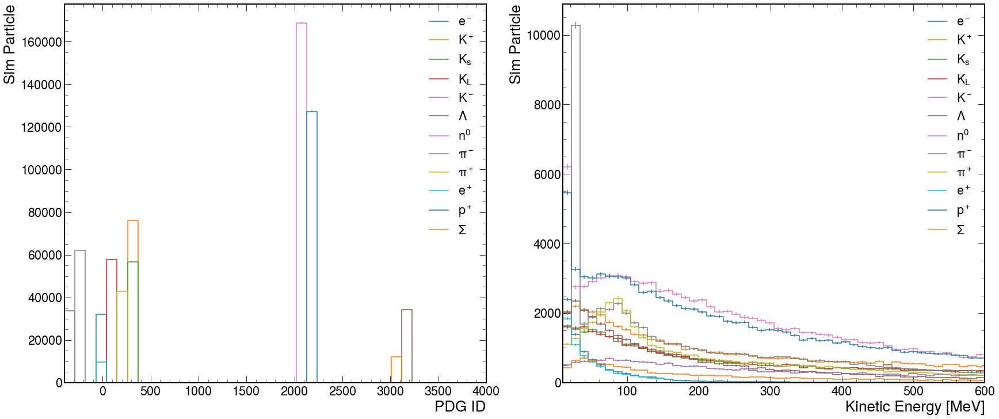

In [8]:
#48 kminus
print(hists["hist_particle_pdgID"])
fig, ax = plt.subplots(1,2, figsize=(24,10), constrained_layout=True)
hist.plot1d(hists["hist_particle_pdgID"],ax=ax[0],clear=False);
leg = ax[0].legend([r'$e^-$', r'$K^+$', r'$K_s$', r'$K_L$', r'$K^-$', r'$\Lambda$',r'$n^0$', r'$\pi^-$', r'$\pi^+$', r'$e^+$', r'$p^+$', r'$\Sigma$' ])


#hist.plot1d(hists["hist_particle_e"],ax=ax[1],clear=False);
#leg = ax[1].legend([r'$K_L$ with $\theta$<40$^\circ$', r'$K_s$ with $\theta$<40$^\circ$'])

hist.plot1d(hists["hist_particle_ke"],ax=ax[1],clear=False);
leg = ax[1].legend([r'$e^-$', r'$K^+$', r'$K_s$', r'$K_L$', r'$K^-$', r'$\Lambda$',r'$n^0$', r'$\pi^-$', r'$\pi^+$', r'$e^+$', r'$p^+$', r'$\Sigma$' ])
